<center><h1>1-cd: Convolutional Neural Networks (ConvNets)</h1></center>

<center><h2><a href="https://rdfia.github.io/">Course link</a></h2></center>

# Warning :
# Do "File -> Save a copy in Drive" before you start modifying the notebook, otherwise your modifications will not be saved.


In [2]:
#!git clone https://github.com/cdancette/deep-learning-polytech-tp6-7.git
! wget https://github.com/rdfia/rdfia.github.io/raw/master/code/2-cd/utils.py

--2024-10-29 15:02:24--  https://github.com/rdfia/rdfia.github.io/raw/master/code/2-cd/utils.py
Resolving github.com (github.com)... 140.82.114.3
Connecting to github.com (github.com)|140.82.114.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/rdfia/rdfia.github.io/master/code/2-cd/utils.py [following]
--2024-10-29 15:02:24--  https://raw.githubusercontent.com/rdfia/rdfia.github.io/master/code/2-cd/utils.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2627 (2.6K) [text/plain]
Saving to: ‘utils.py’

utils.py            100%[===================>]   2.57K  --.-KB/s    in 0s      

2024-10-29 15:02:24 (42.6 MB/s) - ‘utils.py’ saved [2627/2627]



In [3]:
%run 'utils.py'

In [4]:
import argparse
import os
import time

import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim
import torch.utils.data
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import numpy as np


from utils import *

PRINT_INTERVAL = 200
PATH="datasets"

## MNIST Datasets

In [ ]:
class ConvNet(nn.Module):
    """
    This class defines the structure of the neural network
    """

    def __init__(self):
        super(ConvNet, self).__init__()
        # We first define the convolution and pooling layers as a features extractor
        self.features = nn.Sequential(
            nn.Conv2d(1, 6, (5, 5), stride=1, padding=2),
            nn.Tanh(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(6, 16, (5, 5), stride=1, padding=0),
            nn.Tanh(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
        )
        # We then define fully connected layers as a classifier
        self.classifier = nn.Sequential(
            nn.Linear(400, 120),
            nn.Tanh(),
            nn.Linear(120, 84),
            nn.Tanh(),
            nn.Linear(84, 10)
            # Reminder: The softmax is included in the loss, do not put it here
        )

    # Method called when we apply the network to an input batch
    def forward(self, input):
        bsize = input.size(0) # batch size
        output = self.features(input) # output of the conv layers
        output = output.view(bsize, -1) # we flatten the 2D feature maps into one 1D vector for each input
        output = self.classifier(output) # we compute the output of the fc layers
        return output



def get_dataset(batch_size, cuda=False):
    """
    This function loads the dataset and performs transformations on each
    image (listed in `transform = ...`).
    """
    train_dataset = datasets.MNIST(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.ToTensor()
        ]))
    val_dataset = datasets.MNIST(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.ToTensor()
        ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader



def epoch(data, model, criterion, optimizer=None, cuda=False):
    """
    Make a pass (called epoch in English) on the data `data` with the
     model `model`. Evaluates `criterion` as loss.
     If `optimizer` is given, perform a training epoch using
     the given optimizer, otherwise, perform an evaluation epoch (no backward)
     of the model.
    """

    # indicates whether the model is in eval or train mode (some layers behave differently in train and eval)
    model.eval() if optimizer is None else model.train()

    # objects to store metric averages
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # we iterate on the batches
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # only with GPU, and not with CPU
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward if we are training
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # compute metrics
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # update
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # print info
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Print summary
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss


def main(batch_size=128, lr=0.1, epochs=5, cuda=False):

    # ex :
    #   {"batch_size": 128, "epochs": 5, "lr": 0.1}

    # define model, loss, optim
    model = ConvNet()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr)

    if cuda: # only with GPU, and not with CPU
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # Get the data
    train, test = get_dataset(batch_size, cuda)

    # init plots
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # We iterate on the epochs
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
        # Train phase
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        # Test phase
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
        # plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)


Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 9.91M/9.91M [00:00<00:00, 11.6MB/s]


Extracting datasets/MNIST/raw/train-images-idx3-ubyte.gz to datasets/MNIST/raw

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 28.9k/28.9k [00:00<00:00, 344kB/s]


Extracting datasets/MNIST/raw/train-labels-idx1-ubyte.gz to datasets/MNIST/raw

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 1.65M/1.65M [00:02<00:00, 667kB/s]


Extracting datasets/MNIST/raw/t10k-images-idx3-ubyte.gz to datasets/MNIST/raw

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 4.54k/4.54k [00:00<00:00, 4.17MB/s]

Extracting datasets/MNIST/raw/t10k-labels-idx1-ubyte.gz to datasets/MNIST/raw

=== EPOCH 1 =====



[TRAIN Batch 000/469]	Time 1.855s (1.855s)	Loss 2.3132 (2.3132)	Prec@1  10.2 ( 10.2)	Prec@5  39.8 ( 39.8)


<Figure size 640x480 with 0 Axes>

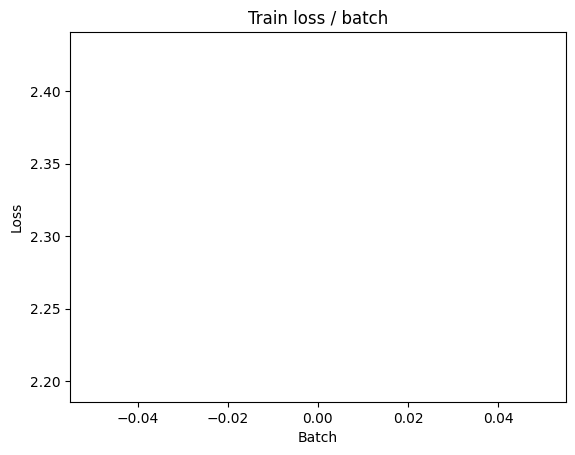

[TRAIN Batch 200/469]	Time 0.024s (0.025s)	Loss 0.2622 (1.0832)	Prec@1  93.8 ( 70.2)	Prec@5 100.0 ( 92.3)


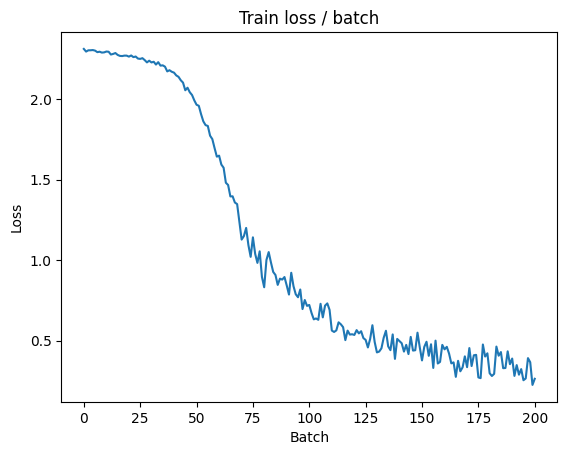

[TRAIN Batch 400/469]	Time 0.011s (0.023s)	Loss 0.3089 (0.6665)	Prec@1  91.4 ( 81.5)	Prec@5 100.0 ( 96.0)


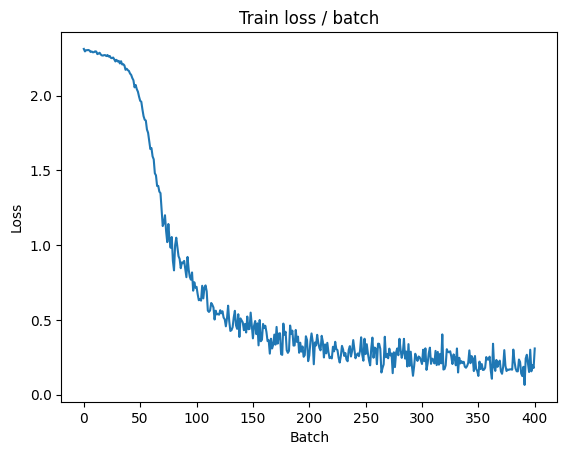


===============> Total time 10s	Avg loss 0.5955	Avg Prec@1 83.45 %	Avg Prec@5 96.52 %

[EVAL Batch 000/079]	Time 0.122s (0.122s)	Loss 0.0947 (0.0947)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 1s	Avg loss 0.1504	Avg Prec@1 95.59 %	Avg Prec@5 99.93 %



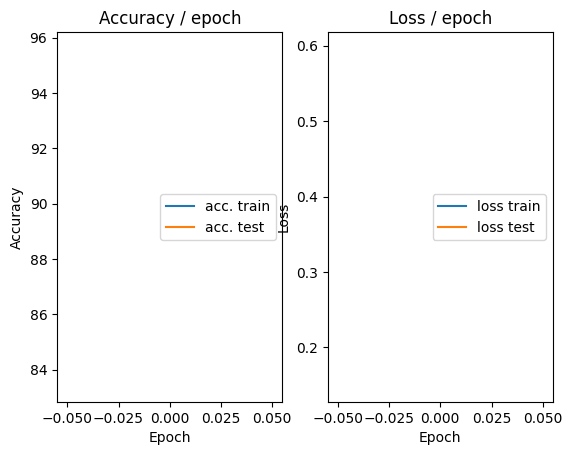

=== EPOCH 2 =====

[TRAIN Batch 000/469]	Time 0.107s (0.107s)	Loss 0.1758 (0.1758)	Prec@1  95.3 ( 95.3)	Prec@5 100.0 (100.0)


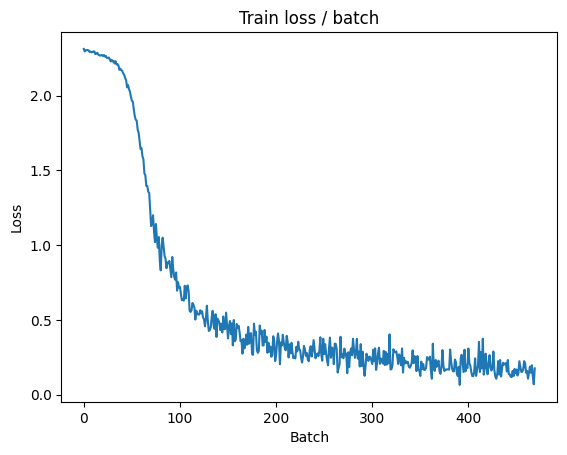

[TRAIN Batch 200/469]	Time 0.018s (0.017s)	Loss 0.1122 (0.1407)	Prec@1  96.9 ( 96.0)	Prec@5 100.0 ( 99.9)


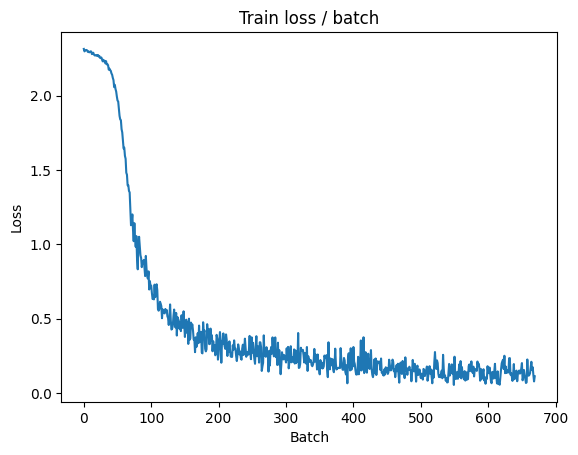

[TRAIN Batch 400/469]	Time 0.018s (0.017s)	Loss 0.1719 (0.1286)	Prec@1  93.0 ( 96.3)	Prec@5 100.0 ( 99.9)


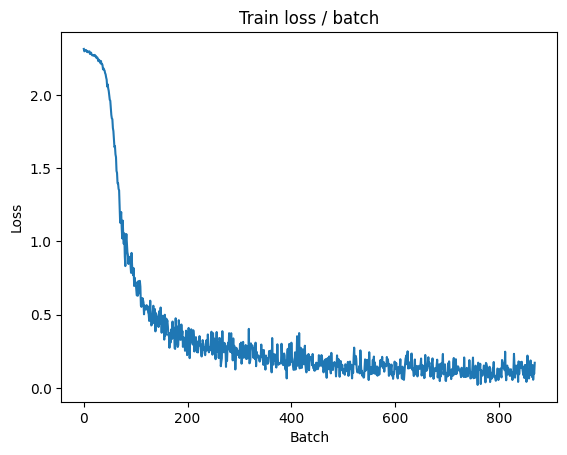


===============> Total time 8s	Avg loss 0.1250	Avg Prec@1 96.35 %	Avg Prec@5 99.89 %

[EVAL Batch 000/079]	Time 0.153s (0.153s)	Loss 0.0452 (0.0452)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)

===============> Total time 1s	Avg loss 0.0838	Avg Prec@1 97.39 %	Avg Prec@5 99.98 %



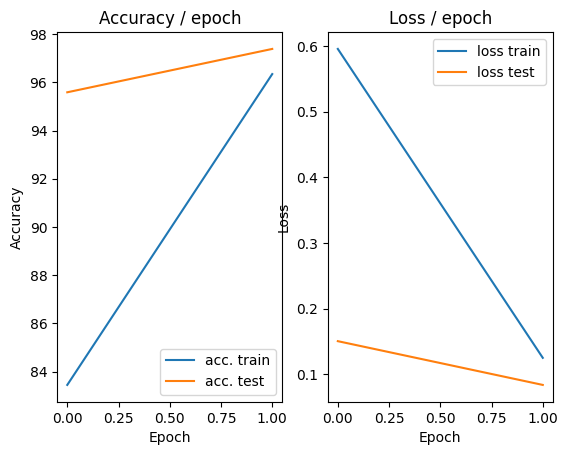

=== EPOCH 3 =====

[TRAIN Batch 000/469]	Time 0.196s (0.196s)	Loss 0.0521 (0.0521)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)


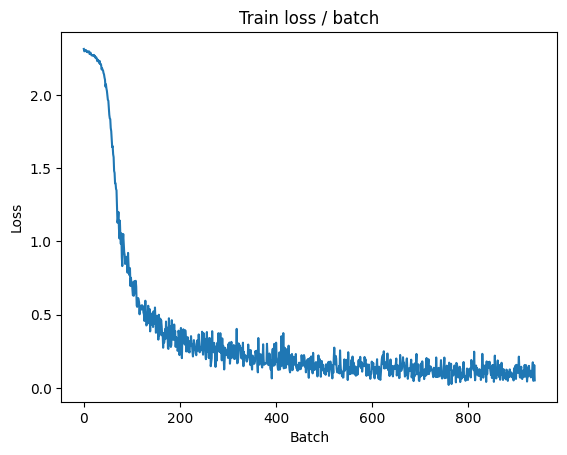

[TRAIN Batch 200/469]	Time 0.004s (0.020s)	Loss 0.0971 (0.0906)	Prec@1  98.4 ( 97.4)	Prec@5 100.0 ( 99.9)


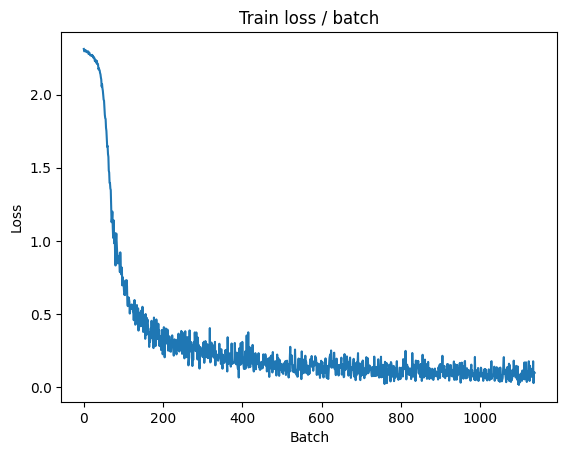

[TRAIN Batch 400/469]	Time 0.028s (0.019s)	Loss 0.0677 (0.0856)	Prec@1  97.7 ( 97.5)	Prec@5 100.0 ( 99.9)


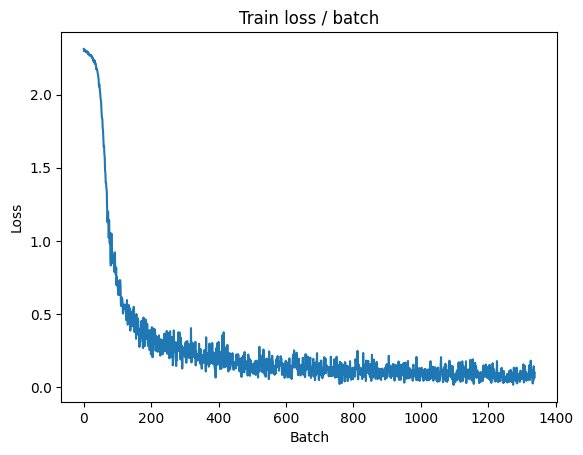


===============> Total time 8s	Avg loss 0.0849	Avg Prec@1 97.54 %	Avg Prec@5 99.93 %

[EVAL Batch 000/079]	Time 0.099s (0.099s)	Loss 0.0225 (0.0225)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)

===============> Total time 1s	Avg loss 0.0626	Avg Prec@1 97.89 %	Avg Prec@5 100.00 %



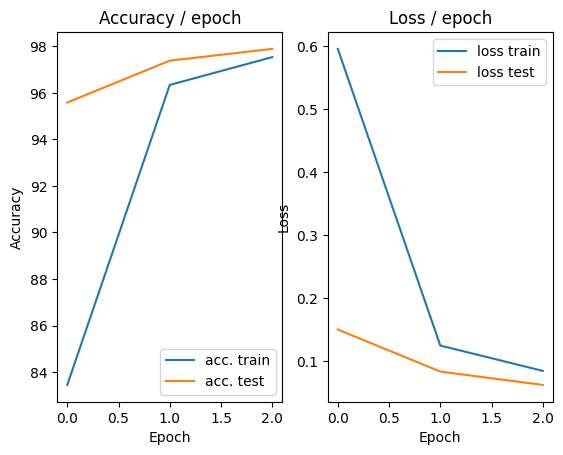

=== EPOCH 4 =====

[TRAIN Batch 000/469]	Time 0.192s (0.192s)	Loss 0.0642 (0.0642)	Prec@1  96.9 ( 96.9)	Prec@5 100.0 (100.0)


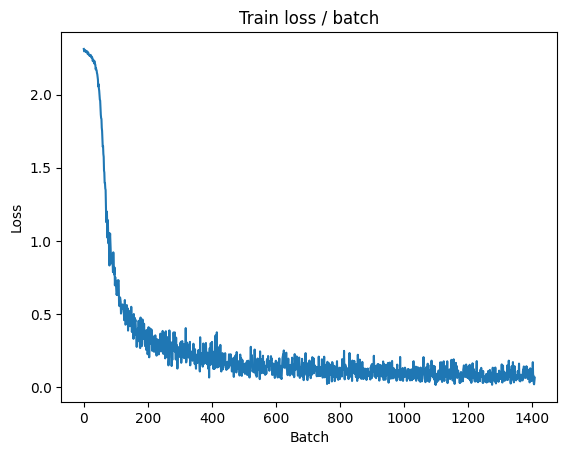

[TRAIN Batch 200/469]	Time 0.027s (0.017s)	Loss 0.0647 (0.0704)	Prec@1  99.2 ( 97.9)	Prec@5 100.0 (100.0)


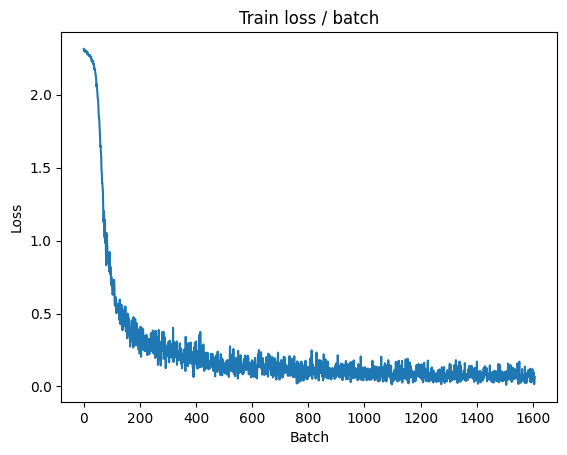

[TRAIN Batch 400/469]	Time 0.016s (0.017s)	Loss 0.0472 (0.0690)	Prec@1  98.4 ( 97.9)	Prec@5 100.0 (100.0)


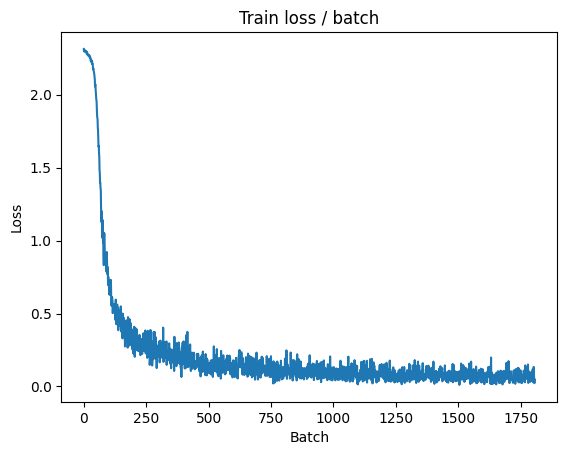


===============> Total time 7s	Avg loss 0.0680	Avg Prec@1 97.96 %	Avg Prec@5 99.96 %

[EVAL Batch 000/079]	Time 0.100s (0.100s)	Loss 0.0169 (0.0169)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)

===============> Total time 1s	Avg loss 0.0525	Avg Prec@1 98.37 %	Avg Prec@5 100.00 %



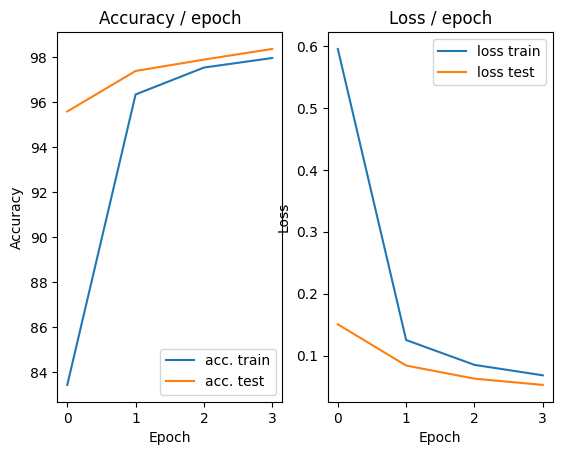

=== EPOCH 5 =====

[TRAIN Batch 000/469]	Time 0.118s (0.118s)	Loss 0.0180 (0.0180)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


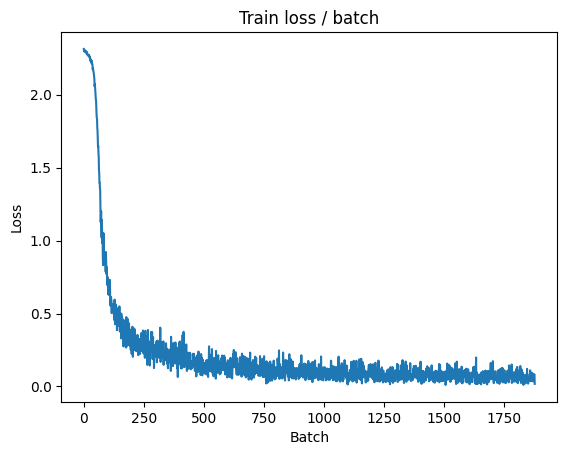

[TRAIN Batch 200/469]	Time 0.026s (0.022s)	Loss 0.1354 (0.0572)	Prec@1  96.1 ( 98.4)	Prec@5  99.2 (100.0)


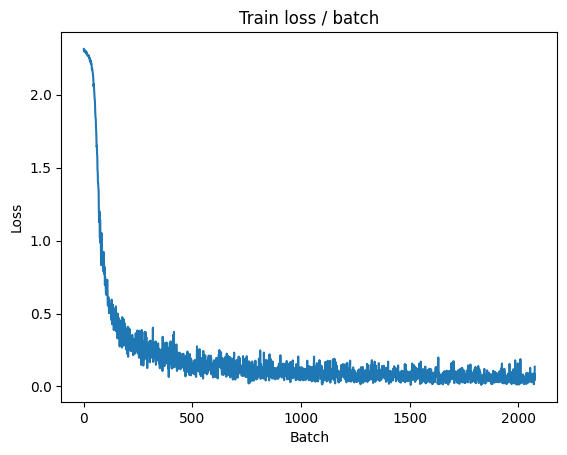

[TRAIN Batch 400/469]	Time 0.031s (0.019s)	Loss 0.0404 (0.0571)	Prec@1  98.4 ( 98.3)	Prec@5 100.0 (100.0)


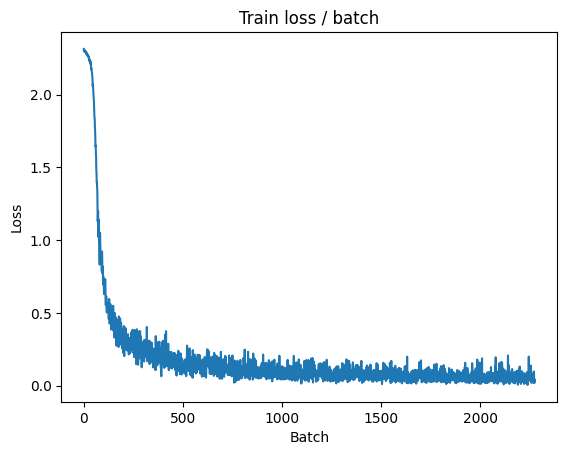


===============> Total time 8s	Avg loss 0.0573	Avg Prec@1 98.27 %	Avg Prec@5 99.97 %

[EVAL Batch 000/079]	Time 0.111s (0.111s)	Loss 0.0123 (0.0123)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)

===============> Total time 1s	Avg loss 0.0454	Avg Prec@1 98.59 %	Avg Prec@5 100.00 %



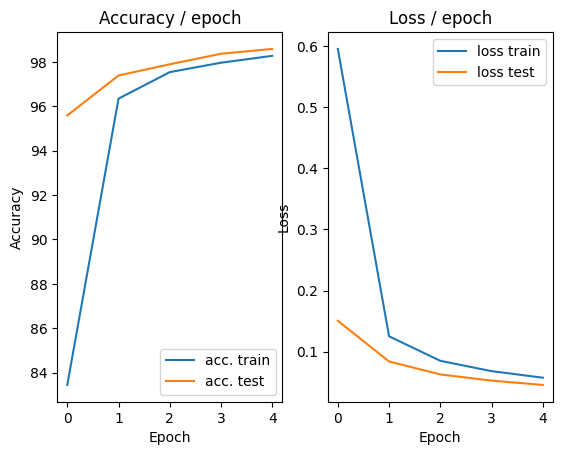

In [ ]:
main(128, 0.1, cuda=True)

## Network Learning

# CIFAR-10 dataset

In [ ]:
class ConvNet(nn.Module):
    """
    This class defines the structure of the neural network
    """

    def __init__(self):
        super(ConvNet, self).__init__()
        # We first define the convolution and pooling layers as a features extractor
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),

            nn.Conv2d(32, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2,2), stride = 2, padding=0),

            nn.Conv2d(64, 128, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
        )
        # We then define fully connected layers as a classifier
        self.classifier = nn.Sequential(
            nn.Linear(128*4*4, 1000),
            nn.ReLU(),
            nn.Linear(1000, 10)
            # Reminder: The softmax is included in the loss, do not put it here
        )

    # Method called when we apply the network to an input batch
    def forward(self, input):
        bsize = input.size(0) # batch size
        output = self.features(input) # output of the conv layers
        output = output.view(bsize, -1) # we flatten the 2D feature maps into one 1D vector for each input
        output = self.classifier(output) # we compute the output of the fc layers
        return output



def get_dataset(batch_size, cuda=False):
    """
    This function loads the dataset and performs transformations on each
    image (listed in `transform = ...`).
    """
    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.ToTensor()
        ]))
    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.ToTensor()
        ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader




def epoch(data, model, criterion, optimizer=None, cuda=False):
    """
    Make a pass (called epoch in English) on the data `data` with the
     model `model`. Evaluates `criterion` as loss.
     If `optimizer` is given, perform a training epoch using
     the given optimizer, otherwise, perform an evaluation epoch (no backward)
     of the model.
    """

    # indicates whether the model is in eval or train mode (some layers behave differently in train and eval)
    model.eval() if optimizer is None else model.train()

    # objects to store metric averages
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # we iterate on the batches
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # only with GPU, and not with CPU
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward if we are training
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # compute metrics
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # update
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # print info
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Print summary
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss


def main(batch_size=128, lr=0.1, epochs=15, cuda=False):

    # ex :
    #   {"batch_size": 128, "epochs": 5, "lr": 0.1}

    # define model, loss, optim
    model = ConvNet()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr)

    if cuda: # only with GPU, and not with CPU
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # Get the data
    train, test = get_dataset(batch_size, cuda)

    # init plots
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # We iterate on the epochs
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
        # Train phase
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        # Test phase
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
        # plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)

100%|██████████| 170M/170M [00:05<00:00, 29.4MB/s]


Extracting datasets/cifar-10-python.tar.gz to datasets
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.653s (0.653s)	Loss 2.3018 (2.3018)	Prec@1   8.6 (  8.6)	Prec@5  55.5 ( 55.5)


<Figure size 640x480 with 0 Axes>

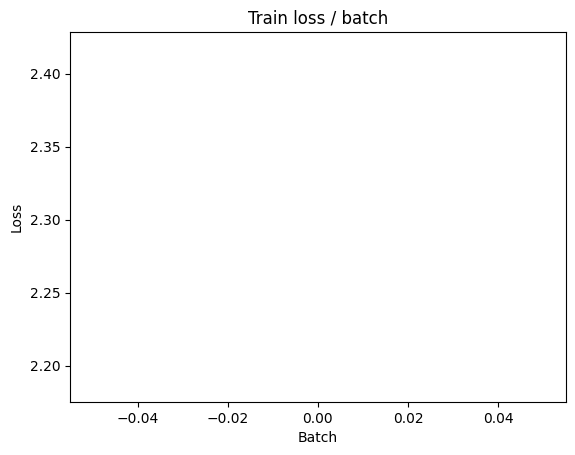

[TRAIN Batch 200/391]	Time 0.011s (0.026s)	Loss 2.0643 (2.2240)	Prec@1  25.0 ( 16.9)	Prec@5  75.8 ( 63.0)


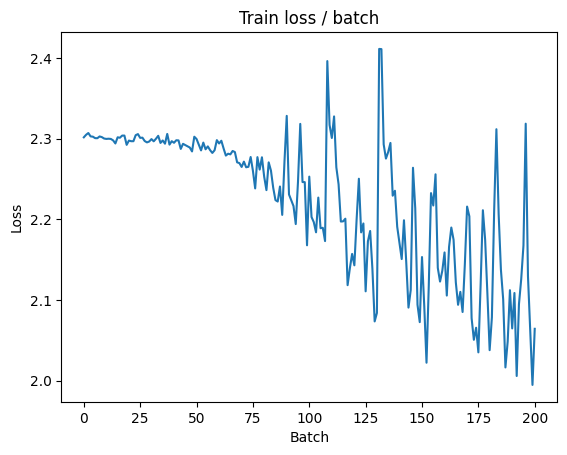


===============> Total time 9s	Avg loss 2.1070	Avg Prec@1 22.44 %	Avg Prec@5 70.97 %

[EVAL Batch 000/079]	Time 0.117s (0.117s)	Loss 2.0533 (2.0533)	Prec@1  32.0 ( 32.0)	Prec@5  81.2 ( 81.2)

===============> Total time 1s	Avg loss 2.0546	Avg Prec@1 28.37 %	Avg Prec@5 78.85 %



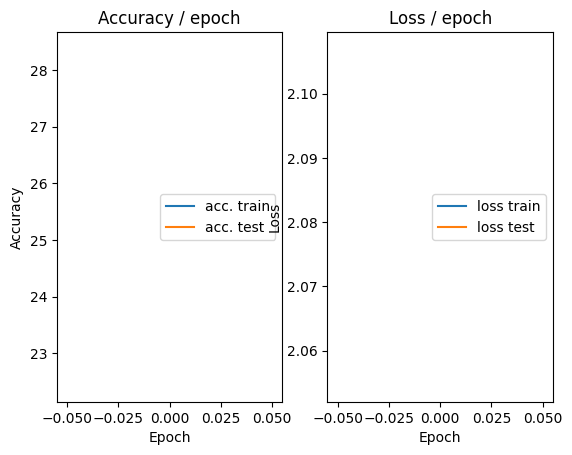

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.127s (0.127s)	Loss 2.0311 (2.0311)	Prec@1  28.9 ( 28.9)	Prec@5  80.5 ( 80.5)


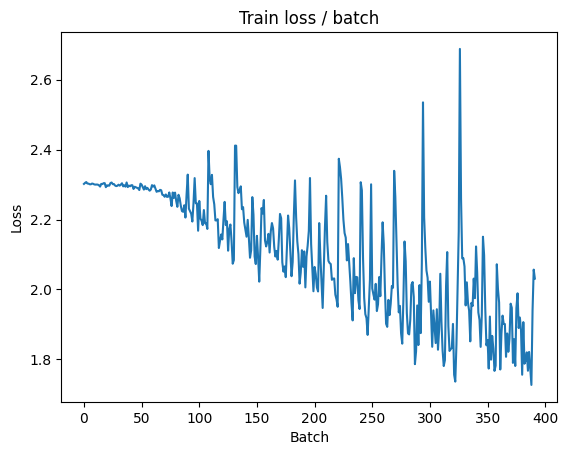

[TRAIN Batch 200/391]	Time 0.024s (0.022s)	Loss 1.6193 (1.7508)	Prec@1  42.2 ( 37.2)	Prec@5  87.5 ( 86.6)


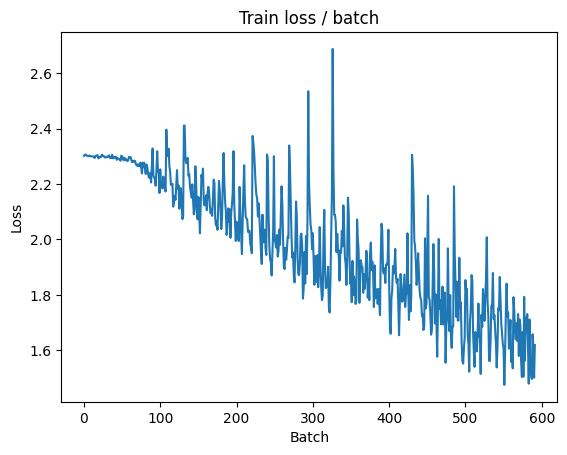


===============> Total time 9s	Avg loss 1.6651	Avg Prec@1 40.07 %	Avg Prec@5 88.40 %

[EVAL Batch 000/079]	Time 0.119s (0.119s)	Loss 1.4702 (1.4702)	Prec@1  45.3 ( 45.3)	Prec@5  89.1 ( 89.1)

===============> Total time 1s	Avg loss 1.5124	Avg Prec@1 46.36 %	Avg Prec@5 91.10 %



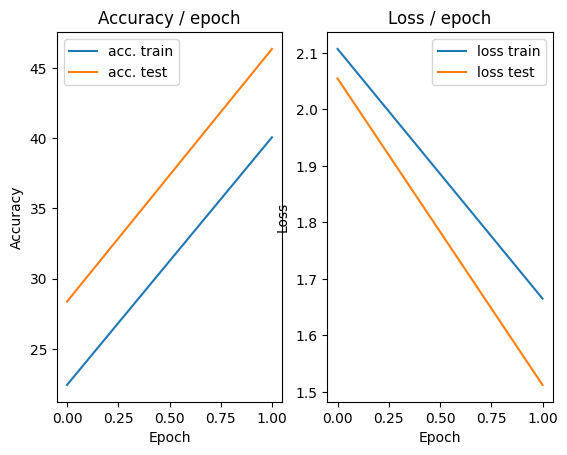

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.140s (0.140s)	Loss 1.4821 (1.4821)	Prec@1  42.2 ( 42.2)	Prec@5  92.2 ( 92.2)


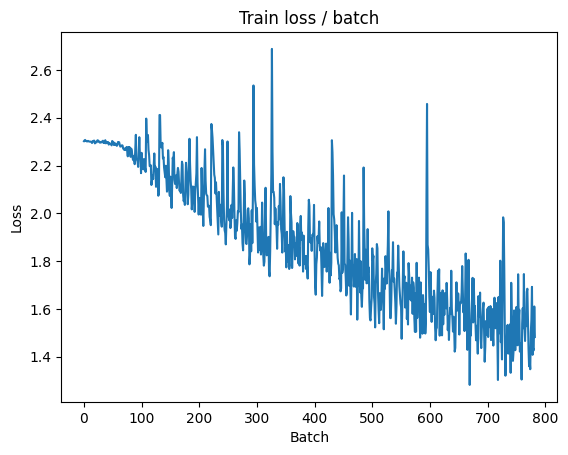

[TRAIN Batch 200/391]	Time 0.012s (0.022s)	Loss 1.3165 (1.4440)	Prec@1  49.2 ( 48.4)	Prec@5  96.1 ( 92.4)


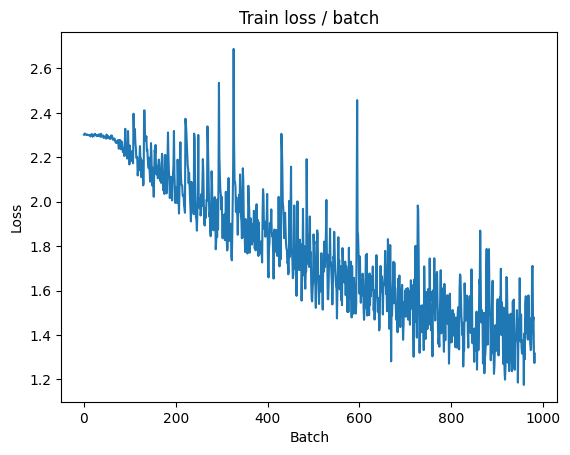


===============> Total time 9s	Avg loss 1.4047	Avg Prec@1 49.78 %	Avg Prec@5 92.81 %

[EVAL Batch 000/079]	Time 0.130s (0.130s)	Loss 1.2330 (1.2330)	Prec@1  57.0 ( 57.0)	Prec@5  96.9 ( 96.9)

===============> Total time 1s	Avg loss 1.3478	Avg Prec@1 51.12 %	Avg Prec@5 93.76 %



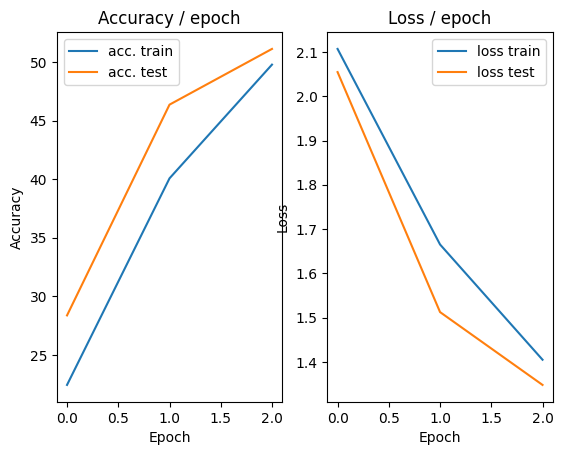

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.137s (0.137s)	Loss 1.2120 (1.2120)	Prec@1  54.7 ( 54.7)	Prec@5  94.5 ( 94.5)


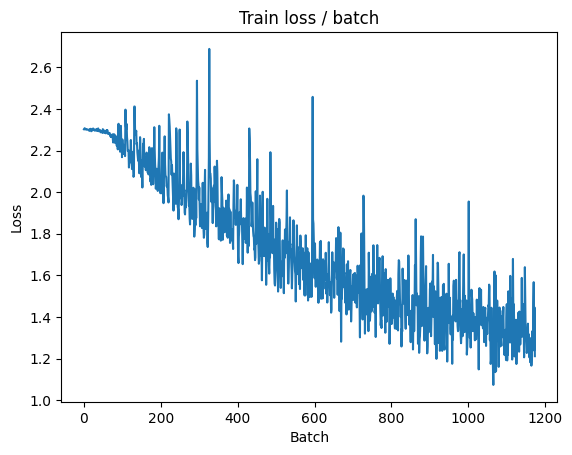

[TRAIN Batch 200/391]	Time 0.030s (0.022s)	Loss 1.2844 (1.2636)	Prec@1  53.1 ( 55.0)	Prec@5  94.5 ( 94.6)


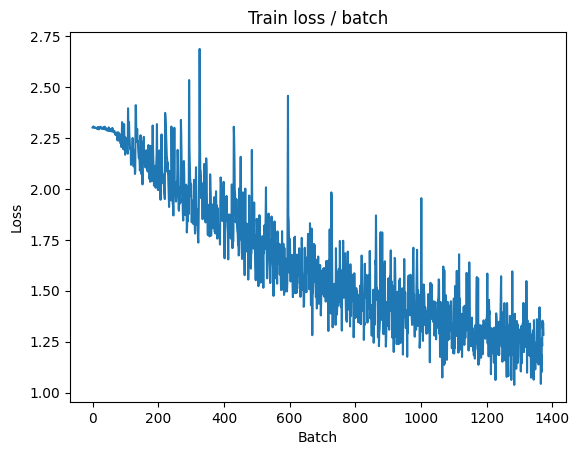


===============> Total time 9s	Avg loss 1.2359	Avg Prec@1 55.99 %	Avg Prec@5 94.72 %

[EVAL Batch 000/079]	Time 0.191s (0.191s)	Loss 1.0891 (1.0891)	Prec@1  66.4 ( 66.4)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 1.1809	Avg Prec@1 58.15 %	Avg Prec@5 95.45 %



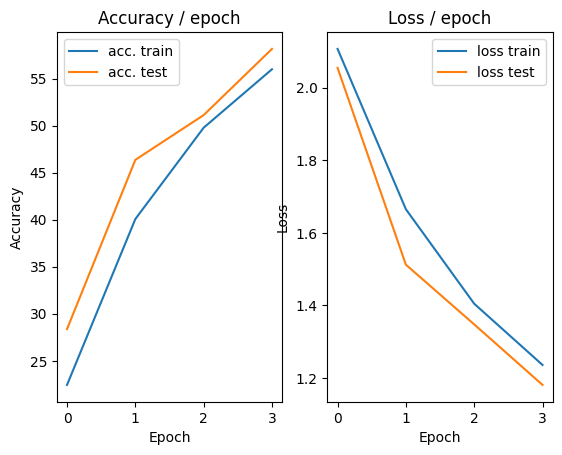

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.126s (0.126s)	Loss 1.0849 (1.0849)	Prec@1  63.3 ( 63.3)	Prec@5  95.3 ( 95.3)


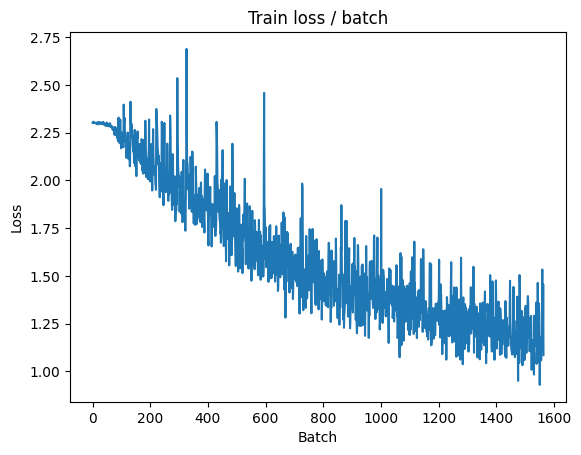

[TRAIN Batch 200/391]	Time 0.020s (0.022s)	Loss 1.1987 (1.1161)	Prec@1  51.6 ( 60.2)	Prec@5  97.7 ( 96.0)


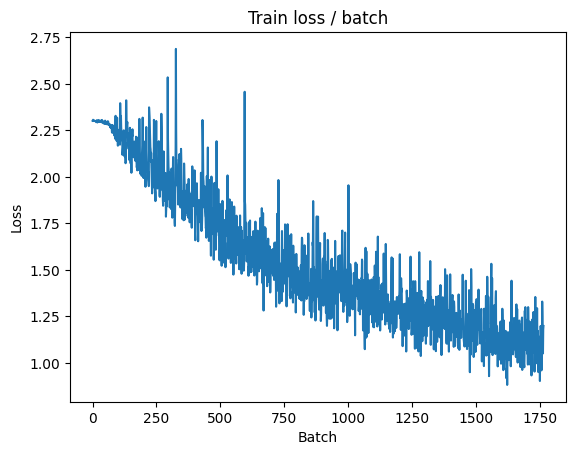


===============> Total time 8s	Avg loss 1.0912	Avg Prec@1 61.37 %	Avg Prec@5 96.07 %

[EVAL Batch 000/079]	Time 0.108s (0.108s)	Loss 1.0510 (1.0510)	Prec@1  61.7 ( 61.7)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 1.1362	Avg Prec@1 59.90 %	Avg Prec@5 96.04 %



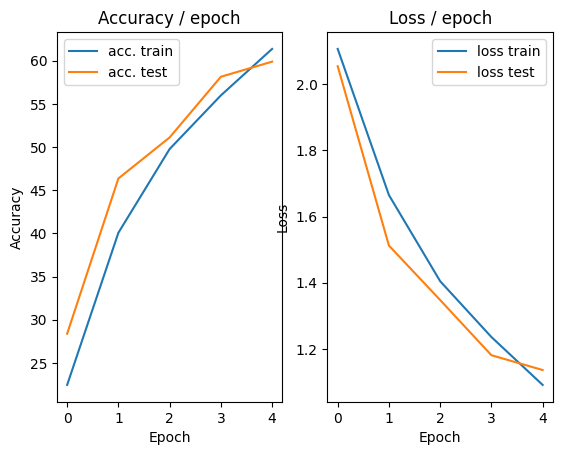

=== EPOCH 6 =====

[TRAIN Batch 000/391]	Time 0.205s (0.205s)	Loss 0.9916 (0.9916)	Prec@1  66.4 ( 66.4)	Prec@5  99.2 ( 99.2)


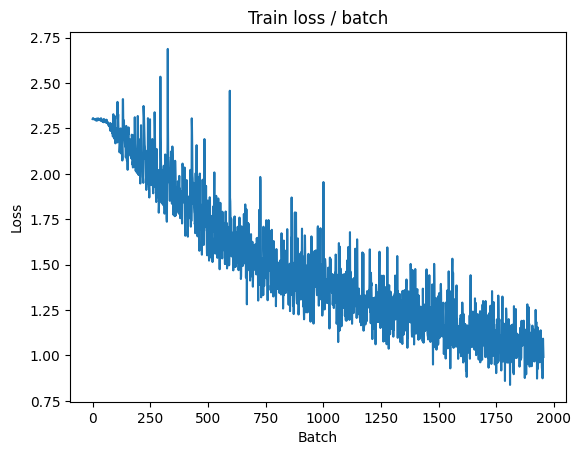

[TRAIN Batch 200/391]	Time 0.032s (0.023s)	Loss 1.0002 (0.9725)	Prec@1  69.5 ( 65.9)	Prec@5  95.3 ( 97.2)


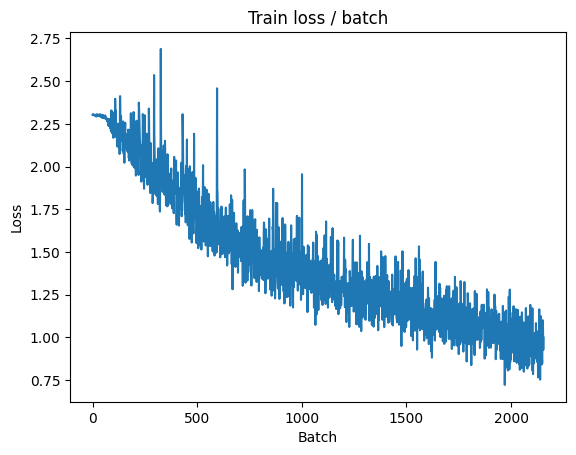


===============> Total time 8s	Avg loss 0.9603	Avg Prec@1 66.29 %	Avg Prec@5 97.14 %

[EVAL Batch 000/079]	Time 0.125s (0.125s)	Loss 0.9369 (0.9369)	Prec@1  67.2 ( 67.2)	Prec@5  96.9 ( 96.9)

===============> Total time 1s	Avg loss 1.0868	Avg Prec@1 62.64 %	Avg Prec@5 96.27 %



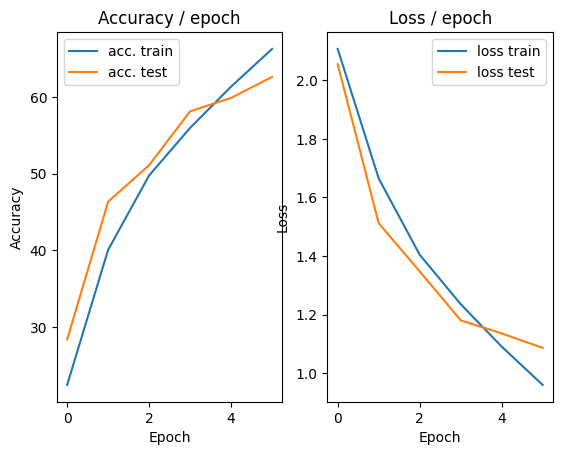

=== EPOCH 7 =====

[TRAIN Batch 000/391]	Time 0.189s (0.189s)	Loss 0.9332 (0.9332)	Prec@1  65.6 ( 65.6)	Prec@5  96.9 ( 96.9)


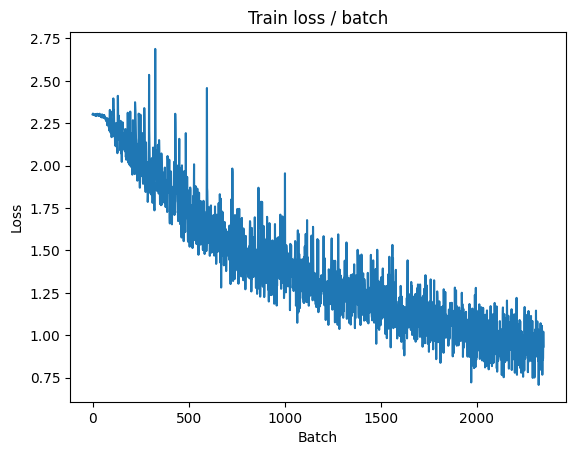

[TRAIN Batch 200/391]	Time 0.012s (0.027s)	Loss 1.0497 (0.8459)	Prec@1  64.8 ( 70.1)	Prec@5  95.3 ( 98.0)


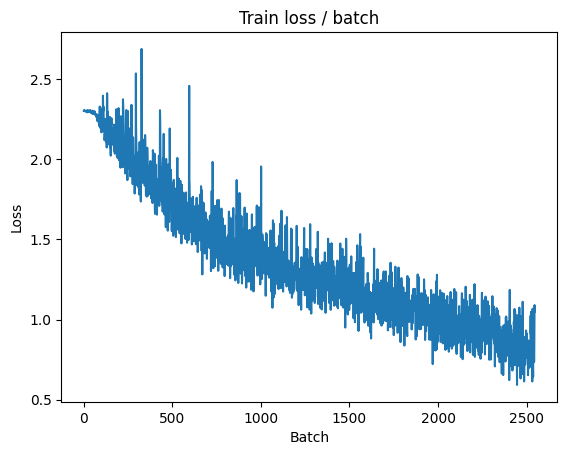


===============> Total time 9s	Avg loss 0.8400	Avg Prec@1 70.57 %	Avg Prec@5 97.89 %

[EVAL Batch 000/079]	Time 0.122s (0.122s)	Loss 0.8645 (0.8645)	Prec@1  71.1 ( 71.1)	Prec@5  99.2 ( 99.2)

===============> Total time 1s	Avg loss 0.9737	Avg Prec@1 66.26 %	Avg Prec@5 96.98 %



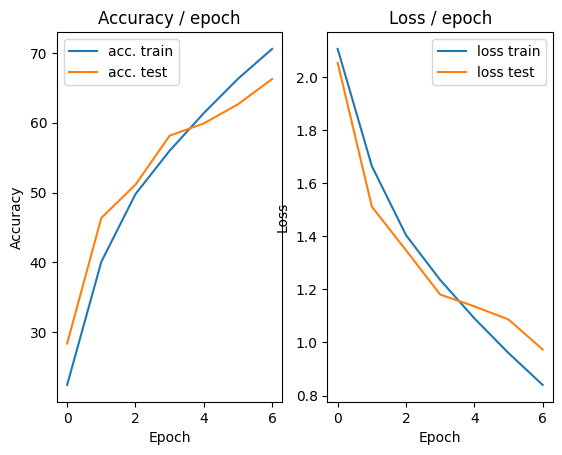

=== EPOCH 8 =====

[TRAIN Batch 000/391]	Time 0.139s (0.139s)	Loss 0.8558 (0.8558)	Prec@1  70.3 ( 70.3)	Prec@5  97.7 ( 97.7)


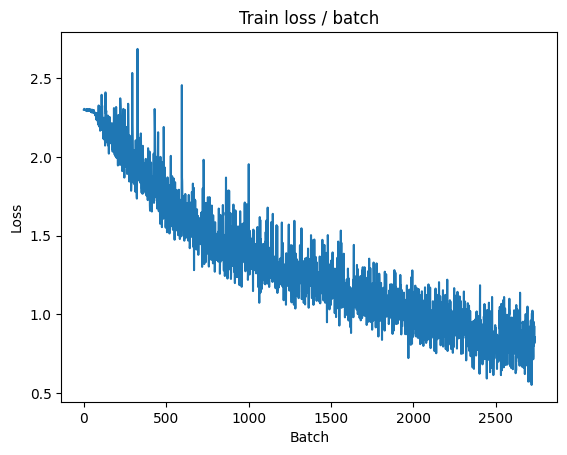

[TRAIN Batch 200/391]	Time 0.020s (0.027s)	Loss 0.8912 (0.7291)	Prec@1  73.4 ( 74.5)	Prec@5  96.9 ( 98.4)


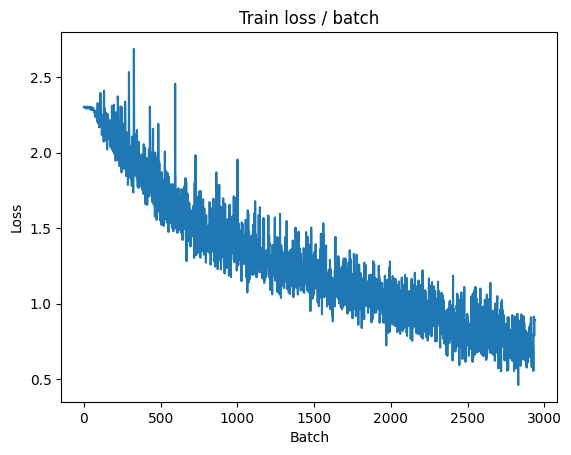


===============> Total time 9s	Avg loss 0.7239	Avg Prec@1 74.65 %	Avg Prec@5 98.53 %

[EVAL Batch 000/079]	Time 0.134s (0.134s)	Loss 0.7692 (0.7692)	Prec@1  75.0 ( 75.0)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 0.9531	Avg Prec@1 66.75 %	Avg Prec@5 97.18 %



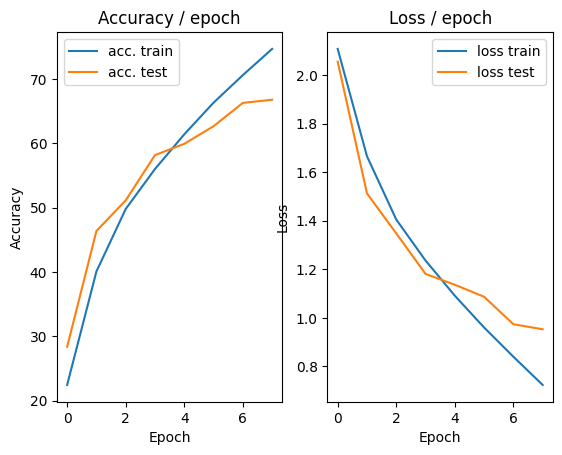

=== EPOCH 9 =====

[TRAIN Batch 000/391]	Time 0.147s (0.147s)	Loss 0.6983 (0.6983)	Prec@1  76.6 ( 76.6)	Prec@5  97.7 ( 97.7)


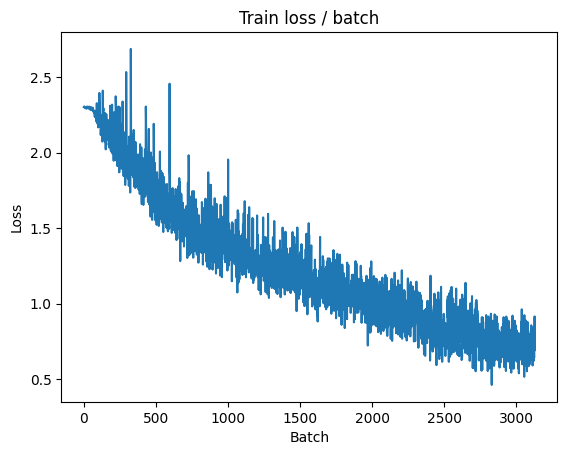

[TRAIN Batch 200/391]	Time 0.026s (0.027s)	Loss 0.7417 (0.6196)	Prec@1  73.4 ( 78.3)	Prec@5  96.9 ( 99.1)


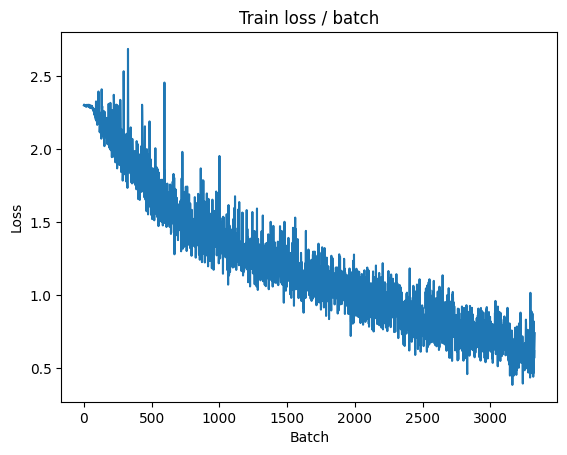


===============> Total time 9s	Avg loss 0.6121	Avg Prec@1 78.52 %	Avg Prec@5 99.06 %

[EVAL Batch 000/079]	Time 0.124s (0.124s)	Loss 1.0411 (1.0411)	Prec@1  60.9 ( 60.9)	Prec@5  93.8 ( 93.8)

===============> Total time 1s	Avg loss 1.0710	Avg Prec@1 63.40 %	Avg Prec@5 96.56 %



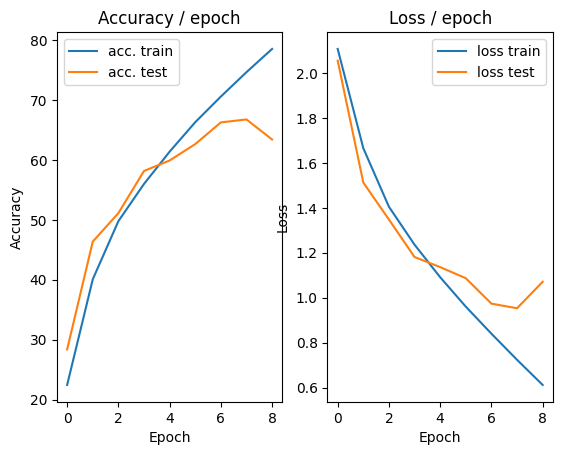

=== EPOCH 10 =====

[TRAIN Batch 000/391]	Time 0.146s (0.146s)	Loss 0.6303 (0.6303)	Prec@1  73.4 ( 73.4)	Prec@5 100.0 (100.0)


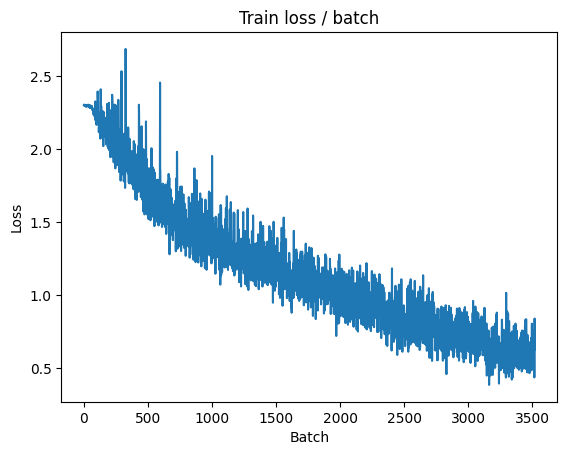

[TRAIN Batch 200/391]	Time 0.053s (0.024s)	Loss 0.3428 (0.5066)	Prec@1  88.3 ( 82.3)	Prec@5 100.0 ( 99.4)


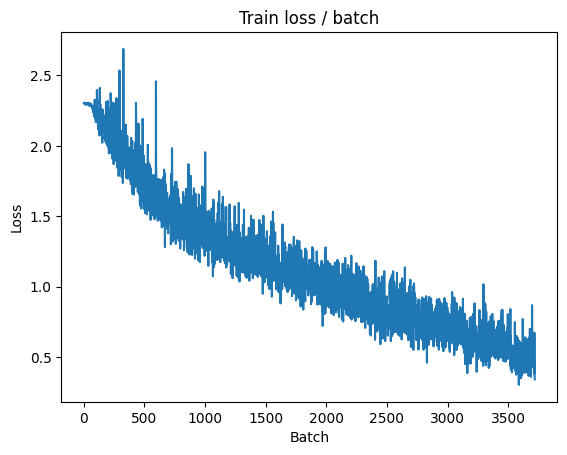


===============> Total time 9s	Avg loss 0.5177	Avg Prec@1 81.83 %	Avg Prec@5 99.38 %

[EVAL Batch 000/079]	Time 0.139s (0.139s)	Loss 0.8870 (0.8870)	Prec@1  71.1 ( 71.1)	Prec@5  96.9 ( 96.9)

===============> Total time 1s	Avg loss 0.9226	Avg Prec@1 69.81 %	Avg Prec@5 97.27 %



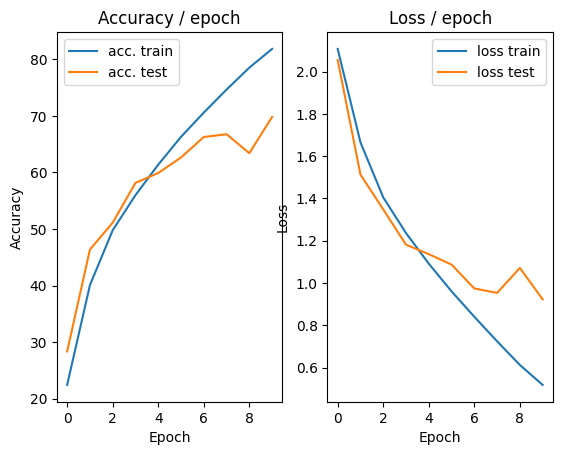

=== EPOCH 11 =====

[TRAIN Batch 000/391]	Time 0.155s (0.155s)	Loss 0.4216 (0.4216)	Prec@1  85.2 ( 85.2)	Prec@5 100.0 (100.0)


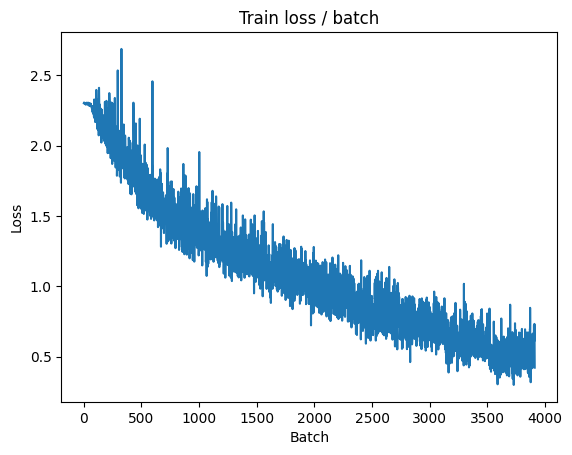

[TRAIN Batch 200/391]	Time 0.027s (0.022s)	Loss 0.4684 (0.3914)	Prec@1  82.0 ( 86.4)	Prec@5  98.4 ( 99.7)


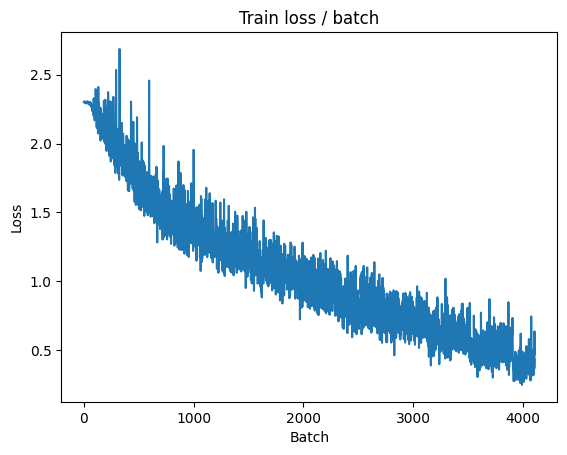


===============> Total time 9s	Avg loss 0.4051	Avg Prec@1 85.94 %	Avg Prec@5 99.64 %

[EVAL Batch 000/079]	Time 0.124s (0.124s)	Loss 0.8537 (0.8537)	Prec@1  74.2 ( 74.2)	Prec@5  96.1 ( 96.1)

===============> Total time 1s	Avg loss 0.9249	Avg Prec@1 71.44 %	Avg Prec@5 97.78 %



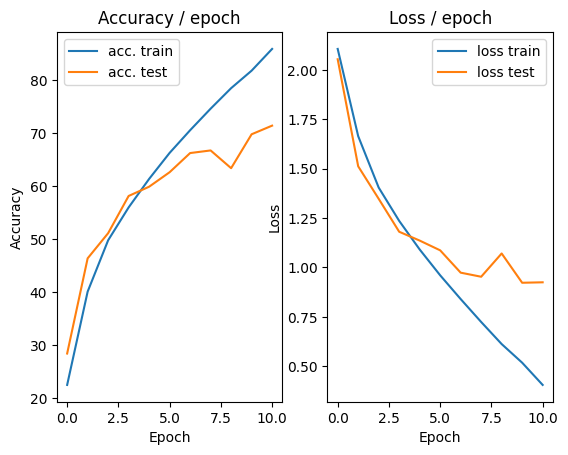

=== EPOCH 12 =====

[TRAIN Batch 000/391]	Time 0.250s (0.250s)	Loss 0.2705 (0.2705)	Prec@1  90.6 ( 90.6)	Prec@5 100.0 (100.0)


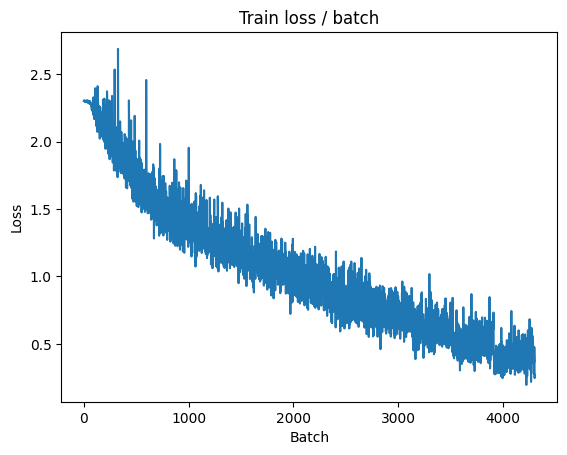

[TRAIN Batch 200/391]	Time 0.021s (0.026s)	Loss 0.3562 (0.2874)	Prec@1  85.9 ( 90.2)	Prec@5 100.0 ( 99.9)


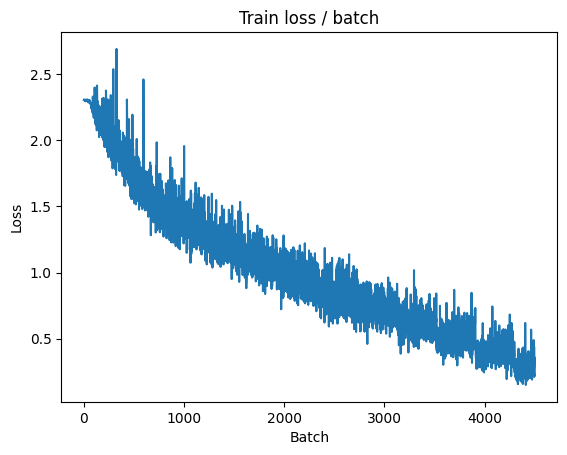


===============> Total time 10s	Avg loss 0.3028	Avg Prec@1 89.45 %	Avg Prec@5 99.85 %

[EVAL Batch 000/079]	Time 0.132s (0.132s)	Loss 0.9906 (0.9906)	Prec@1  71.1 ( 71.1)	Prec@5  96.1 ( 96.1)

===============> Total time 1s	Avg loss 1.0648	Avg Prec@1 69.29 %	Avg Prec@5 97.28 %



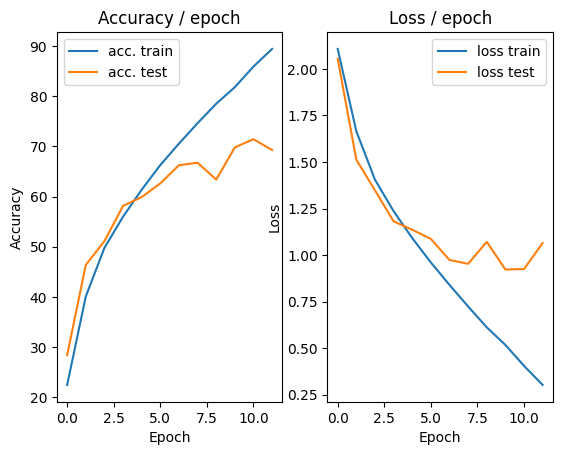

=== EPOCH 13 =====

[TRAIN Batch 000/391]	Time 0.144s (0.144s)	Loss 0.1686 (0.1686)	Prec@1  93.0 ( 93.0)	Prec@5 100.0 (100.0)


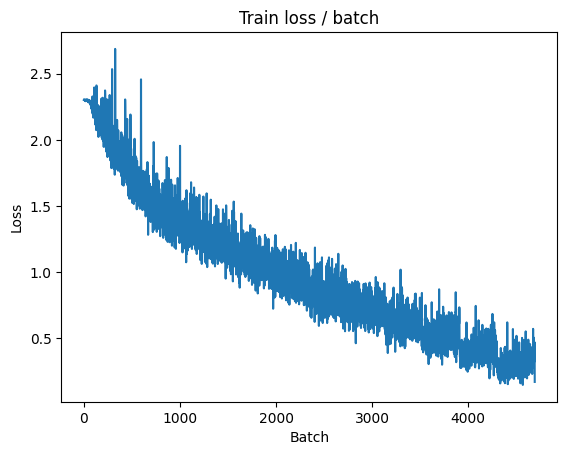

[TRAIN Batch 200/391]	Time 0.020s (0.022s)	Loss 0.2037 (0.2064)	Prec@1  93.0 ( 93.0)	Prec@5 100.0 ( 99.9)


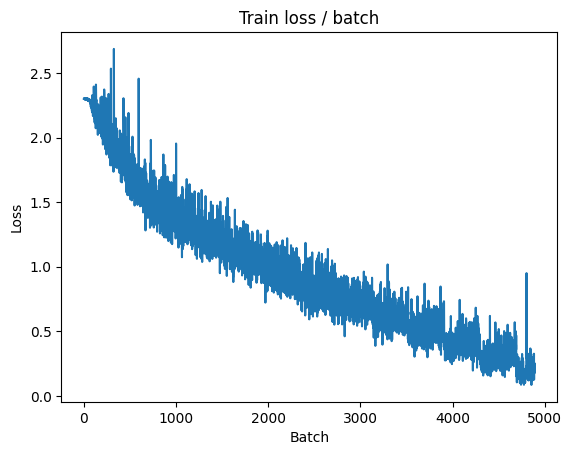


===============> Total time 9s	Avg loss 0.2214	Avg Prec@1 92.43 %	Avg Prec@5 99.93 %

[EVAL Batch 000/079]	Time 0.122s (0.122s)	Loss 1.0240 (1.0240)	Prec@1  74.2 ( 74.2)	Prec@5  96.9 ( 96.9)

===============> Total time 1s	Avg loss 1.1230	Avg Prec@1 70.45 %	Avg Prec@5 97.39 %



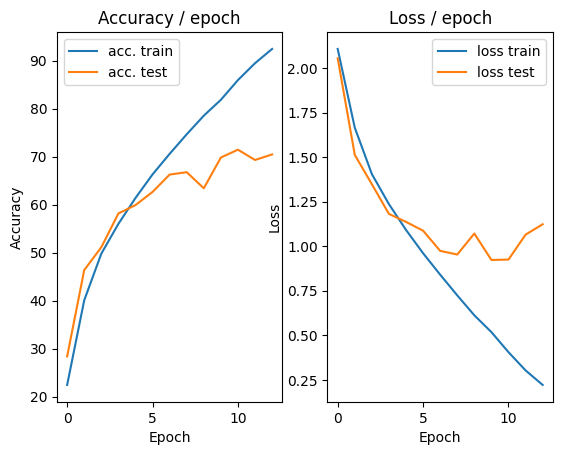

=== EPOCH 14 =====

[TRAIN Batch 000/391]	Time 0.147s (0.147s)	Loss 0.1181 (0.1181)	Prec@1  94.5 ( 94.5)	Prec@5 100.0 (100.0)


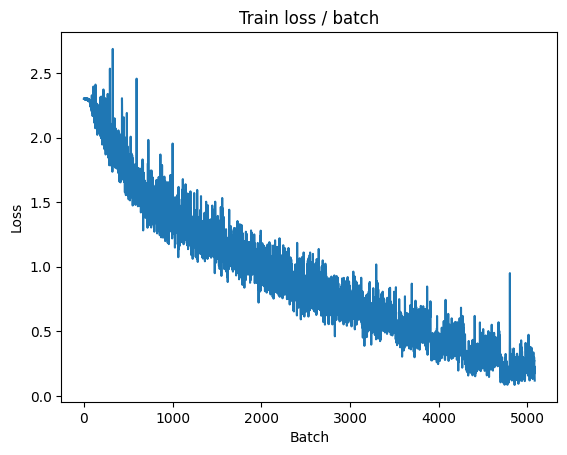

[TRAIN Batch 200/391]	Time 0.030s (0.022s)	Loss 0.2466 (0.1334)	Prec@1  88.3 ( 95.8)	Prec@5 100.0 (100.0)


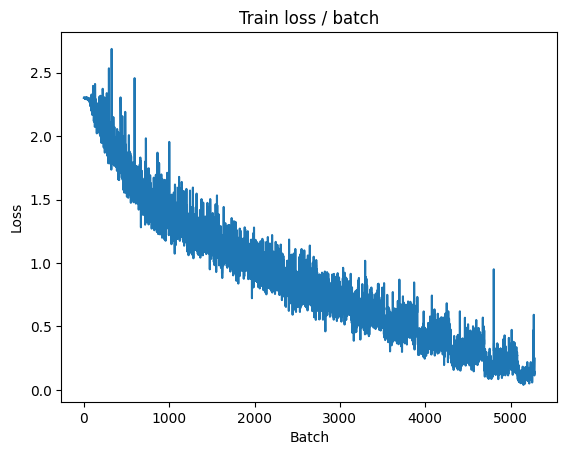


===============> Total time 8s	Avg loss 0.1485	Avg Prec@1 95.14 %	Avg Prec@5 99.97 %

[EVAL Batch 000/079]	Time 0.170s (0.170s)	Loss 1.1694 (1.1694)	Prec@1  74.2 ( 74.2)	Prec@5  95.3 ( 95.3)

===============> Total time 2s	Avg loss 1.1707	Avg Prec@1 69.93 %	Avg Prec@5 97.45 %



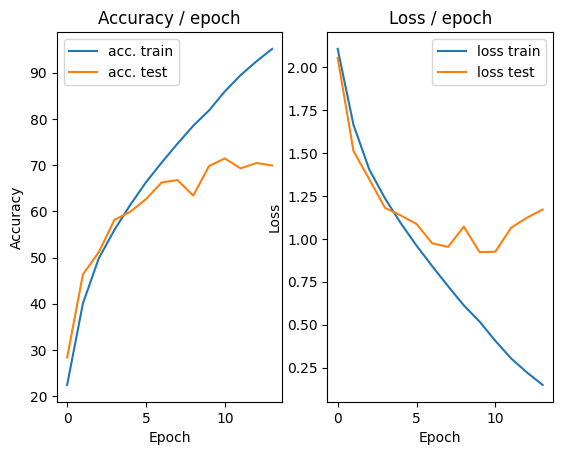

=== EPOCH 15 =====

[TRAIN Batch 000/391]	Time 0.149s (0.149s)	Loss 0.1341 (0.1341)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)


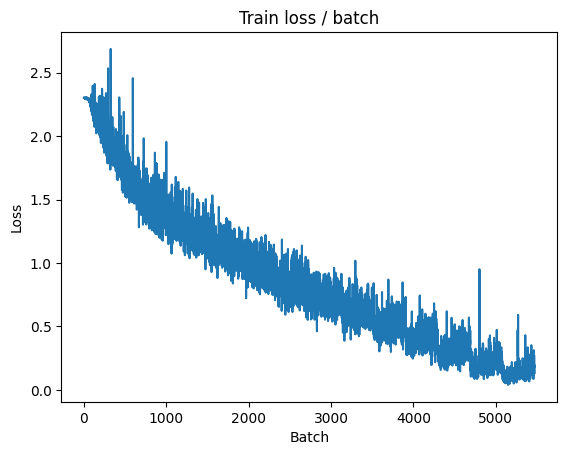

[TRAIN Batch 200/391]	Time 0.013s (0.021s)	Loss 0.0426 (0.0858)	Prec@1 100.0 ( 97.5)	Prec@5 100.0 (100.0)


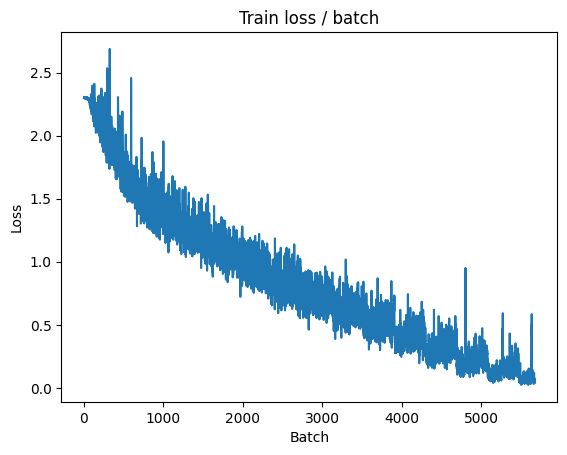


===============> Total time 8s	Avg loss 0.0963	Avg Prec@1 97.06 %	Avg Prec@5 99.99 %

[EVAL Batch 000/079]	Time 0.127s (0.127s)	Loss 1.1656 (1.1656)	Prec@1  76.6 ( 76.6)	Prec@5  94.5 ( 94.5)

===============> Total time 2s	Avg loss 1.3347	Avg Prec@1 70.80 %	Avg Prec@5 97.44 %



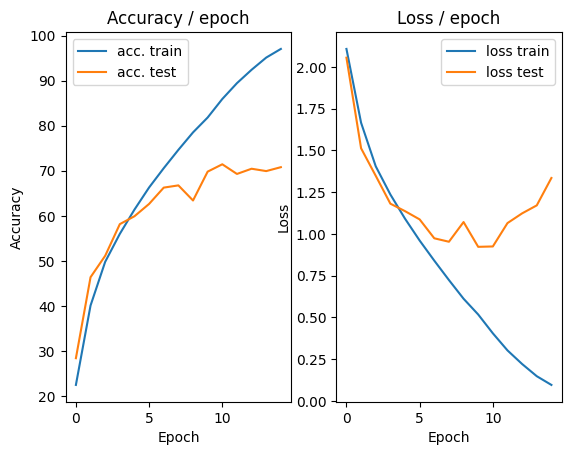

In [ ]:
main(128, 0.1, cuda=True)

## Intrepretation of the results

The training results show that accuracy improves and loss decreases consistently from epoch 1 (loss of 2.0546, accuracy of 28.37\%) until epoch 8 (loss of 0.9531, accuracy of 70.80\%). After epoch 8, however, the training loss begins to increase again, reaching 1.3347 by epoch 15.

This trend suggests that the model is initially learning well, achieving high accuracy and low loss on the training set. However, the increase in training loss after epoch 8 indicates overfitting, as the model is capturing specific patterns in the training data that don’t generalize well.


## Standardization of examples (CIFAR10 DATASET)

In [ ]:
class ConvNet(nn.Module):
    """
    This class defines the structure of the neural network
    """

    def __init__(self):
        super(ConvNet, self).__init__()
        # We first define the convolution and pooling layers as a features extractor
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),

            nn.Conv2d(32, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2,2), stride = 2, padding=0),

            nn.Conv2d(64, 128, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
        )
        # We then define fully connected layers as a classifier
        self.classifier = nn.Sequential(
            nn.Linear(128*4*4, 1000),
            nn.ReLU(),
            nn.Linear(1000, 10)
            # Reminder: The softmax is included in the loss, do not put it here
        )

    # Method called when we apply the network to an input batch
    def forward(self, input):
        bsize = input.size(0) # batch size
        output = self.features(input) # output of the conv layers
        output = output.view(bsize, -1) # we flatten the 2D feature maps into one 1D vector for each input
        output = self.classifier(output) # we compute the output of the fc layers
        return output


def get_dataset(batch_size, cuda=False):



  """
  This function loads the dataset and performs transformations on each
  image (listed in `transform = ...`).

  """
  train_dataset = datasets.CIFAR10(PATH, train=True, download=True,

    transform=transforms.Compose([
        transforms.ToTensor(), #Transform the PIL image to a torch tensor
        #Adding Normalisation
        transforms.Normalize(
            mean = [0.491, 0.482, 0.447],
            std = [0.202, 0.199, 0.201]
            )
          ]))
  val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
    transform=transforms.Compose([
        transforms.ToTensor(),
          #Adding Normalisation
        transforms.Normalize(
            mean = [0.491, 0.482, 0.447],
            std = [0.202, 0.199, 0.201]
              )
          ]))

  train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
  val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

  return train_loader, val_loader




def epoch(data, model, criterion, optimizer=None, cuda=False):
    """
    Make a pass (called epoch in English) on the data `data` with the
     model `model`. Evaluates `criterion` as loss.
     If `optimizer` is given, perform a training epoch using
     the given optimizer, otherwise, perform an evaluation epoch (no backward)
     of the model.
    """

    # indicates whether the model is in eval or train mode (some layers behave differently in train and eval)
    model.eval() if optimizer is None else model.train()

    # objects to store metric averages
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # we iterate on the batches
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # only with GPU, and not with CPU
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward if we are training
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # compute metrics
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # update
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # print info
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Print summary
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss


def main(batch_size=128, lr=0.1, epochs=15, cuda=False):

    # ex :
    #   {"batch_size": 128, "epochs": 5, "lr": 0.1}

    # define model, loss, optim
    model = ConvNet()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr)

    if cuda: # only with GPU, and not with CPU
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # Get the data
    train, test = get_dataset(batch_size, cuda)

    # init plots
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # We iterate on the epochs
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
        # Train phase
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        # Test phase
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
        # plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)

Files already downloaded and verified
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.176s (0.176s)	Loss 2.3042 (2.3042)	Prec@1  10.9 ( 10.9)	Prec@5  51.6 ( 51.6)


<Figure size 640x480 with 0 Axes>

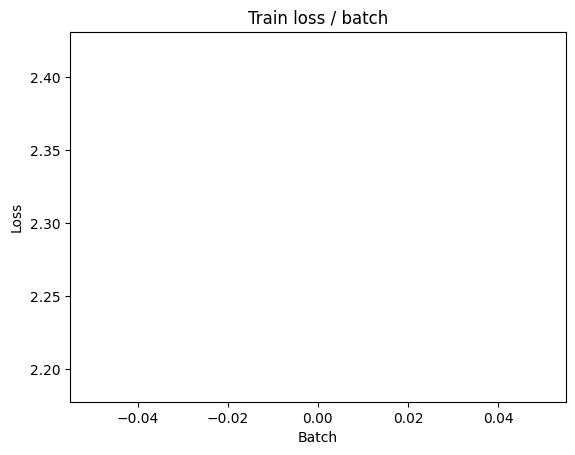

[TRAIN Batch 200/391]	Time 0.056s (0.039s)	Loss 1.5645 (1.9193)	Prec@1  46.1 ( 30.3)	Prec@5  89.8 ( 80.4)


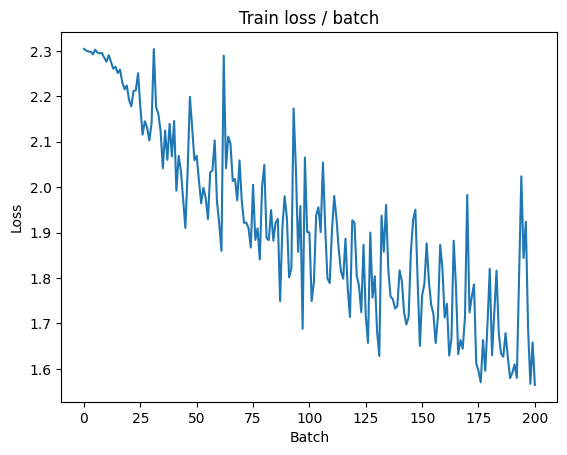


===============> Total time 14s	Avg loss 1.7339	Avg Prec@1 37.13 %	Avg Prec@5 85.64 %

[EVAL Batch 000/079]	Time 0.150s (0.150s)	Loss 1.4026 (1.4026)	Prec@1  58.6 ( 58.6)	Prec@5  92.2 ( 92.2)

===============> Total time 3s	Avg loss 1.4049	Avg Prec@1 49.05 %	Avg Prec@5 93.16 %



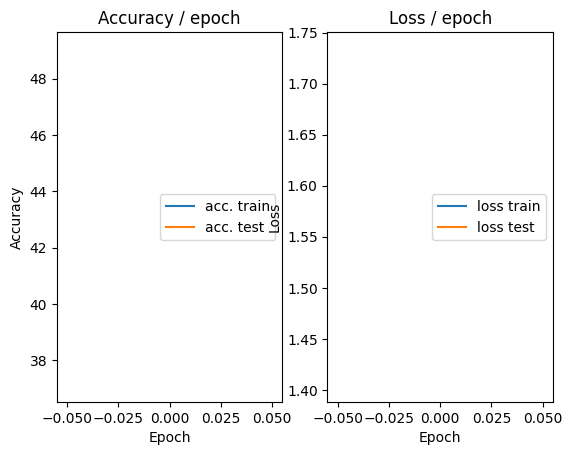

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.156s (0.156s)	Loss 1.3002 (1.3002)	Prec@1  56.2 ( 56.2)	Prec@5  95.3 ( 95.3)


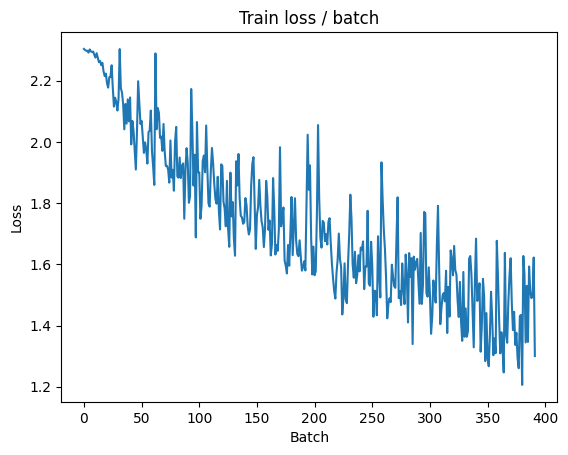

[TRAIN Batch 200/391]	Time 0.047s (0.034s)	Loss 1.3472 (1.3378)	Prec@1  53.1 ( 52.1)	Prec@5  93.0 ( 93.8)


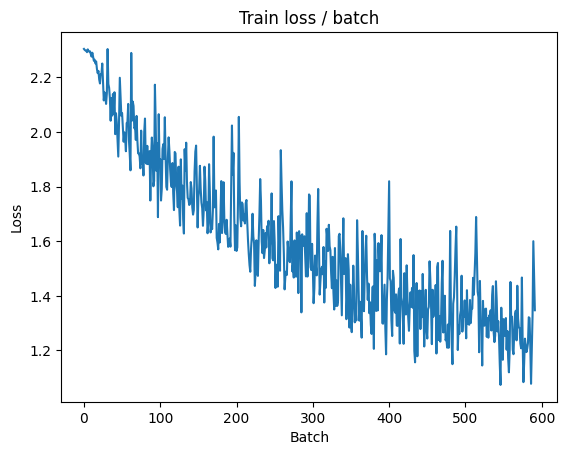


===============> Total time 14s	Avg loss 1.2740	Avg Prec@1 54.63 %	Avg Prec@5 94.48 %

[EVAL Batch 000/079]	Time 0.131s (0.131s)	Loss 1.1413 (1.1413)	Prec@1  60.9 ( 60.9)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 1.2375	Avg Prec@1 56.08 %	Avg Prec@5 94.63 %



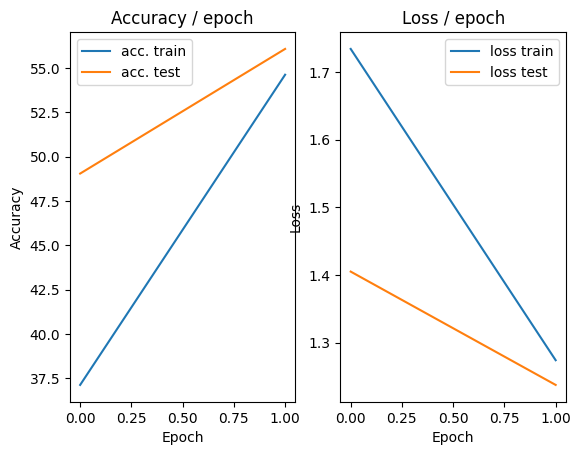

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.159s (0.159s)	Loss 1.2146 (1.2146)	Prec@1  57.0 ( 57.0)	Prec@5  96.1 ( 96.1)


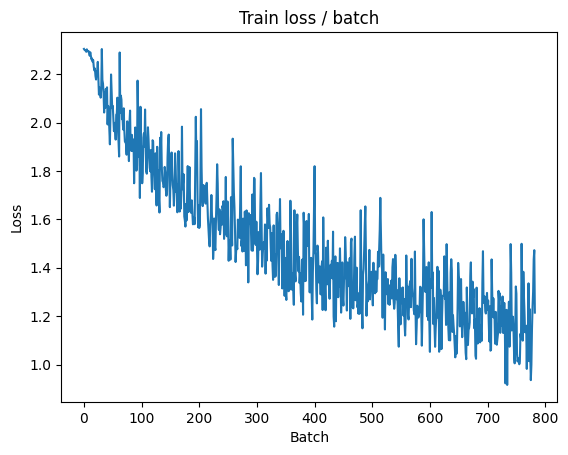

[TRAIN Batch 200/391]	Time 0.031s (0.037s)	Loss 1.1809 (1.0672)	Prec@1  60.2 ( 62.7)	Prec@5  94.5 ( 96.6)


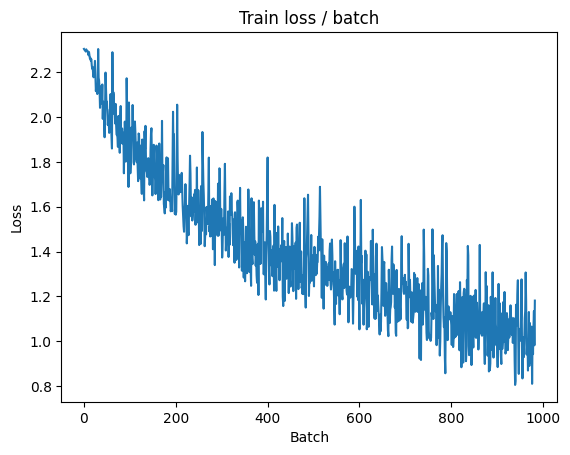


===============> Total time 14s	Avg loss 1.0274	Avg Prec@1 64.03 %	Avg Prec@5 96.82 %

[EVAL Batch 000/079]	Time 0.141s (0.141s)	Loss 0.9057 (0.9057)	Prec@1  71.1 ( 71.1)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.9715	Avg Prec@1 66.13 %	Avg Prec@5 96.83 %



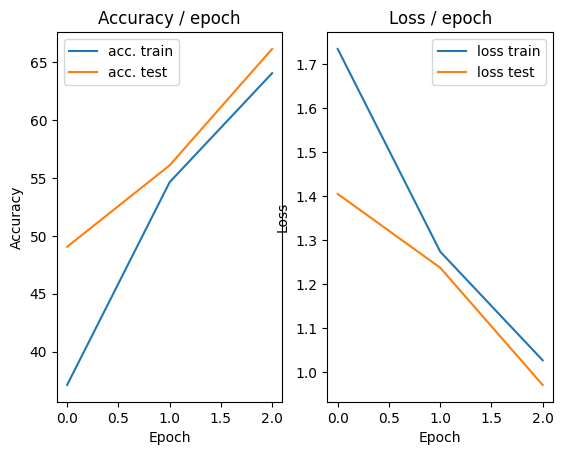

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.157s (0.157s)	Loss 0.6682 (0.6682)	Prec@1  75.0 ( 75.0)	Prec@5  99.2 ( 99.2)


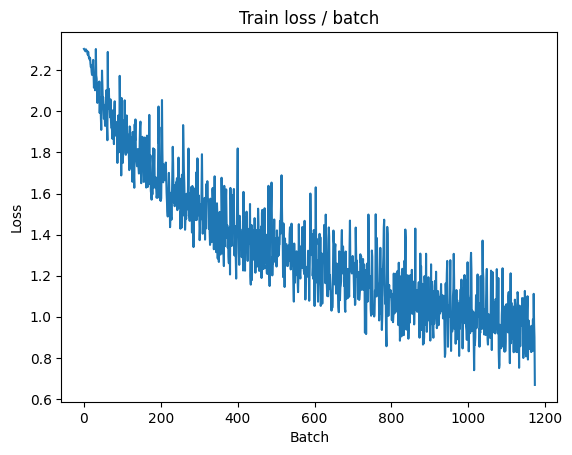

[TRAIN Batch 200/391]	Time 0.044s (0.040s)	Loss 0.9414 (0.8546)	Prec@1  69.5 ( 70.4)	Prec@5  99.2 ( 97.8)


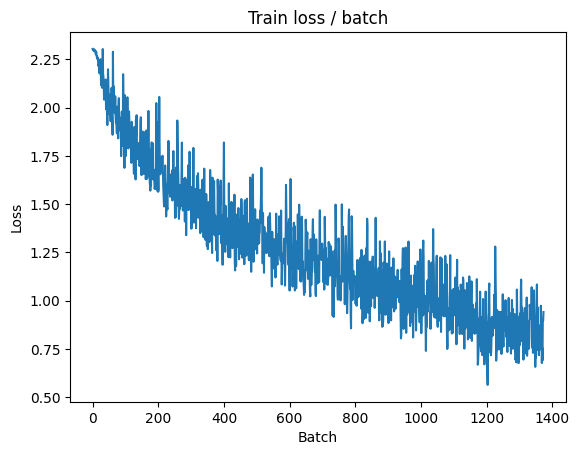


===============> Total time 14s	Avg loss 0.8392	Avg Prec@1 70.70 %	Avg Prec@5 97.89 %

[EVAL Batch 000/079]	Time 0.189s (0.189s)	Loss 0.8385 (0.8385)	Prec@1  68.0 ( 68.0)	Prec@5  96.9 ( 96.9)

===============> Total time 4s	Avg loss 0.8808	Avg Prec@1 69.33 %	Avg Prec@5 97.68 %



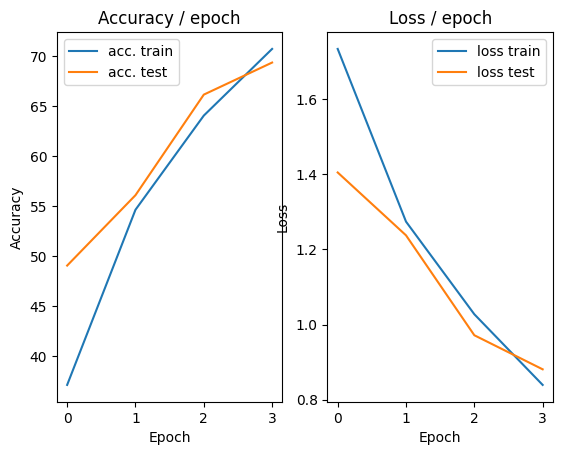

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.286s (0.286s)	Loss 0.6191 (0.6191)	Prec@1  76.6 ( 76.6)	Prec@5  98.4 ( 98.4)


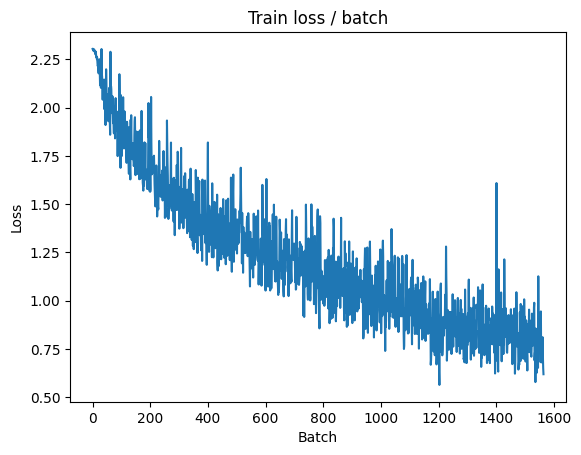

[TRAIN Batch 200/391]	Time 0.045s (0.035s)	Loss 0.6494 (0.7005)	Prec@1  76.6 ( 75.7)	Prec@5 100.0 ( 98.7)


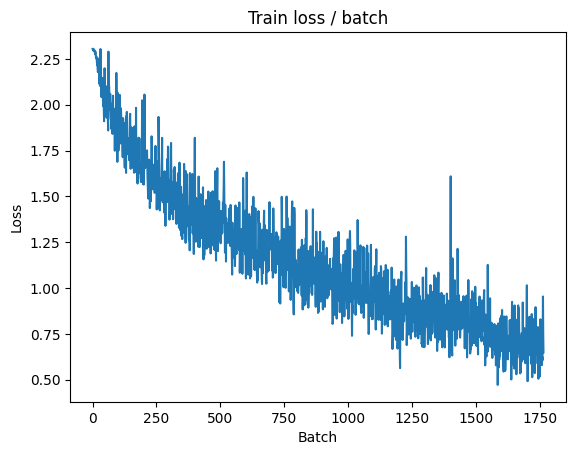


===============> Total time 14s	Avg loss 0.6935	Avg Prec@1 75.94 %	Avg Prec@5 98.68 %

[EVAL Batch 000/079]	Time 0.149s (0.149s)	Loss 0.7925 (0.7925)	Prec@1  74.2 ( 74.2)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.8647	Avg Prec@1 70.06 %	Avg Prec@5 97.78 %



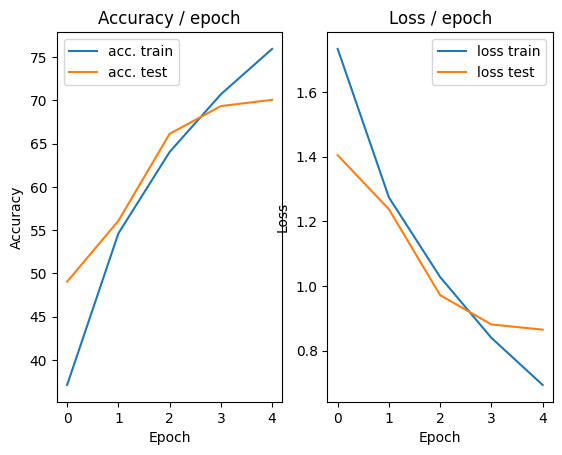

=== EPOCH 6 =====

[TRAIN Batch 000/391]	Time 0.196s (0.196s)	Loss 0.6103 (0.6103)	Prec@1  82.8 ( 82.8)	Prec@5  98.4 ( 98.4)


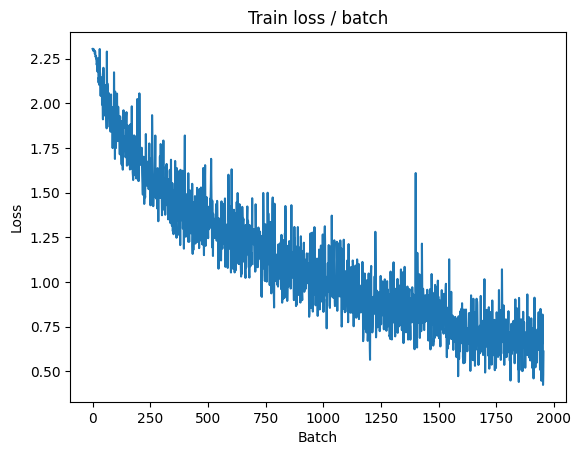

[TRAIN Batch 200/391]	Time 0.085s (0.038s)	Loss 0.5252 (0.5553)	Prec@1  78.1 ( 80.8)	Prec@5 100.0 ( 99.2)


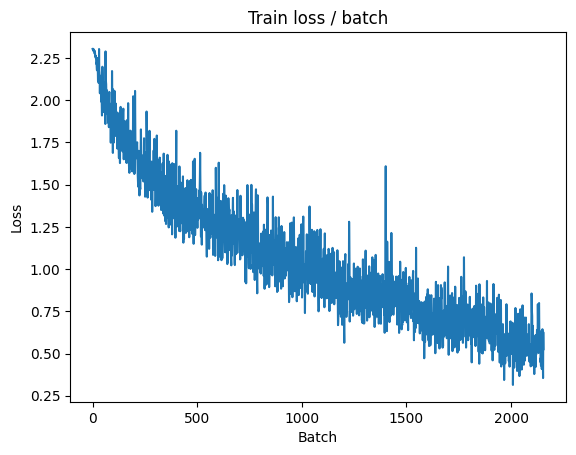


===============> Total time 14s	Avg loss 0.5596	Avg Prec@1 80.50 %	Avg Prec@5 99.17 %

[EVAL Batch 000/079]	Time 0.146s (0.146s)	Loss 0.6663 (0.6663)	Prec@1  78.1 ( 78.1)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.7905	Avg Prec@1 73.61 %	Avg Prec@5 98.01 %



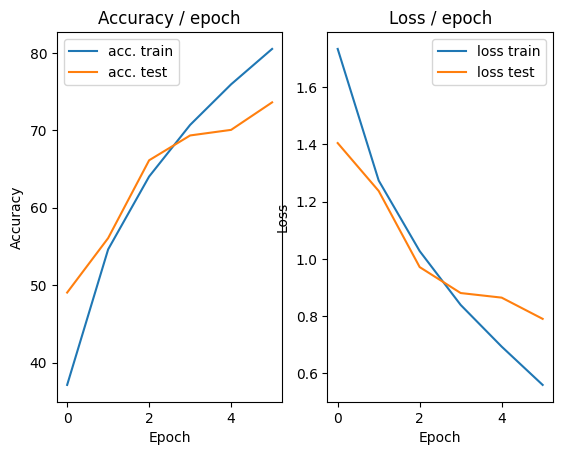

=== EPOCH 7 =====

[TRAIN Batch 000/391]	Time 0.189s (0.189s)	Loss 0.3964 (0.3964)	Prec@1  87.5 ( 87.5)	Prec@5  99.2 ( 99.2)


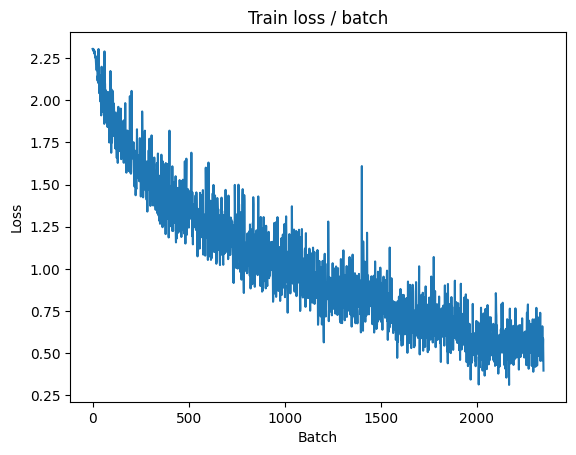

[TRAIN Batch 200/391]	Time 0.048s (0.040s)	Loss 0.4709 (0.4180)	Prec@1  84.4 ( 85.4)	Prec@5  99.2 ( 99.6)


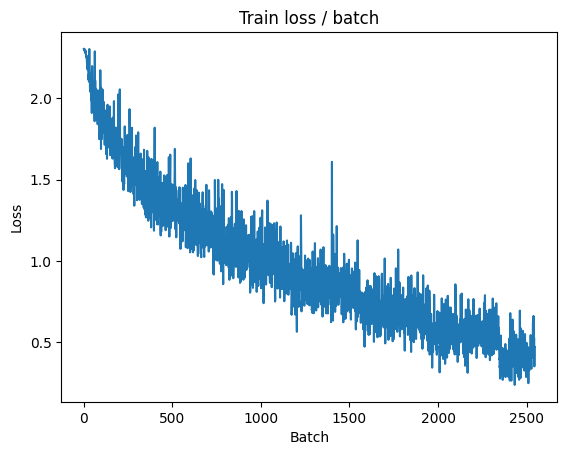


===============> Total time 14s	Avg loss 0.4309	Avg Prec@1 84.87 %	Avg Prec@5 99.53 %

[EVAL Batch 000/079]	Time 0.151s (0.151s)	Loss 0.7451 (0.7451)	Prec@1  73.4 ( 73.4)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.8240	Avg Prec@1 73.16 %	Avg Prec@5 97.83 %



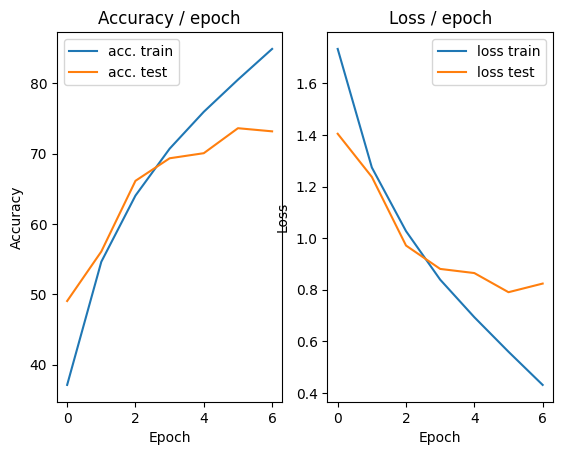

=== EPOCH 8 =====

[TRAIN Batch 000/391]	Time 0.194s (0.194s)	Loss 0.2243 (0.2243)	Prec@1  94.5 ( 94.5)	Prec@5 100.0 (100.0)


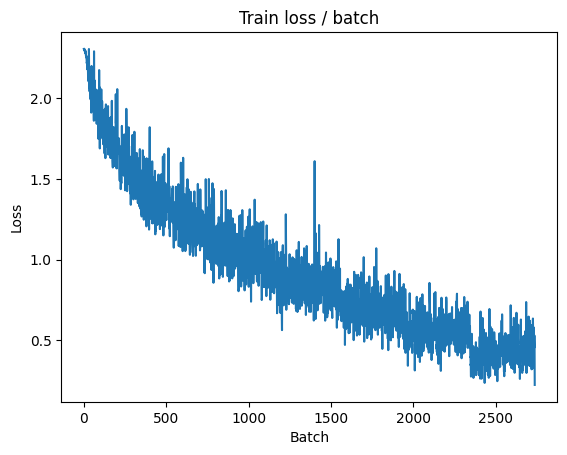

[TRAIN Batch 200/391]	Time 0.048s (0.034s)	Loss 0.2776 (0.2865)	Prec@1  86.7 ( 90.1)	Prec@5 100.0 ( 99.8)


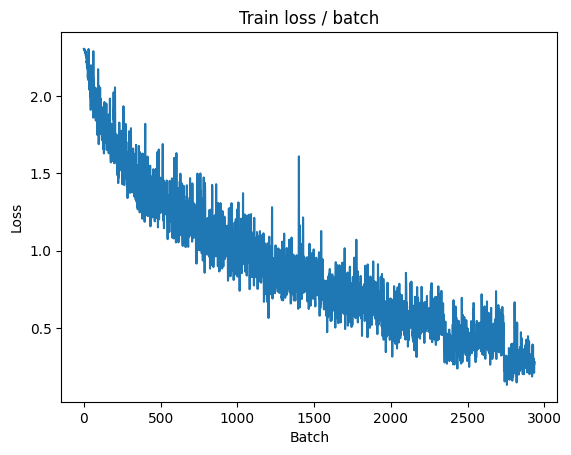


===============> Total time 14s	Avg loss 0.3034	Avg Prec@1 89.51 %	Avg Prec@5 99.80 %

[EVAL Batch 000/079]	Time 0.140s (0.140s)	Loss 0.9226 (0.9226)	Prec@1  73.4 ( 73.4)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.9753	Avg Prec@1 71.96 %	Avg Prec@5 97.69 %



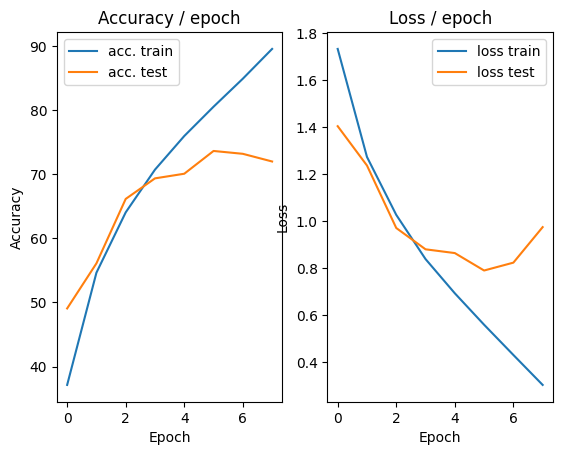

=== EPOCH 9 =====

[TRAIN Batch 000/391]	Time 0.178s (0.178s)	Loss 0.2756 (0.2756)	Prec@1  93.8 ( 93.8)	Prec@5 100.0 (100.0)


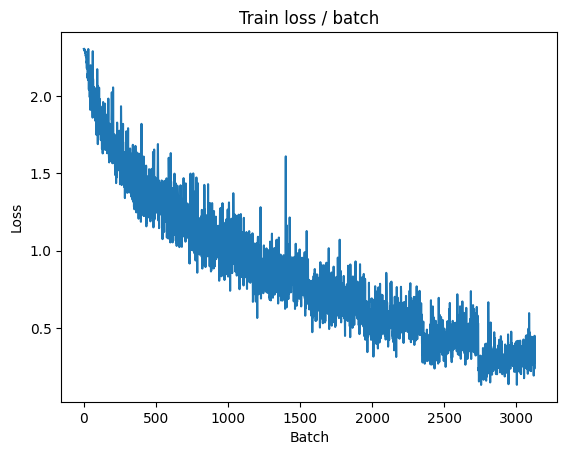

[TRAIN Batch 200/391]	Time 0.017s (0.041s)	Loss 0.1871 (0.1835)	Prec@1  93.0 ( 93.7)	Prec@5 100.0 ( 99.9)


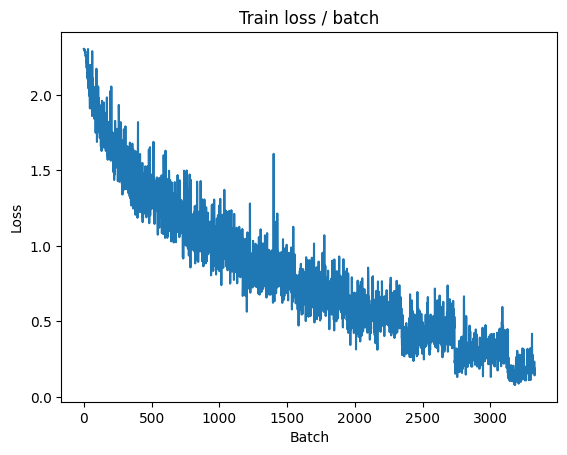


===============> Total time 14s	Avg loss 0.2076	Avg Prec@1 92.79 %	Avg Prec@5 99.92 %

[EVAL Batch 000/079]	Time 0.147s (0.147s)	Loss 0.9766 (0.9766)	Prec@1  72.7 ( 72.7)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 1.1763	Avg Prec@1 70.15 %	Avg Prec@5 97.13 %



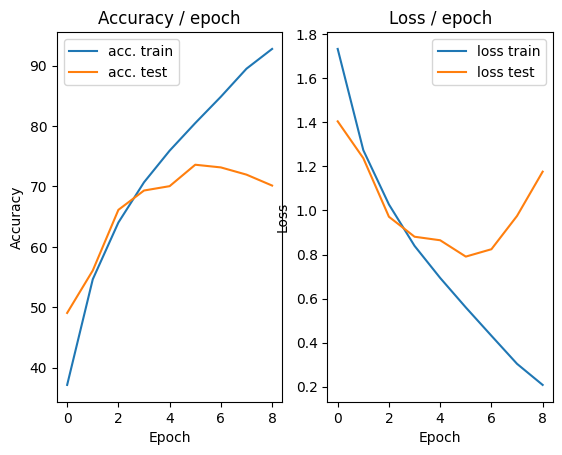

=== EPOCH 10 =====

[TRAIN Batch 000/391]	Time 0.172s (0.172s)	Loss 0.1972 (0.1972)	Prec@1  92.2 ( 92.2)	Prec@5 100.0 (100.0)


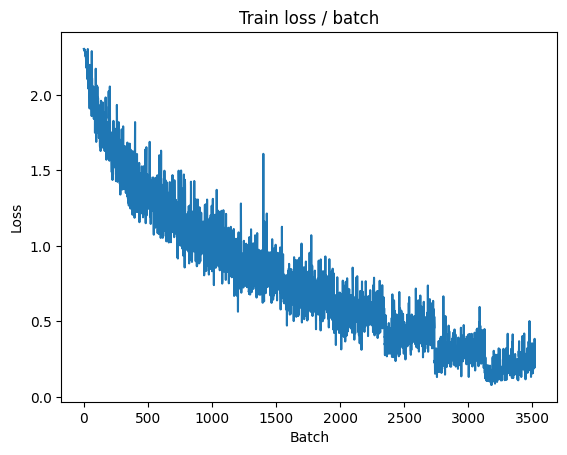

[TRAIN Batch 200/391]	Time 0.012s (0.039s)	Loss 0.0509 (0.1038)	Prec@1  97.7 ( 96.8)	Prec@5 100.0 (100.0)


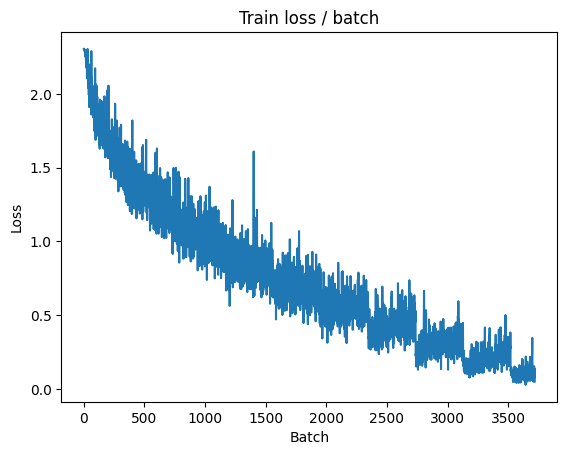


===============> Total time 14s	Avg loss 0.1299	Avg Prec@1 95.76 %	Avg Prec@5 99.98 %

[EVAL Batch 000/079]	Time 0.274s (0.274s)	Loss 0.9133 (0.9133)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 1.2749	Avg Prec@1 71.98 %	Avg Prec@5 97.51 %



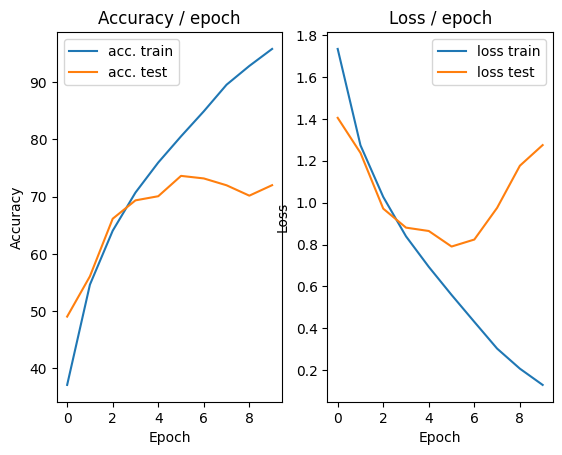

=== EPOCH 11 =====

[TRAIN Batch 000/391]	Time 0.169s (0.169s)	Loss 0.0814 (0.0814)	Prec@1  96.9 ( 96.9)	Prec@5 100.0 (100.0)


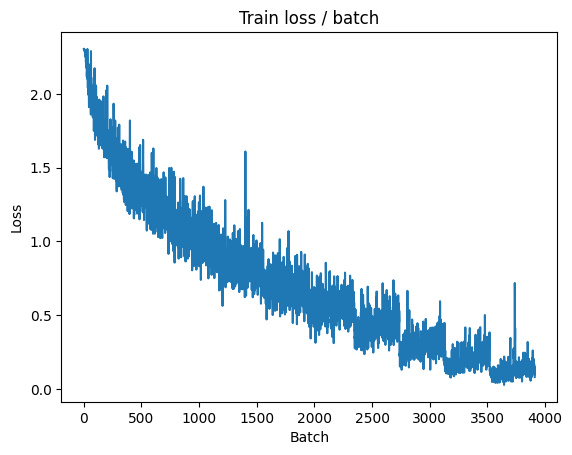

[TRAIN Batch 200/391]	Time 0.054s (0.034s)	Loss 0.0760 (0.0725)	Prec@1  96.9 ( 97.7)	Prec@5 100.0 (100.0)


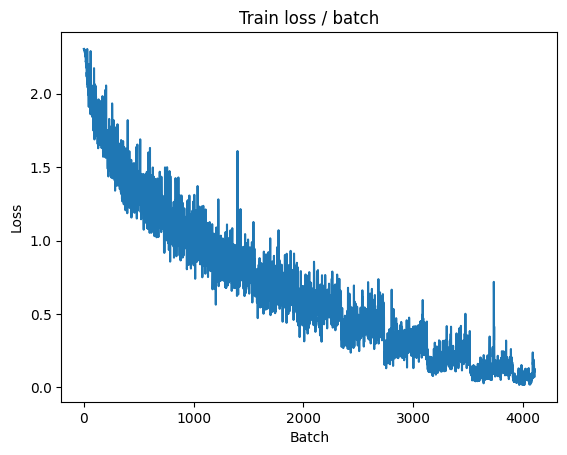


===============> Total time 14s	Avg loss 0.0948	Avg Prec@1 96.85 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.141s (0.141s)	Loss 1.0154 (1.0154)	Prec@1  76.6 ( 76.6)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 1.1578	Avg Prec@1 73.85 %	Avg Prec@5 97.81 %



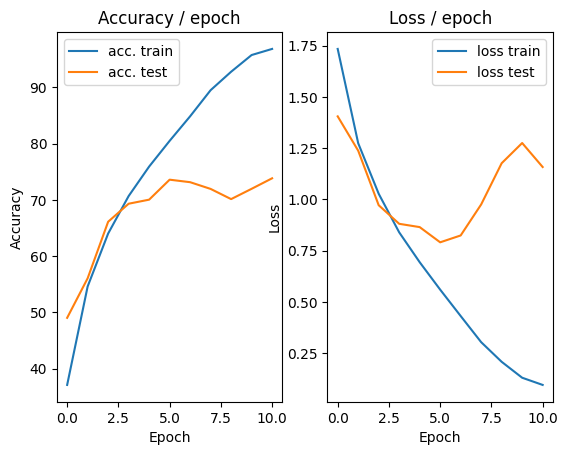

=== EPOCH 12 =====

[TRAIN Batch 000/391]	Time 0.194s (0.194s)	Loss 0.0307 (0.0307)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


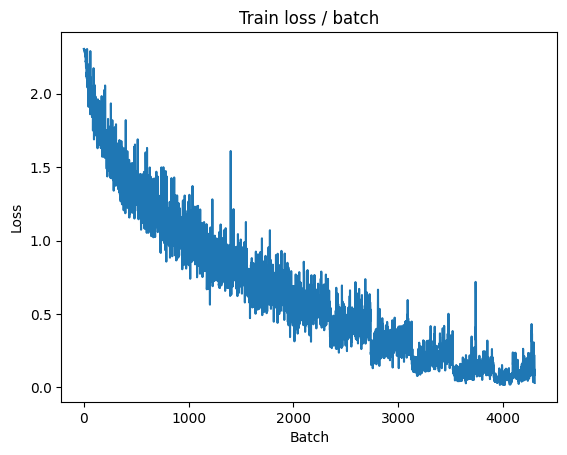

[TRAIN Batch 200/391]	Time 0.041s (0.040s)	Loss 0.0606 (0.0486)	Prec@1  98.4 ( 98.5)	Prec@5 100.0 (100.0)


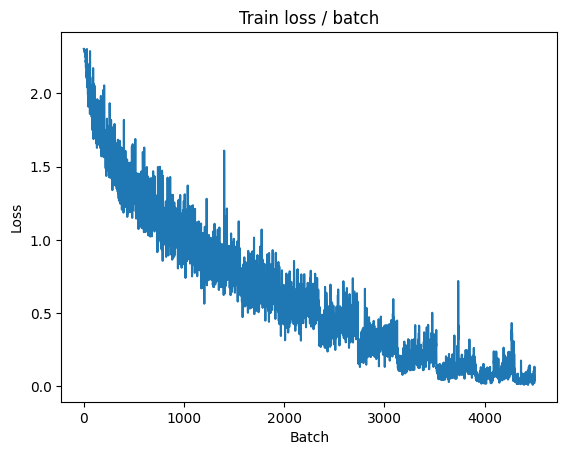


===============> Total time 14s	Avg loss 0.0584	Avg Prec@1 98.22 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.147s (0.147s)	Loss 1.2084 (1.2084)	Prec@1  73.4 ( 73.4)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 1.2413	Avg Prec@1 74.91 %	Avg Prec@5 97.69 %



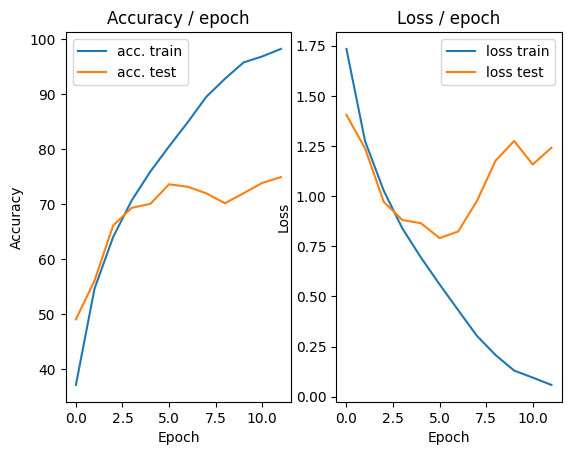

=== EPOCH 13 =====

[TRAIN Batch 000/391]	Time 0.164s (0.164s)	Loss 0.0151 (0.0151)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


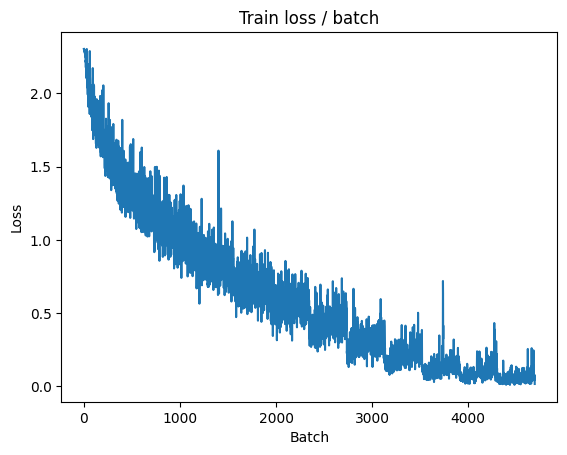

[TRAIN Batch 200/391]	Time 0.012s (0.039s)	Loss 0.0759 (0.0325)	Prec@1  96.1 ( 99.1)	Prec@5 100.0 (100.0)


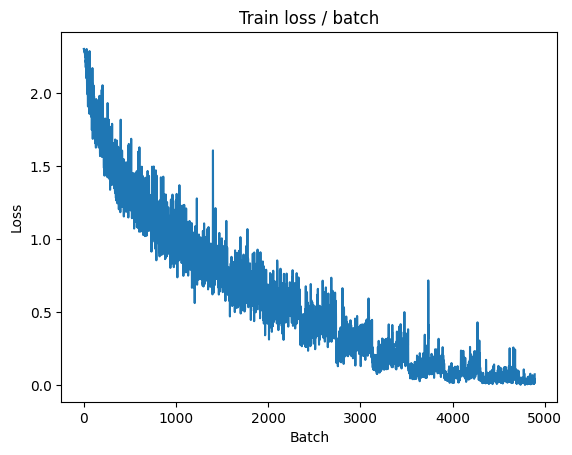


===============> Total time 14s	Avg loss 0.0476	Avg Prec@1 98.56 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.270s (0.270s)	Loss 1.3364 (1.3364)	Prec@1  74.2 ( 74.2)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 1.4246	Avg Prec@1 72.89 %	Avg Prec@5 97.65 %



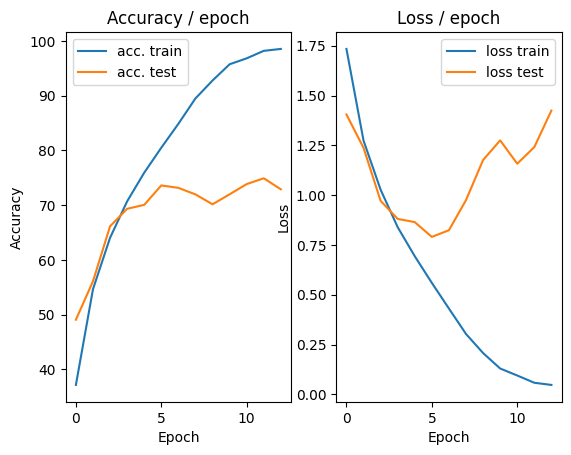

=== EPOCH 14 =====

[TRAIN Batch 000/391]	Time 0.164s (0.164s)	Loss 0.0376 (0.0376)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)


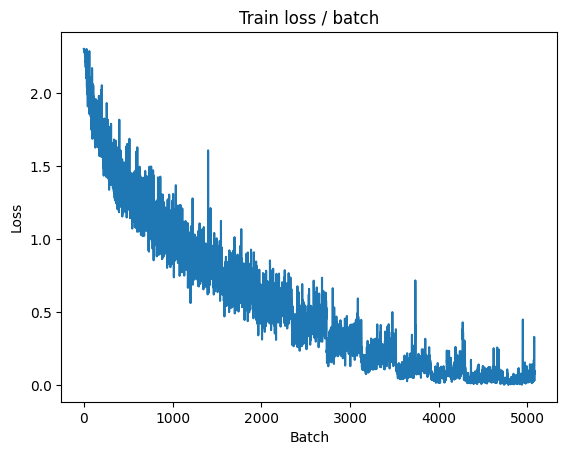

[TRAIN Batch 200/391]	Time 0.019s (0.034s)	Loss 0.0116 (0.0357)	Prec@1 100.0 ( 98.9)	Prec@5 100.0 (100.0)


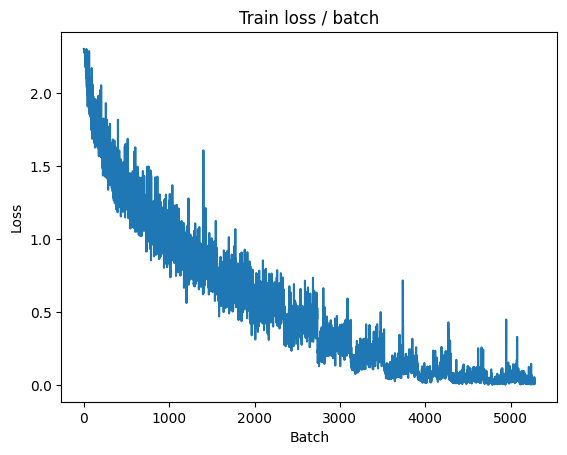


===============> Total time 14s	Avg loss 0.0405	Avg Prec@1 98.76 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.152s (0.152s)	Loss 1.3639 (1.3639)	Prec@1  78.1 ( 78.1)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 1.4512	Avg Prec@1 73.94 %	Avg Prec@5 97.75 %



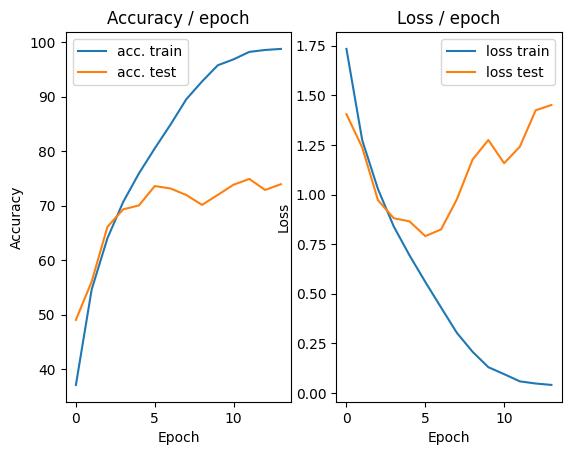

=== EPOCH 15 =====

[TRAIN Batch 000/391]	Time 0.185s (0.185s)	Loss 0.0427 (0.0427)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)


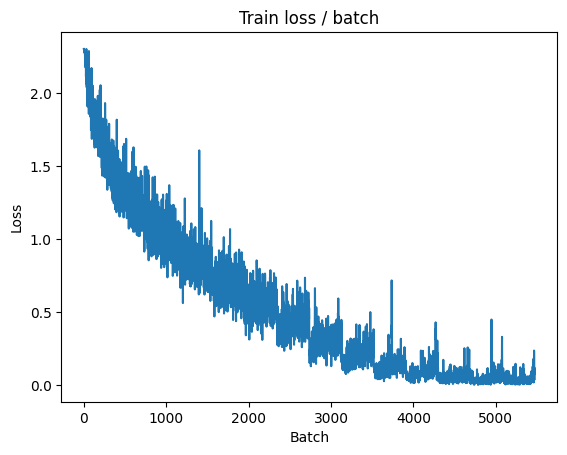

[TRAIN Batch 200/391]	Time 0.058s (0.040s)	Loss 0.0334 (0.0249)	Prec@1  98.4 ( 99.3)	Prec@5 100.0 (100.0)


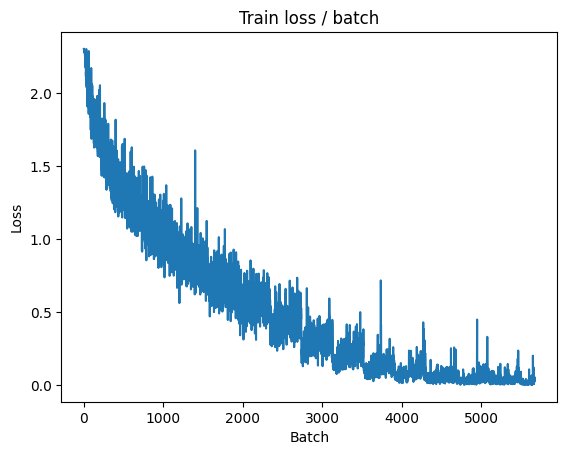


===============> Total time 14s	Avg loss 0.0310	Avg Prec@1 99.10 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.199s (0.199s)	Loss 1.4428 (1.4428)	Prec@1  77.3 ( 77.3)	Prec@5  96.9 ( 96.9)

===============> Total time 3s	Avg loss 1.4370	Avg Prec@1 75.08 %	Avg Prec@5 97.83 %



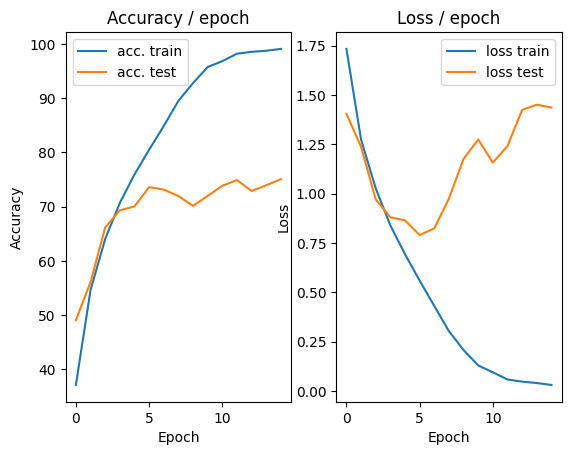

In [ ]:
main(128, 0.1, cuda = True)

### Description of the experimental results
By normalizing the CIFAR-10 dataset with channel-specific mean and standard deviation values, we observe an increase in accuracy and faster convergence. From the first epoch, both training and evaluation accuracies improve progressively, with the network achieving higher accuracy 75.08. This effective standardization of the data conditions the model for more efficient learning and allows it to stabilize at higher performance levels.

## Other Techniques of Normalization like ZCA

In [ ]:


# Function to compute ZCA transformation matrix and mean
def compute_zca_matrix_and_mean(dataset):
    # Stack images into a single array with shape (num_samples, 3072)
    data = torch.stack([img.view(-1) for img, _ in dataset], dim=0).numpy()

    # Compute the mean of the dataset
    mean = data.mean(axis=0)

    # Center the data by subtracting the mean
    centered_data = data - mean

    # Compute the covariance matrix
    covariance_matrix = np.cov(centered_data, rowvar=False)

    # Perform SVD on the covariance matrix
    U, S, V = np.linalg.svd(covariance_matrix)

    # Compute the ZCA matrix
    epsilon = 1e-5  # Small constant to prevent division by zero
    zca_matrix = np.dot(U, np.dot(np.diag(1.0 / np.sqrt(S + epsilon)), U.T))

    return torch.from_numpy(zca_matrix).float(), torch.from_numpy(mean).float()

# ZCA Transformation class
class ZCATransformation(object):
    def __init__(self, zca_matrix, mean):
        self.zca_matrix = zca_matrix
        self.mean = mean

    def __call__(self, x):
        flat_x = x.view(-1) - self.mean  # Flatten and center the input
        transformed_x = torch.mm(self.zca_matrix, flat_x.unsqueeze(1)).squeeze()  # Apply ZCA
        return transformed_x.view_as(x)  # Reshape back to original dimensions

# Load CIFAR-10 training set to compute the ZCA transformation matrix
PATH="datasets"
train_dataset = datasets.CIFAR10(PATH, train=True, download=True, transform=transforms.ToTensor())

# Compute ZCA matrix and mean
zca_matrix, zca_mean = compute_zca_matrix_and_mean(train_dataset)

# Updated get_dataset function with ZCA normalization
# def get_dataset(batch_size, cuda=False):
#     transform = transforms.Compose([
#         ZCATransformation(zca_matrix, zca_mean),  # Apply ZCA transformation
#         transforms.ToTensor(),
#         transforms.Normalize(mean=[0.491, 0.482, 0.447], std=[0.202, 0.199, 0.201])  # Standard normalization
#     ])

#     train_dataset = datasets.CIFAR10(PATH, train=True, download=True, transform=transform)
#     val_dataset = datasets.CIFAR10(PATH, train=False, download=True, transform=transform)

#     train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
#     val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

#     return train_loader, val_loader


Files already downloaded and verified


In [ ]:
class ConvNet(nn.Module):
    """
    This class defines the structure of the neural network
    """

    def __init__(self):
        super(ConvNet, self).__init__()
        # We first define the convolution and pooling layers as a features extractor
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),

            nn.Conv2d(32, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2,2), stride = 2, padding=0),

            nn.Conv2d(64, 128, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
        )
        # We then define fully connected layers as a classifier
        self.classifier = nn.Sequential(
            nn.Linear(128*4*4, 1000),
            nn.ReLU(),
            nn.Linear(1000, 10)
            # Reminder: The softmax is included in the loss, do not put it here
        )

    # Method called when we apply the network to an input batch
    def forward(self, input):
        bsize = input.size(0) # batch size
        output = self.features(input) # output of the conv layers
        output = output.view(bsize, -1) # we flatten the 2D feature maps into one 1D vector for each input
        output = self.classifier(output) # we compute the output of the fc layers
        return output


def get_dataset(batch_size, cuda=False):



  """
  This function loads the dataset and performs transformations on each
  image (listed in `transform = ...`).

  """
  train_dataset = datasets.CIFAR10(PATH, train=True, download=True,

    transform=transforms.Compose([
        transforms.ToTensor(), #Transform the PIL image to a torch tensor
        ZCATransformation(zca_matrix, zca_mean),  # Apply ZCA transformation

          ]))
  val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
    transform=transforms.Compose([
        transforms.ToTensor(),
          #Adding Normalisation
        ZCATransformation(zca_matrix, zca_mean),  # Apply ZCA transformation
          ]))

  train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
  val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

  return train_loader, val_loader




def epoch(data, model, criterion, optimizer=None, cuda=False):
    """
    Make a pass (called epoch in English) on the data `data` with the
     model `model`. Evaluates `criterion` as loss.
     If `optimizer` is given, perform a training epoch using
     the given optimizer, otherwise, perform an evaluation epoch (no backward)
     of the model.
    """

    # indicates whether the model is in eval or train mode (some layers behave differently in train and eval)
    model.eval() if optimizer is None else model.train()

    # objects to store metric averages
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # we iterate on the batches
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # only with GPU, and not with CPU
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward if we are training
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # compute metrics
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # update
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # print info
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Print summary
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss


def main(batch_size=128, lr=0.1, epochs=15, cuda=False):

    # ex :
    #   {"batch_size": 128, "epochs": 5, "lr": 0.1}

    # define model, loss, optim
    model = ConvNet()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr)

    if cuda: # only with GPU, and not with CPU
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # Get the data
    train, test = get_dataset(batch_size, cuda)

    # init plots
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # We iterate on the epochs
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
        # Train phase
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        # Test phase
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
        # plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)

Files already downloaded and verified
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.516s (0.516s)	Loss 2.3019 (2.3019)	Prec@1  11.7 ( 11.7)	Prec@5  53.9 ( 53.9)


<Figure size 640x480 with 0 Axes>

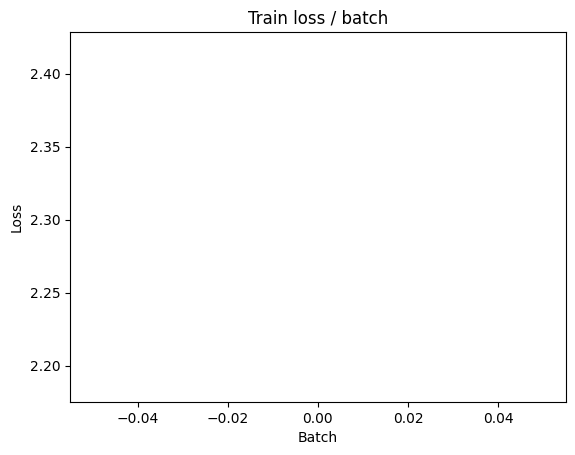

[TRAIN Batch 200/391]	Time 0.019s (0.222s)	Loss 1.9139 (2.0871)	Prec@1  32.0 ( 22.5)	Prec@5  83.6 ( 73.1)


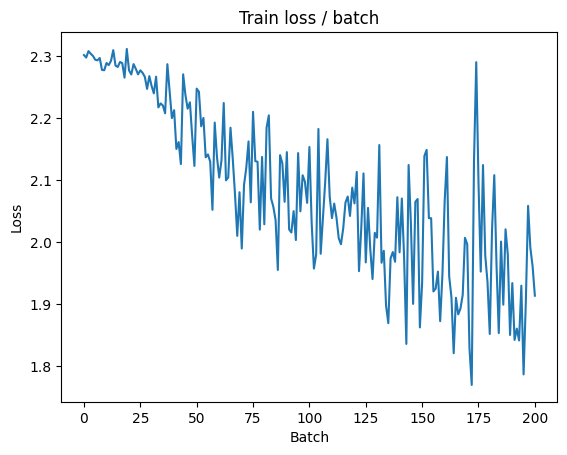


===============> Total time 90s	Avg loss 1.9156	Avg Prec@1 29.69 %	Avg Prec@5 79.93 %

[EVAL Batch 000/079]	Time 0.530s (0.530s)	Loss 1.6990 (1.6990)	Prec@1  41.4 ( 41.4)	Prec@5  90.6 ( 90.6)

===============> Total time 16s	Avg loss 1.6114	Avg Prec@1 40.82 %	Avg Prec@5 90.64 %



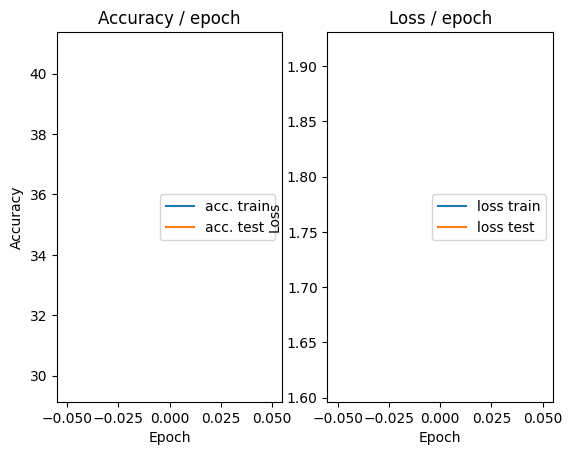

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.528s (0.528s)	Loss 1.5940 (1.5940)	Prec@1  38.3 ( 38.3)	Prec@5  90.6 ( 90.6)


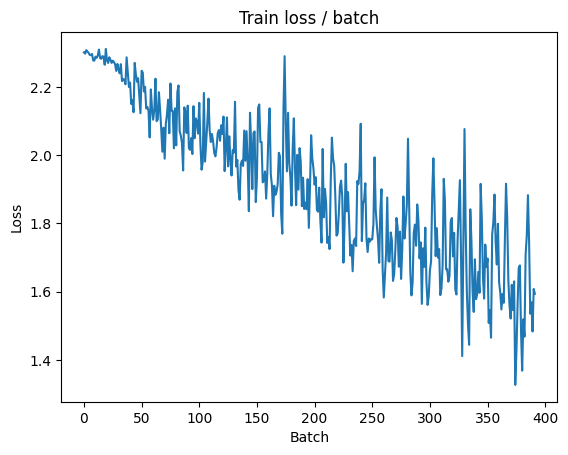

[TRAIN Batch 200/391]	Time 0.411s (0.224s)	Loss 1.1932 (1.4431)	Prec@1  57.8 ( 49.1)	Prec@5  96.9 ( 92.2)


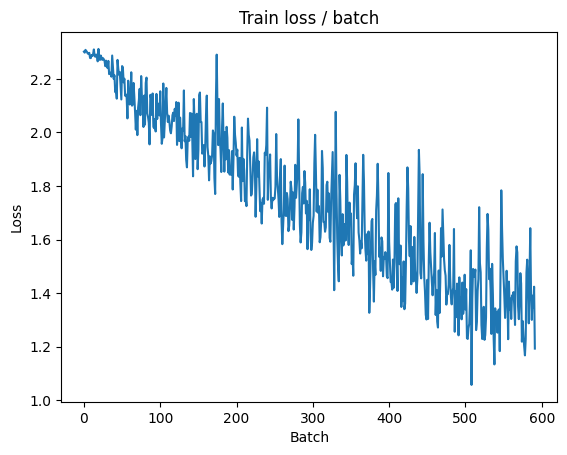


===============> Total time 89s	Avg loss 1.3104	Avg Prec@1 53.90 %	Avg Prec@5 93.68 %

[EVAL Batch 000/079]	Time 0.520s (0.520s)	Loss 1.0808 (1.0808)	Prec@1  61.7 ( 61.7)	Prec@5  96.1 ( 96.1)

===============> Total time 17s	Avg loss 1.1023	Avg Prec@1 61.35 %	Avg Prec@5 95.88 %



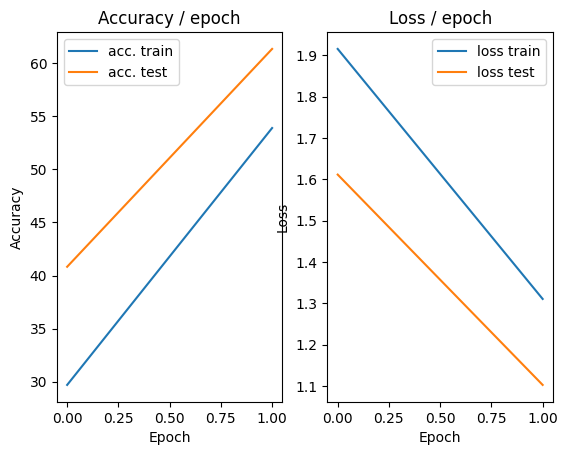

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.526s (0.526s)	Loss 1.0397 (1.0397)	Prec@1  67.2 ( 67.2)	Prec@5  97.7 ( 97.7)


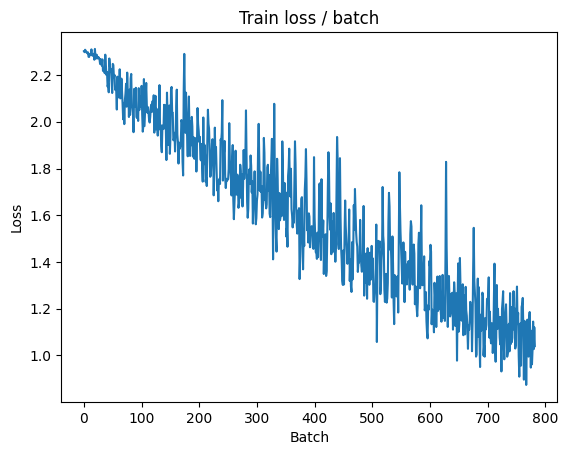

[TRAIN Batch 200/391]	Time 0.608s (0.239s)	Loss 1.0452 (0.9995)	Prec@1  61.7 ( 65.0)	Prec@5  96.9 ( 96.7)


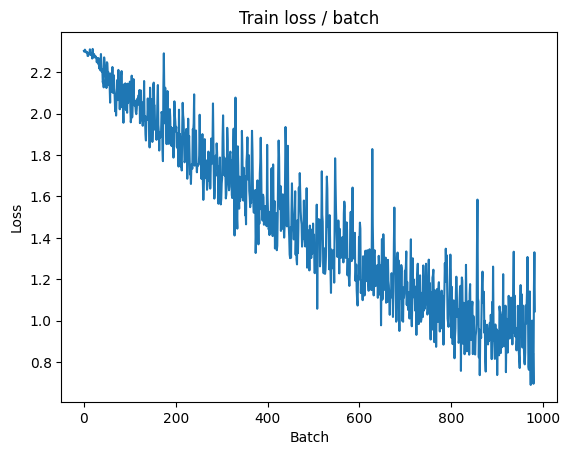


===============> Total time 85s	Avg loss 0.9496	Avg Prec@1 67.04 %	Avg Prec@5 97.10 %

[EVAL Batch 000/079]	Time 0.849s (0.849s)	Loss 0.8148 (0.8148)	Prec@1  71.1 ( 71.1)	Prec@5  98.4 ( 98.4)

===============> Total time 17s	Avg loss 0.9590	Avg Prec@1 67.01 %	Avg Prec@5 97.44 %



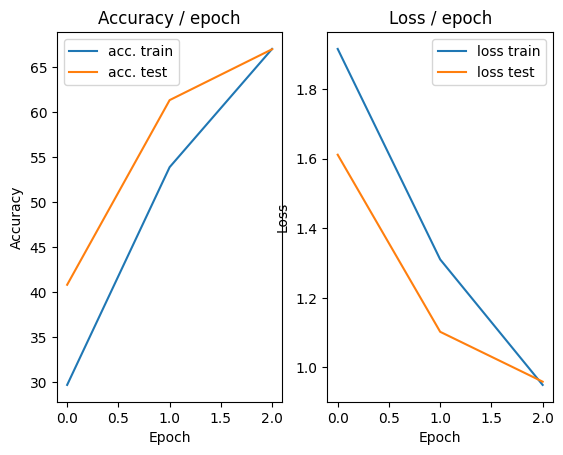

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.575s (0.575s)	Loss 0.9226 (0.9226)	Prec@1  68.0 ( 68.0)	Prec@5  96.9 ( 96.9)


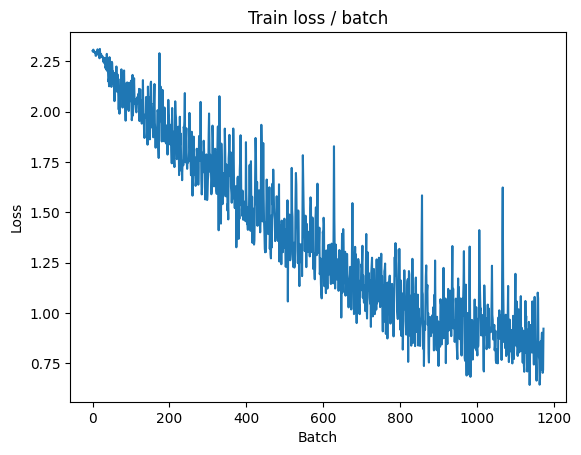

[TRAIN Batch 200/391]	Time 0.012s (0.232s)	Loss 0.7538 (0.7786)	Prec@1  71.1 ( 73.0)	Prec@5  99.2 ( 98.1)


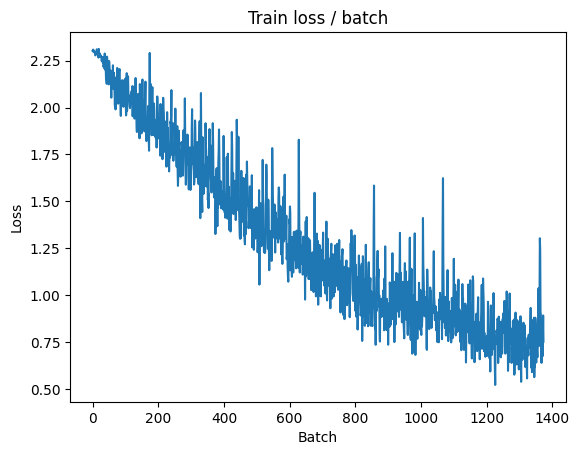


===============> Total time 96s	Avg loss 0.7537	Avg Prec@1 73.84 %	Avg Prec@5 98.20 %

[EVAL Batch 000/079]	Time 0.971s (0.971s)	Loss 0.7647 (0.7647)	Prec@1  72.7 ( 72.7)	Prec@5  98.4 ( 98.4)

===============> Total time 24s	Avg loss 0.8364	Avg Prec@1 70.72 %	Avg Prec@5 98.06 %



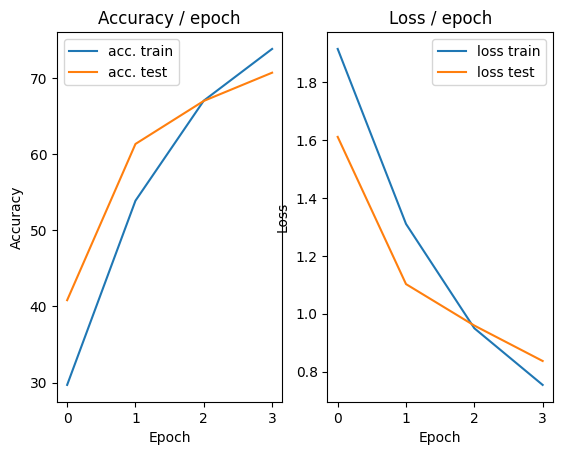

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.513s (0.513s)	Loss 0.7821 (0.7821)	Prec@1  68.0 ( 68.0)	Prec@5  97.7 ( 97.7)


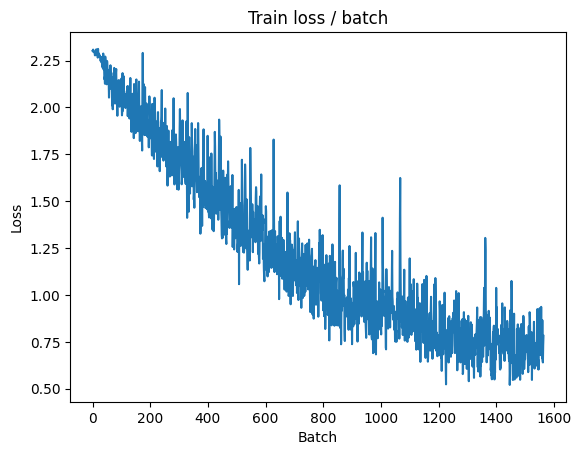

[TRAIN Batch 200/391]	Time 0.368s (0.221s)	Loss 0.6171 (0.6222)	Prec@1  79.7 ( 78.2)	Prec@5  97.7 ( 98.9)


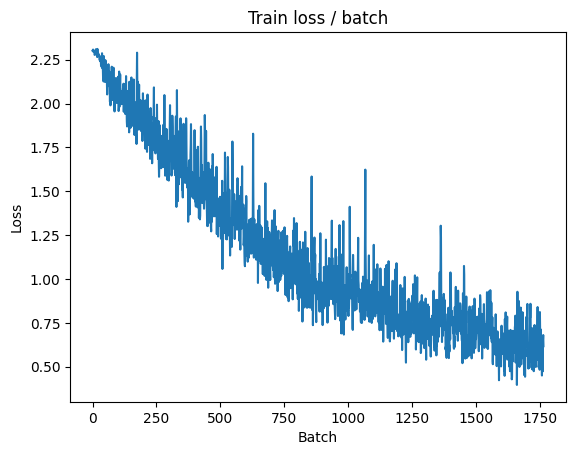


===============> Total time 88s	Avg loss 0.6138	Avg Prec@1 78.48 %	Avg Prec@5 98.94 %

[EVAL Batch 000/079]	Time 0.619s (0.619s)	Loss 0.7927 (0.7927)	Prec@1  76.6 ( 76.6)	Prec@5  98.4 ( 98.4)

===============> Total time 19s	Avg loss 0.8423	Avg Prec@1 71.74 %	Avg Prec@5 98.07 %



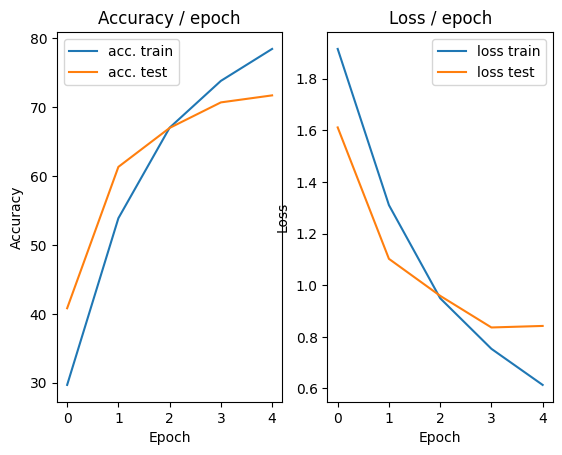

=== EPOCH 6 =====

[TRAIN Batch 000/391]	Time 0.564s (0.564s)	Loss 0.5923 (0.5923)	Prec@1  78.9 ( 78.9)	Prec@5  99.2 ( 99.2)


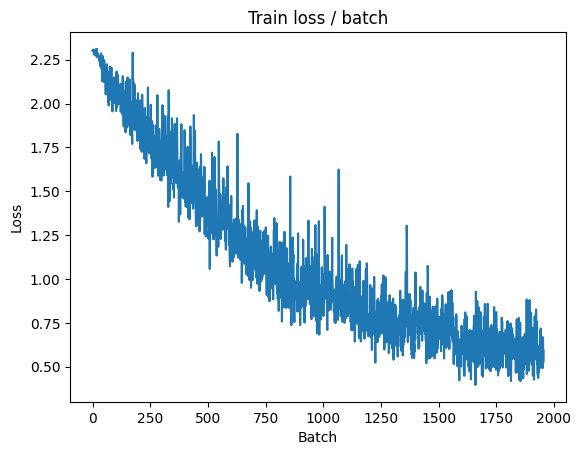

[TRAIN Batch 200/391]	Time 0.211s (0.262s)	Loss 0.7236 (0.4841)	Prec@1  78.9 ( 83.0)	Prec@5  98.4 ( 99.4)


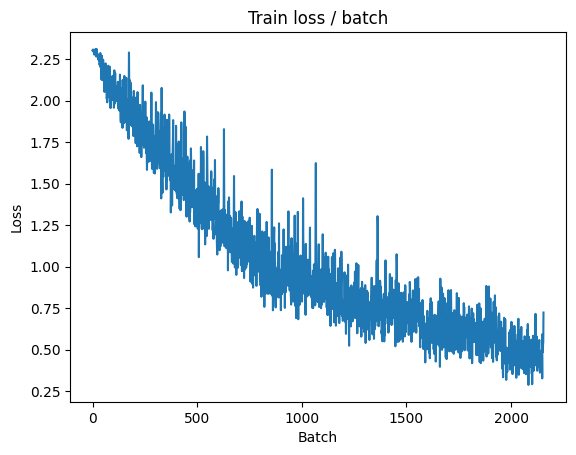


===============> Total time 94s	Avg loss 0.4916	Avg Prec@1 82.86 %	Avg Prec@5 99.35 %

[EVAL Batch 000/079]	Time 0.555s (0.555s)	Loss 0.6869 (0.6869)	Prec@1  75.8 ( 75.8)	Prec@5  98.4 ( 98.4)

===============> Total time 18s	Avg loss 0.7540	Avg Prec@1 74.90 %	Avg Prec@5 98.43 %



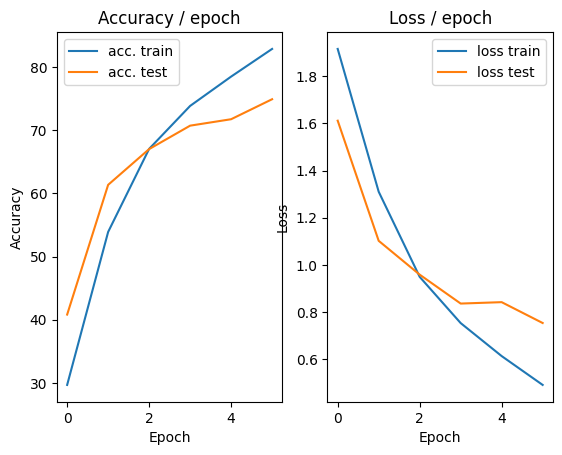

=== EPOCH 7 =====

[TRAIN Batch 000/391]	Time 0.516s (0.516s)	Loss 0.3778 (0.3778)	Prec@1  83.6 ( 83.6)	Prec@5 100.0 (100.0)


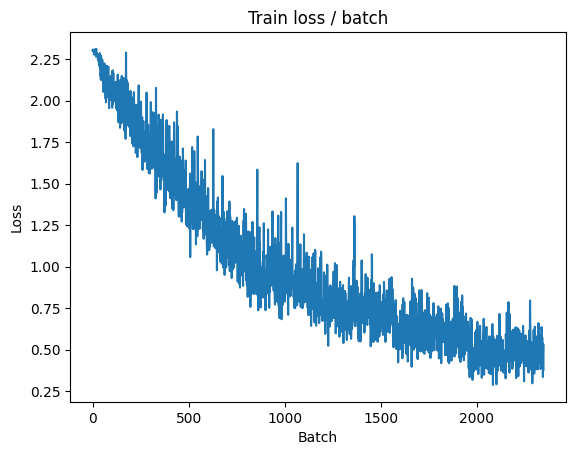

[TRAIN Batch 200/391]	Time 0.023s (0.242s)	Loss 0.3489 (0.3816)	Prec@1  88.3 ( 86.9)	Prec@5 100.0 ( 99.7)


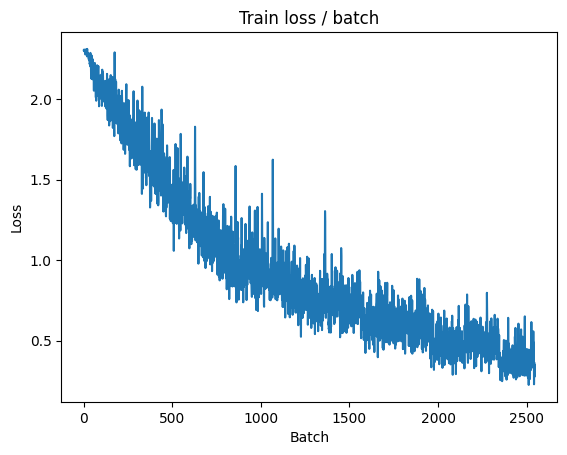


===============> Total time 90s	Avg loss 0.3864	Avg Prec@1 86.46 %	Avg Prec@5 99.63 %

[EVAL Batch 000/079]	Time 0.499s (0.499s)	Loss 0.6670 (0.6670)	Prec@1  79.7 ( 79.7)	Prec@5  98.4 ( 98.4)

===============> Total time 21s	Avg loss 0.7435	Avg Prec@1 76.03 %	Avg Prec@5 98.59 %



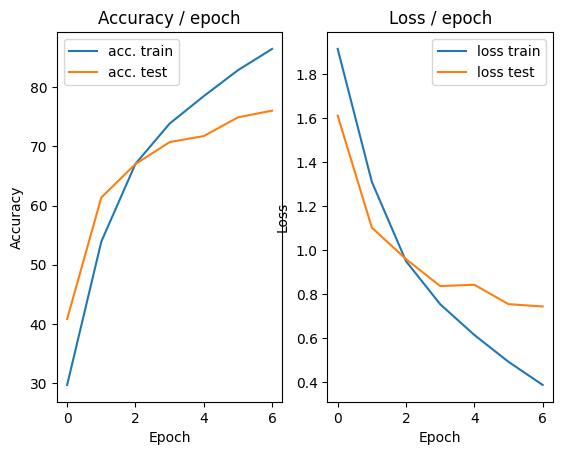

=== EPOCH 8 =====

[TRAIN Batch 000/391]	Time 0.528s (0.528s)	Loss 0.4043 (0.4043)	Prec@1  84.4 ( 84.4)	Prec@5 100.0 (100.0)


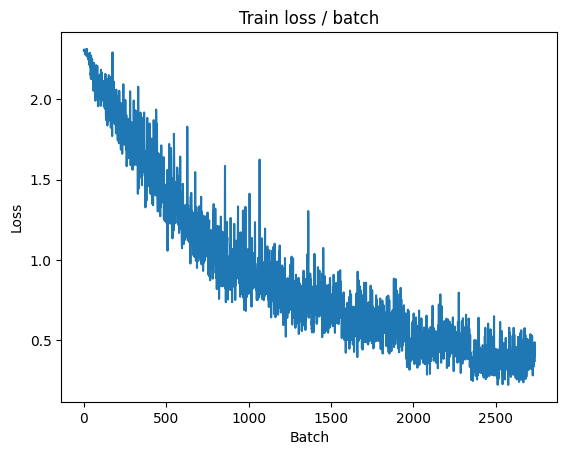

[TRAIN Batch 200/391]	Time 0.012s (0.283s)	Loss 0.2716 (0.2816)	Prec@1  87.5 ( 90.2)	Prec@5 100.0 ( 99.8)


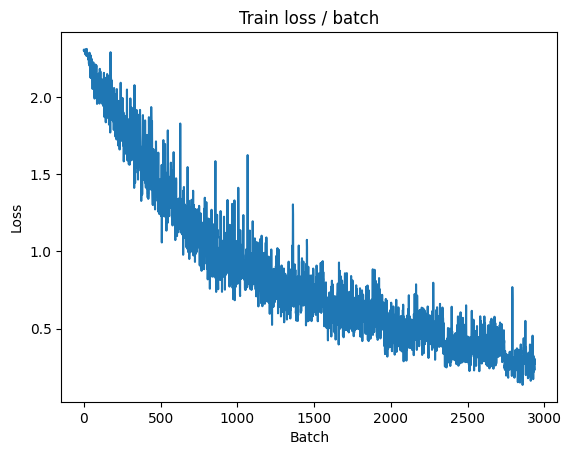


===============> Total time 109s	Avg loss 0.2886	Avg Prec@1 89.95 %	Avg Prec@5 99.81 %

[EVAL Batch 000/079]	Time 0.578s (0.578s)	Loss 0.6429 (0.6429)	Prec@1  81.2 ( 81.2)	Prec@5  98.4 ( 98.4)

===============> Total time 19s	Avg loss 0.7439	Avg Prec@1 77.59 %	Avg Prec@5 98.66 %



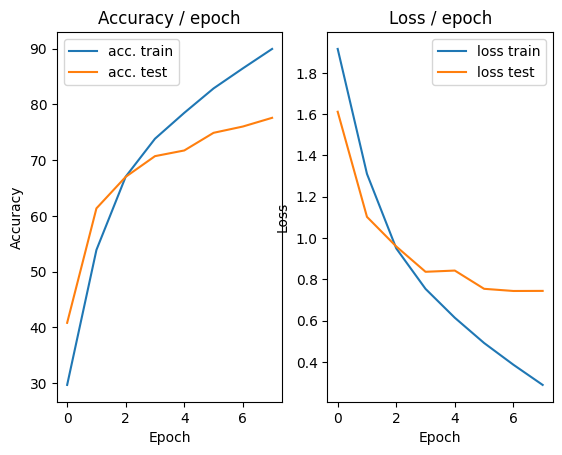

=== EPOCH 9 =====

[TRAIN Batch 000/391]	Time 0.622s (0.622s)	Loss 0.1766 (0.1766)	Prec@1  94.5 ( 94.5)	Prec@5  99.2 ( 99.2)


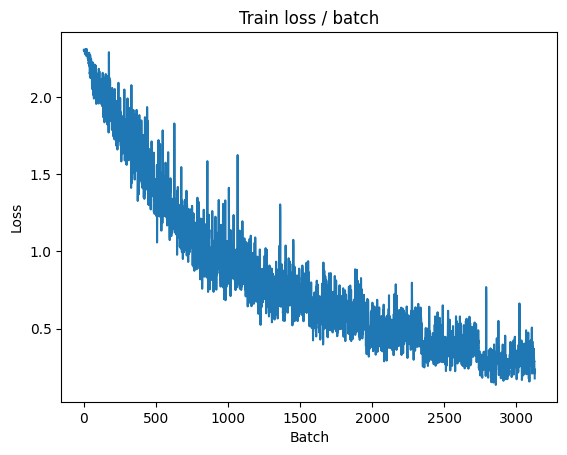

[TRAIN Batch 200/391]	Time 0.025s (0.247s)	Loss 0.1954 (0.1720)	Prec@1  93.0 ( 94.4)	Prec@5 100.0 ( 99.9)


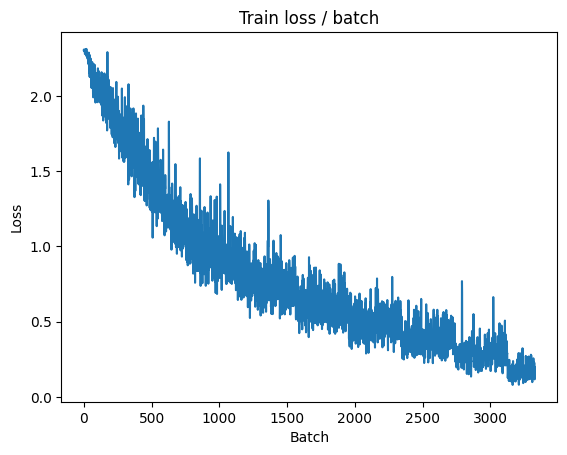


===============> Total time 101s	Avg loss 0.1897	Avg Prec@1 93.68 %	Avg Prec@5 99.93 %

[EVAL Batch 000/079]	Time 0.890s (0.890s)	Loss 0.7936 (0.7936)	Prec@1  80.5 ( 80.5)	Prec@5  98.4 ( 98.4)

===============> Total time 20s	Avg loss 0.8667	Avg Prec@1 76.78 %	Avg Prec@5 98.50 %



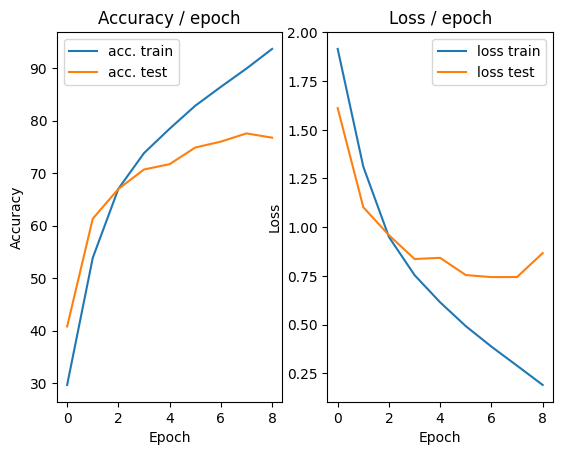

=== EPOCH 10 =====

[TRAIN Batch 000/391]	Time 0.828s (0.828s)	Loss 0.1973 (0.1973)	Prec@1  93.0 ( 93.0)	Prec@5 100.0 (100.0)


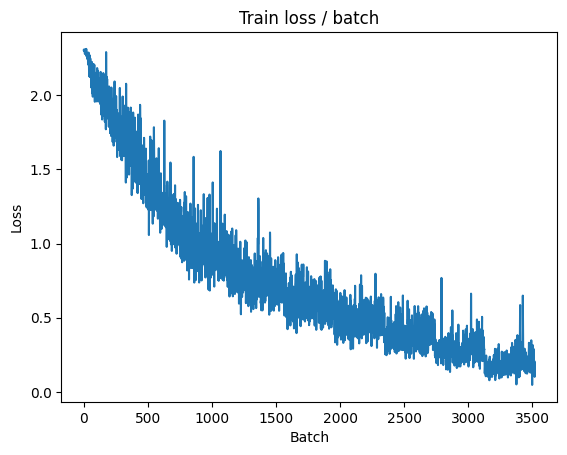

[TRAIN Batch 200/391]	Time 0.080s (0.219s)	Loss 0.0906 (0.1083)	Prec@1  96.1 ( 96.6)	Prec@5 100.0 (100.0)


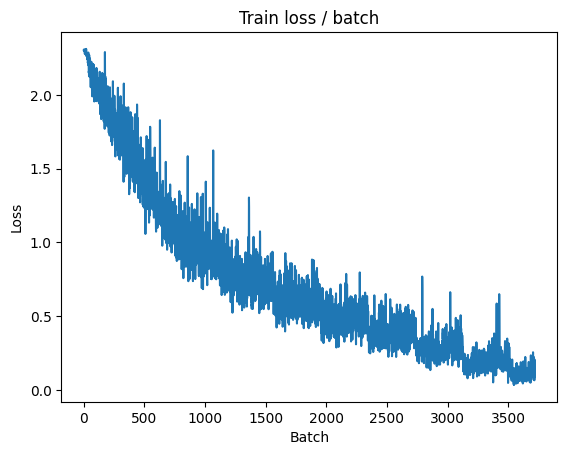


===============> Total time 97s	Avg loss 0.1223	Avg Prec@1 96.02 %	Avg Prec@5 99.98 %

[EVAL Batch 000/079]	Time 0.571s (0.571s)	Loss 0.7893 (0.7893)	Prec@1  78.1 ( 78.1)	Prec@5  98.4 ( 98.4)

===============> Total time 17s	Avg loss 0.8545	Avg Prec@1 78.90 %	Avg Prec@5 98.60 %



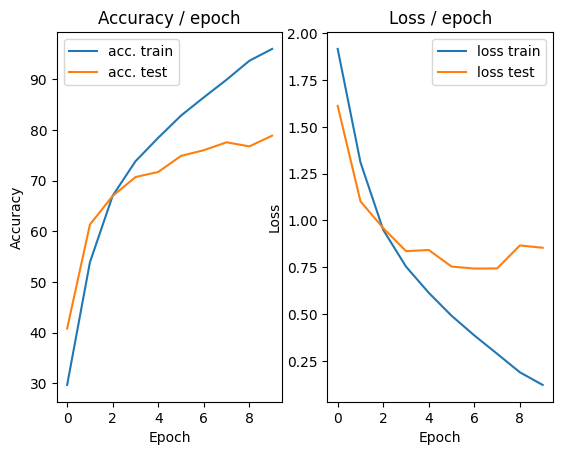

=== EPOCH 11 =====

[TRAIN Batch 000/391]	Time 0.598s (0.598s)	Loss 0.0624 (0.0624)	Prec@1  96.9 ( 96.9)	Prec@5 100.0 (100.0)


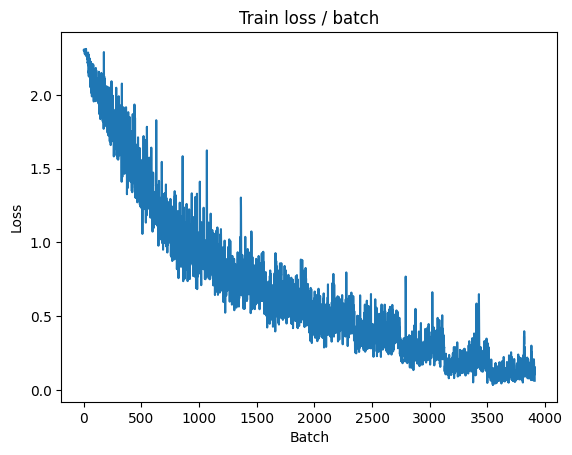

[TRAIN Batch 200/391]	Time 0.416s (0.240s)	Loss 0.1726 (0.0668)	Prec@1  93.8 ( 98.0)	Prec@5 100.0 (100.0)


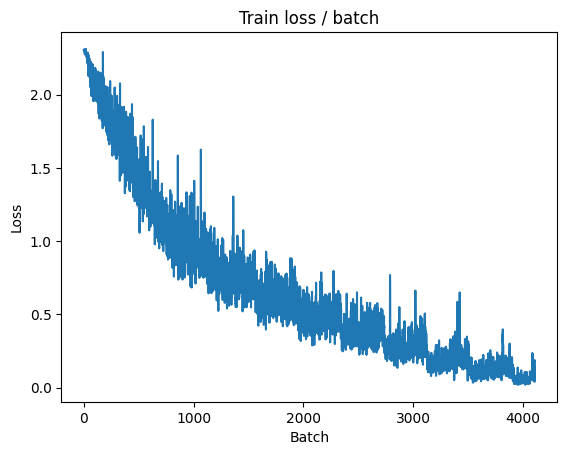


===============> Total time 91s	Avg loss 0.0780	Avg Prec@1 97.57 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.530s (0.530s)	Loss 0.7758 (0.7758)	Prec@1  84.4 ( 84.4)	Prec@5  98.4 ( 98.4)

===============> Total time 17s	Avg loss 1.0199	Avg Prec@1 76.07 %	Avg Prec@5 98.15 %



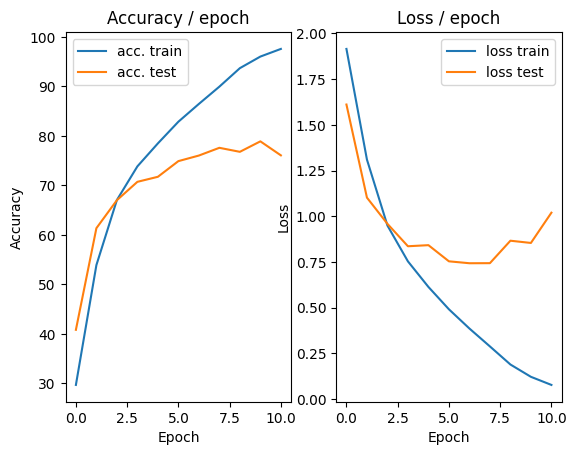

=== EPOCH 12 =====

[TRAIN Batch 000/391]	Time 0.566s (0.566s)	Loss 0.1006 (0.1006)	Prec@1  96.9 ( 96.9)	Prec@5 100.0 (100.0)


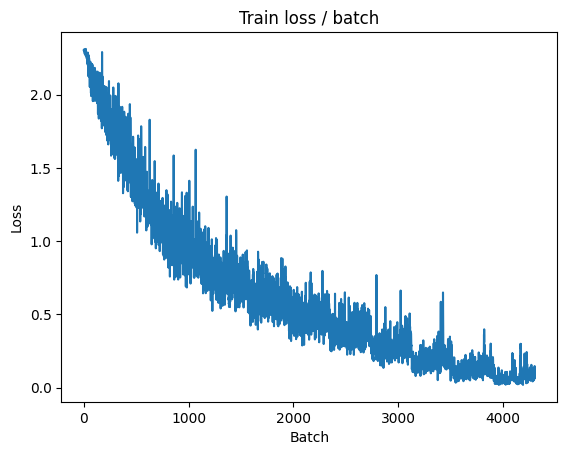

[TRAIN Batch 200/391]	Time 0.391s (0.248s)	Loss 0.0421 (0.0353)	Prec@1  98.4 ( 99.1)	Prec@5 100.0 (100.0)


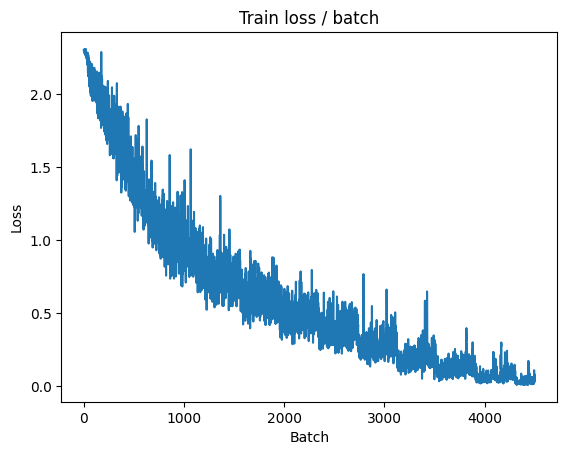


===============> Total time 91s	Avg loss 0.0368	Avg Prec@1 99.03 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.501s (0.501s)	Loss 0.8940 (0.8940)	Prec@1  80.5 ( 80.5)	Prec@5  98.4 ( 98.4)

===============> Total time 17s	Avg loss 1.1251	Avg Prec@1 78.32 %	Avg Prec@5 98.54 %



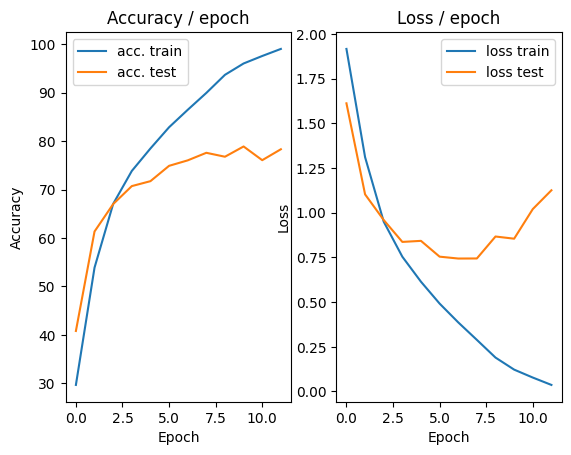

=== EPOCH 13 =====

[TRAIN Batch 000/391]	Time 0.530s (0.530s)	Loss 0.1233 (0.1233)	Prec@1  96.9 ( 96.9)	Prec@5 100.0 (100.0)


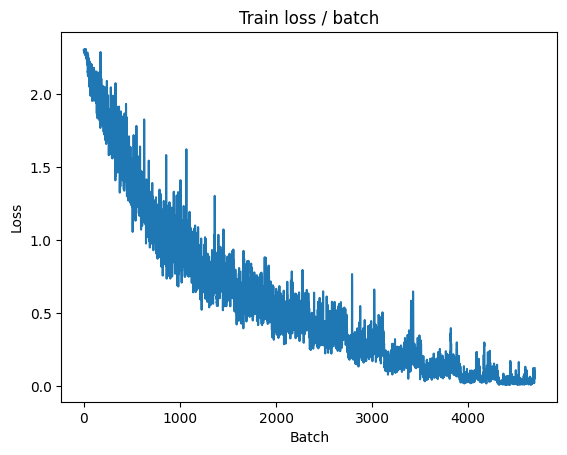

[TRAIN Batch 200/391]	Time 0.377s (0.217s)	Loss 0.0055 (0.0171)	Prec@1 100.0 ( 99.7)	Prec@5 100.0 (100.0)


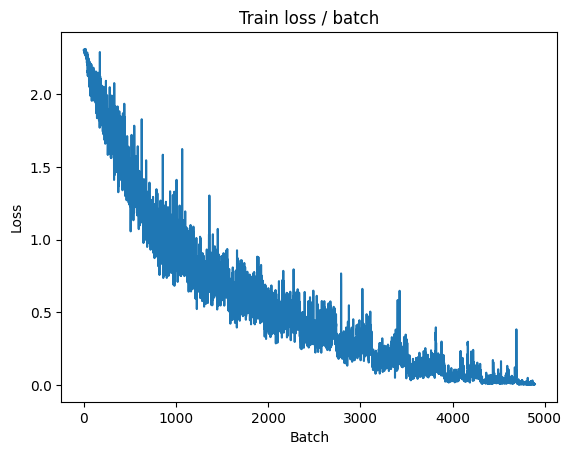


===============> Total time 84s	Avg loss 0.0208	Avg Prec@1 99.50 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.475s (0.475s)	Loss 1.5840 (1.5840)	Prec@1  74.2 ( 74.2)	Prec@5  97.7 ( 97.7)

===============> Total time 16s	Avg loss 1.3511	Avg Prec@1 75.40 %	Avg Prec@5 97.67 %



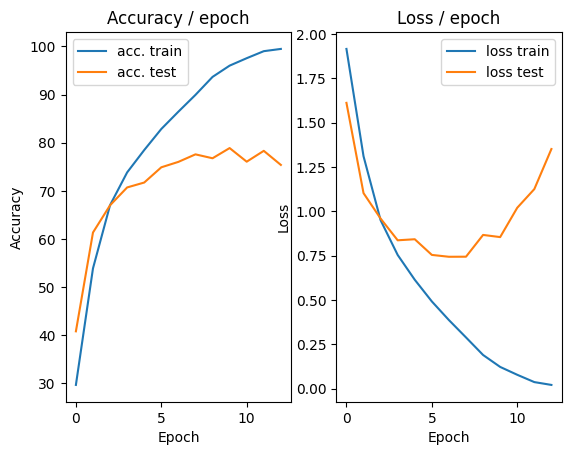

=== EPOCH 14 =====

[TRAIN Batch 000/391]	Time 0.498s (0.498s)	Loss 0.0719 (0.0719)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)


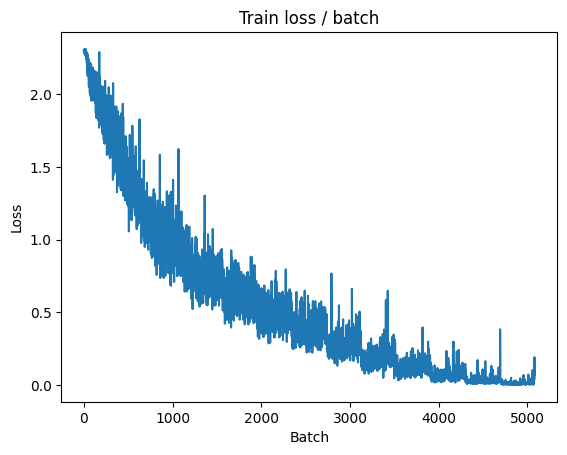

[TRAIN Batch 200/391]	Time 0.011s (0.206s)	Loss 0.0243 (0.0276)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)


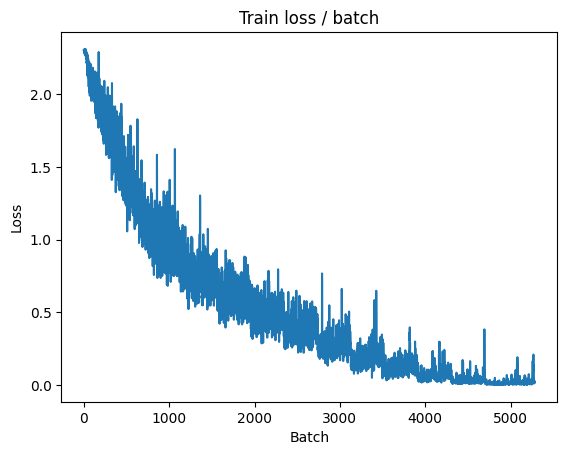


===============> Total time 84s	Avg loss 0.0375	Avg Prec@1 98.92 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.864s (0.864s)	Loss 0.9355 (0.9355)	Prec@1  83.6 ( 83.6)	Prec@5  98.4 ( 98.4)

===============> Total time 19s	Avg loss 1.1271	Avg Prec@1 79.36 %	Avg Prec@5 98.51 %



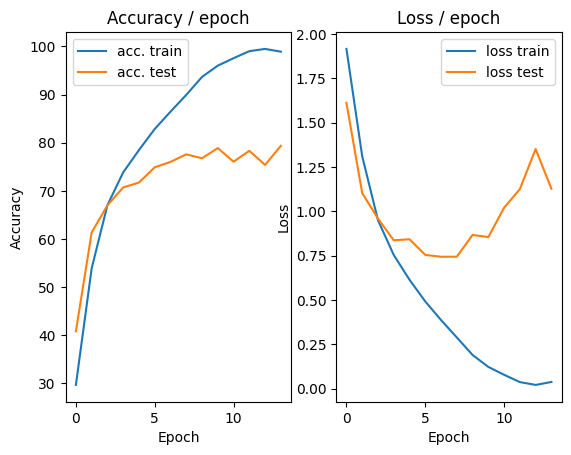

=== EPOCH 15 =====

[TRAIN Batch 000/391]	Time 0.558s (0.558s)	Loss 0.0103 (0.0103)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)


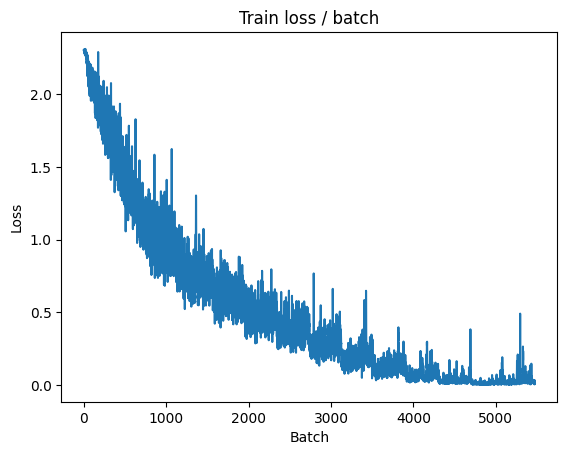

[TRAIN Batch 200/391]	Time 0.374s (0.231s)	Loss 0.0303 (0.0098)	Prec@1  99.2 ( 99.8)	Prec@5 100.0 (100.0)


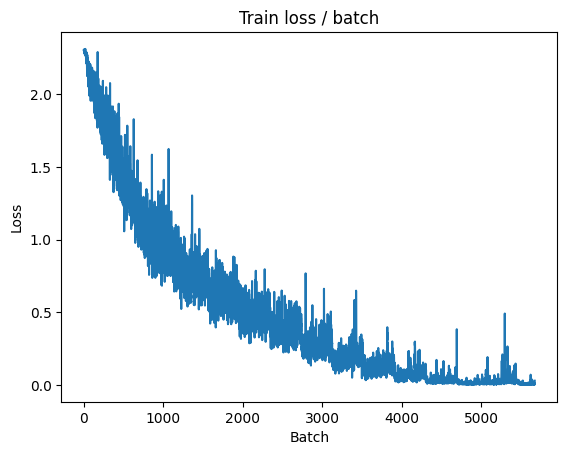


===============> Total time 90s	Avg loss 0.0091	Avg Prec@1 99.83 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.499s (0.499s)	Loss 0.8840 (0.8840)	Prec@1  82.8 ( 82.8)	Prec@5  98.4 ( 98.4)

===============> Total time 17s	Avg loss 1.2304	Avg Prec@1 79.04 %	Avg Prec@5 98.55 %



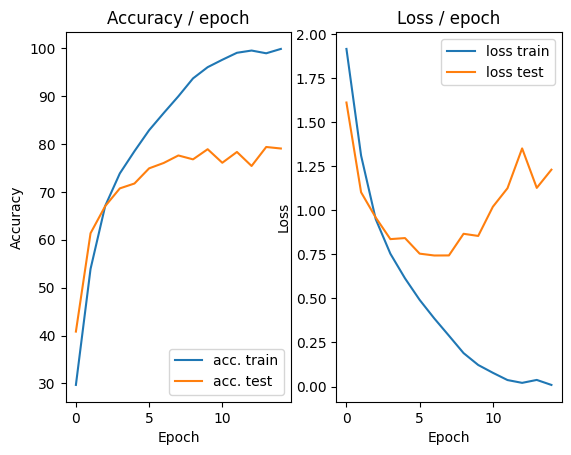

In [ ]:
main(128, 0.1, cuda = True)

## Increase in the number of training examples by data increase


In [ ]:
class ConvNet(nn.Module):
    """
    This class defines the structure of the neural network
    """

    def __init__(self):
        super(ConvNet, self).__init__()
        # We first define the convolution and pooling layers as a features extractor
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),

            nn.Conv2d(32, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2,2), stride = 2, padding=0),

            nn.Conv2d(64, 128, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            #Modification of the pool3 layer to add the option ceil_mode
            nn.MaxPool2d((2, 2), stride=2, padding=0, ceil_mode=True),
        )
        # We then define fully connected layers as a classifier
        self.classifier = nn.Sequential(
            nn.Linear(128*4*4, 1000),
            nn.ReLU(),
            nn.Linear(1000, 10)
            # Reminder: The softmax is included in the loss, do not put it here
        )

    # Method called when we apply the network to an input batch
    def forward(self, input):
        bsize = input.size(0) # batch size
        output = self.features(input) # output of the conv layers
        output = output.view(bsize, -1) # we flatten the 2D feature maps into one 1D vector for each input
        output = self.classifier(output) # we compute the output of the fc layers
        return output


def get_dataset(batch_size, cuda=False):

    """
    This function loads the dataset and performs transformations on each
    image (listed in `transform = ...`).

    """
    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.ToTensor(), #Transform the PIL image to a torch tensor,
            #Adding Normalisation
            transforms.Normalize(
                mean = [0.491, 0.482, 0.447],
                std = [0.202, 0.199, 0.201]
            ),
            #A random crop of size 28 × 28 pixels
            transforms.transforms.RandomCrop(28),
            #A random horizontal symmetry of the image
            transforms.transforms.RandomHorizontalFlip()
        ]))
    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.ToTensor(),
            #Adding Normalisation
            transforms.Normalize(
                mean = [0.491, 0.482, 0.447],
                std = [0.202, 0.199, 0.201]
            ),
            #A centered crop size 28 in test
            transforms.transforms.CenterCrop(28)
        ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader



def epoch(data, model, criterion, optimizer=None, cuda=False):
    """
    Make a pass (called epoch in English) on the data `data` with the
     model `model`. Evaluates `criterion` as loss.
     If `optimizer` is given, perform a training epoch using
     the given optimizer, otherwise, perform an evaluation epoch (no backward)
     of the model.
    """

    # indicates whether the model is in eval or train mode (some layers behave differently in train and eval)
    model.eval() if optimizer is None else model.train()

    # objects to store metric averages
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # we iterate on the batches
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # only with GPU, and not with CPU
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward if we are training
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # compute metrics
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # update
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # print info
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Print summary
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss


def main(batch_size=128, lr=0.1, epochs=15, cuda=False):

    # ex :
    #   {"batch_size": 128, "epochs": 5, "lr": 0.1}

    # define model, loss, optim
    model = ConvNet()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr)

    if cuda: # only with GPU, and not with CPU
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # Get the data
    train, test = get_dataset(batch_size, cuda)

    # init plots
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # We iterate on the epochs
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
        # Train phase
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        # Test phase
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
        # plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)

Files already downloaded and verified
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.387s (0.387s)	Loss 2.3079 (2.3079)	Prec@1   8.6 (  8.6)	Prec@5  45.3 ( 45.3)


<Figure size 640x480 with 0 Axes>

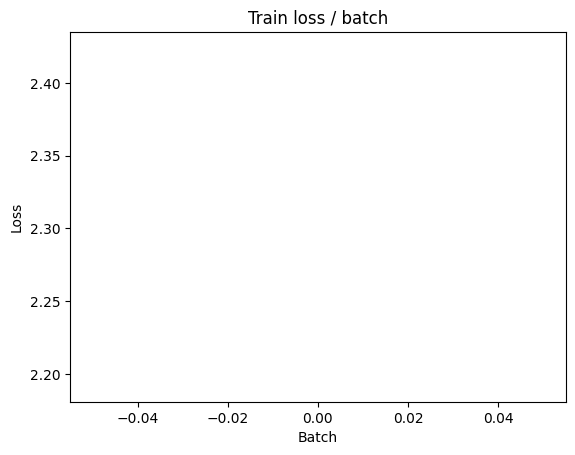

[TRAIN Batch 200/391]	Time 0.017s (0.051s)	Loss 1.7126 (1.9643)	Prec@1  41.4 ( 28.5)	Prec@5  90.6 ( 78.7)


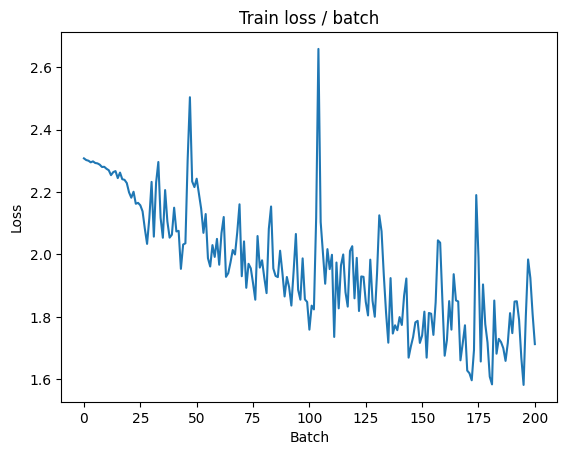


===============> Total time 19s	Avg loss 1.8012	Avg Prec@1 34.67 %	Avg Prec@5 84.00 %

[EVAL Batch 000/079]	Time 0.143s (0.143s)	Loss 1.7393 (1.7393)	Prec@1  42.2 ( 42.2)	Prec@5  89.8 ( 89.8)

===============> Total time 2s	Avg loss 1.6275	Avg Prec@1 41.08 %	Avg Prec@5 91.57 %



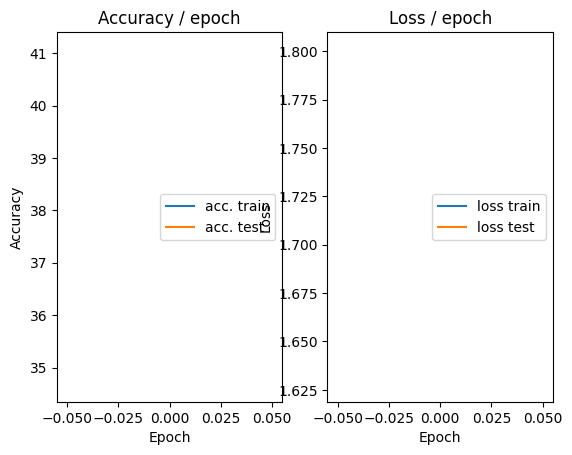

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.192s (0.192s)	Loss 1.7146 (1.7146)	Prec@1  33.6 ( 33.6)	Prec@5  93.0 ( 93.0)


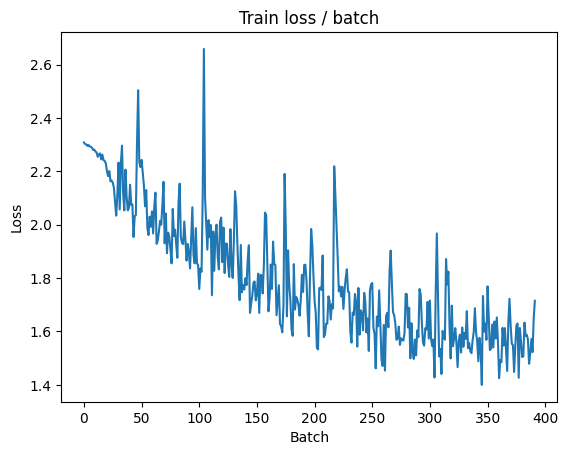

[TRAIN Batch 200/391]	Time 0.085s (0.051s)	Loss 1.2424 (1.4646)	Prec@1  53.9 ( 47.7)	Prec@5  96.1 ( 92.4)


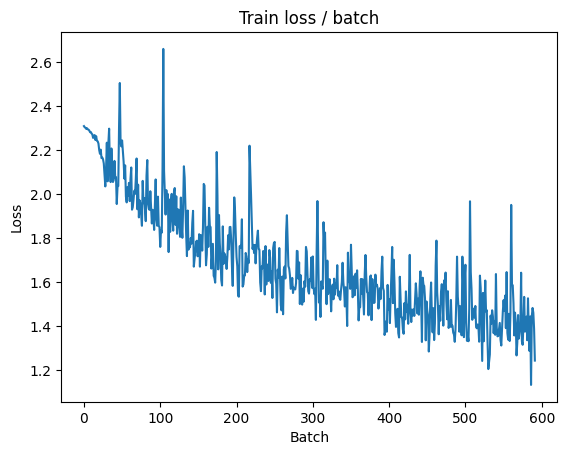


===============> Total time 19s	Avg loss 1.4024	Avg Prec@1 50.07 %	Avg Prec@5 93.03 %

[EVAL Batch 000/079]	Time 0.144s (0.144s)	Loss 1.3295 (1.3295)	Prec@1  50.8 ( 50.8)	Prec@5  94.5 ( 94.5)

===============> Total time 3s	Avg loss 1.2946	Avg Prec@1 53.00 %	Avg Prec@5 94.79 %



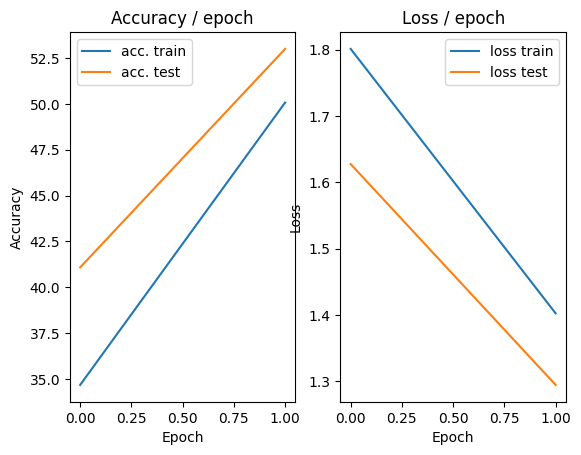

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.191s (0.191s)	Loss 1.2755 (1.2755)	Prec@1  54.7 ( 54.7)	Prec@5  93.8 ( 93.8)


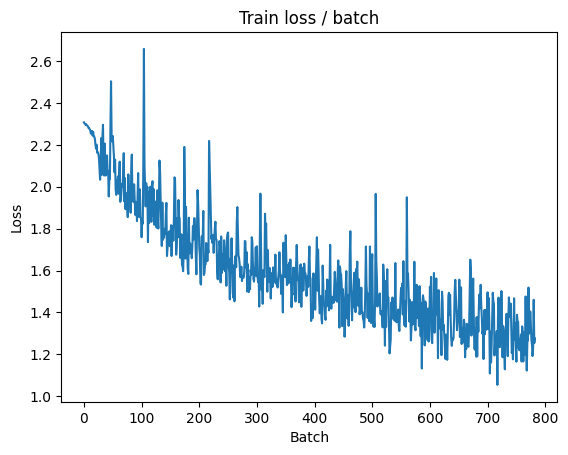

[TRAIN Batch 200/391]	Time 0.020s (0.052s)	Loss 1.2348 (1.2234)	Prec@1  57.8 ( 56.8)	Prec@5  96.1 ( 95.0)


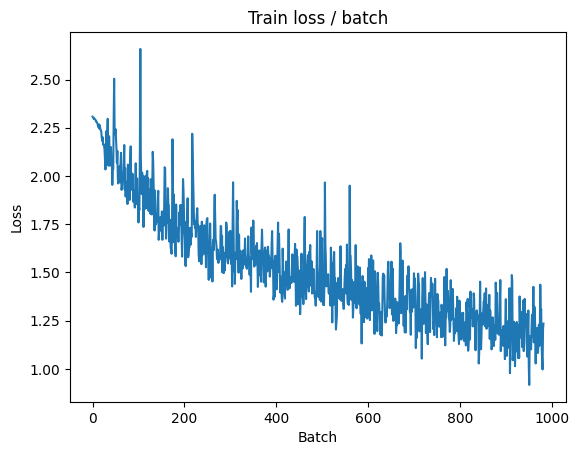


===============> Total time 19s	Avg loss 1.1804	Avg Prec@1 58.53 %	Avg Prec@5 95.34 %

[EVAL Batch 000/079]	Time 0.234s (0.234s)	Loss 1.1060 (1.1060)	Prec@1  62.5 ( 62.5)	Prec@5  95.3 ( 95.3)

===============> Total time 4s	Avg loss 1.0692	Avg Prec@1 62.26 %	Avg Prec@5 96.27 %



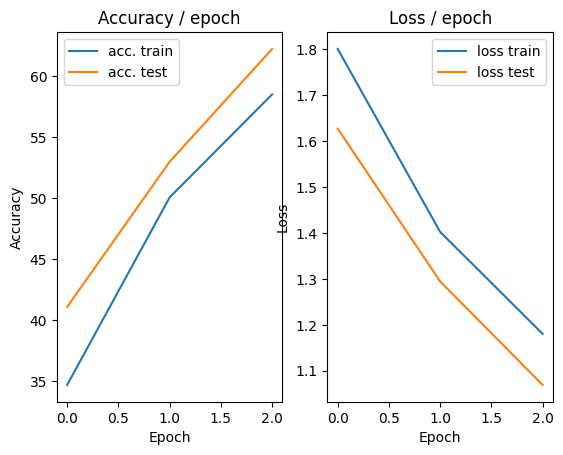

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.200s (0.200s)	Loss 1.0713 (1.0713)	Prec@1  61.7 ( 61.7)	Prec@5  98.4 ( 98.4)


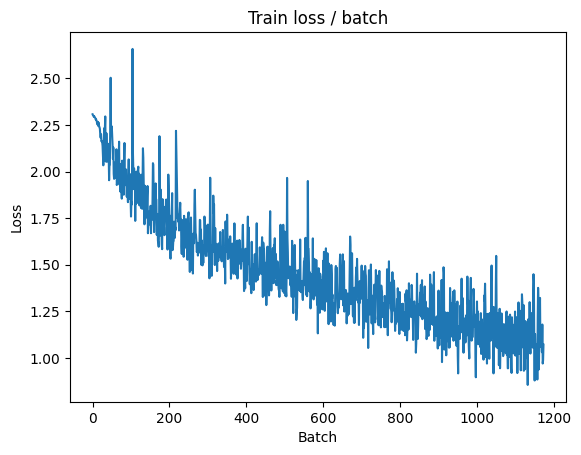

[TRAIN Batch 200/391]	Time 0.133s (0.051s)	Loss 1.0332 (1.0504)	Prec@1  63.3 ( 63.6)	Prec@5  93.8 ( 96.3)


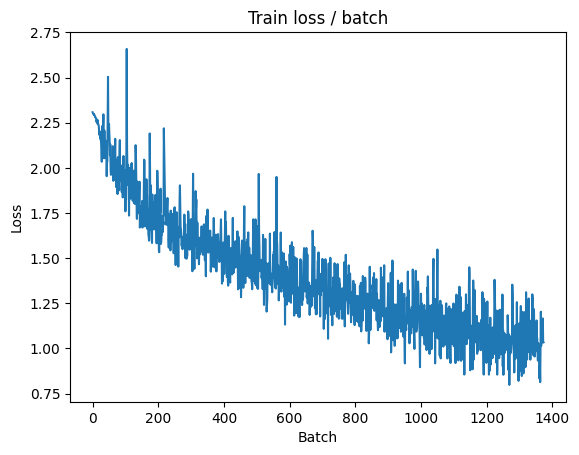


===============> Total time 18s	Avg loss 1.0156	Avg Prec@1 64.87 %	Avg Prec@5 96.60 %

[EVAL Batch 000/079]	Time 0.170s (0.170s)	Loss 1.1397 (1.1397)	Prec@1  65.6 ( 65.6)	Prec@5  97.7 ( 97.7)

===============> Total time 3s	Avg loss 1.1082	Avg Prec@1 62.66 %	Avg Prec@5 95.83 %



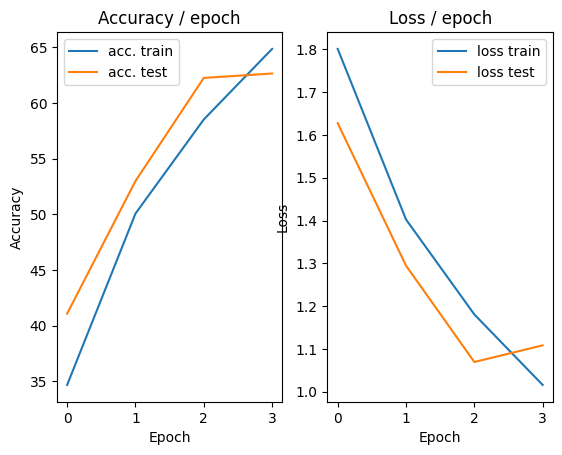

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.309s (0.309s)	Loss 1.1005 (1.1005)	Prec@1  62.5 ( 62.5)	Prec@5  96.9 ( 96.9)


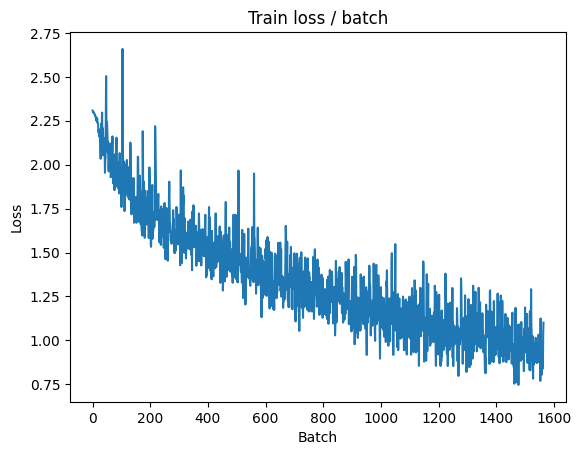

[TRAIN Batch 200/391]	Time 0.016s (0.048s)	Loss 0.7262 (0.9054)	Prec@1  75.8 ( 68.8)	Prec@5  98.4 ( 97.3)


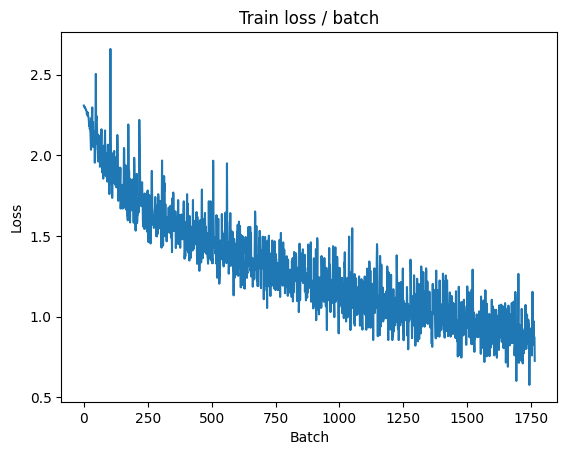


===============> Total time 19s	Avg loss 0.8991	Avg Prec@1 68.68 %	Avg Prec@5 97.31 %

[EVAL Batch 000/079]	Time 0.152s (0.152s)	Loss 0.9668 (0.9668)	Prec@1  68.0 ( 68.0)	Prec@5 100.0 (100.0)

===============> Total time 2s	Avg loss 0.9384	Avg Prec@1 67.87 %	Avg Prec@5 96.69 %



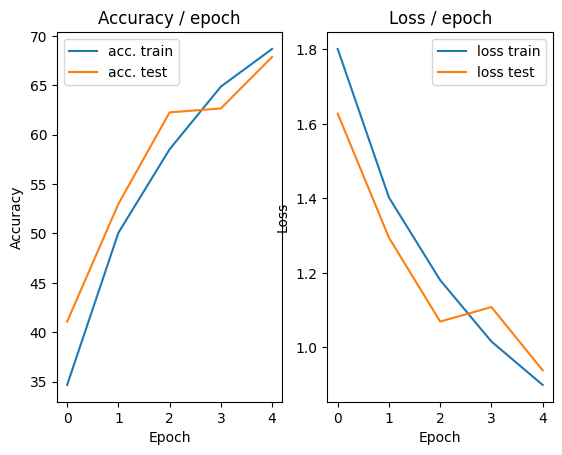

=== EPOCH 6 =====

[TRAIN Batch 000/391]	Time 0.210s (0.210s)	Loss 0.7528 (0.7528)	Prec@1  77.3 ( 77.3)	Prec@5  97.7 ( 97.7)


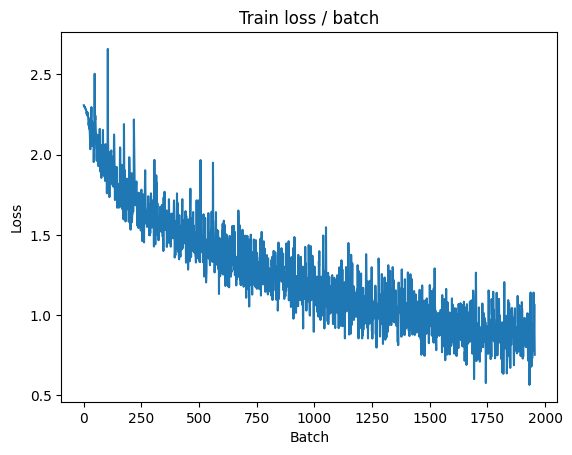

[TRAIN Batch 200/391]	Time 0.054s (0.052s)	Loss 0.8407 (0.8219)	Prec@1  71.9 ( 71.3)	Prec@5  99.2 ( 97.9)


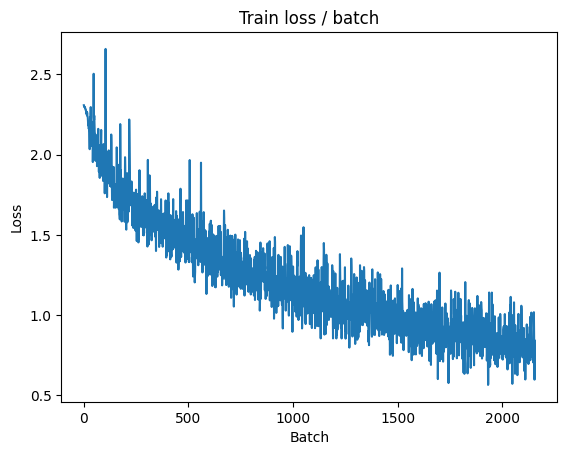


===============> Total time 20s	Avg loss 0.8080	Avg Prec@1 71.96 %	Avg Prec@5 97.98 %

[EVAL Batch 000/079]	Time 0.151s (0.151s)	Loss 0.9220 (0.9220)	Prec@1  73.4 ( 73.4)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.8513	Avg Prec@1 70.76 %	Avg Prec@5 97.61 %



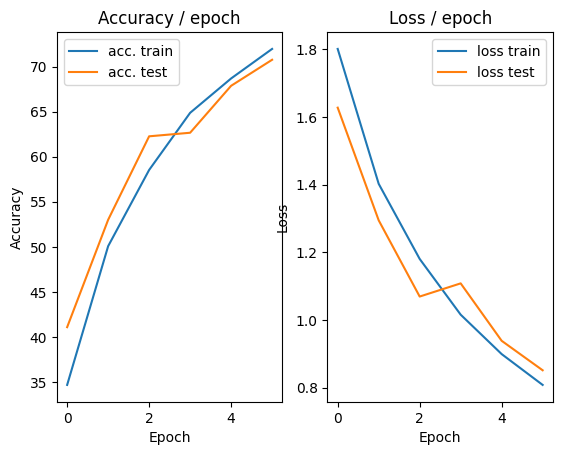

=== EPOCH 7 =====

[TRAIN Batch 000/391]	Time 0.201s (0.201s)	Loss 0.6606 (0.6606)	Prec@1  75.8 ( 75.8)	Prec@5  99.2 ( 99.2)


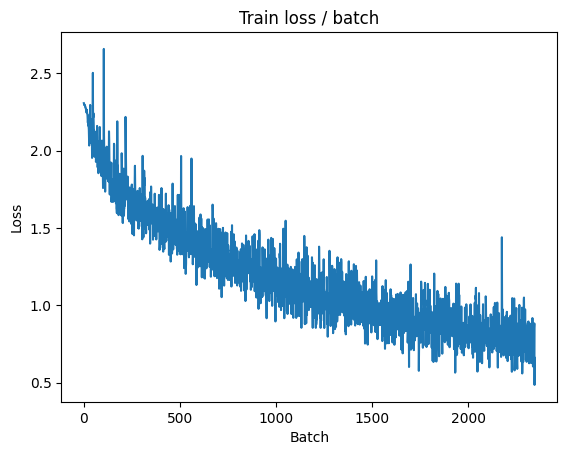

[TRAIN Batch 200/391]	Time 0.079s (0.053s)	Loss 0.6269 (0.7424)	Prec@1  82.8 ( 74.0)	Prec@5  99.2 ( 98.4)


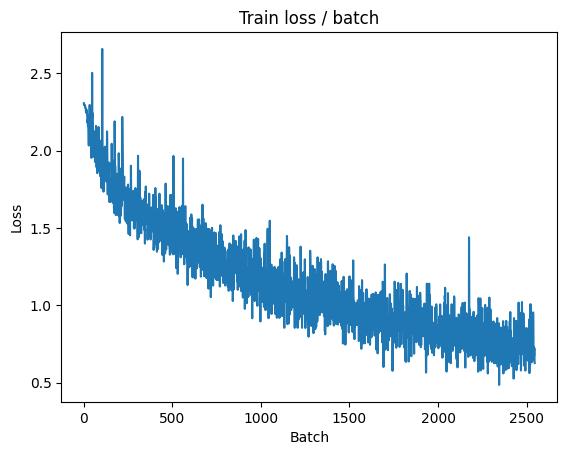


===============> Total time 20s	Avg loss 0.7393	Avg Prec@1 74.38 %	Avg Prec@5 98.24 %

[EVAL Batch 000/079]	Time 0.157s (0.157s)	Loss 0.9164 (0.9164)	Prec@1  68.8 ( 68.8)	Prec@5  95.3 ( 95.3)

===============> Total time 2s	Avg loss 0.9048	Avg Prec@1 68.96 %	Avg Prec@5 97.21 %



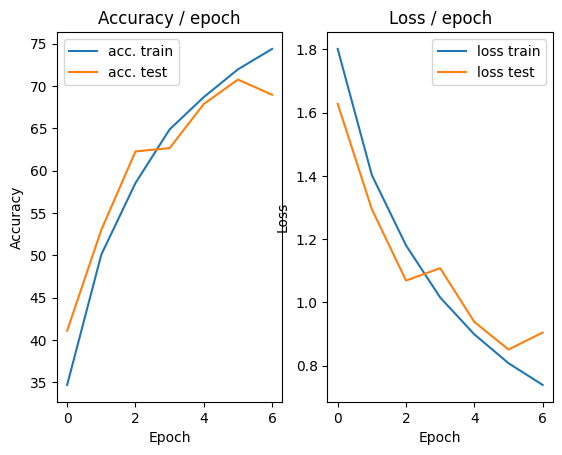

=== EPOCH 8 =====

[TRAIN Batch 000/391]	Time 0.185s (0.185s)	Loss 0.8593 (0.8593)	Prec@1  72.7 ( 72.7)	Prec@5  97.7 ( 97.7)


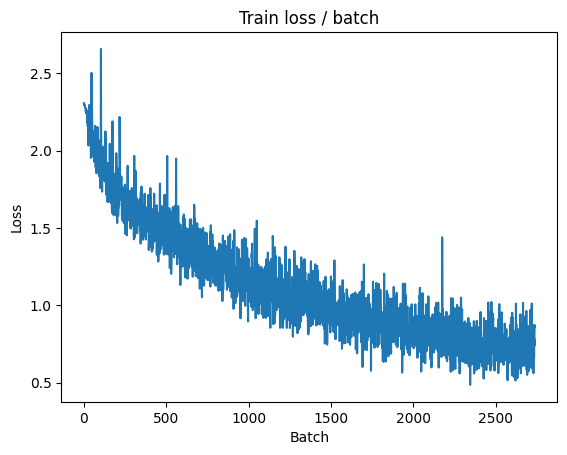

[TRAIN Batch 200/391]	Time 0.062s (0.052s)	Loss 0.6061 (0.6865)	Prec@1  72.7 ( 75.9)	Prec@5  98.4 ( 98.4)


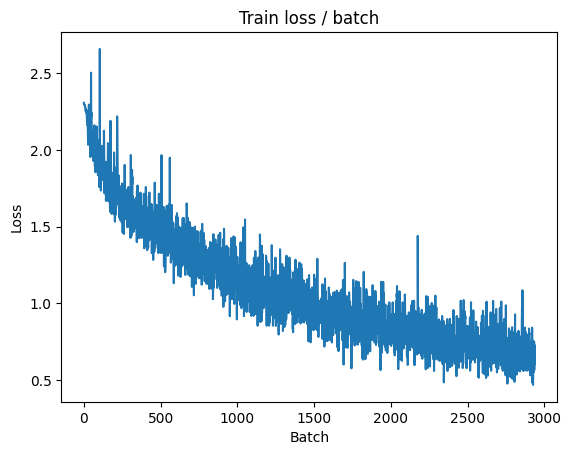


===============> Total time 19s	Avg loss 0.6853	Avg Prec@1 76.09 %	Avg Prec@5 98.43 %

[EVAL Batch 000/079]	Time 0.239s (0.239s)	Loss 0.6966 (0.6966)	Prec@1  76.6 ( 76.6)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.7479	Avg Prec@1 74.67 %	Avg Prec@5 98.07 %



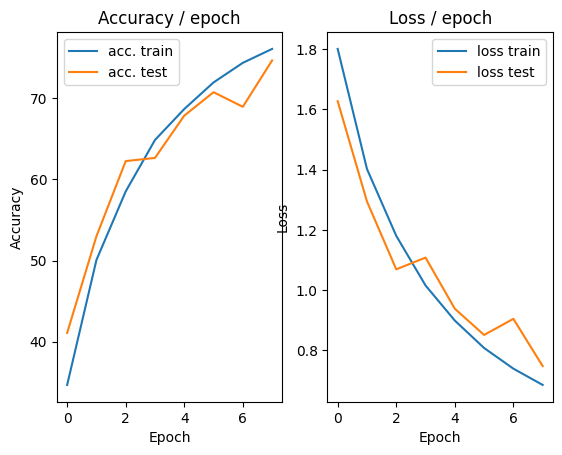

=== EPOCH 9 =====

[TRAIN Batch 000/391]	Time 0.190s (0.190s)	Loss 0.8283 (0.8283)	Prec@1  71.1 ( 71.1)	Prec@5  96.1 ( 96.1)


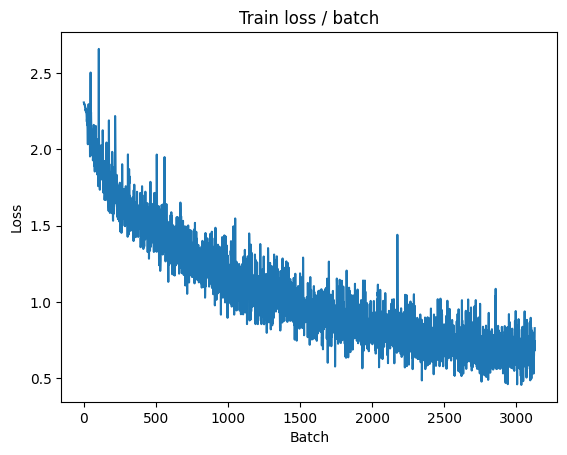

[TRAIN Batch 200/391]	Time 0.012s (0.048s)	Loss 0.7275 (0.6231)	Prec@1  70.3 ( 78.0)	Prec@5  99.2 ( 98.8)


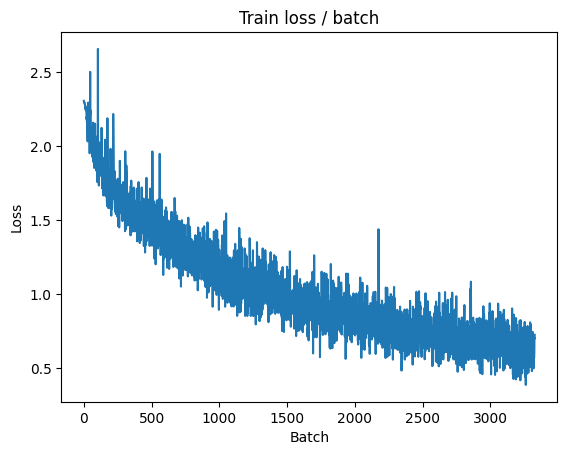


===============> Total time 18s	Avg loss 0.6287	Avg Prec@1 78.04 %	Avg Prec@5 98.73 %

[EVAL Batch 000/079]	Time 0.143s (0.143s)	Loss 0.7822 (0.7822)	Prec@1  71.9 ( 71.9)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.7480	Avg Prec@1 74.71 %	Avg Prec@5 98.03 %



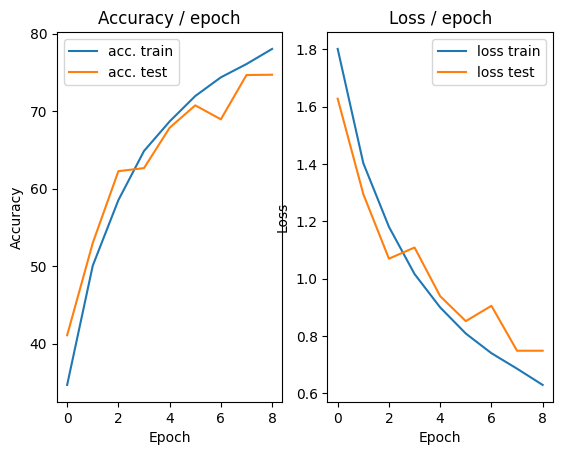

=== EPOCH 10 =====

[TRAIN Batch 000/391]	Time 0.276s (0.276s)	Loss 0.8408 (0.8408)	Prec@1  71.1 ( 71.1)	Prec@5  96.9 ( 96.9)


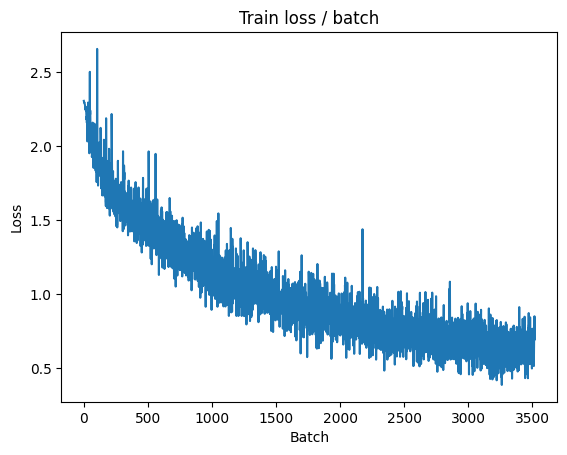

[TRAIN Batch 200/391]	Time 0.074s (0.049s)	Loss 0.7199 (0.5916)	Prec@1  75.8 ( 79.4)	Prec@5  98.4 ( 98.9)


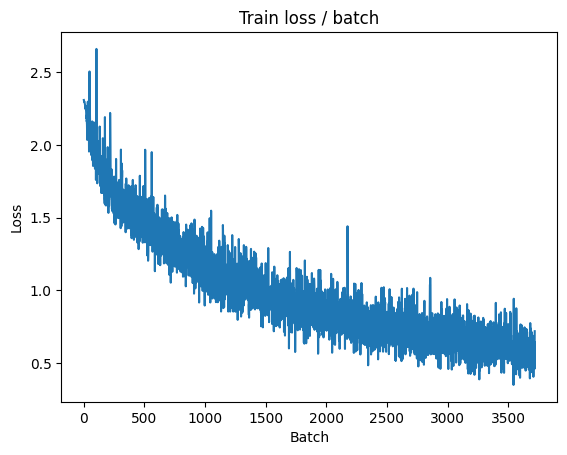


===============> Total time 19s	Avg loss 0.5910	Avg Prec@1 79.42 %	Avg Prec@5 98.91 %

[EVAL Batch 000/079]	Time 0.169s (0.169s)	Loss 0.7000 (0.7000)	Prec@1  78.1 ( 78.1)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.6894	Avg Prec@1 76.46 %	Avg Prec@5 98.30 %



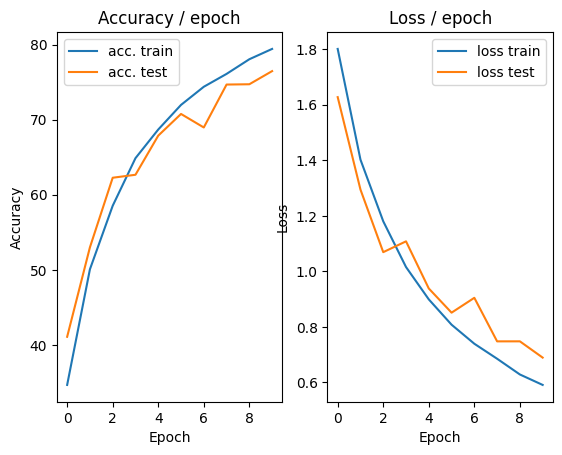

=== EPOCH 11 =====

[TRAIN Batch 000/391]	Time 0.183s (0.183s)	Loss 0.5652 (0.5652)	Prec@1  79.7 ( 79.7)	Prec@5 100.0 (100.0)


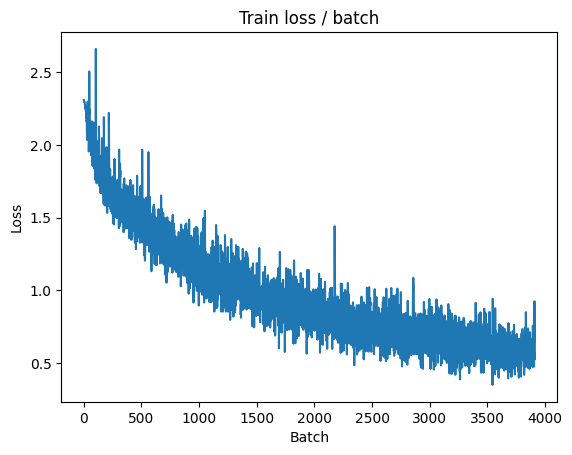

[TRAIN Batch 200/391]	Time 0.082s (0.051s)	Loss 0.3975 (0.5433)	Prec@1  89.1 ( 81.0)	Prec@5  99.2 ( 99.1)


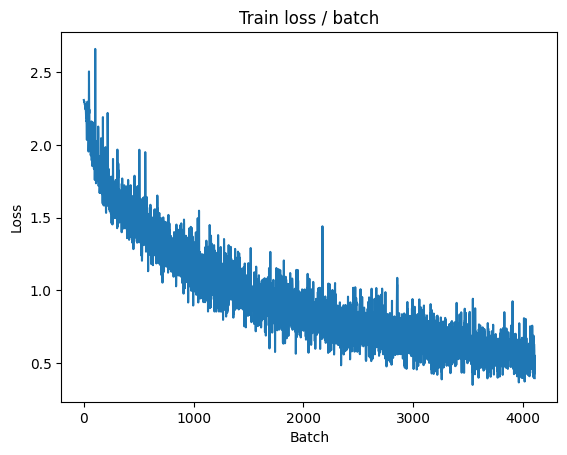


===============> Total time 19s	Avg loss 0.5495	Avg Prec@1 80.83 %	Avg Prec@5 99.07 %

[EVAL Batch 000/079]	Time 0.164s (0.164s)	Loss 0.6936 (0.6936)	Prec@1  74.2 ( 74.2)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.6914	Avg Prec@1 76.61 %	Avg Prec@5 98.55 %



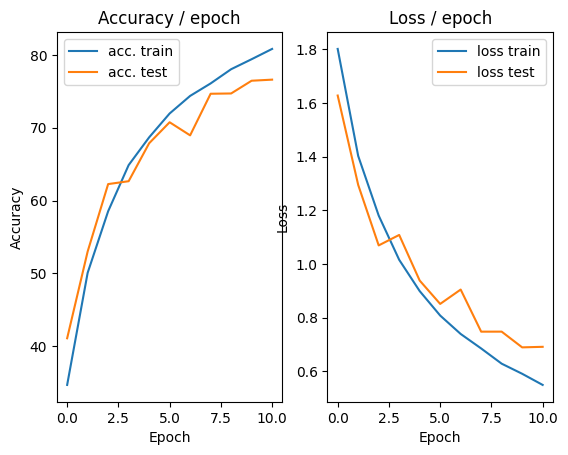

=== EPOCH 12 =====

[TRAIN Batch 000/391]	Time 0.192s (0.192s)	Loss 0.6260 (0.6260)	Prec@1  80.5 ( 80.5)	Prec@5  97.7 ( 97.7)


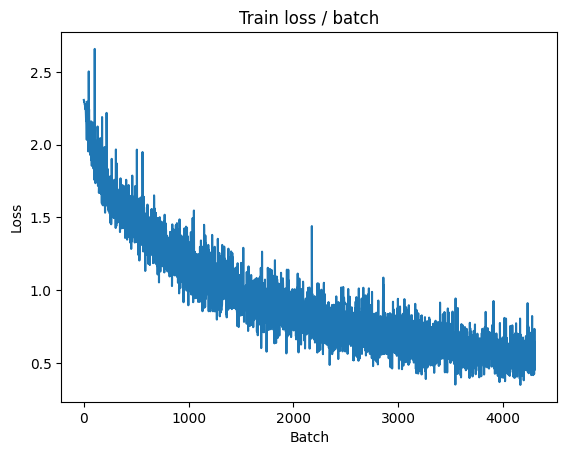

[TRAIN Batch 200/391]	Time 0.098s (0.055s)	Loss 0.4415 (0.5149)	Prec@1  85.2 ( 82.0)	Prec@5  98.4 ( 99.2)


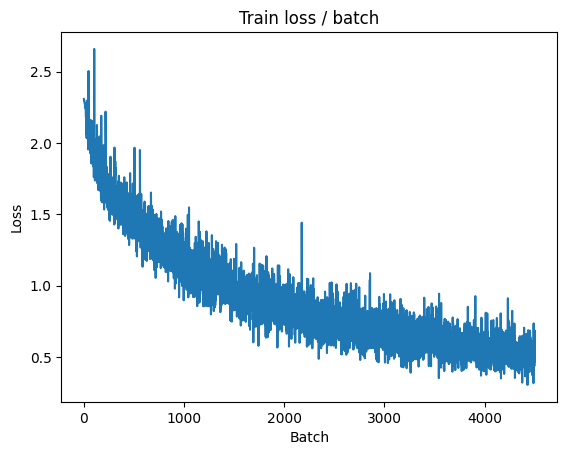


===============> Total time 19s	Avg loss 0.5179	Avg Prec@1 81.88 %	Avg Prec@5 99.21 %

[EVAL Batch 000/079]	Time 0.157s (0.157s)	Loss 0.7202 (0.7202)	Prec@1  76.6 ( 76.6)	Prec@5  99.2 ( 99.2)

===============> Total time 3s	Avg loss 0.6548	Avg Prec@1 77.82 %	Avg Prec@5 98.58 %



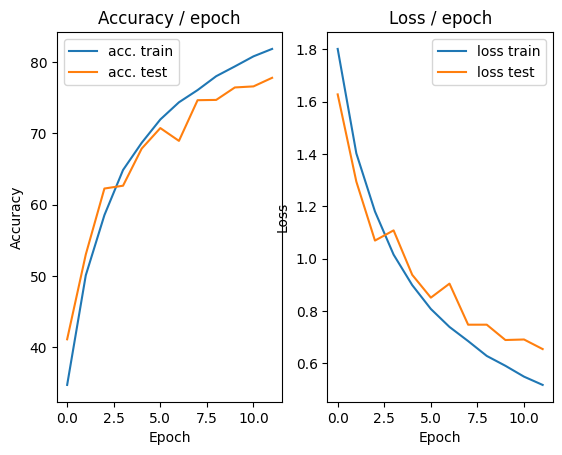

=== EPOCH 13 =====

[TRAIN Batch 000/391]	Time 0.199s (0.199s)	Loss 0.4482 (0.4482)	Prec@1  83.6 ( 83.6)	Prec@5  99.2 ( 99.2)


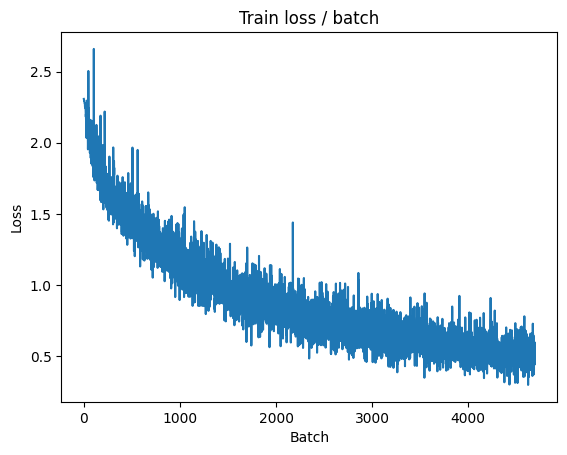

[TRAIN Batch 200/391]	Time 0.049s (0.045s)	Loss 0.5754 (0.4788)	Prec@1  76.6 ( 83.2)	Prec@5 100.0 ( 99.3)


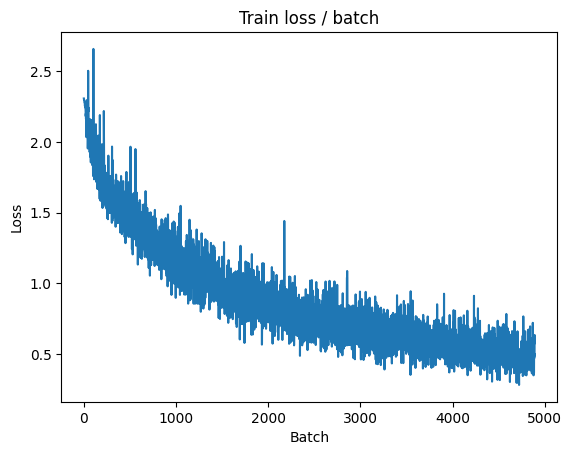


===============> Total time 18s	Avg loss 0.4883	Avg Prec@1 83.02 %	Avg Prec@5 99.28 %

[EVAL Batch 000/079]	Time 0.172s (0.172s)	Loss 0.7426 (0.7426)	Prec@1  74.2 ( 74.2)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.6479	Avg Prec@1 78.20 %	Avg Prec@5 98.67 %



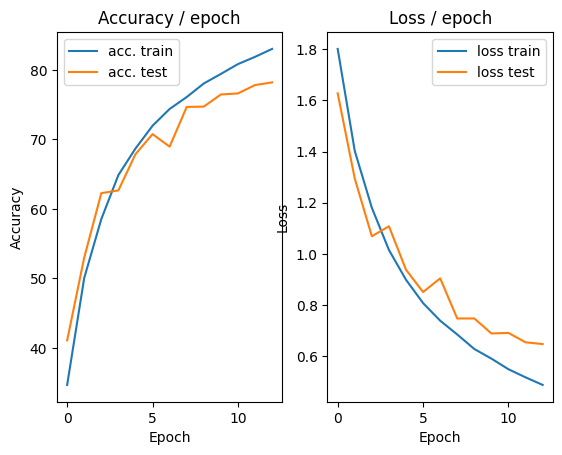

=== EPOCH 14 =====

[TRAIN Batch 000/391]	Time 0.248s (0.248s)	Loss 0.5820 (0.5820)	Prec@1  81.2 ( 81.2)	Prec@5 100.0 (100.0)


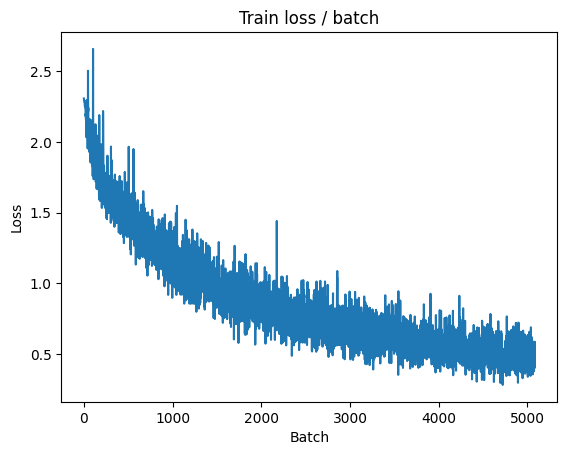

[TRAIN Batch 200/391]	Time 0.011s (0.053s)	Loss 0.4024 (0.4502)	Prec@1  85.9 ( 84.1)	Prec@5 100.0 ( 99.4)


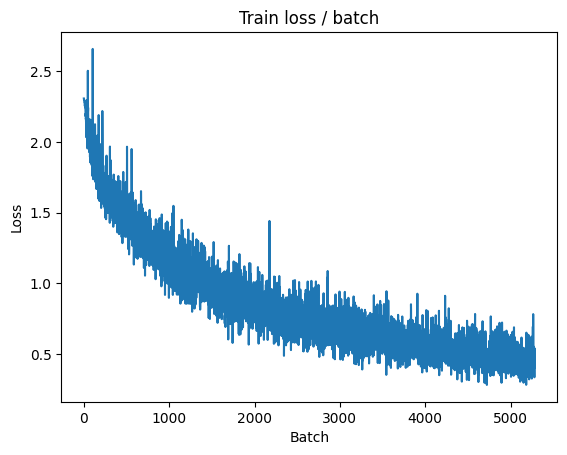


===============> Total time 20s	Avg loss 0.4559	Avg Prec@1 83.88 %	Avg Prec@5 99.43 %

[EVAL Batch 000/079]	Time 0.156s (0.156s)	Loss 0.6649 (0.6649)	Prec@1  78.9 ( 78.9)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.6627	Avg Prec@1 78.18 %	Avg Prec@5 98.48 %



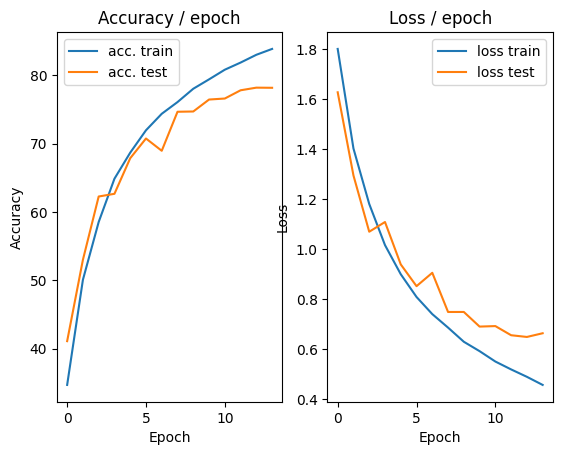

=== EPOCH 15 =====

[TRAIN Batch 000/391]	Time 0.231s (0.231s)	Loss 0.4784 (0.4784)	Prec@1  83.6 ( 83.6)	Prec@5  99.2 ( 99.2)


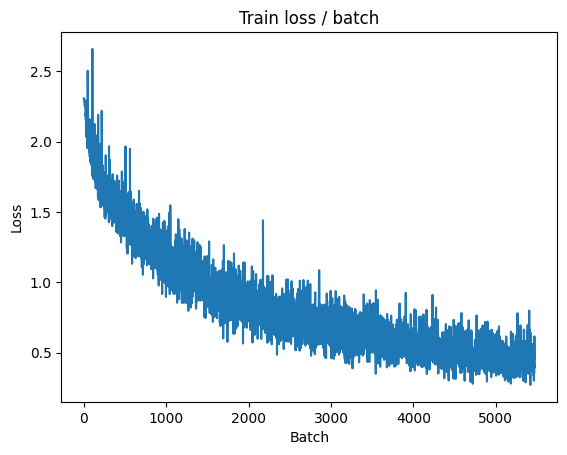

[TRAIN Batch 200/391]	Time 0.074s (0.052s)	Loss 0.5117 (0.4240)	Prec@1  89.1 ( 85.1)	Prec@5  98.4 ( 99.5)


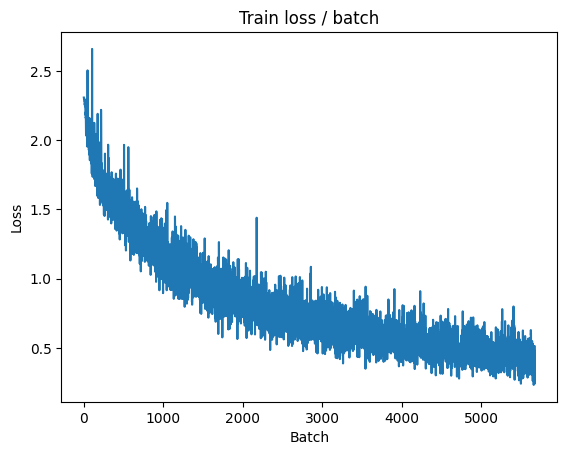


===============> Total time 20s	Avg loss 0.4283	Avg Prec@1 84.98 %	Avg Prec@5 99.50 %

[EVAL Batch 000/079]	Time 0.164s (0.164s)	Loss 0.6308 (0.6308)	Prec@1  78.1 ( 78.1)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.6648	Avg Prec@1 79.34 %	Avg Prec@5 98.62 %



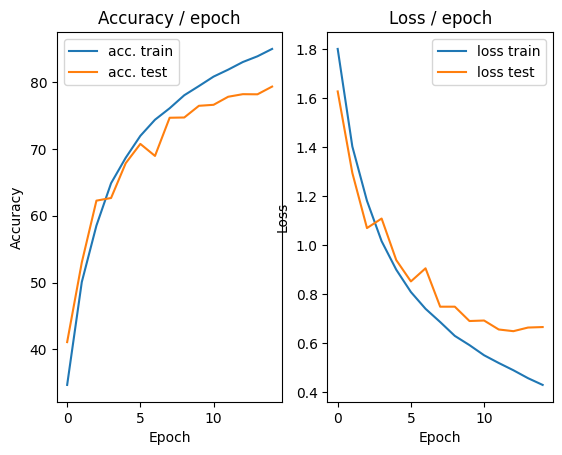

In [ ]:
main(128, 0.1, cuda=True)

### Description of the experimental results
Previous experiments showed signs of overfitting, as the training loss began to increase after several epochs. However, with data augmentation, the validation loss remained more stable and decreased consistently across epochs, demonstrating improved generalization. Additionally, an increase in accuracy was observed compared to previous cases, indicating that the model benefited from the augmented training set.

## Others techniques of data augmentation

In [7]:
class ConvNet(nn.Module):
    """
    This class defines the structure of the neural network
    """

    def __init__(self):
        super(ConvNet, self).__init__()
        # We first define the convolution and pooling layers as a features extractor
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),

            nn.Conv2d(32, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2,2), stride = 2, padding=0),

            nn.Conv2d(64, 128, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            #Modification of the pool3 layer to add the option ceil_mode
            nn.MaxPool2d((2, 2), stride=2, padding=0, ceil_mode=True),
        )
        # We then define fully connected layers as a classifier
        self.classifier = nn.Sequential(
            nn.Linear(128*4*4, 1000),
            nn.ReLU(),
            nn.Linear(1000, 10)
            # Reminder: The softmax is included in the loss, do not put it here
        )

    # Method called when we apply the network to an input batch
    def forward(self, input):
        bsize = input.size(0) # batch size
        output = self.features(input) # output of the conv layers
        output = output.view(bsize, -1) # we flatten the 2D feature maps into one 1D vector for each input
        output = self.classifier(output) # we compute the output of the fc layers
        return output


def get_dataset(batch_size, cuda=False):
    """
    This function loads the dataset and performs transformations on each image.
    """
    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.ToTensor(),  # Transform to torch tensor
            transforms.Normalize(mean=[0.491, 0.482, 0.447], std=[0.202, 0.199, 0.201]),
            transforms.transforms.RandomCrop(28),  # Random crop
            transforms.transforms.RandomHorizontalFlip(),  # Horizontal flip
            #transforms.transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),  # Shifting
            #transforms.transforms.RandomRotation(degrees=(0, 180)),  # Rotation
            transforms.transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),  # Color Jitter
            #transforms.transforms.RandomGrayscale(p=0.1),  # Random grayscale
            #transforms.transforms.GaussianBlur(kernel_size=(3, 3), sigma=(0.1, 2.0))  # Gaussian Blur
        ])
    )

    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.491, 0.482, 0.447], std=[0.202, 0.199, 0.201]),
            transforms.transforms.CenterCrop(28)  # Centered crop for test data
        ])
    )

    train_loader = torch.utils.data.DataLoader(train_dataset,
                                               batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                                             batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader




def epoch(data, model, criterion, optimizer=None, cuda=False):
    """
    Make a pass (called epoch in English) on the data `data` with the
     model `model`. Evaluates `criterion` as loss.
     If `optimizer` is given, perform a training epoch using
     the given optimizer, otherwise, perform an evaluation epoch (no backward)
     of the model.
    """

    # indicates whether the model is in eval or train mode (some layers behave differently in train and eval)
    model.eval() if optimizer is None else model.train()

    # objects to store metric averages
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # we iterate on the batches
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # only with GPU, and not with CPU
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward if we are training
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # compute metrics
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # update
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # print info
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Print summary
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss


def main(batch_size=128, lr=0.1, epochs=15, cuda=False):

    # ex :
    #   {"batch_size": 128, "epochs": 5, "lr": 0.1}

    # define model, loss, optim
    model = ConvNet()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr)

    if cuda: # only with GPU, and not with CPU
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # Get the data
    train, test = get_dataset(batch_size, cuda)

    # init plots
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # We iterate on the epochs
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
        # Train phase
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        # Test phase
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
        # plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)

100%|██████████| 170M/170M [00:01<00:00, 104MB/s]


Extracting datasets/cifar-10-python.tar.gz to datasets
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 1.664s (1.664s)	Loss 2.3005 (2.3005)	Prec@1  15.6 ( 15.6)	Prec@5  57.8 ( 57.8)


<Figure size 640x480 with 0 Axes>

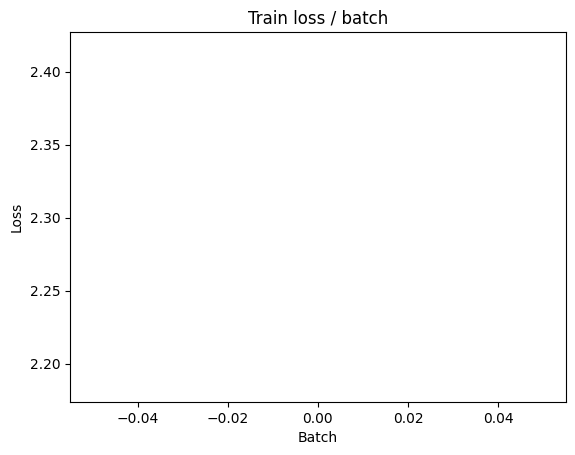

[TRAIN Batch 200/391]	Time 0.484s (0.571s)	Loss 2.0982 (2.1452)	Prec@1  25.0 ( 21.4)	Prec@5  70.3 ( 70.8)


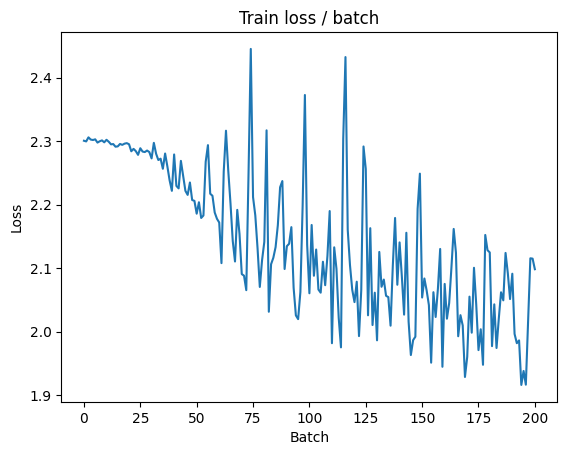


===============> Total time 217s	Avg loss 2.0324	Avg Prec@1 25.77 %	Avg Prec@5 76.16 %

[EVAL Batch 000/079]	Time 0.703s (0.703s)	Loss 2.2902 (2.2902)	Prec@1  42.2 ( 42.2)	Prec@5  82.0 ( 82.0)

===============> Total time 15s	Avg loss 2.3141	Avg Prec@1 35.74 %	Avg Prec@5 85.90 %



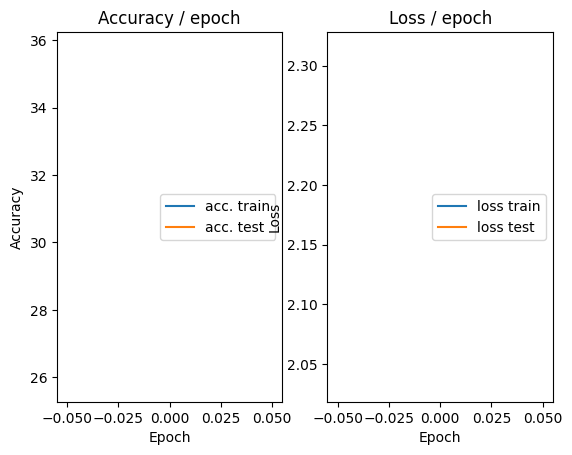

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 1.437s (1.437s)	Loss 1.8831 (1.8831)	Prec@1  31.2 ( 31.2)	Prec@5  84.4 ( 84.4)


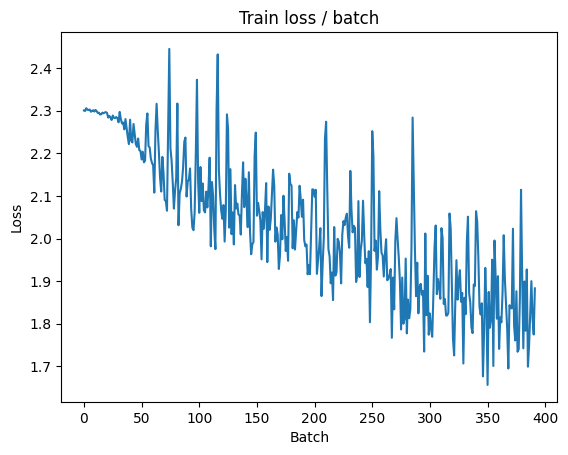

[TRAIN Batch 200/391]	Time 0.477s (0.558s)	Loss 1.7841 (1.7703)	Prec@1  38.3 ( 35.6)	Prec@5  83.6 ( 86.1)


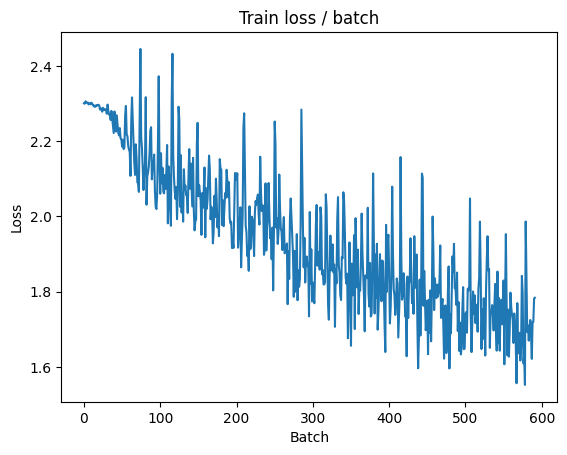


===============> Total time 215s	Avg loss 1.7146	Avg Prec@1 37.63 %	Avg Prec@5 87.33 %

[EVAL Batch 000/079]	Time 0.744s (0.744s)	Loss 3.0348 (3.0348)	Prec@1  39.8 ( 39.8)	Prec@5  85.9 ( 85.9)

===============> Total time 15s	Avg loss 3.0228	Avg Prec@1 39.58 %	Avg Prec@5 87.59 %



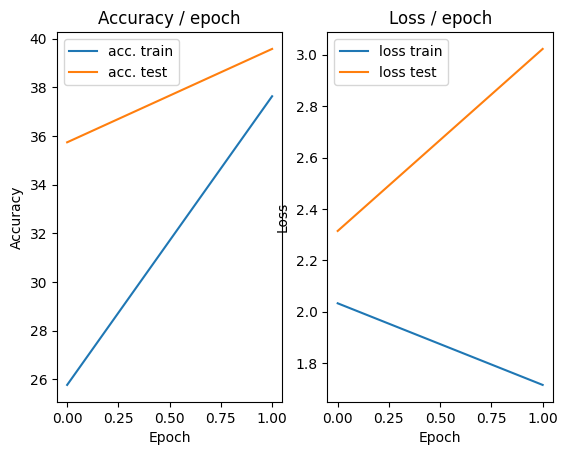

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 1.370s (1.370s)	Loss 1.5833 (1.5833)	Prec@1  40.6 ( 40.6)	Prec@5  87.5 ( 87.5)


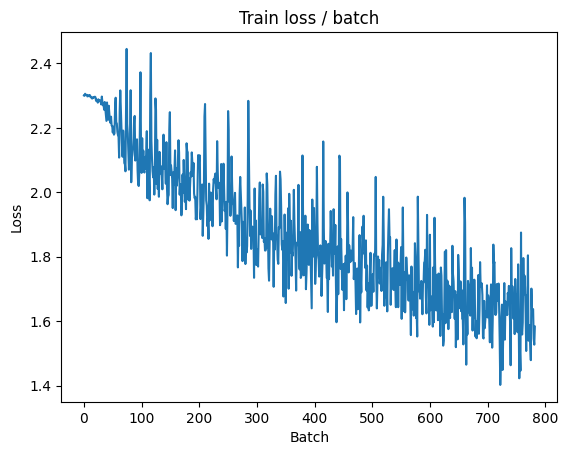

[TRAIN Batch 200/391]	Time 0.487s (0.556s)	Loss 1.5201 (1.5805)	Prec@1  45.3 ( 42.8)	Prec@5  91.4 ( 89.7)


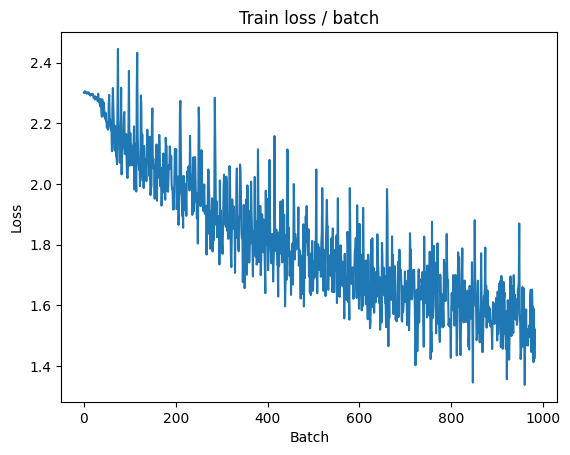


===============> Total time 215s	Avg loss 1.5531	Avg Prec@1 43.93 %	Avg Prec@5 90.11 %

[EVAL Batch 000/079]	Time 0.767s (0.767s)	Loss 3.3790 (3.3790)	Prec@1  43.8 ( 43.8)	Prec@5  88.3 ( 88.3)

===============> Total time 15s	Avg loss 3.6499	Avg Prec@1 38.02 %	Avg Prec@5 89.34 %



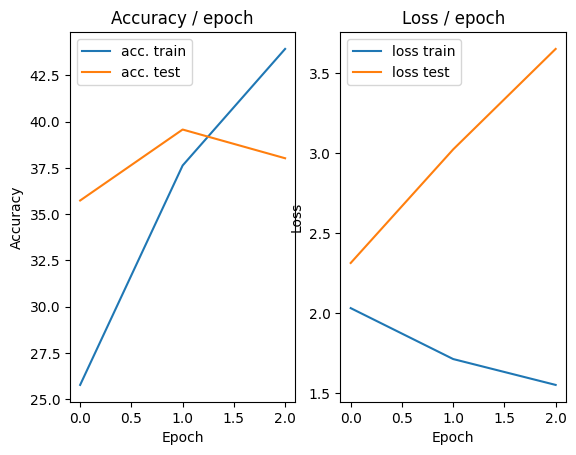

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 1.567s (1.567s)	Loss 1.4907 (1.4907)	Prec@1  47.7 ( 47.7)	Prec@5  93.8 ( 93.8)


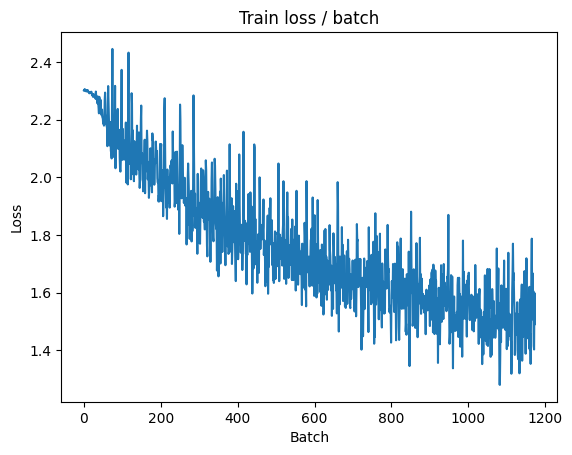

KeyboardInterrupt: 

In [8]:
main(128, 0.1)

## Variants on the optimization algorithm

In [ ]:
class ConvNet(nn.Module):
    """
    This class defines the structure of the neural network
    """

    def __init__(self):
        super(ConvNet, self).__init__()
        # We first define the convolution and pooling layers as a features extractor
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),

            nn.Conv2d(32, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2,2), stride = 2, padding=0),

            nn.Conv2d(64, 128, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            #Modification of the pool3 layer to add the option ceil_mode
            nn.MaxPool2d((2, 2), stride=2, padding=0, ceil_mode=True),
        )
        # We then define fully connected layers as a classifier
        self.classifier = nn.Sequential(
            nn.Linear(128*4*4, 1000),
            nn.ReLU(),
            nn.Linear(1000, 10)
            # Reminder: The softmax is included in the loss, do not put it here
        )

    # Method called when we apply the network to an input batch
    def forward(self, input):
        bsize = input.size(0) # batch size
        output = self.features(input) # output of the conv layers
        output = output.view(bsize, -1) # we flatten the 2D feature maps into one 1D vector for each input
        output = self.classifier(output) # we compute the output of the fc layers
        return output


def get_dataset(batch_size, cuda=False):

    """
    This function loads the dataset and performs transformations on each
    image (listed in `transform = ...`).

    """
    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.ToTensor(), #Transform the PIL image to a torch tensor,
            #Adding Normalisation
            transforms.Normalize(
                mean = [0.491, 0.482, 0.447],
                std = [0.202, 0.199, 0.201]
            ),
            #A random crop of size 28 × 28 pixels
            transforms.transforms.RandomCrop(28),
            #A random horizontal symmetry of the image
            transforms.transforms.RandomHorizontalFlip()
        ]))
    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.ToTensor(),
            #Adding Normalisation
            transforms.Normalize(
                mean = [0.491, 0.482, 0.447],
                std = [0.202, 0.199, 0.201]
            ),
            #A centered crop size 28 in test
            transforms.transforms.CenterCrop(28)
        ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader



def epoch(data, model, criterion, optimizer=None, cuda=False):
    """
    Make a pass (called epoch in English) on the data `data` with the
     model `model`. Evaluates `criterion` as loss.
     If `optimizer` is given, perform a training epoch using
     the given optimizer, otherwise, perform an evaluation epoch (no backward)
     of the model.
    """

    # indicates whether the model is in eval or train mode (some layers behave differently in train and eval)
    model.eval() if optimizer is None else model.train()

    # objects to store metric averages
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # we iterate on the batches
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # only with GPU, and not with CPU
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward if we are training
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # compute metrics
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # update
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # print info
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Print summary
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss


def main(batch_size=128, lr=0.1, epochs=15, cuda=False):
    model = ConvNet()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr)
    lr_sched = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.95) # Scheduler

    if cuda:
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    train, test = get_dataset(batch_size, cuda)

    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    for i in range(epochs):
        print(f"=================\n=== EPOCH {i+1} =====\n=================\n")

        # Train phase
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)

        # Adjust learning rate
        lr_sched.step()

        # Log learning rate
        current_lr = optimizer.param_groups[0]['lr']
        print(f"Learning Rate after epoch {i+1}: {current_lr:.6f}")

        # Test phase
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)

        # Plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)

Files already downloaded and verified
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.316s (0.316s)	Loss 2.3003 (2.3003)	Prec@1  13.3 ( 13.3)	Prec@5  53.9 ( 53.9)


<Figure size 640x480 with 0 Axes>

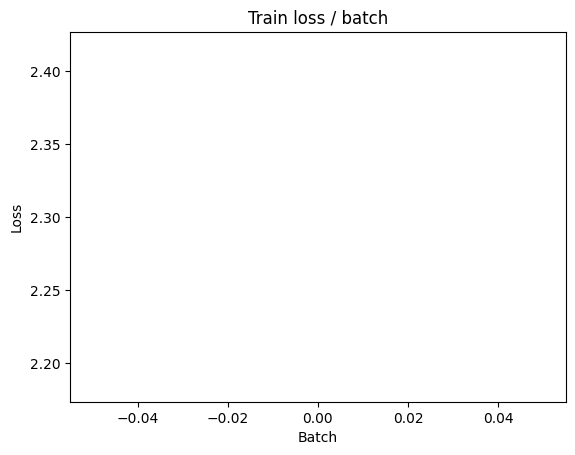

[TRAIN Batch 200/391]	Time 0.041s (0.076s)	Loss 1.7175 (1.9485)	Prec@1  40.6 ( 28.4)	Prec@5  87.5 ( 79.3)


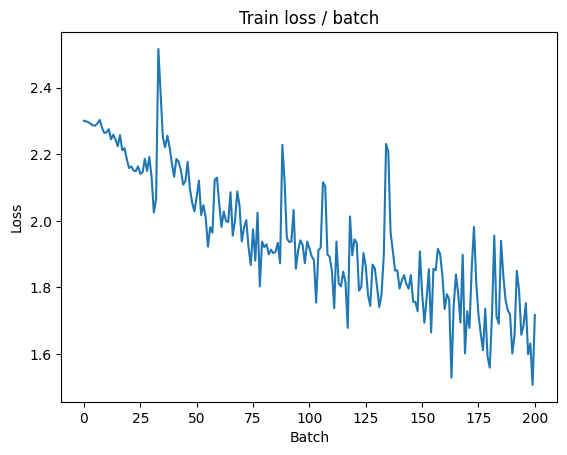


===============> Total time 23s	Avg loss 1.7809	Avg Prec@1 34.93 %	Avg Prec@5 84.68 %

Learning Rate after epoch 1: 0.095000
[EVAL Batch 000/079]	Time 0.150s (0.150s)	Loss 1.6869 (1.6869)	Prec@1  43.0 ( 43.0)	Prec@5  89.1 ( 89.1)

===============> Total time 3s	Avg loss 1.6315	Avg Prec@1 42.87 %	Avg Prec@5 88.58 %



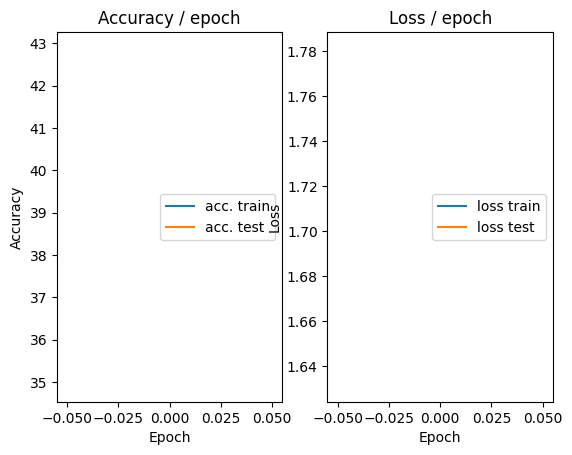

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.179s (0.179s)	Loss 1.5375 (1.5375)	Prec@1  43.8 ( 43.8)	Prec@5  92.2 ( 92.2)


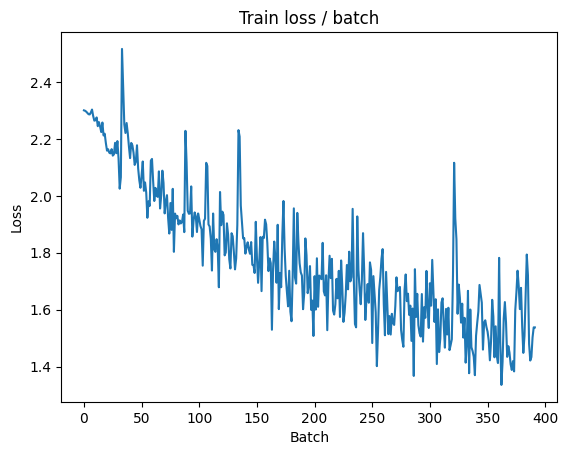

[TRAIN Batch 200/391]	Time 0.039s (0.044s)	Loss 1.3031 (1.4095)	Prec@1  55.5 ( 49.2)	Prec@5  91.4 ( 93.1)


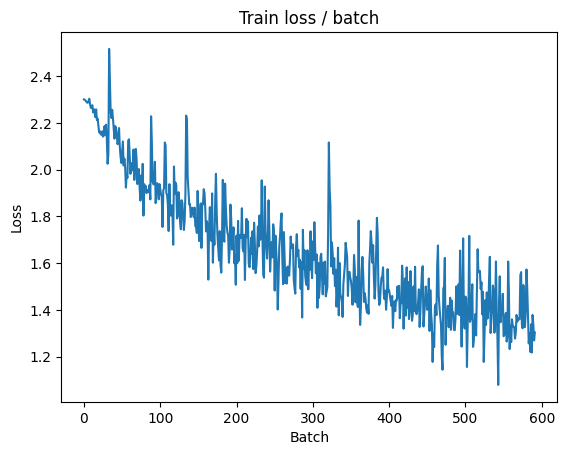


===============> Total time 18s	Avg loss 1.3571	Avg Prec@1 51.40 %	Avg Prec@5 93.69 %

Learning Rate after epoch 2: 0.090250
[EVAL Batch 000/079]	Time 0.152s (0.152s)	Loss 1.2357 (1.2357)	Prec@1  59.4 ( 59.4)	Prec@5  94.5 ( 94.5)

===============> Total time 2s	Avg loss 1.2818	Avg Prec@1 52.89 %	Avg Prec@5 94.48 %



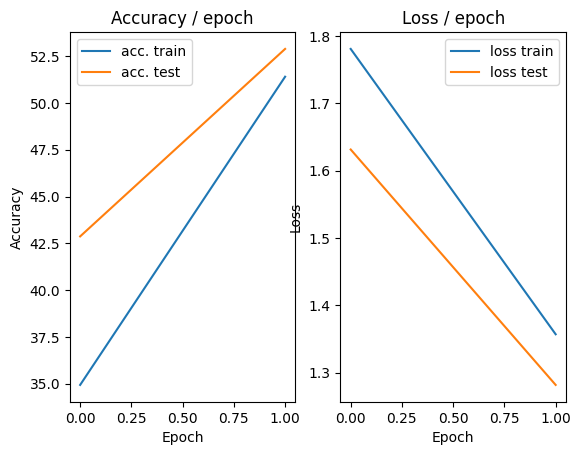

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.172s (0.172s)	Loss 1.2687 (1.2687)	Prec@1  56.2 ( 56.2)	Prec@5  96.9 ( 96.9)


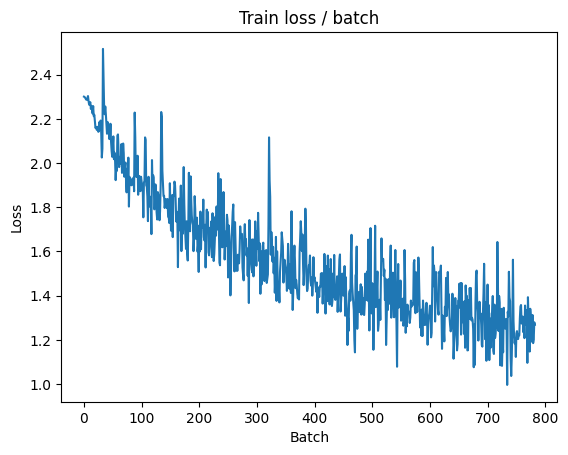

[TRAIN Batch 200/391]	Time 0.079s (0.051s)	Loss 1.0978 (1.1809)	Prec@1  57.0 ( 58.3)	Prec@5  96.9 ( 95.4)


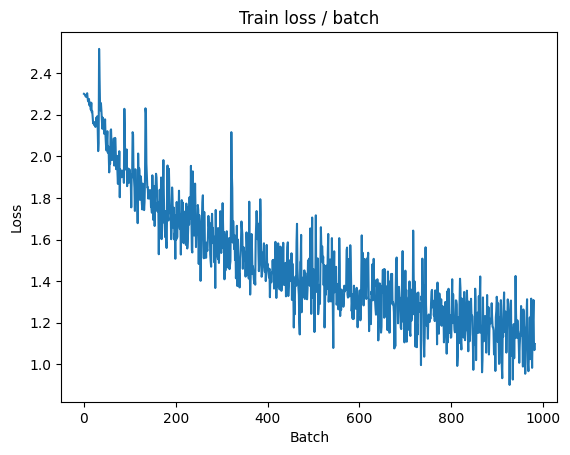


===============> Total time 19s	Avg loss 1.1428	Avg Prec@1 59.86 %	Avg Prec@5 95.70 %

Learning Rate after epoch 3: 0.085737
[EVAL Batch 000/079]	Time 0.153s (0.153s)	Loss 1.0192 (1.0192)	Prec@1  63.3 ( 63.3)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.9963	Avg Prec@1 64.89 %	Avg Prec@5 96.58 %



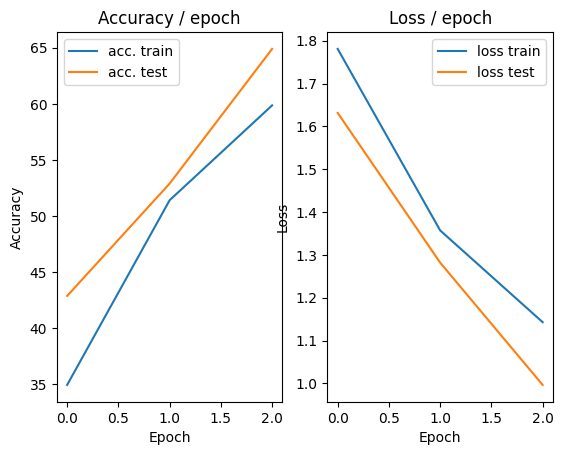

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.189s (0.189s)	Loss 1.0193 (1.0193)	Prec@1  63.3 ( 63.3)	Prec@5  98.4 ( 98.4)


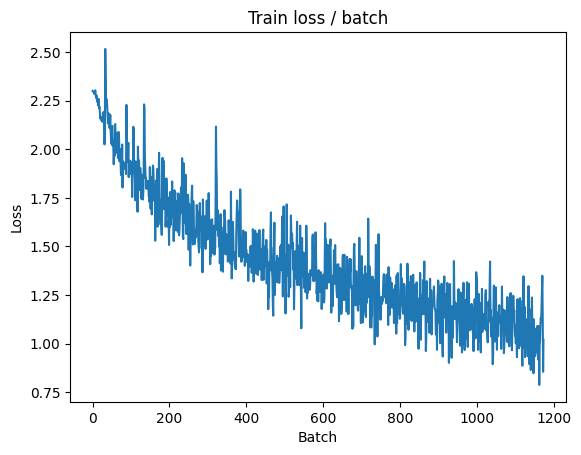

[TRAIN Batch 200/391]	Time 0.010s (0.050s)	Loss 1.1764 (1.0161)	Prec@1  57.8 ( 64.4)	Prec@5  95.3 ( 96.7)


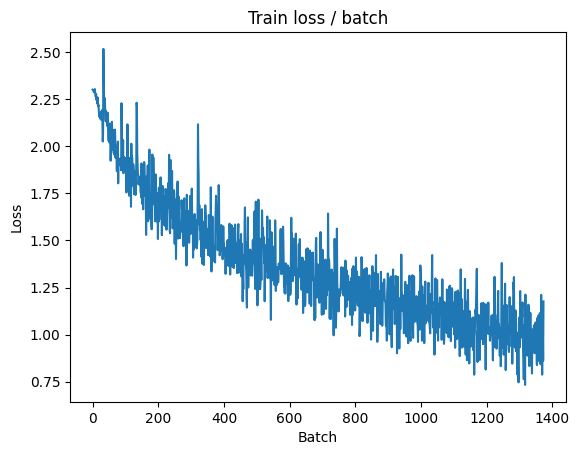


===============> Total time 18s	Avg loss 0.9836	Avg Prec@1 65.66 %	Avg Prec@5 96.83 %

Learning Rate after epoch 4: 0.081451
[EVAL Batch 000/079]	Time 0.202s (0.202s)	Loss 1.0146 (1.0146)	Prec@1  69.5 ( 69.5)	Prec@5  95.3 ( 95.3)

===============> Total time 4s	Avg loss 1.1706	Avg Prec@1 62.45 %	Avg Prec@5 95.36 %



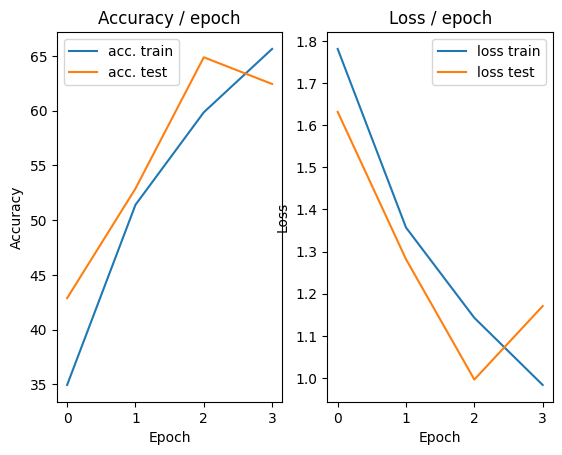

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.197s (0.197s)	Loss 1.1935 (1.1935)	Prec@1  62.5 ( 62.5)	Prec@5  96.9 ( 96.9)


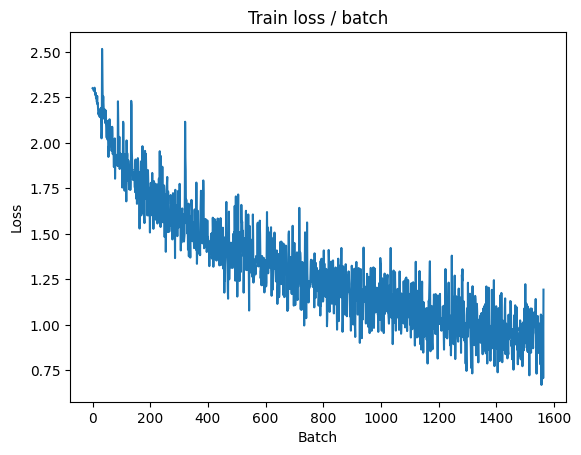

[TRAIN Batch 200/391]	Time 0.016s (0.045s)	Loss 0.6860 (0.8814)	Prec@1  76.6 ( 69.1)	Prec@5  97.7 ( 97.5)


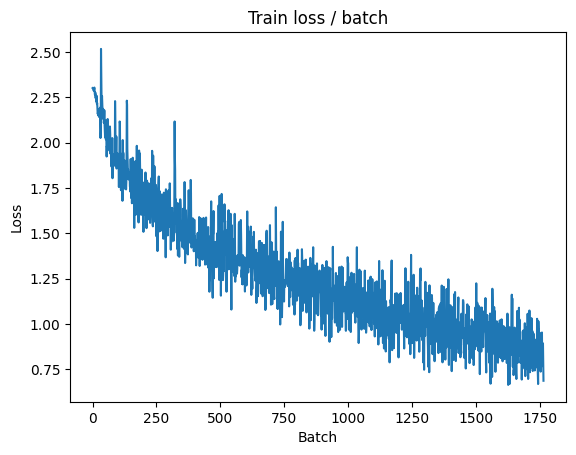


===============> Total time 18s	Avg loss 0.8698	Avg Prec@1 69.68 %	Avg Prec@5 97.55 %

Learning Rate after epoch 5: 0.077378
[EVAL Batch 000/079]	Time 0.143s (0.143s)	Loss 0.8237 (0.8237)	Prec@1  71.1 ( 71.1)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.8578	Avg Prec@1 70.95 %	Avg Prec@5 97.61 %



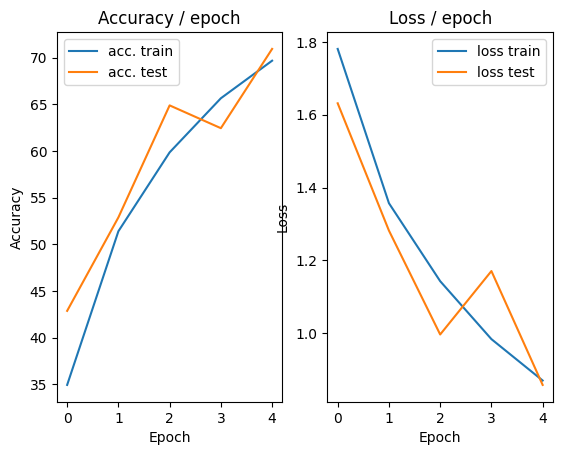

=== EPOCH 6 =====

[TRAIN Batch 000/391]	Time 0.317s (0.317s)	Loss 0.6991 (0.6991)	Prec@1  75.0 ( 75.0)	Prec@5  99.2 ( 99.2)


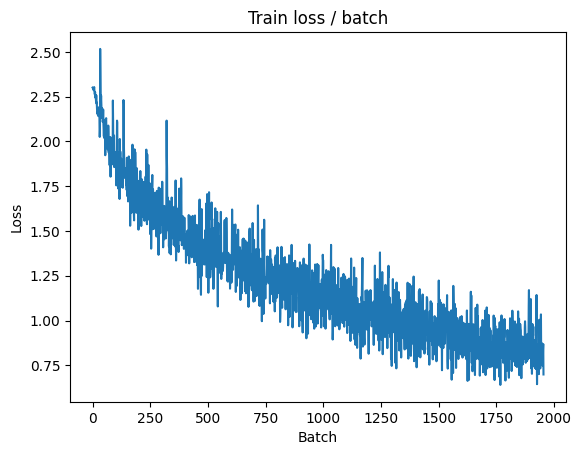

[TRAIN Batch 200/391]	Time 0.048s (0.049s)	Loss 0.7528 (0.7945)	Prec@1  78.1 ( 72.1)	Prec@5  97.7 ( 98.1)


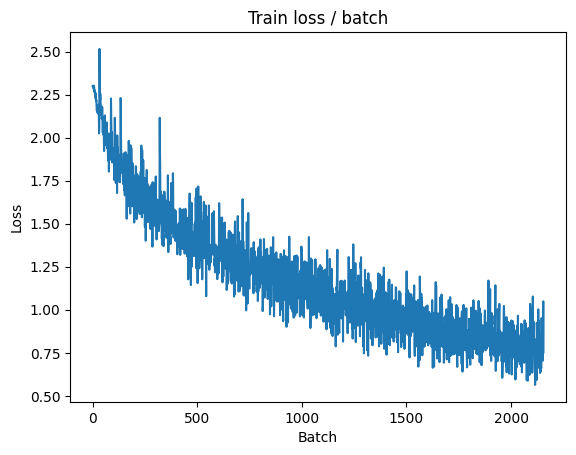


===============> Total time 19s	Avg loss 0.7853	Avg Prec@1 72.64 %	Avg Prec@5 98.01 %

Learning Rate after epoch 6: 0.073509
[EVAL Batch 000/079]	Time 0.160s (0.160s)	Loss 0.7839 (0.7839)	Prec@1  69.5 ( 69.5)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.7659	Avg Prec@1 73.62 %	Avg Prec@5 98.19 %



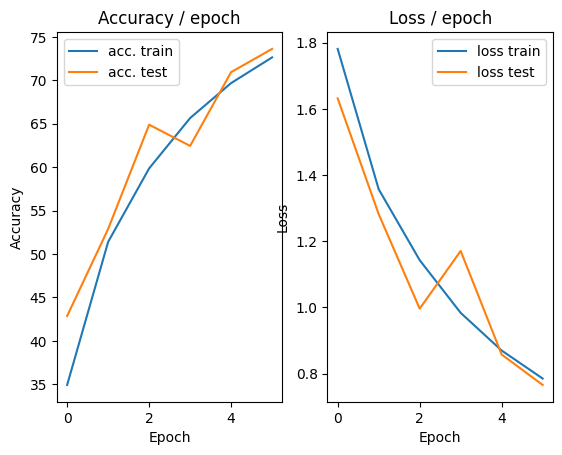

=== EPOCH 7 =====

[TRAIN Batch 000/391]	Time 0.178s (0.178s)	Loss 0.7047 (0.7047)	Prec@1  80.5 ( 80.5)	Prec@5  96.1 ( 96.1)


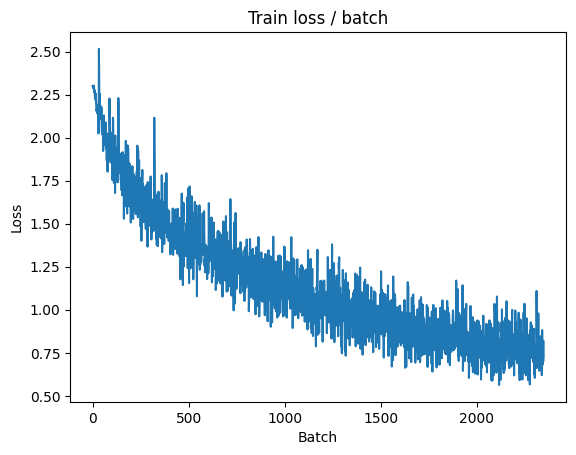

[TRAIN Batch 200/391]	Time 0.067s (0.050s)	Loss 0.6742 (0.7221)	Prec@1  75.8 ( 74.6)	Prec@5  97.7 ( 98.4)


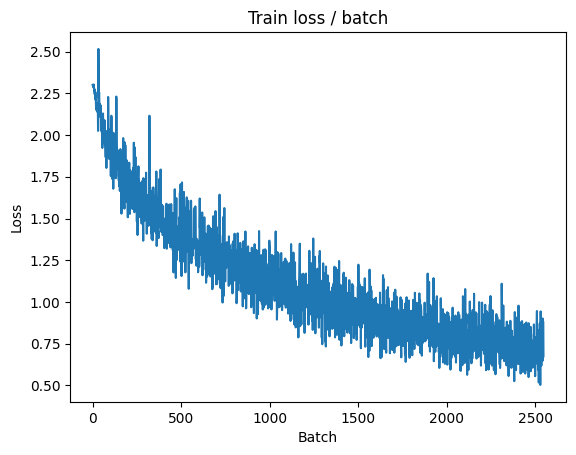


===============> Total time 19s	Avg loss 0.7155	Avg Prec@1 74.92 %	Avg Prec@5 98.43 %

Learning Rate after epoch 7: 0.069834
[EVAL Batch 000/079]	Time 0.154s (0.154s)	Loss 0.7957 (0.7957)	Prec@1  70.3 ( 70.3)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.7209	Avg Prec@1 75.01 %	Avg Prec@5 98.33 %



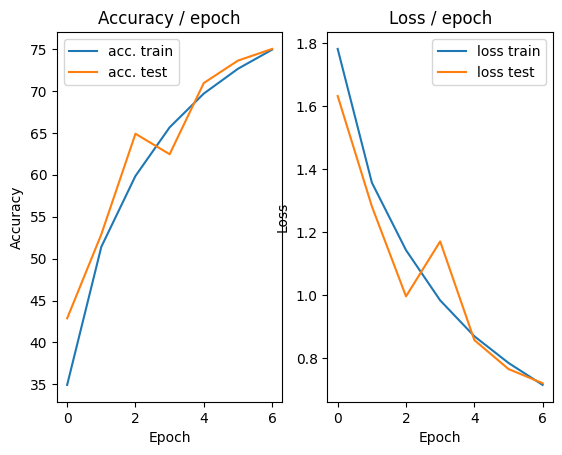

=== EPOCH 8 =====

[TRAIN Batch 000/391]	Time 0.190s (0.190s)	Loss 0.6788 (0.6788)	Prec@1  74.2 ( 74.2)	Prec@5 100.0 (100.0)


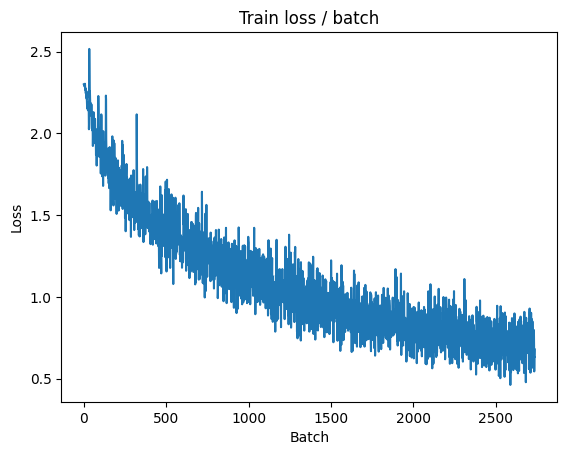

[TRAIN Batch 200/391]	Time 0.022s (0.050s)	Loss 0.7186 (0.6563)	Prec@1  76.6 ( 77.0)	Prec@5  97.7 ( 98.7)


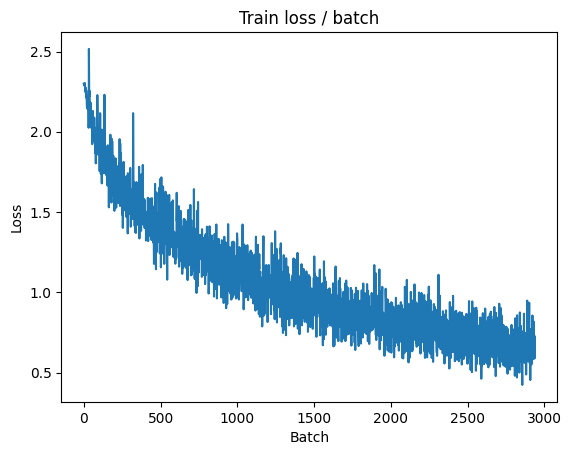


===============> Total time 18s	Avg loss 0.6574	Avg Prec@1 76.92 %	Avg Prec@5 98.69 %

Learning Rate after epoch 8: 0.066342
[EVAL Batch 000/079]	Time 0.152s (0.152s)	Loss 0.6432 (0.6432)	Prec@1  80.5 ( 80.5)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.7133	Avg Prec@1 75.13 %	Avg Prec@5 98.51 %



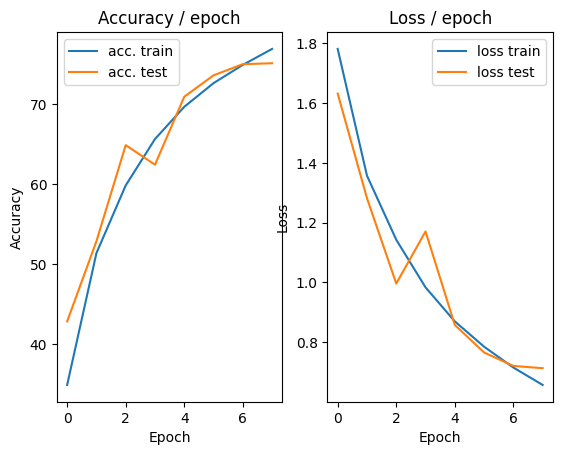

=== EPOCH 9 =====

[TRAIN Batch 000/391]	Time 0.345s (0.345s)	Loss 0.6319 (0.6319)	Prec@1  78.9 ( 78.9)	Prec@5  99.2 ( 99.2)


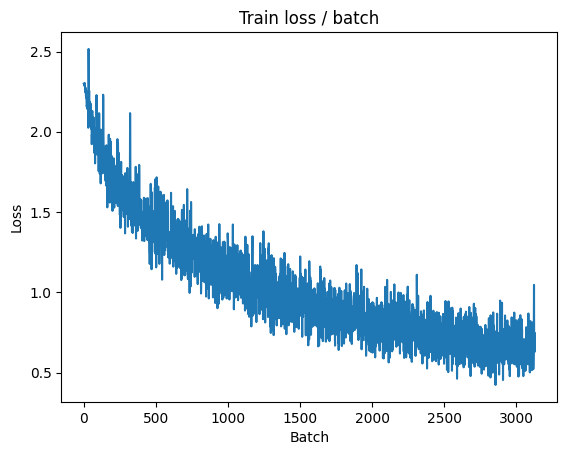

[TRAIN Batch 200/391]	Time 0.052s (0.045s)	Loss 0.7009 (0.6082)	Prec@1  75.0 ( 79.2)	Prec@5  99.2 ( 98.8)


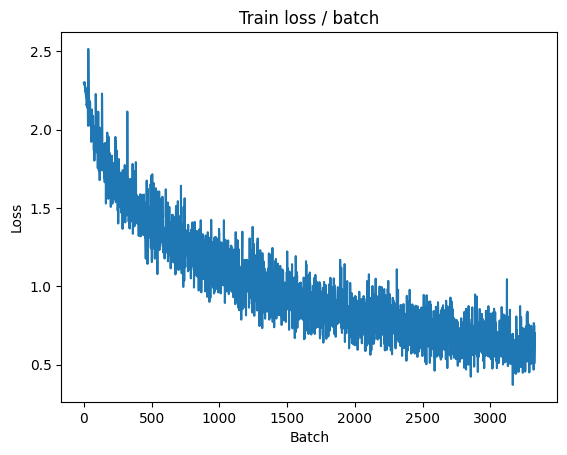


===============> Total time 18s	Avg loss 0.6101	Avg Prec@1 78.96 %	Avg Prec@5 98.84 %

Learning Rate after epoch 9: 0.063025
[EVAL Batch 000/079]	Time 0.160s (0.160s)	Loss 0.6445 (0.6445)	Prec@1  76.6 ( 76.6)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.6933	Avg Prec@1 75.66 %	Avg Prec@5 98.48 %



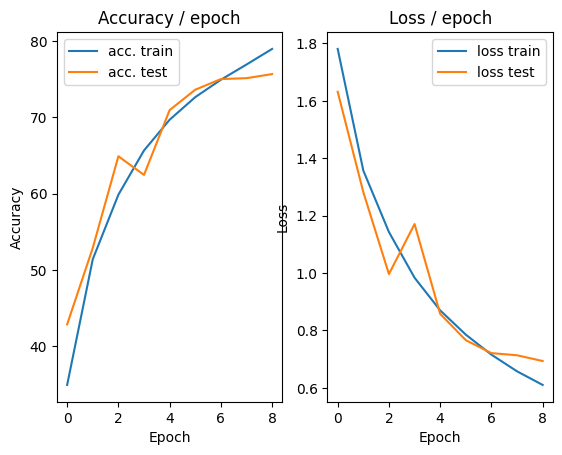

=== EPOCH 10 =====

[TRAIN Batch 000/391]	Time 0.192s (0.192s)	Loss 0.6461 (0.6461)	Prec@1  78.1 ( 78.1)	Prec@5  97.7 ( 97.7)


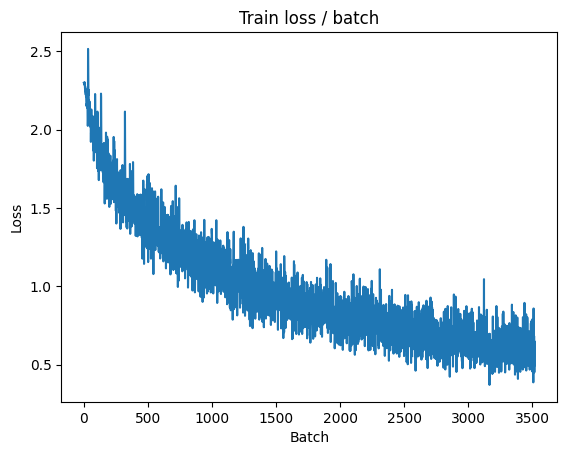

[TRAIN Batch 200/391]	Time 0.015s (0.049s)	Loss 0.5740 (0.5618)	Prec@1  78.9 ( 80.4)	Prec@5  99.2 ( 99.0)


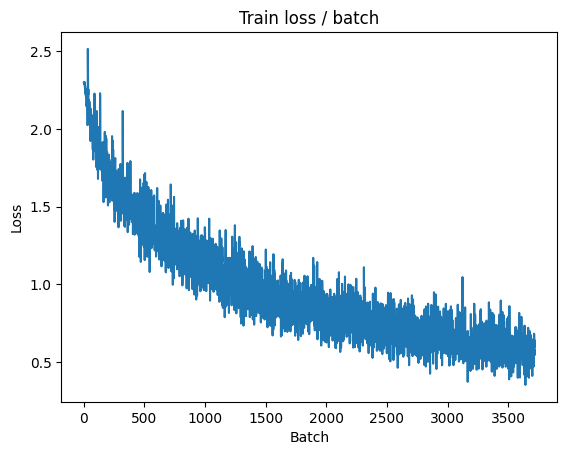


===============> Total time 19s	Avg loss 0.5694	Avg Prec@1 80.16 %	Avg Prec@5 99.02 %

Learning Rate after epoch 10: 0.059874
[EVAL Batch 000/079]	Time 0.138s (0.138s)	Loss 0.6184 (0.6184)	Prec@1  78.1 ( 78.1)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.6817	Avg Prec@1 76.77 %	Avg Prec@5 98.51 %



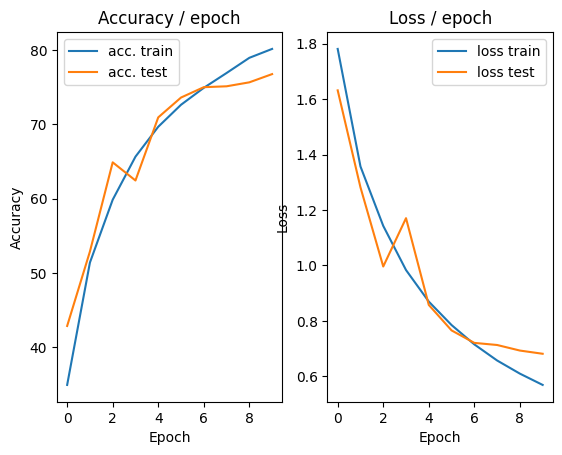

=== EPOCH 11 =====

[TRAIN Batch 000/391]	Time 0.182s (0.182s)	Loss 0.5470 (0.5470)	Prec@1  82.0 ( 82.0)	Prec@5  98.4 ( 98.4)


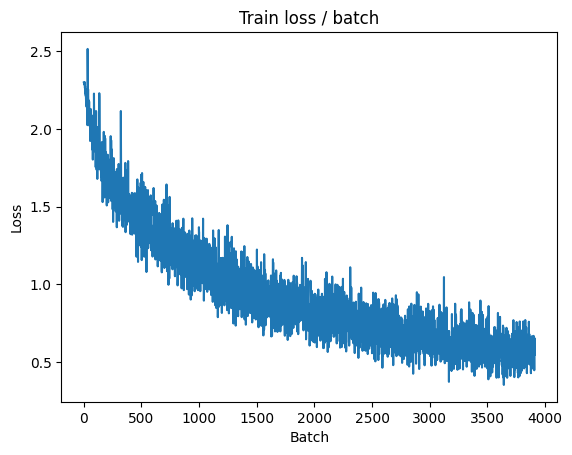

[TRAIN Batch 200/391]	Time 0.014s (0.049s)	Loss 0.5149 (0.5372)	Prec@1  82.0 ( 81.5)	Prec@5 100.0 ( 99.2)


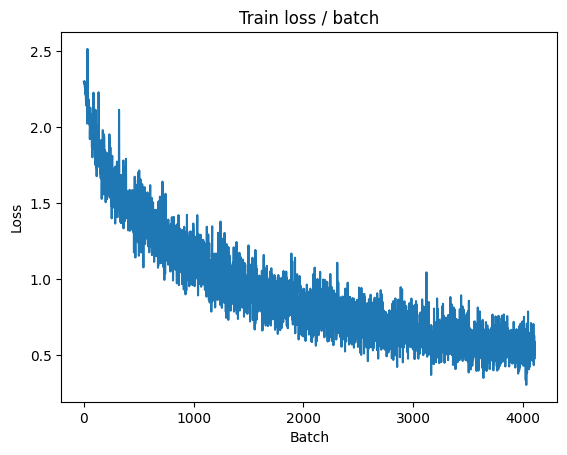


===============> Total time 17s	Avg loss 0.5342	Avg Prec@1 81.48 %	Avg Prec@5 99.15 %

Learning Rate after epoch 11: 0.056880
[EVAL Batch 000/079]	Time 0.151s (0.151s)	Loss 0.6929 (0.6929)	Prec@1  78.1 ( 78.1)	Prec@5  97.7 ( 97.7)

===============> Total time 3s	Avg loss 0.6770	Avg Prec@1 76.94 %	Avg Prec@5 98.65 %



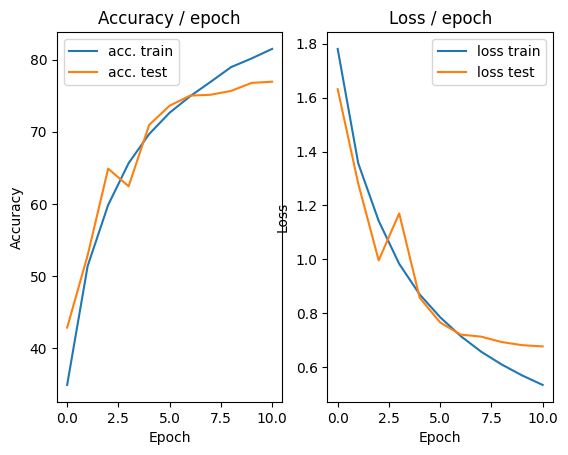

=== EPOCH 12 =====

[TRAIN Batch 000/391]	Time 0.200s (0.200s)	Loss 0.3879 (0.3879)	Prec@1  82.8 ( 82.8)	Prec@5 100.0 (100.0)


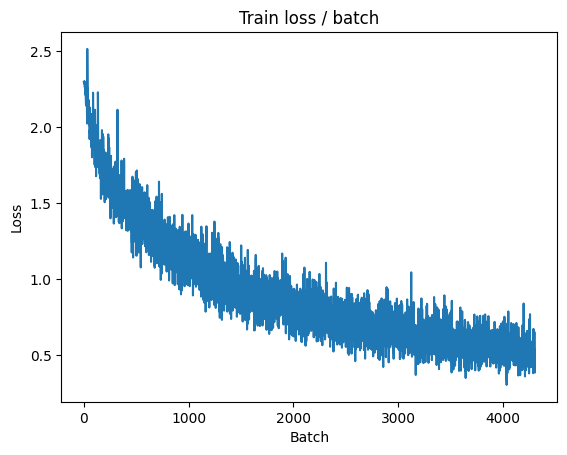

[TRAIN Batch 200/391]	Time 0.010s (0.044s)	Loss 0.5109 (0.4925)	Prec@1  78.1 ( 83.0)	Prec@5 100.0 ( 99.2)


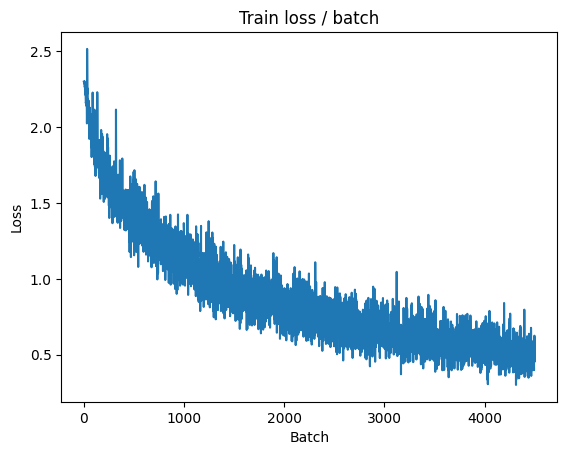


===============> Total time 17s	Avg loss 0.4951	Avg Prec@1 82.88 %	Avg Prec@5 99.22 %

Learning Rate after epoch 12: 0.054036
[EVAL Batch 000/079]	Time 0.150s (0.150s)	Loss 0.5308 (0.5308)	Prec@1  79.7 ( 79.7)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.6428	Avg Prec@1 78.04 %	Avg Prec@5 98.76 %



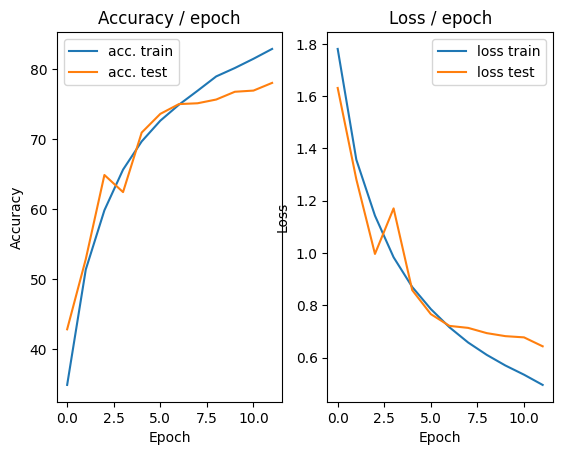

=== EPOCH 13 =====

[TRAIN Batch 000/391]	Time 0.196s (0.196s)	Loss 0.4914 (0.4914)	Prec@1  85.2 ( 85.2)	Prec@5  99.2 ( 99.2)


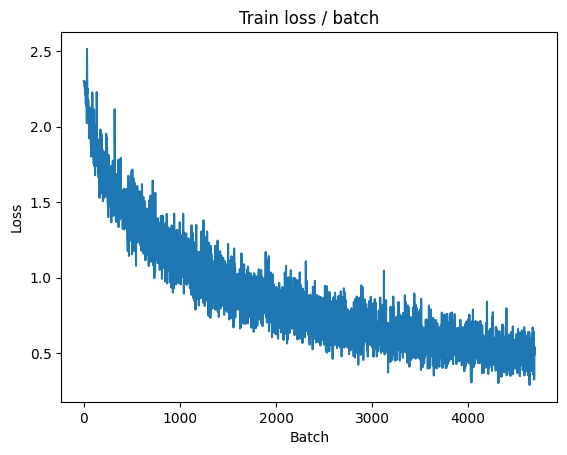

[TRAIN Batch 200/391]	Time 0.010s (0.050s)	Loss 0.4788 (0.4600)	Prec@1  88.3 ( 83.9)	Prec@5  97.7 ( 99.4)


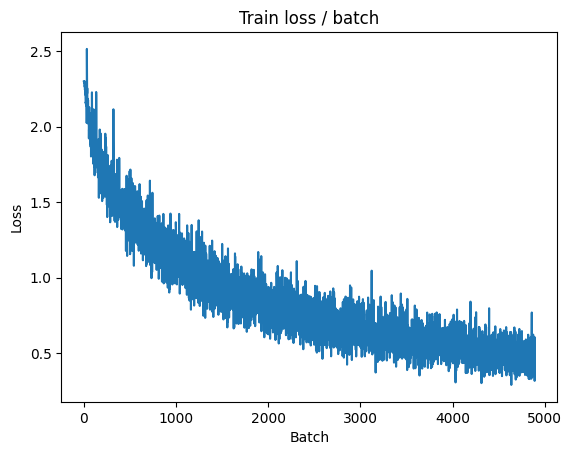


===============> Total time 19s	Avg loss 0.4666	Avg Prec@1 83.54 %	Avg Prec@5 99.37 %

Learning Rate after epoch 13: 0.051334
[EVAL Batch 000/079]	Time 0.180s (0.180s)	Loss 0.5538 (0.5538)	Prec@1  80.5 ( 80.5)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.6132	Avg Prec@1 79.36 %	Avg Prec@5 98.71 %



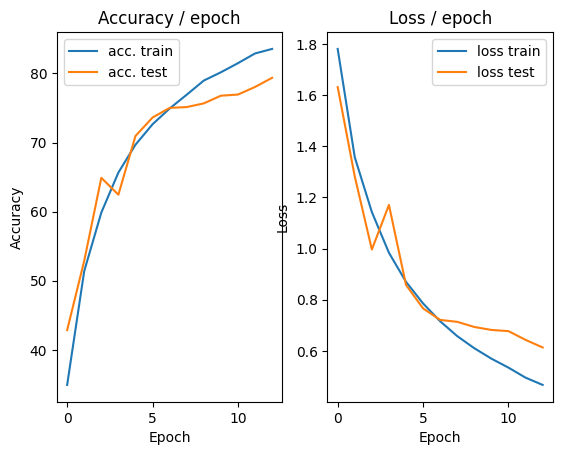

=== EPOCH 14 =====

[TRAIN Batch 000/391]	Time 0.201s (0.201s)	Loss 0.5133 (0.5133)	Prec@1  86.7 ( 86.7)	Prec@5  99.2 ( 99.2)


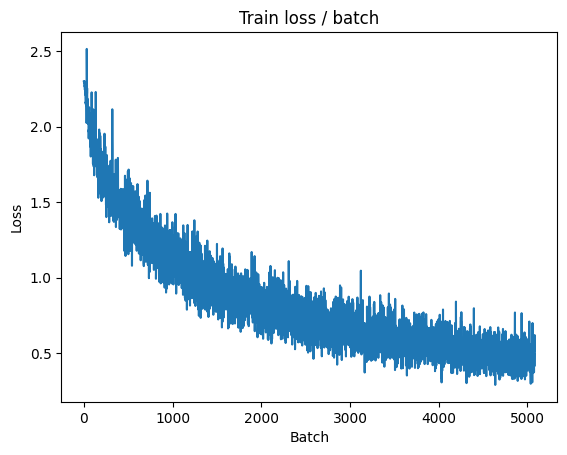

[TRAIN Batch 200/391]	Time 0.019s (0.049s)	Loss 0.4758 (0.4312)	Prec@1  82.8 ( 85.0)	Prec@5  99.2 ( 99.4)


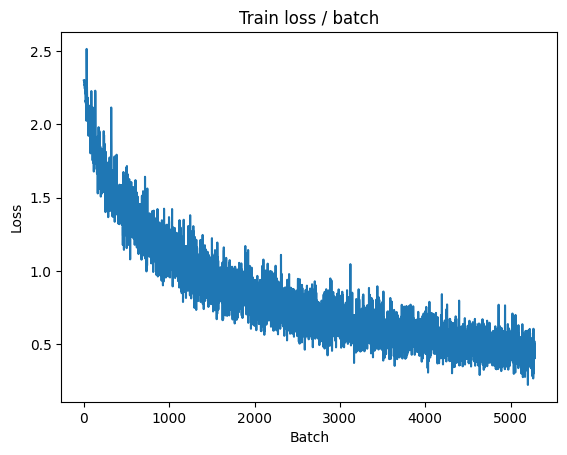


===============> Total time 18s	Avg loss 0.4332	Avg Prec@1 84.96 %	Avg Prec@5 99.47 %

Learning Rate after epoch 14: 0.048767
[EVAL Batch 000/079]	Time 0.277s (0.277s)	Loss 0.5241 (0.5241)	Prec@1  82.0 ( 82.0)	Prec@5  97.7 ( 97.7)

===============> Total time 3s	Avg loss 0.5865	Avg Prec@1 79.87 %	Avg Prec@5 98.82 %



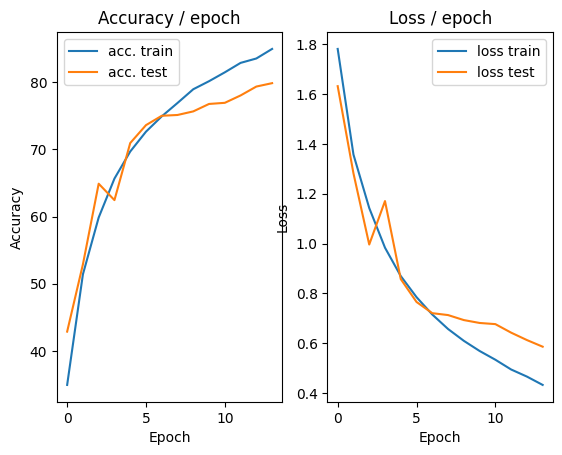

=== EPOCH 15 =====

[TRAIN Batch 000/391]	Time 0.191s (0.191s)	Loss 0.3606 (0.3606)	Prec@1  87.5 ( 87.5)	Prec@5  98.4 ( 98.4)


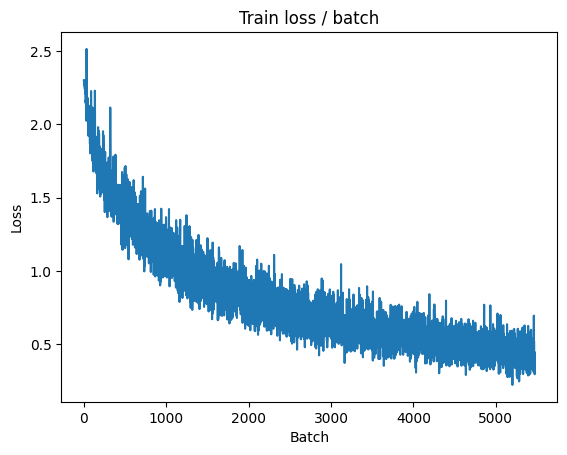

[TRAIN Batch 200/391]	Time 0.011s (0.045s)	Loss 0.3570 (0.4003)	Prec@1  88.3 ( 86.3)	Prec@5  99.2 ( 99.5)


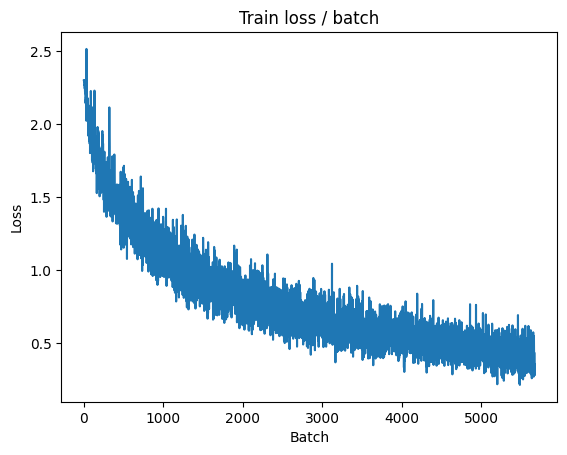


===============> Total time 17s	Avg loss 0.4075	Avg Prec@1 85.92 %	Avg Prec@5 99.51 %

Learning Rate after epoch 15: 0.046329
[EVAL Batch 000/079]	Time 0.156s (0.156s)	Loss 0.4917 (0.4917)	Prec@1  81.2 ( 81.2)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.6089	Avg Prec@1 79.37 %	Avg Prec@5 98.81 %



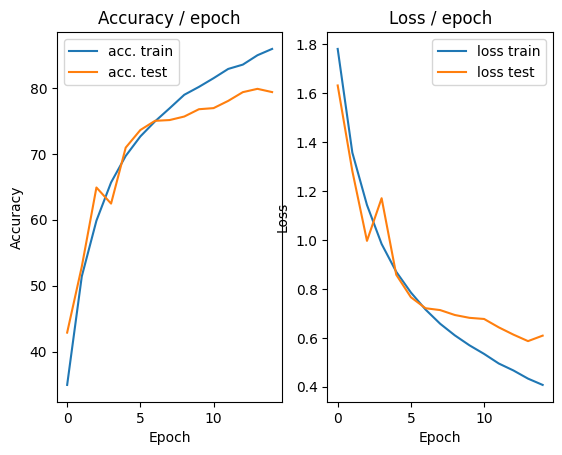

In [ ]:
main(128, 0.1, cuda=True)

### Description of the experimental results
With the implementation of exponential learning rate decay, accuracy levels remained consistent with those achieved through data augmentation, but were reached in fewer epochs, indicating faster convergence. This approach showed noticeable improvements over previous results, as the decreasing learning rate contributed to a smoother and more stable convergence, reflected by the validation loss curve.

## Using variant of SGD for optimisation

In [ ]:
class ConvNet(nn.Module):
    """
    This class defines the structure of the neural network
    """

    def __init__(self):
        super(ConvNet, self).__init__()
        # We first define the convolution and pooling layers as a features extractor
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),

            nn.Conv2d(32, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2,2), stride = 2, padding=0),

            nn.Conv2d(64, 128, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            #Modification of the pool3 layer to add the option ceil_mode
            nn.MaxPool2d((2, 2), stride=2, padding=0, ceil_mode=True),
        )
        # We then define fully connected layers as a classifier
        self.classifier = nn.Sequential(
            nn.Linear(128*4*4, 1000),
            nn.ReLU(),
            nn.Linear(1000, 10)
            # Reminder: The softmax is included in the loss, do not put it here
        )

    # Method called when we apply the network to an input batch
    def forward(self, input):
        bsize = input.size(0) # batch size
        output = self.features(input) # output of the conv layers
        output = output.view(bsize, -1) # we flatten the 2D feature maps into one 1D vector for each input
        output = self.classifier(output) # we compute the output of the fc layers
        return output


def get_dataset(batch_size, cuda=False):

    """
    This function loads the dataset and performs transformations on each
    image (listed in `transform = ...`).

    """
    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.ToTensor(), #Transform the PIL image to a torch tensor,
            #Adding Normalisation
            transforms.Normalize(
                mean = [0.491, 0.482, 0.447],
                std = [0.202, 0.199, 0.201]
            ),
            #A random crop of size 28 × 28 pixels
            transforms.transforms.RandomCrop(28),
            #A random horizontal symmetry of the image
            transforms.transforms.RandomHorizontalFlip()
        ]))
    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.ToTensor(),
            #Adding Normalisation
            transforms.Normalize(
                mean = [0.491, 0.482, 0.447],
                std = [0.202, 0.199, 0.201]
            ),
            #A centered crop size 28 in test
            transforms.transforms.CenterCrop(28)
        ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader



def epoch(data, model, criterion, optimizer=None, cuda=False):
    """
    Make a pass (called epoch in English) on the data `data` with the
     model `model`. Evaluates `criterion` as loss.
     If `optimizer` is given, perform a training epoch using
     the given optimizer, otherwise, perform an evaluation epoch (no backward)
     of the model.
    """

    # indicates whether the model is in eval or train mode (some layers behave differently in train and eval)
    model.eval() if optimizer is None else model.train()

    # objects to store metric averages
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # we iterate on the batches
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # only with GPU, and not with CPU
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward if we are training
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # compute metrics
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # update
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # print info
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Print summary
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss


def main(batch_size=128, lr=0.1, epochs=15, cuda=False):
    model = ConvNet()
    criterion = nn.CrossEntropyLoss()

    # Define learning rates
    base_lr = 0.001  # Starting learning rate
    max_lr = lr    # Maximum learning rate
    # Using SGD with momentum
    optimizer = torch.optim.SGD(model.parameters(), lr=base_lr, momentum=0.9)

    # CyclicLR scheduler
    lr_sched = torch.optim.lr_scheduler.CyclicLR(
        optimizer, base_lr=base_lr, max_lr=max_lr, step_size_up=5, mode="triangular")

    if cuda:
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    train, test = get_dataset(batch_size, cuda)

    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    for i in range(epochs):
        print(f"=================\n=== EPOCH {i+1} =====\n=================\n")

        # Train phase
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)

        # Adjust learning rate
        lr_sched.step()

        # Log learning rate
        current_lr = optimizer.param_groups[0]['lr']
        print(f"Learning Rate after epoch {i+1}: {current_lr:.6f}")

        # Test phase
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)

        # Plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)

Files already downloaded and verified
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.172s (0.172s)	Loss 2.3022 (2.3022)	Prec@1  10.9 ( 10.9)	Prec@5  51.6 ( 51.6)


<Figure size 640x480 with 0 Axes>

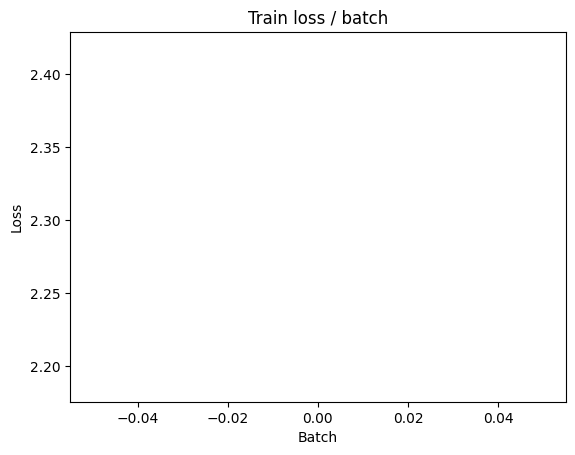

[TRAIN Batch 200/391]	Time 0.010s (0.054s)	Loss 2.1362 (2.2568)	Prec@1  23.4 ( 17.0)	Prec@5  67.2 ( 61.0)


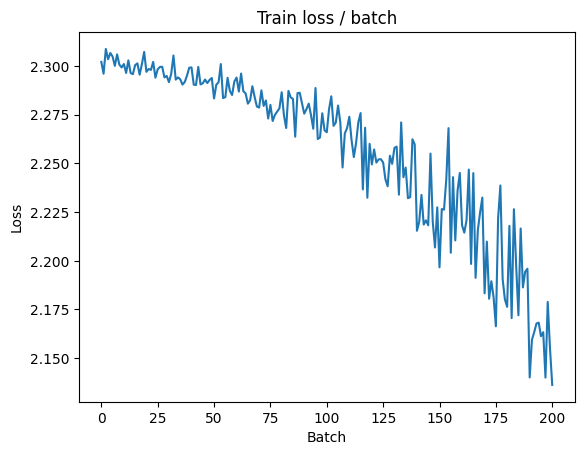


===============> Total time 19s	Avg loss 2.1532	Avg Prec@1 21.37 %	Avg Prec@5 68.47 %

Learning Rate after epoch 1: 0.020800
[EVAL Batch 000/079]	Time 0.143s (0.143s)	Loss 1.9341 (1.9341)	Prec@1  33.6 ( 33.6)	Prec@5  82.0 ( 82.0)

===============> Total time 3s	Avg loss 1.9358	Avg Prec@1 31.05 %	Avg Prec@5 81.59 %



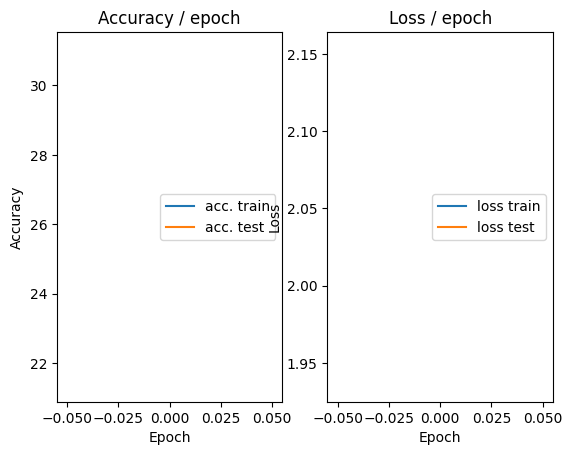

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.181s (0.181s)	Loss 2.0543 (2.0543)	Prec@1  25.8 ( 25.8)	Prec@5  77.3 ( 77.3)


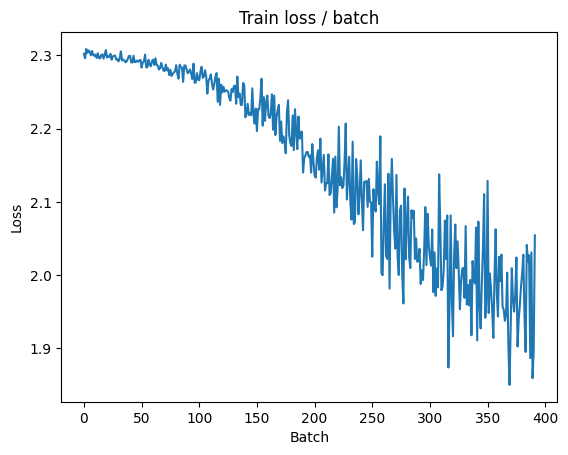

[TRAIN Batch 200/391]	Time 0.017s (0.046s)	Loss 1.3902 (1.6946)	Prec@1  50.0 ( 37.9)	Prec@5  89.8 ( 88.1)


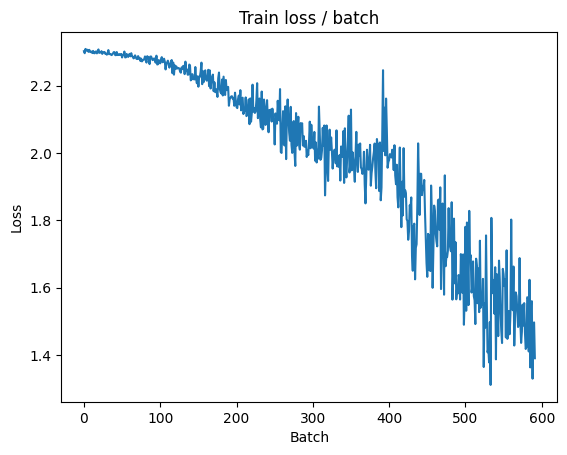


===============> Total time 19s	Avg loss 1.5384	Avg Prec@1 43.96 %	Avg Prec@5 90.81 %

Learning Rate after epoch 2: 0.040600
[EVAL Batch 000/079]	Time 0.144s (0.144s)	Loss 1.1231 (1.1231)	Prec@1  64.8 ( 64.8)	Prec@5  94.5 ( 94.5)

===============> Total time 2s	Avg loss 1.1732	Avg Prec@1 59.00 %	Avg Prec@5 95.48 %



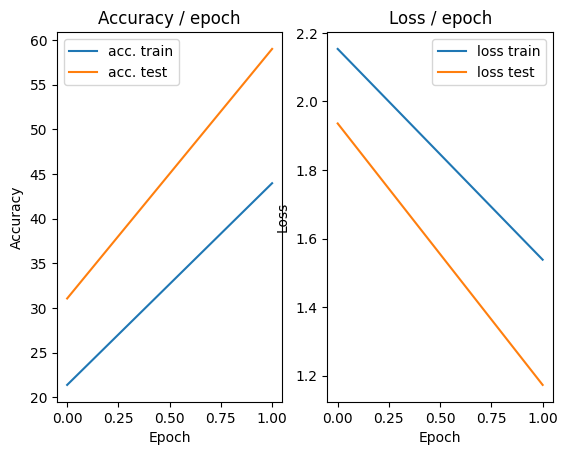

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.178s (0.178s)	Loss 1.1474 (1.1474)	Prec@1  56.2 ( 56.2)	Prec@5  99.2 ( 99.2)


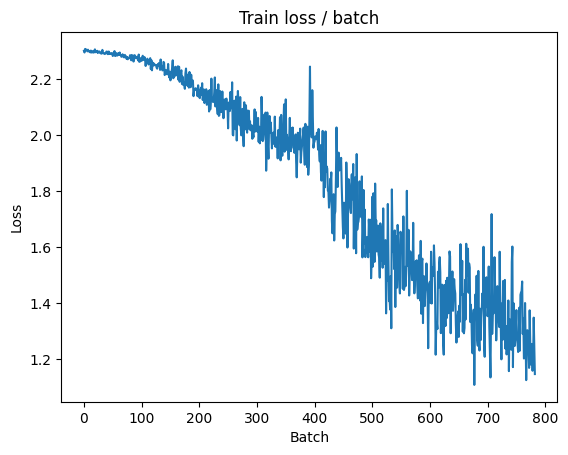

[TRAIN Batch 200/391]	Time 0.016s (0.052s)	Loss 1.1071 (1.2538)	Prec@1  62.5 ( 55.1)	Prec@5  96.1 ( 95.0)


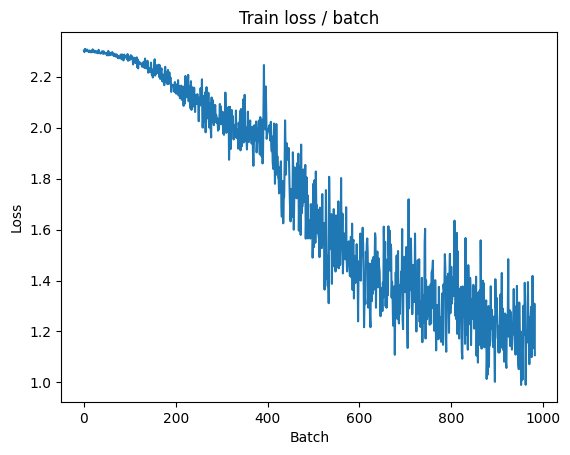


===============> Total time 20s	Avg loss 1.1751	Avg Prec@1 58.27 %	Avg Prec@5 95.55 %

Learning Rate after epoch 3: 0.060400
[EVAL Batch 000/079]	Time 0.142s (0.142s)	Loss 0.9254 (0.9254)	Prec@1  70.3 ( 70.3)	Prec@5  95.3 ( 95.3)

===============> Total time 2s	Avg loss 0.9946	Avg Prec@1 65.60 %	Avg Prec@5 96.62 %



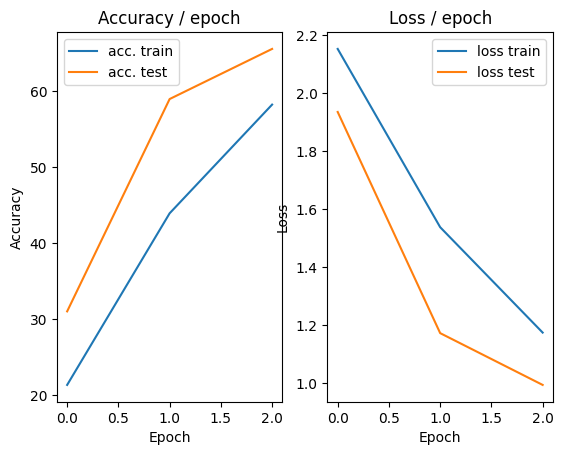

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.177s (0.177s)	Loss 0.9315 (0.9315)	Prec@1  68.8 ( 68.8)	Prec@5  99.2 ( 99.2)


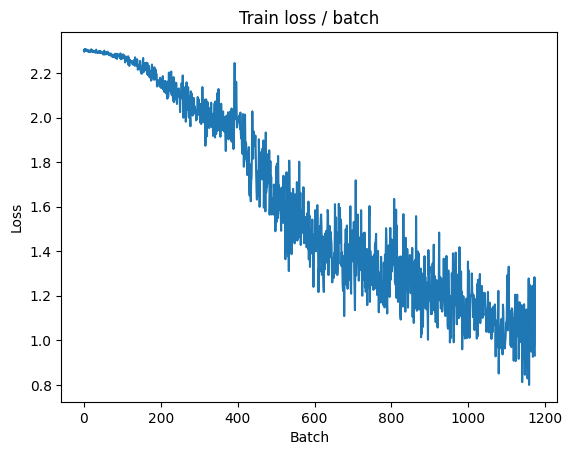

[TRAIN Batch 200/391]	Time 0.035s (0.052s)	Loss 1.0577 (1.0322)	Prec@1  67.2 ( 64.1)	Prec@5  96.9 ( 96.3)


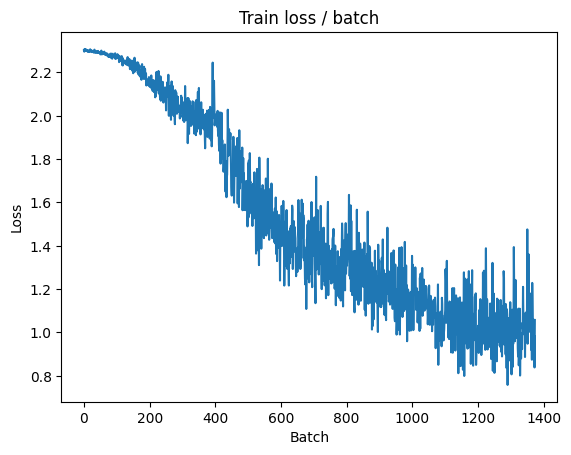


===============> Total time 19s	Avg loss 1.0006	Avg Prec@1 65.31 %	Avg Prec@5 96.48 %

Learning Rate after epoch 4: 0.080200
[EVAL Batch 000/079]	Time 0.237s (0.237s)	Loss 0.9916 (0.9916)	Prec@1  64.8 ( 64.8)	Prec@5  96.9 ( 96.9)

===============> Total time 3s	Avg loss 0.9685	Avg Prec@1 65.88 %	Avg Prec@5 97.32 %



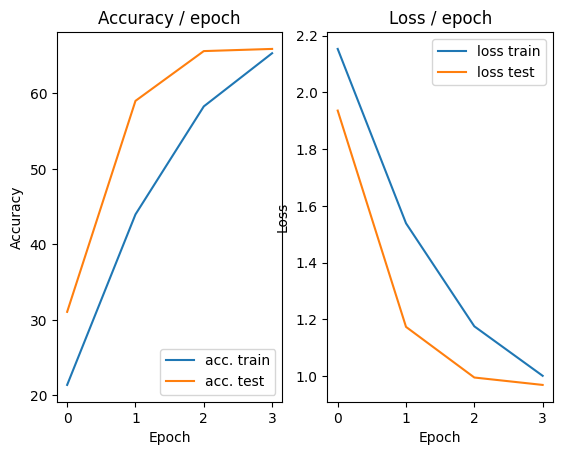

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.190s (0.190s)	Loss 0.8445 (0.8445)	Prec@1  69.5 ( 69.5)	Prec@5  98.4 ( 98.4)


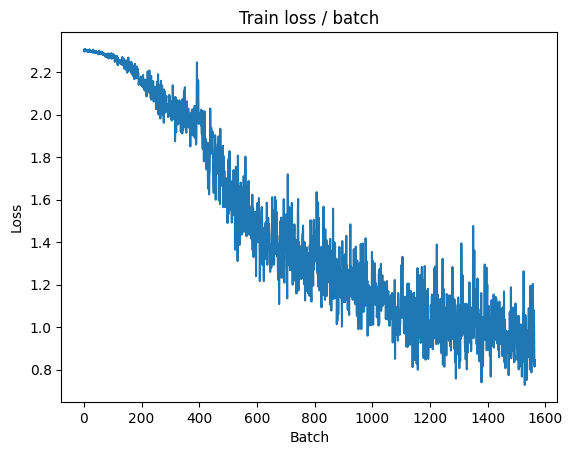

[TRAIN Batch 200/391]	Time 0.026s (0.055s)	Loss 0.8642 (0.9249)	Prec@1  71.9 ( 68.2)	Prec@5  98.4 ( 97.2)


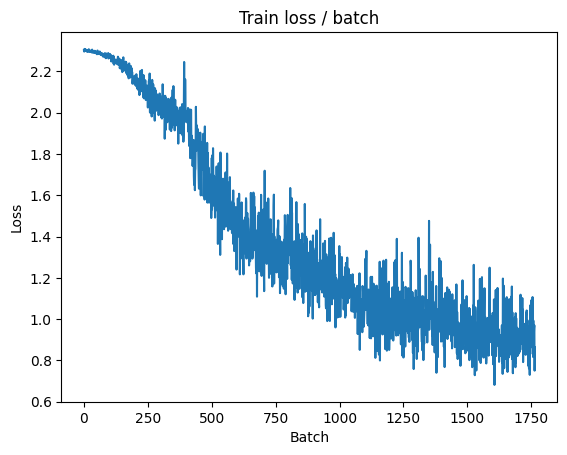


===============> Total time 20s	Avg loss 0.9004	Avg Prec@1 68.86 %	Avg Prec@5 97.34 %

Learning Rate after epoch 5: 0.100000
[EVAL Batch 000/079]	Time 0.146s (0.146s)	Loss 0.8252 (0.8252)	Prec@1  75.8 ( 75.8)	Prec@5  96.9 ( 96.9)

===============> Total time 4s	Avg loss 0.8830	Avg Prec@1 69.81 %	Avg Prec@5 97.34 %



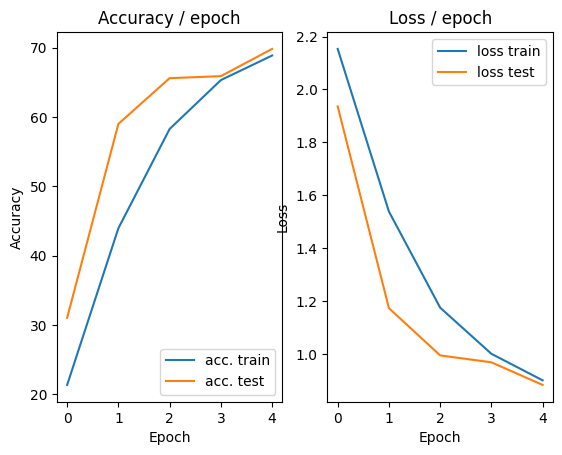

=== EPOCH 6 =====

[TRAIN Batch 000/391]	Time 0.213s (0.213s)	Loss 0.9017 (0.9017)	Prec@1  66.4 ( 66.4)	Prec@5  96.1 ( 96.1)


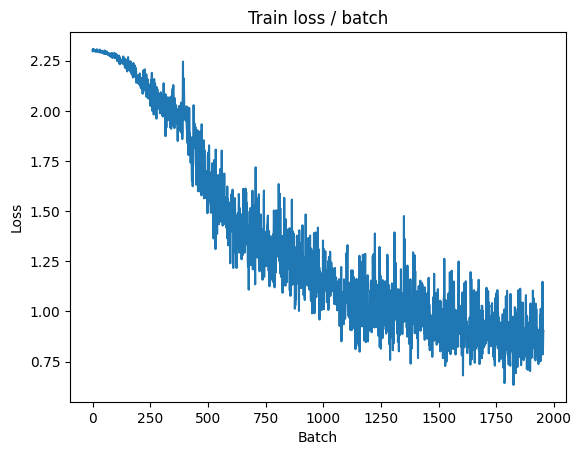

[TRAIN Batch 200/391]	Time 0.019s (0.046s)	Loss 0.8746 (0.8623)	Prec@1  73.4 ( 70.5)	Prec@5  98.4 ( 97.5)


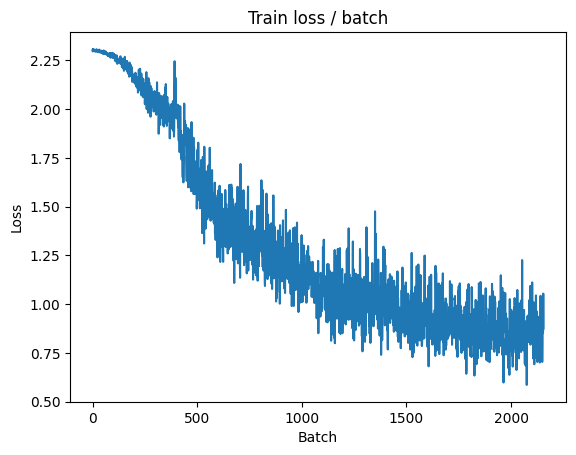


===============> Total time 19s	Avg loss 0.8596	Avg Prec@1 70.53 %	Avg Prec@5 97.48 %

Learning Rate after epoch 6: 0.080200
[EVAL Batch 000/079]	Time 0.152s (0.152s)	Loss 0.8310 (0.8310)	Prec@1  74.2 ( 74.2)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.8367	Avg Prec@1 71.36 %	Avg Prec@5 97.54 %



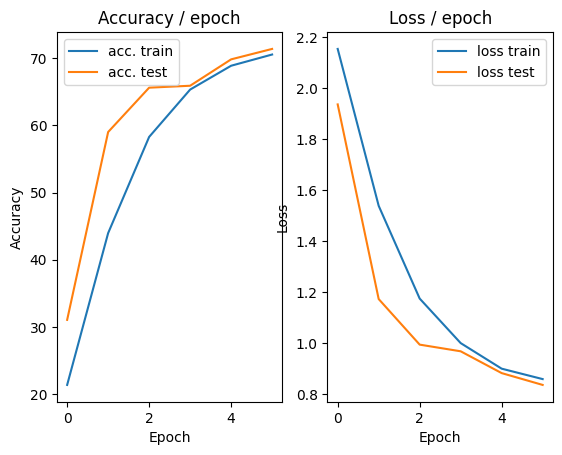

=== EPOCH 7 =====

[TRAIN Batch 000/391]	Time 0.192s (0.192s)	Loss 0.8235 (0.8235)	Prec@1  69.5 ( 69.5)	Prec@5  99.2 ( 99.2)


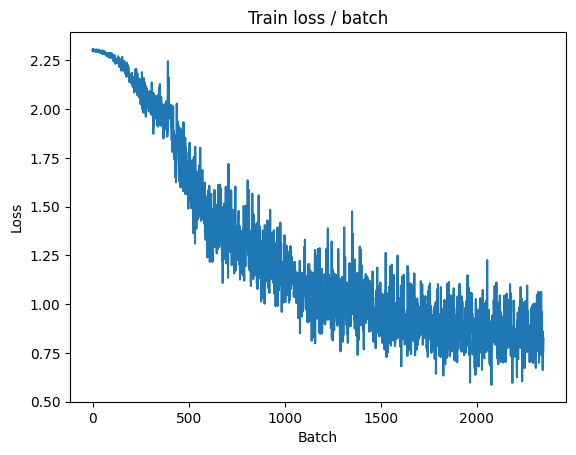

[TRAIN Batch 200/391]	Time 0.017s (0.052s)	Loss 0.5828 (0.7727)	Prec@1  79.7 ( 74.0)	Prec@5 100.0 ( 97.9)


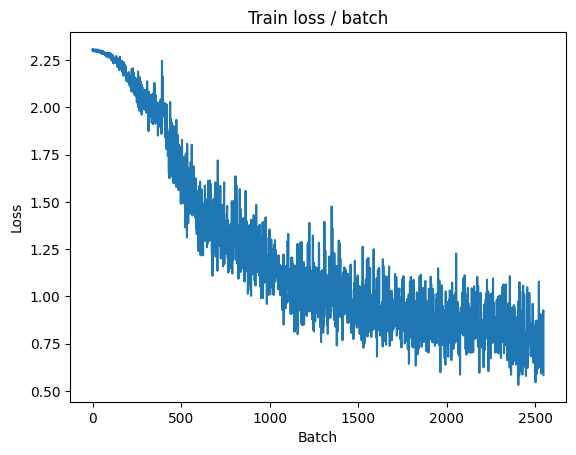


===============> Total time 20s	Avg loss 0.7689	Avg Prec@1 73.93 %	Avg Prec@5 97.99 %

Learning Rate after epoch 7: 0.060400
[EVAL Batch 000/079]	Time 0.168s (0.168s)	Loss 0.7177 (0.7177)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.7491	Avg Prec@1 74.69 %	Avg Prec@5 97.90 %



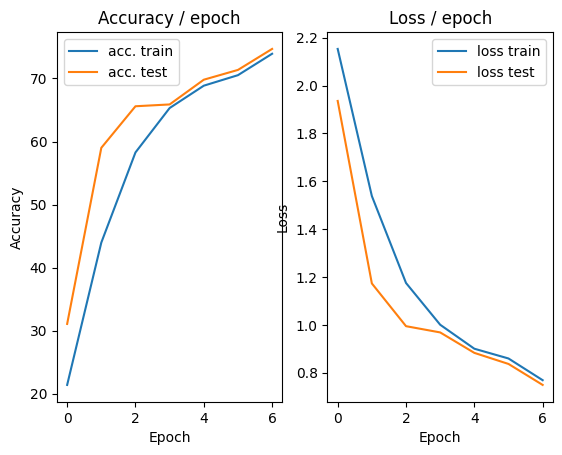

=== EPOCH 8 =====

[TRAIN Batch 000/391]	Time 0.197s (0.197s)	Loss 0.6475 (0.6475)	Prec@1  76.6 ( 76.6)	Prec@5  97.7 ( 97.7)


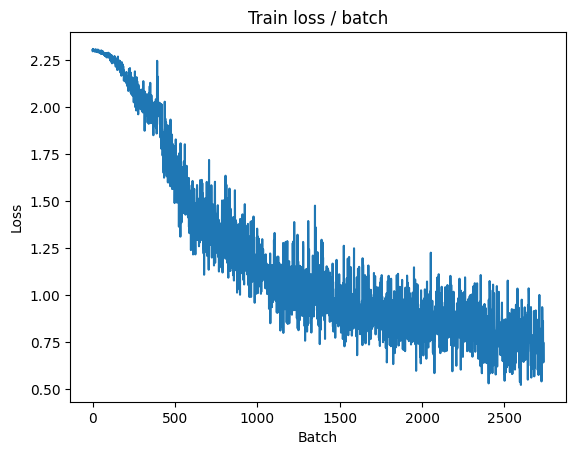

[TRAIN Batch 200/391]	Time 0.014s (0.053s)	Loss 0.6746 (0.6776)	Prec@1  75.8 ( 76.9)	Prec@5  98.4 ( 98.4)


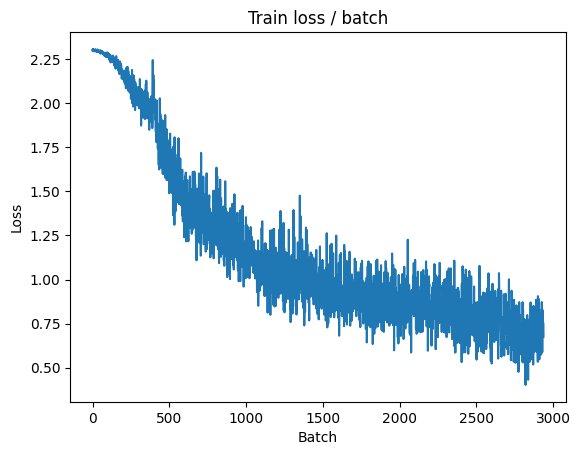


===============> Total time 20s	Avg loss 0.6779	Avg Prec@1 77.06 %	Avg Prec@5 98.37 %

Learning Rate after epoch 8: 0.040600
[EVAL Batch 000/079]	Time 0.253s (0.253s)	Loss 0.7477 (0.7477)	Prec@1  76.6 ( 76.6)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.7308	Avg Prec@1 75.76 %	Avg Prec@5 97.82 %



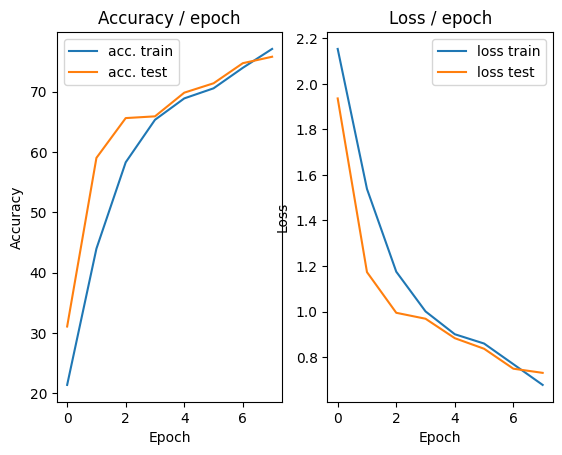

=== EPOCH 9 =====

[TRAIN Batch 000/391]	Time 0.174s (0.174s)	Loss 0.6098 (0.6098)	Prec@1  80.5 ( 80.5)	Prec@5  97.7 ( 97.7)


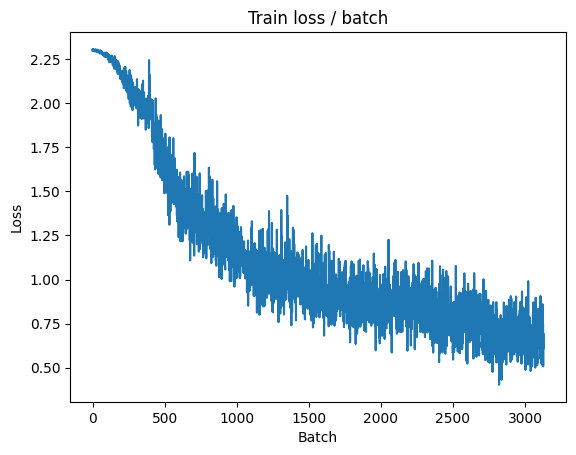

[TRAIN Batch 200/391]	Time 0.021s (0.053s)	Loss 0.6523 (0.5877)	Prec@1  77.3 ( 79.8)	Prec@5  99.2 ( 98.8)


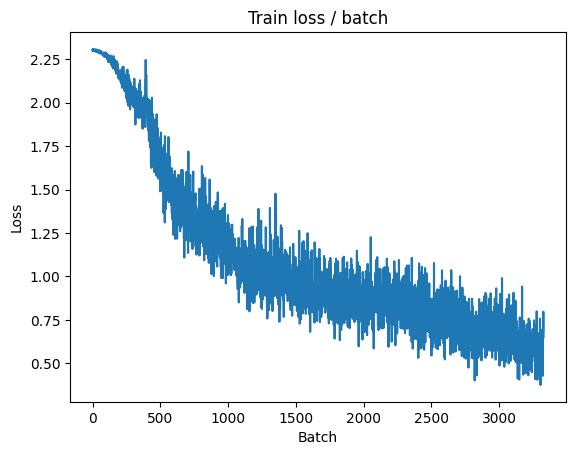


===============> Total time 19s	Avg loss 0.5908	Avg Prec@1 79.76 %	Avg Prec@5 98.80 %

Learning Rate after epoch 9: 0.020800
[EVAL Batch 000/079]	Time 0.177s (0.177s)	Loss 0.5586 (0.5586)	Prec@1  82.8 ( 82.8)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.6432	Avg Prec@1 78.04 %	Avg Prec@5 98.62 %



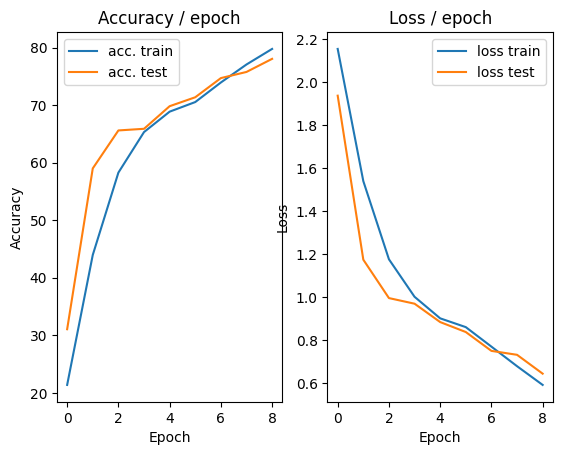

=== EPOCH 10 =====

[TRAIN Batch 000/391]	Time 0.185s (0.185s)	Loss 0.5238 (0.5238)	Prec@1  83.6 ( 83.6)	Prec@5 100.0 (100.0)


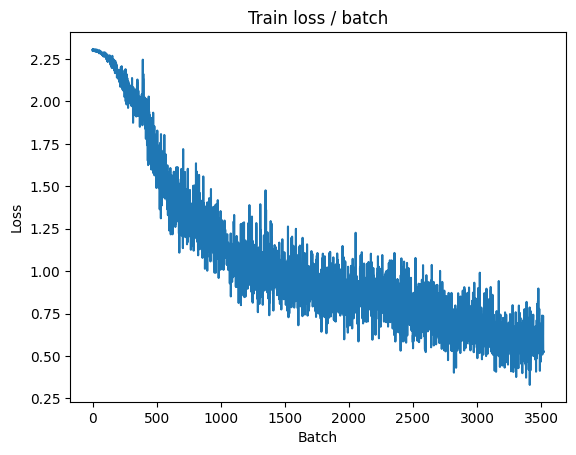

[TRAIN Batch 200/391]	Time 0.010s (0.047s)	Loss 0.5489 (0.4703)	Prec@1  80.5 ( 83.6)	Prec@5  98.4 ( 99.3)


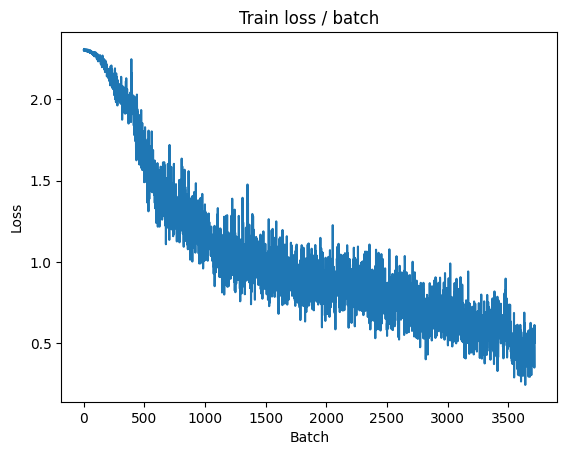


===============> Total time 19s	Avg loss 0.4697	Avg Prec@1 83.69 %	Avg Prec@5 99.31 %

Learning Rate after epoch 10: 0.001000
[EVAL Batch 000/079]	Time 0.156s (0.156s)	Loss 0.5421 (0.5421)	Prec@1  84.4 ( 84.4)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.6073	Avg Prec@1 80.16 %	Avg Prec@5 98.68 %



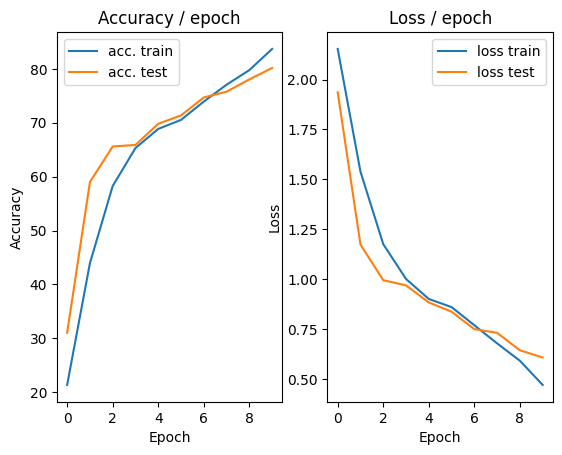

=== EPOCH 11 =====

[TRAIN Batch 000/391]	Time 0.187s (0.187s)	Loss 0.5046 (0.5046)	Prec@1  83.6 ( 83.6)	Prec@5  99.2 ( 99.2)


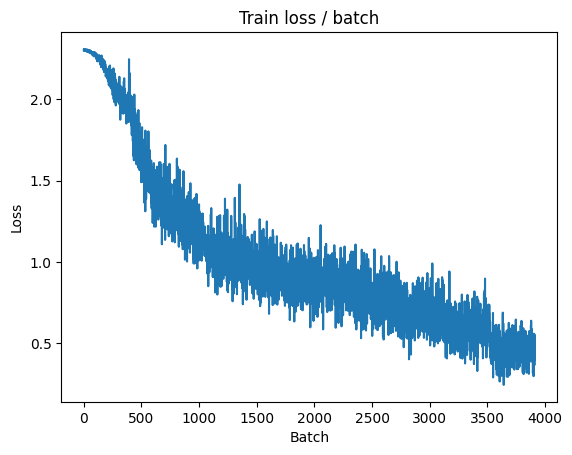

[TRAIN Batch 200/391]	Time 0.075s (0.052s)	Loss 0.4083 (0.3926)	Prec@1  82.0 ( 86.7)	Prec@5 100.0 ( 99.4)


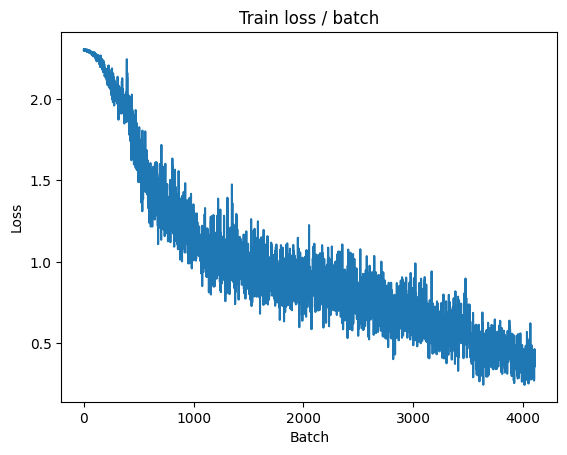


===============> Total time 20s	Avg loss 0.3793	Avg Prec@1 87.05 %	Avg Prec@5 99.46 %

Learning Rate after epoch 11: 0.020800
[EVAL Batch 000/079]	Time 0.162s (0.162s)	Loss 0.5352 (0.5352)	Prec@1  85.9 ( 85.9)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.5535	Avg Prec@1 81.79 %	Avg Prec@5 98.87 %



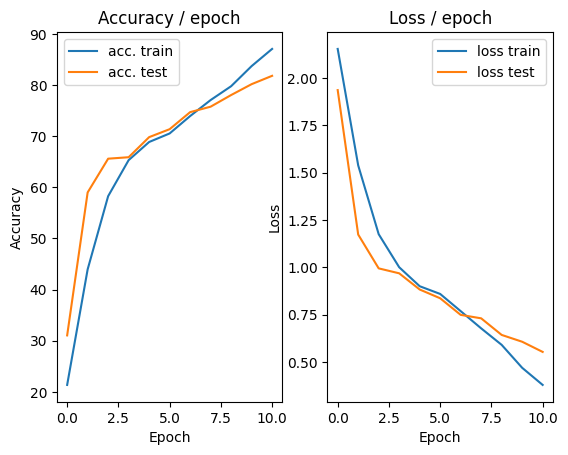

=== EPOCH 12 =====

[TRAIN Batch 000/391]	Time 0.194s (0.194s)	Loss 0.4637 (0.4637)	Prec@1  87.5 ( 87.5)	Prec@5  97.7 ( 97.7)


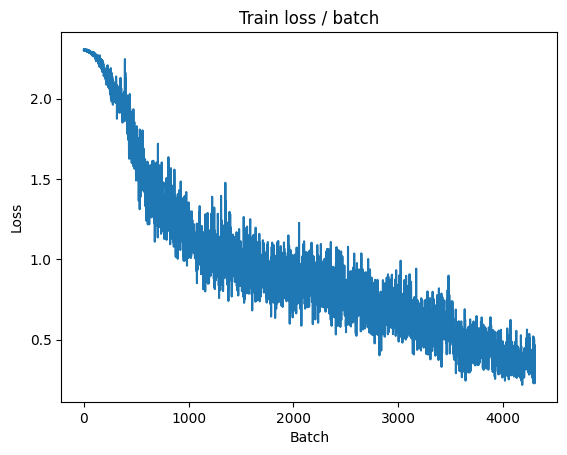

[TRAIN Batch 200/391]	Time 0.079s (0.053s)	Loss 0.3160 (0.4180)	Prec@1  88.3 ( 85.5)	Prec@5  99.2 ( 99.5)


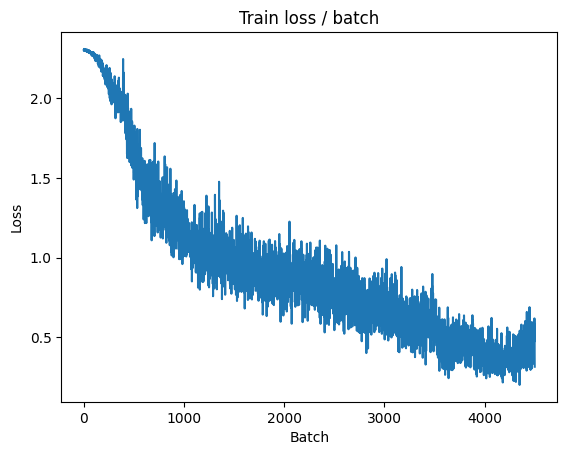


===============> Total time 20s	Avg loss 0.4188	Avg Prec@1 85.44 %	Avg Prec@5 99.41 %

Learning Rate after epoch 12: 0.040600
[EVAL Batch 000/079]	Time 0.161s (0.161s)	Loss 0.5140 (0.5140)	Prec@1  81.2 ( 81.2)	Prec@5 100.0 (100.0)

===============> Total time 2s	Avg loss 0.5690	Avg Prec@1 81.00 %	Avg Prec@5 98.82 %



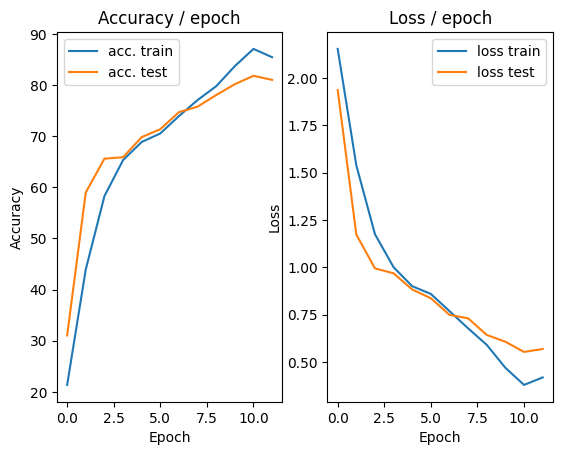

=== EPOCH 13 =====

[TRAIN Batch 000/391]	Time 0.189s (0.189s)	Loss 0.2450 (0.2450)	Prec@1  91.4 ( 91.4)	Prec@5 100.0 (100.0)


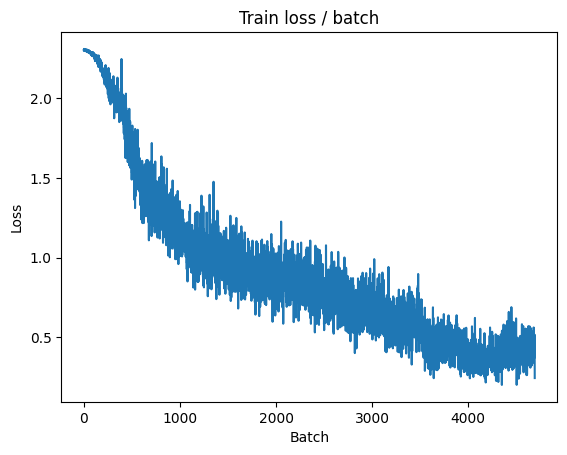

[TRAIN Batch 200/391]	Time 0.010s (0.053s)	Loss 0.4990 (0.4616)	Prec@1  82.8 ( 84.0)	Prec@5 100.0 ( 99.3)


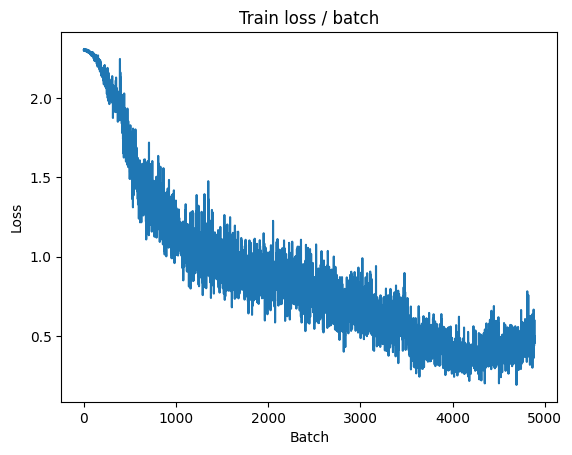


===============> Total time 19s	Avg loss 0.4822	Avg Prec@1 83.36 %	Avg Prec@5 99.23 %

Learning Rate after epoch 13: 0.060400
[EVAL Batch 000/079]	Time 0.207s (0.207s)	Loss 0.6200 (0.6200)	Prec@1  79.7 ( 79.7)	Prec@5  98.4 ( 98.4)

===============> Total time 4s	Avg loss 0.6329	Avg Prec@1 79.60 %	Avg Prec@5 98.64 %



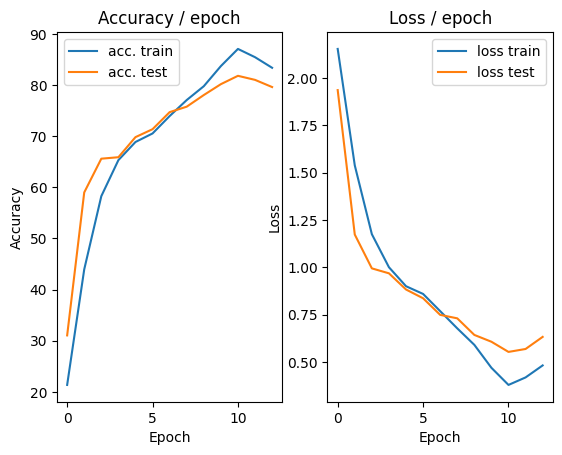

=== EPOCH 14 =====

[TRAIN Batch 000/391]	Time 0.198s (0.198s)	Loss 0.4402 (0.4402)	Prec@1  85.9 ( 85.9)	Prec@5  98.4 ( 98.4)


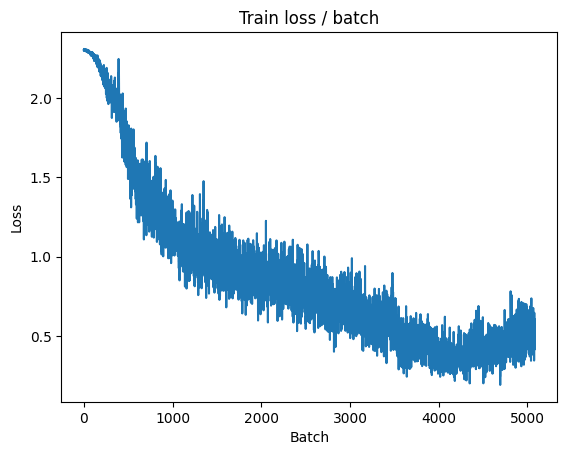

[TRAIN Batch 200/391]	Time 0.133s (0.049s)	Loss 0.4993 (0.5352)	Prec@1  84.4 ( 81.7)	Prec@5  97.7 ( 99.1)


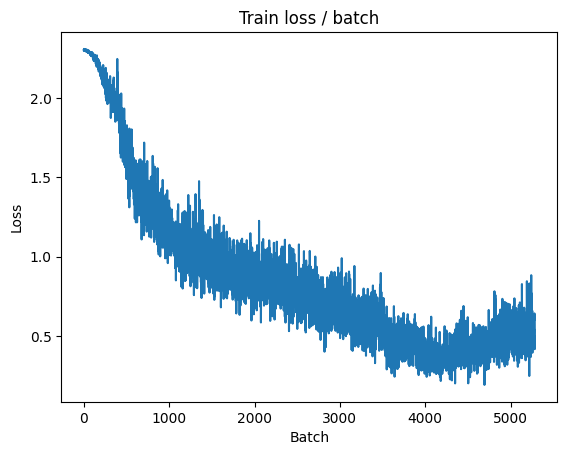


===============> Total time 19s	Avg loss 0.5565	Avg Prec@1 80.98 %	Avg Prec@5 99.07 %

Learning Rate after epoch 14: 0.080200
[EVAL Batch 000/079]	Time 0.171s (0.171s)	Loss 0.7393 (0.7393)	Prec@1  75.8 ( 75.8)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.7171	Avg Prec@1 77.21 %	Avg Prec@5 98.12 %



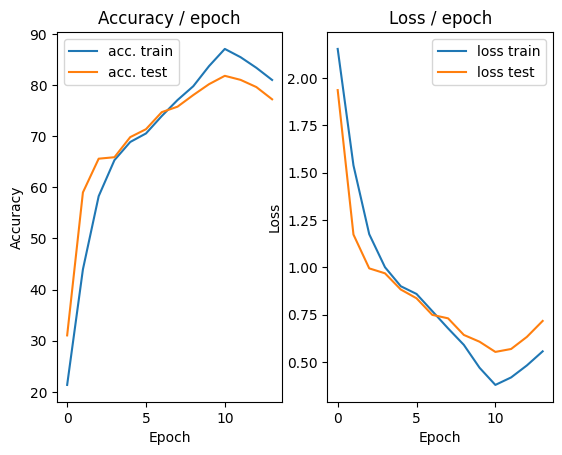

=== EPOCH 15 =====

[TRAIN Batch 000/391]	Time 0.341s (0.341s)	Loss 0.6698 (0.6698)	Prec@1  73.4 ( 73.4)	Prec@5  97.7 ( 97.7)


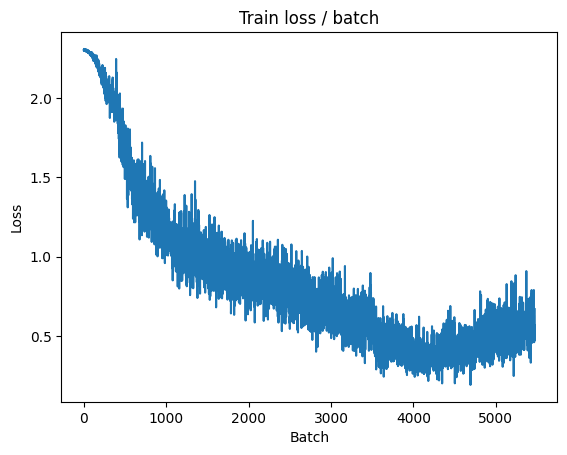

[TRAIN Batch 200/391]	Time 0.060s (0.051s)	Loss 0.6871 (0.5964)	Prec@1  75.0 ( 79.8)	Prec@5 100.0 ( 98.8)


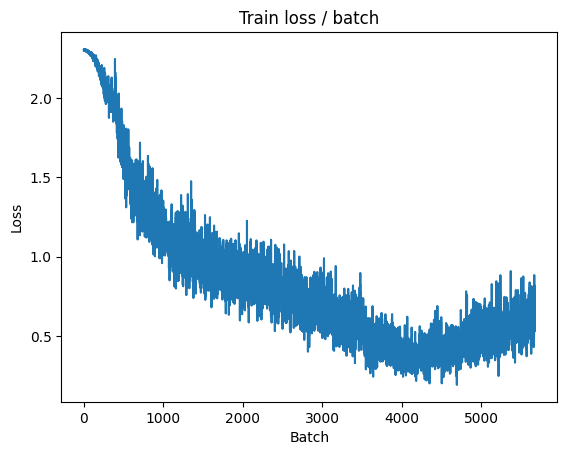


===============> Total time 19s	Avg loss 0.6145	Avg Prec@1 79.24 %	Avg Prec@5 98.80 %

Learning Rate after epoch 15: 0.100000
[EVAL Batch 000/079]	Time 0.144s (0.144s)	Loss 0.8177 (0.8177)	Prec@1  75.0 ( 75.0)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.8112	Avg Prec@1 74.29 %	Avg Prec@5 97.59 %



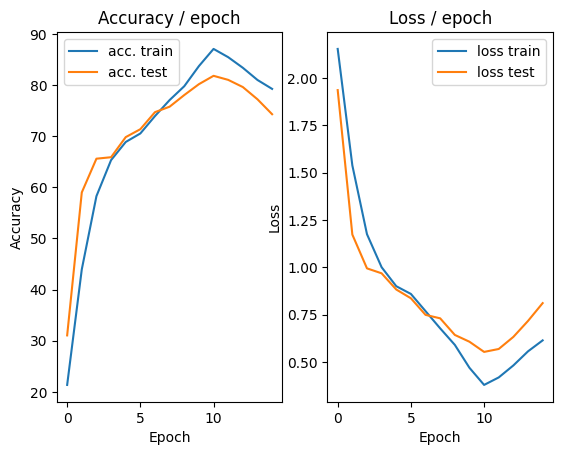

In [ ]:
main(128, 0.1, cuda = True)

## Regularization of the network by dropout

In [ ]:
class ConvNet(nn.Module):
    """
    This class defines the structure of the neural network
    """

    def __init__(self):
        super(ConvNet, self).__init__()
        # We first define the convolution and pooling layers as a features extractor
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),

            nn.Conv2d(32, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2,2), stride = 2, padding=0),

            nn.Conv2d(64, 128, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            #Modification of the pool3 layer to add the option ceil_mode
            nn.MaxPool2d((2, 2), stride=2, padding=0, ceil_mode=True),
        )
        # We then define fully connected layers as a classifier
        self.classifier = nn.Sequential(
            nn.Linear(128*4*4, 1000),
            nn.ReLU(),
            nn.Dropout(0.5), #Add a dropout layer between fc4 and fc5
            nn.Linear(1000, 10)
            # Reminder: The softmax is included in the loss, do not put it here
        )

    # Method called when we apply the network to an input batch
    def forward(self, input):
        bsize = input.size(0) # batch size
        output = self.features(input) # output of the conv layers
        output = output.view(bsize, -1) # we flatten the 2D feature maps into one 1D vector for each input
        output = self.classifier(output) # we compute the output of the fc layers
        return output


def get_dataset(batch_size, cuda=False):

    """
    This function loads the dataset and performs transformations on each
    image (listed in `transform = ...`).

    """
    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.ToTensor(), #Transform the PIL image to a torch tensor,
            #Adding Normalisation
            transforms.Normalize(
                mean = [0.491, 0.482, 0.447],
                std = [0.202, 0.199, 0.201]
            ),
            #A random crop of size 28 × 28 pixels
            transforms.transforms.RandomCrop(28),
            #A random horizontal symmetry of the image
            transforms.transforms.RandomHorizontalFlip()
        ]))
    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.ToTensor(),
            #Adding Normalisation
            transforms.Normalize(
                mean = [0.491, 0.482, 0.447],
                std = [0.202, 0.199, 0.201]
            ),
            #A centered crop size 28 in test
            transforms.transforms.CenterCrop(28)
        ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader



def epoch(data, model, criterion, optimizer=None, cuda=False):
    """
    Make a pass (called epoch in English) on the data `data` with the
     model `model`. Evaluates `criterion` as loss.
     If `optimizer` is given, perform a training epoch using
     the given optimizer, otherwise, perform an evaluation epoch (no backward)
     of the model.
    """

    # indicates whether the model is in eval or train mode (some layers behave differently in train and eval)
    model.eval() if optimizer is None else model.train()

    # objects to store metric averages
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # we iterate on the batches
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # only with GPU, and not with CPU
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward if we are training
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # compute metrics
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # update
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # print info
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Print summary
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss


def main(batch_size=128, lr=0.1, epochs=15, cuda=False):

    # ex :
    #   {"batch_size": 128, "epochs": 5, "lr": 0.1}

    # define model, loss, optim
    model = ConvNet()
    criterion = nn.CrossEntropyLoss()
    #Create the scheduler
    optimizer = torch.optim.SGD(model.parameters(), lr)
    lr_sched = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.95) #

    if cuda: # only with GPU, and not with CPU
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # Get the data
    train, test = get_dataset(batch_size, cuda)

    # init plots
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # We iterate on the epochs
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
        # Train phase
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        # Step the scheduler to adjust the learning rate after the training epoch
        lr_sched.step()
        # Test phase
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
        # plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)

Files already downloaded and verified
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.193s (0.193s)	Loss 2.3039 (2.3039)	Prec@1   5.5 (  5.5)	Prec@5  49.2 ( 49.2)


<Figure size 640x480 with 0 Axes>

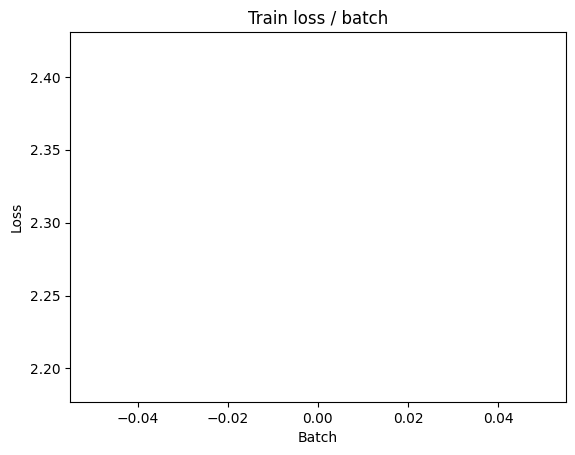

[TRAIN Batch 200/391]	Time 0.113s (0.051s)	Loss 1.7826 (1.9730)	Prec@1  29.7 ( 27.6)	Prec@5  85.2 ( 78.4)


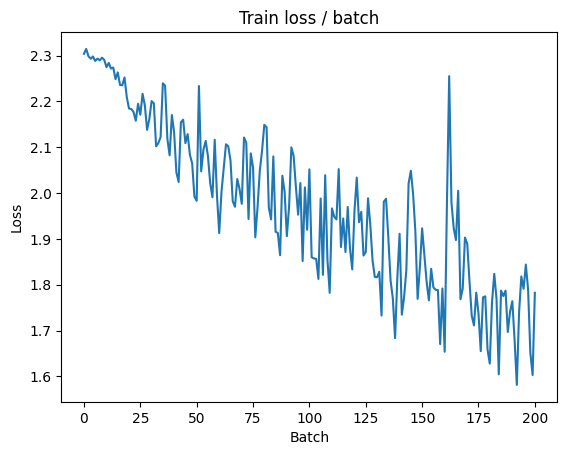


===============> Total time 23s	Avg loss 1.8121	Avg Prec@1 33.40 %	Avg Prec@5 83.77 %

[EVAL Batch 000/079]	Time 0.303s (0.303s)	Loss 1.6423 (1.6423)	Prec@1  43.8 ( 43.8)	Prec@5  85.9 ( 85.9)

===============> Total time 3s	Avg loss 1.5444	Avg Prec@1 44.19 %	Avg Prec@5 91.60 %



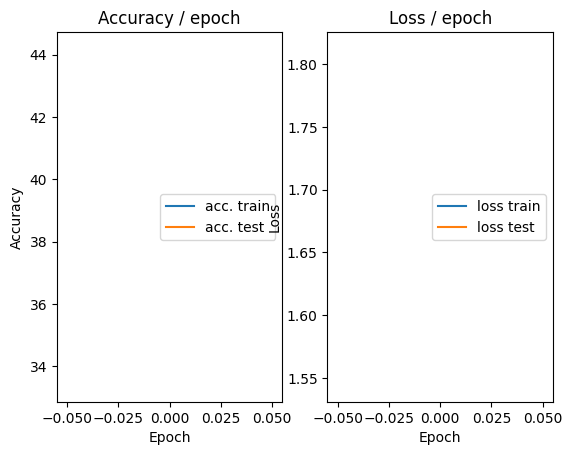

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.204s (0.204s)	Loss 1.5375 (1.5375)	Prec@1  39.8 ( 39.8)	Prec@5  95.3 ( 95.3)


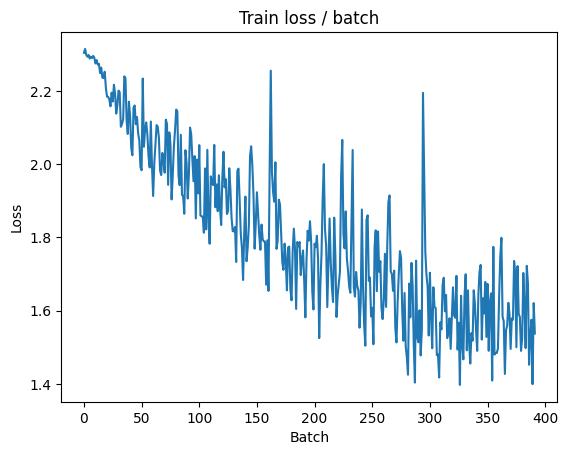

[TRAIN Batch 200/391]	Time 0.018s (0.051s)	Loss 1.3838 (1.4744)	Prec@1  46.9 ( 46.7)	Prec@5  94.5 ( 92.3)


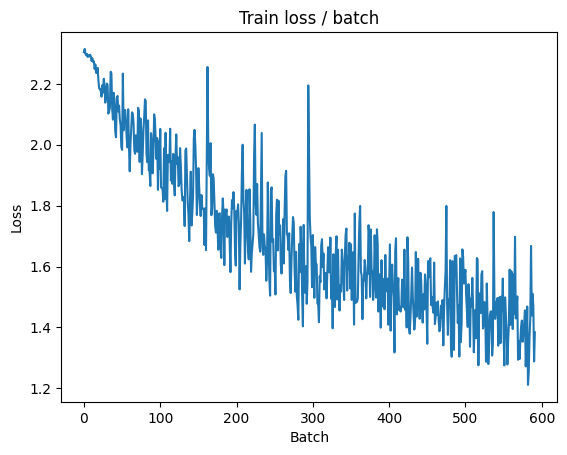


===============> Total time 19s	Avg loss 1.4140	Avg Prec@1 49.24 %	Avg Prec@5 92.96 %

[EVAL Batch 000/079]	Time 0.161s (0.161s)	Loss 1.2194 (1.2194)	Prec@1  58.6 ( 58.6)	Prec@5  95.3 ( 95.3)

===============> Total time 3s	Avg loss 1.2223	Avg Prec@1 56.47 %	Avg Prec@5 95.17 %



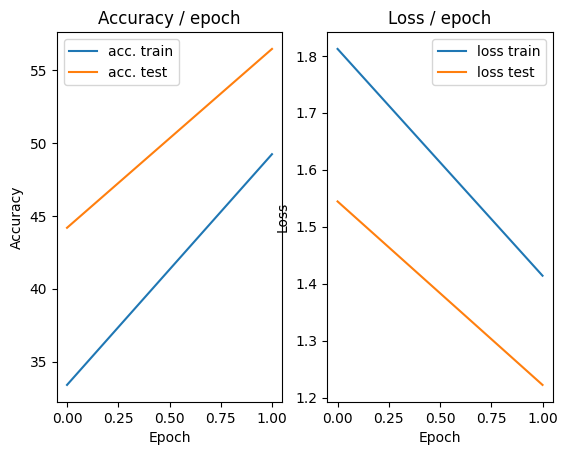

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.321s (0.321s)	Loss 1.2126 (1.2126)	Prec@1  59.4 ( 59.4)	Prec@5  96.1 ( 96.1)


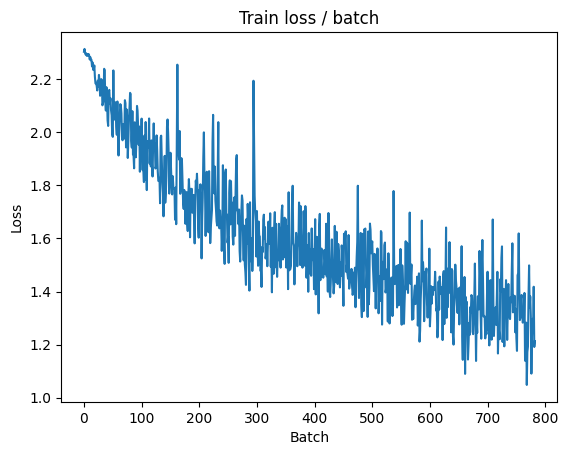

[TRAIN Batch 200/391]	Time 0.016s (0.049s)	Loss 1.0945 (1.2573)	Prec@1  63.3 ( 55.5)	Prec@5  93.0 ( 94.6)


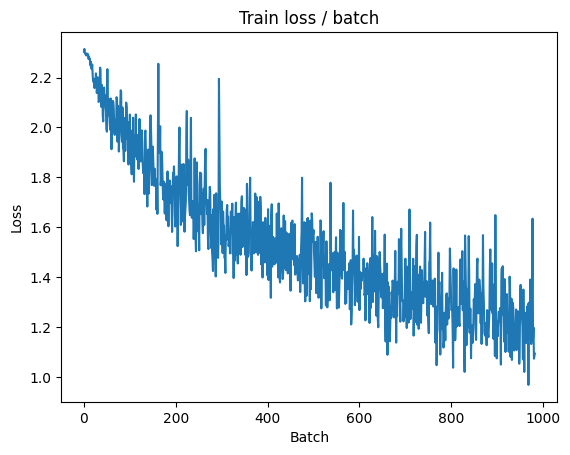


===============> Total time 19s	Avg loss 1.2142	Avg Prec@1 57.10 %	Avg Prec@5 95.09 %

[EVAL Batch 000/079]	Time 0.159s (0.159s)	Loss 1.2778 (1.2778)	Prec@1  57.0 ( 57.0)	Prec@5  95.3 ( 95.3)

===============> Total time 2s	Avg loss 1.2915	Avg Prec@1 54.12 %	Avg Prec@5 93.55 %



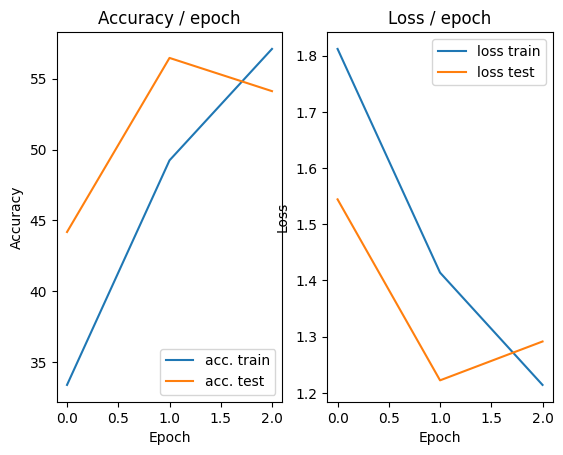

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.190s (0.190s)	Loss 1.3999 (1.3999)	Prec@1  53.1 ( 53.1)	Prec@5  91.4 ( 91.4)


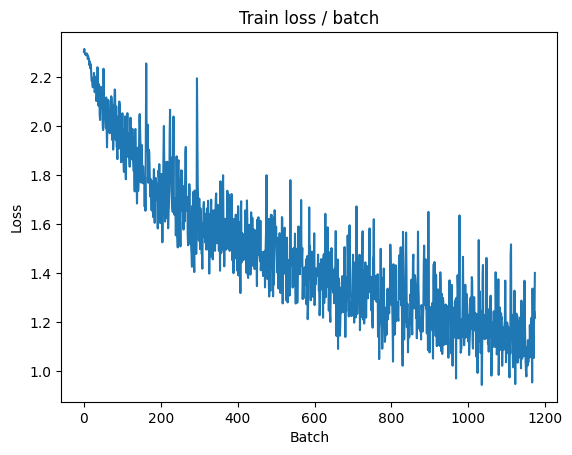

[TRAIN Batch 200/391]	Time 0.016s (0.058s)	Loss 1.0603 (1.0689)	Prec@1  61.7 ( 62.6)	Prec@5  96.9 ( 96.2)


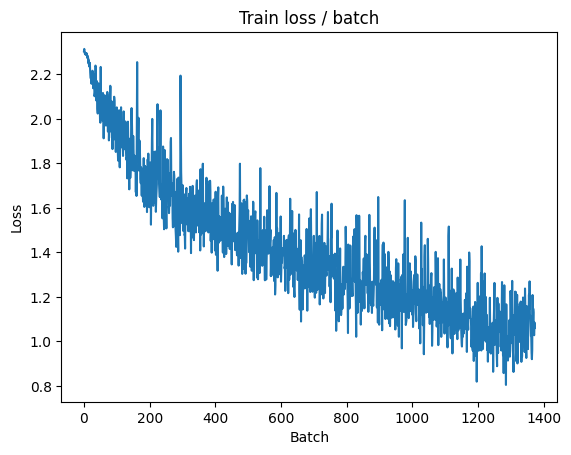


===============> Total time 21s	Avg loss 1.0521	Avg Prec@1 63.19 %	Avg Prec@5 96.35 %

[EVAL Batch 000/079]	Time 0.177s (0.177s)	Loss 0.9551 (0.9551)	Prec@1  70.3 ( 70.3)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.9516	Avg Prec@1 66.56 %	Avg Prec@5 97.20 %



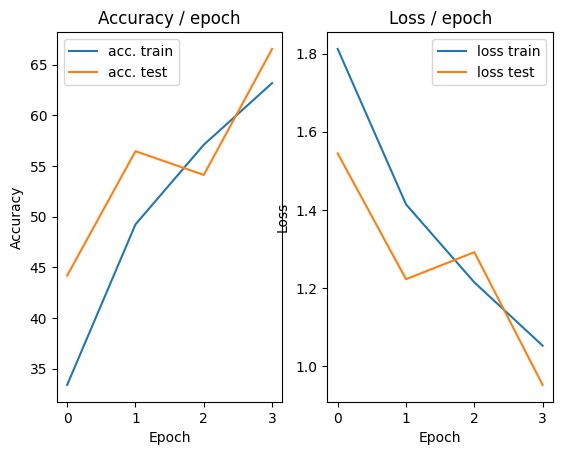

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.195s (0.195s)	Loss 0.9208 (0.9208)	Prec@1  64.8 ( 64.8)	Prec@5  97.7 ( 97.7)


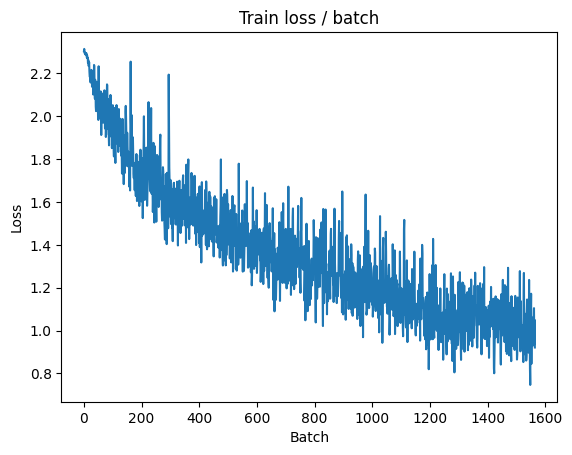

[TRAIN Batch 200/391]	Time 0.008s (0.053s)	Loss 0.9031 (0.9640)	Prec@1  69.5 ( 66.6)	Prec@5  96.1 ( 96.9)


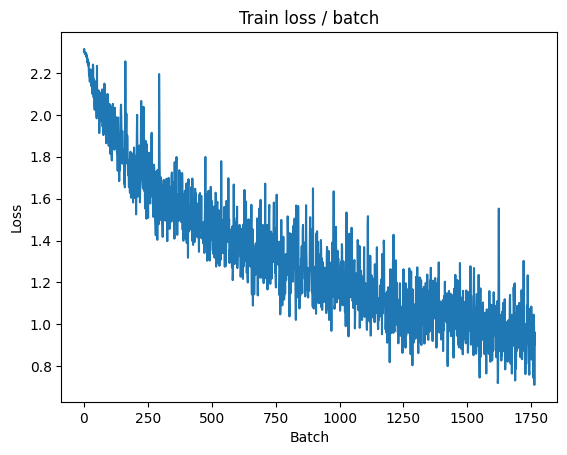


===============> Total time 20s	Avg loss 0.9402	Avg Prec@1 67.37 %	Avg Prec@5 97.11 %

[EVAL Batch 000/079]	Time 0.159s (0.159s)	Loss 0.8606 (0.8606)	Prec@1  69.5 ( 69.5)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.9020	Avg Prec@1 68.96 %	Avg Prec@5 97.58 %



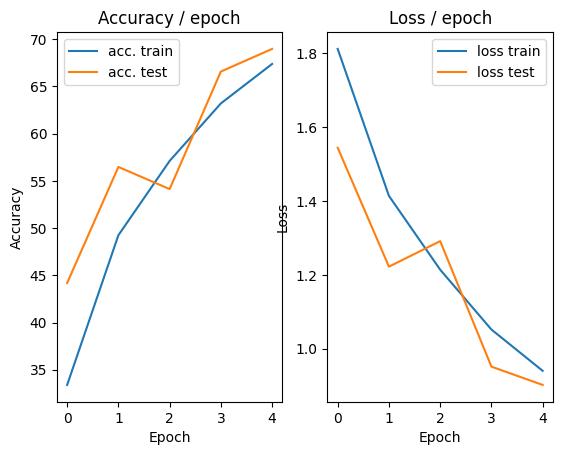

=== EPOCH 6 =====

[TRAIN Batch 000/391]	Time 0.192s (0.192s)	Loss 0.9534 (0.9534)	Prec@1  61.7 ( 61.7)	Prec@5  99.2 ( 99.2)


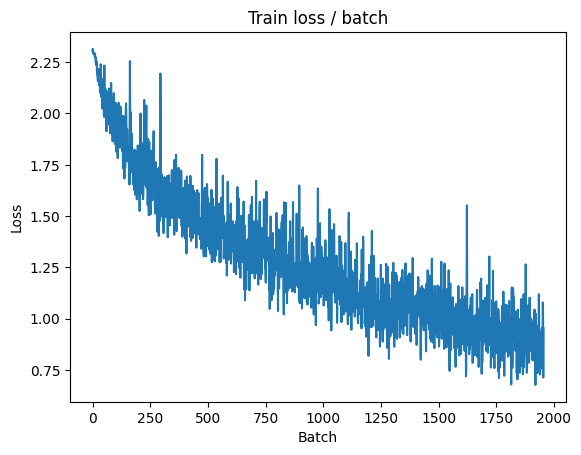

[TRAIN Batch 200/391]	Time 0.017s (0.054s)	Loss 0.7448 (0.8593)	Prec@1  74.2 ( 70.1)	Prec@5  98.4 ( 97.6)


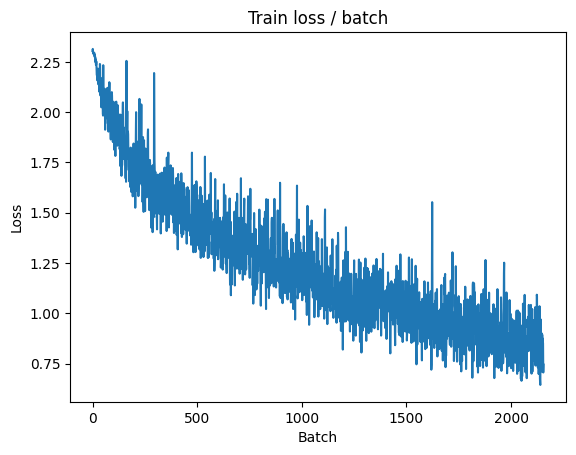


===============> Total time 19s	Avg loss 0.8482	Avg Prec@1 70.35 %	Avg Prec@5 97.68 %

[EVAL Batch 000/079]	Time 0.202s (0.202s)	Loss 0.8308 (0.8308)	Prec@1  71.9 ( 71.9)	Prec@5  96.9 ( 96.9)

===============> Total time 3s	Avg loss 0.8316	Avg Prec@1 71.08 %	Avg Prec@5 97.73 %



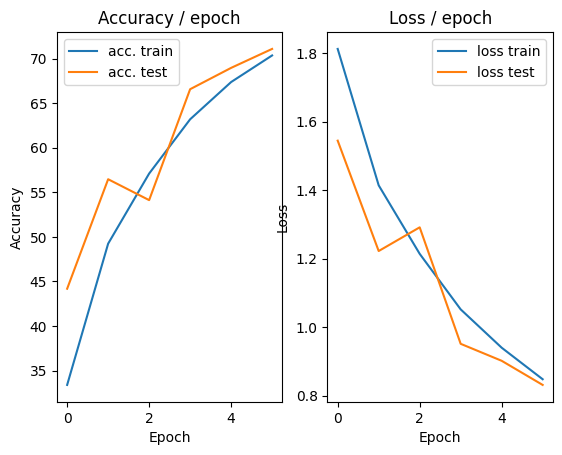

=== EPOCH 7 =====

[TRAIN Batch 000/391]	Time 0.212s (0.212s)	Loss 0.7142 (0.7142)	Prec@1  74.2 ( 74.2)	Prec@5  99.2 ( 99.2)


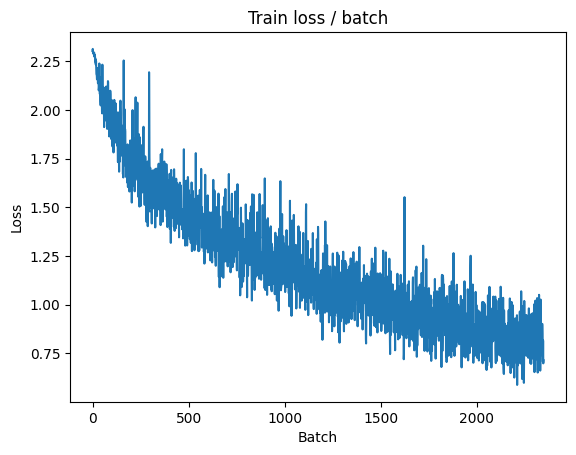

[TRAIN Batch 200/391]	Time 0.015s (0.051s)	Loss 0.6899 (0.7801)	Prec@1  72.7 ( 72.8)	Prec@5  98.4 ( 98.1)


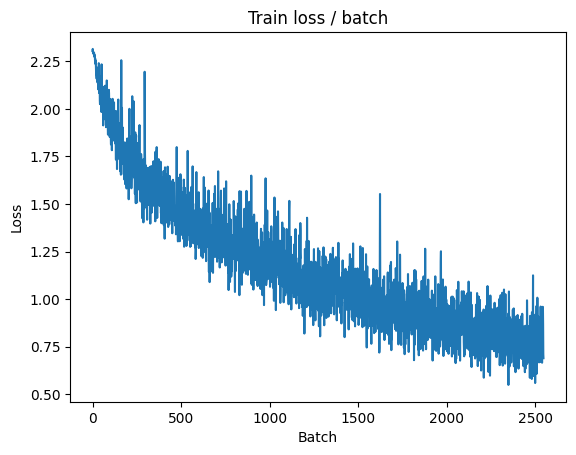


===============> Total time 19s	Avg loss 0.7762	Avg Prec@1 73.00 %	Avg Prec@5 98.09 %

[EVAL Batch 000/079]	Time 0.159s (0.159s)	Loss 0.7802 (0.7802)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.7882	Avg Prec@1 72.87 %	Avg Prec@5 97.82 %



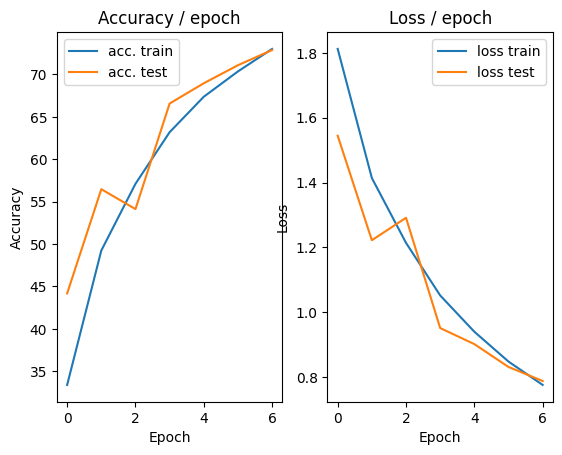

=== EPOCH 8 =====

[TRAIN Batch 000/391]	Time 0.259s (0.259s)	Loss 0.7971 (0.7971)	Prec@1  72.7 ( 72.7)	Prec@5  98.4 ( 98.4)


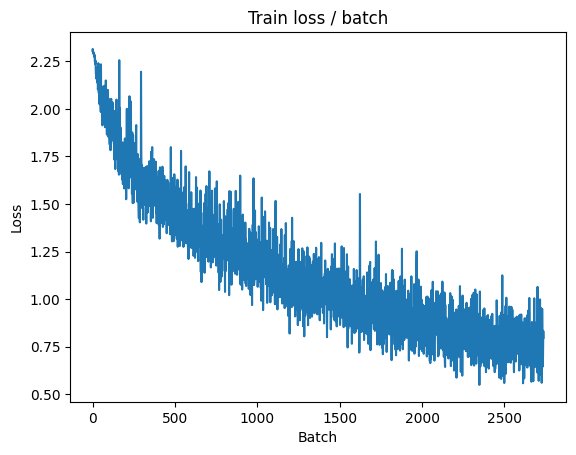

[TRAIN Batch 200/391]	Time 0.021s (0.048s)	Loss 0.7753 (0.7446)	Prec@1  69.5 ( 74.0)	Prec@5  97.7 ( 98.2)


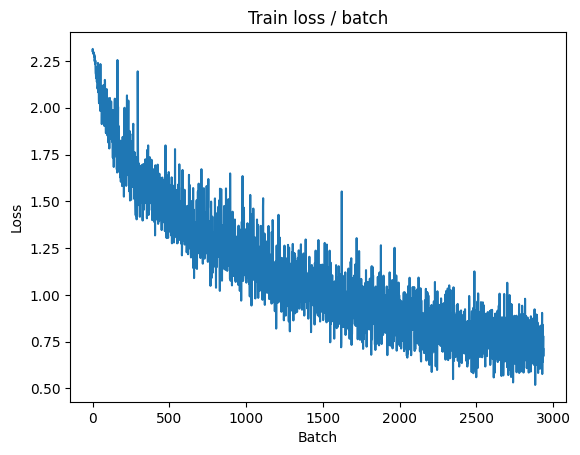


===============> Total time 19s	Avg loss 0.7329	Avg Prec@1 74.55 %	Avg Prec@5 98.23 %

[EVAL Batch 000/079]	Time 0.171s (0.171s)	Loss 0.6938 (0.6938)	Prec@1  78.9 ( 78.9)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.7414	Avg Prec@1 74.03 %	Avg Prec@5 98.04 %



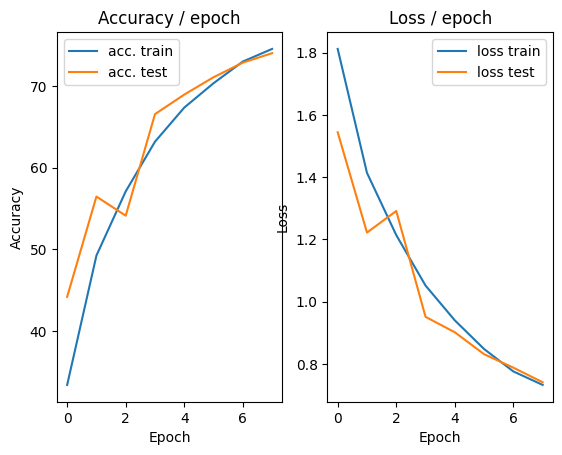

=== EPOCH 9 =====

[TRAIN Batch 000/391]	Time 0.202s (0.202s)	Loss 0.6336 (0.6336)	Prec@1  76.6 ( 76.6)	Prec@5  99.2 ( 99.2)


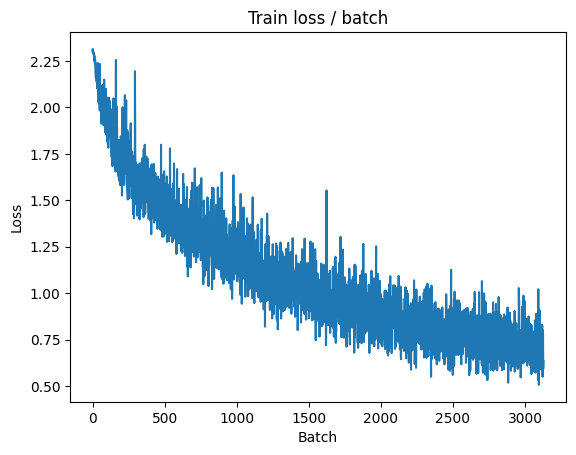

[TRAIN Batch 200/391]	Time 0.010s (0.052s)	Loss 0.5946 (0.6890)	Prec@1  81.2 ( 76.0)	Prec@5  99.2 ( 98.4)


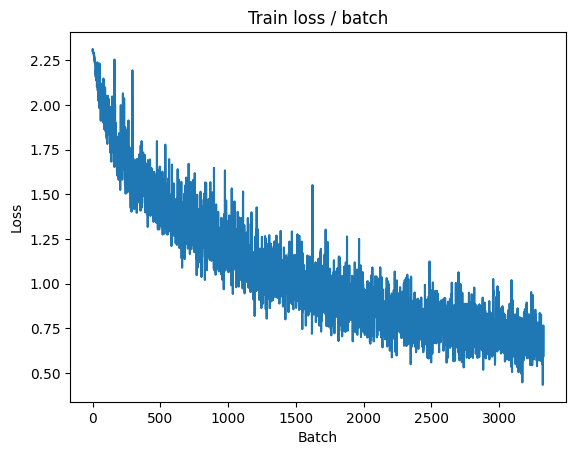


===============> Total time 20s	Avg loss 0.6809	Avg Prec@1 76.36 %	Avg Prec@5 98.50 %

[EVAL Batch 000/079]	Time 0.153s (0.153s)	Loss 0.5975 (0.5975)	Prec@1  81.2 ( 81.2)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.6832	Avg Prec@1 76.47 %	Avg Prec@5 98.52 %



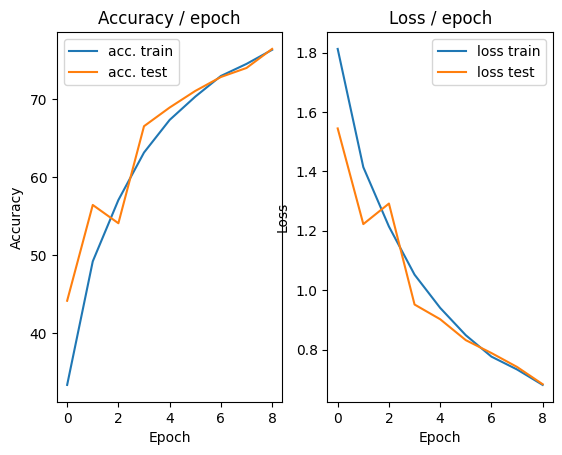

=== EPOCH 10 =====

[TRAIN Batch 000/391]	Time 0.212s (0.212s)	Loss 0.6728 (0.6728)	Prec@1  77.3 ( 77.3)	Prec@5  99.2 ( 99.2)


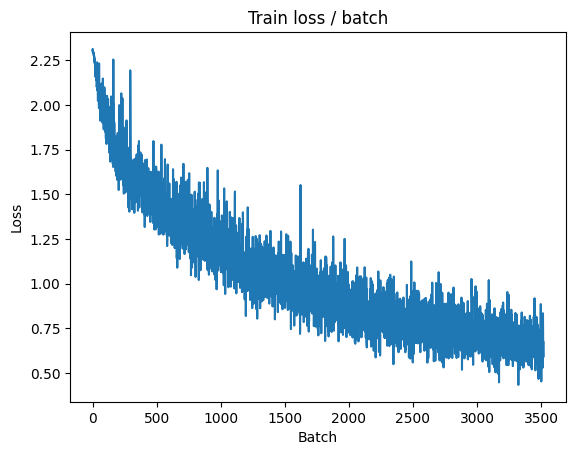

[TRAIN Batch 200/391]	Time 0.067s (0.052s)	Loss 0.7092 (0.6490)	Prec@1  73.4 ( 77.4)	Prec@5  99.2 ( 98.8)


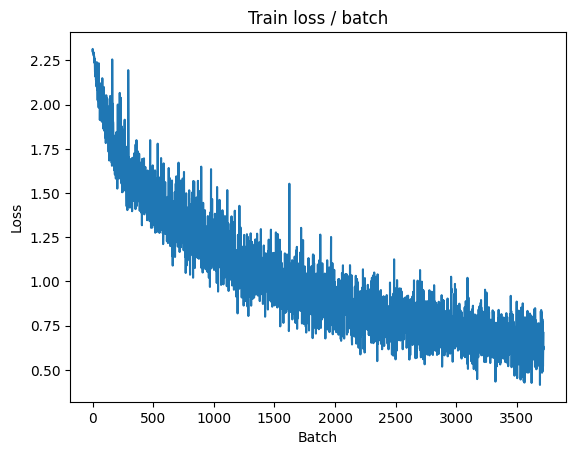


===============> Total time 19s	Avg loss 0.6449	Avg Prec@1 77.65 %	Avg Prec@5 98.71 %

[EVAL Batch 000/079]	Time 0.210s (0.210s)	Loss 0.6459 (0.6459)	Prec@1  77.3 ( 77.3)	Prec@5  99.2 ( 99.2)

===============> Total time 3s	Avg loss 0.6834	Avg Prec@1 76.61 %	Avg Prec@5 98.41 %



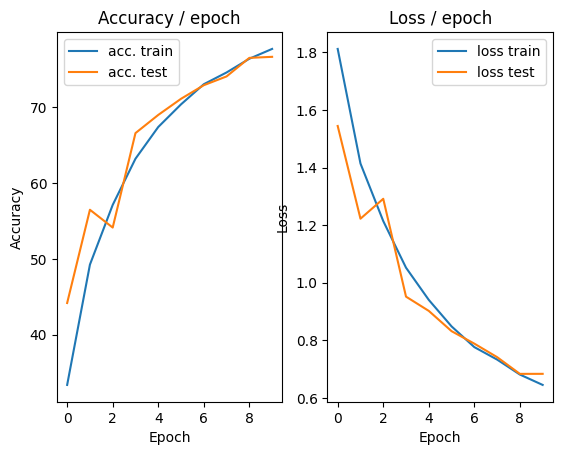

=== EPOCH 11 =====

[TRAIN Batch 000/391]	Time 0.202s (0.202s)	Loss 0.6949 (0.6949)	Prec@1  75.0 ( 75.0)	Prec@5  99.2 ( 99.2)


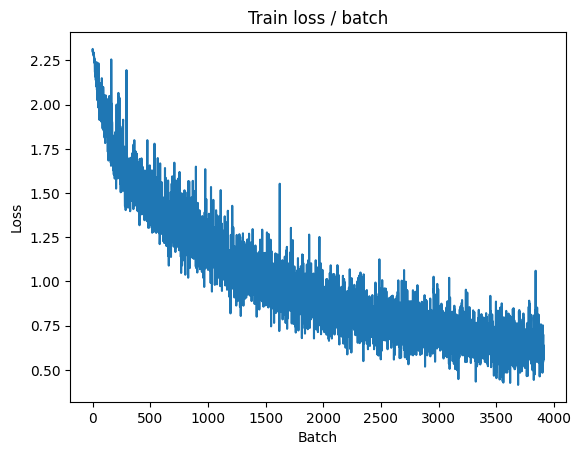

[TRAIN Batch 200/391]	Time 0.016s (0.054s)	Loss 0.6840 (0.6087)	Prec@1  75.0 ( 78.8)	Prec@5  98.4 ( 98.8)


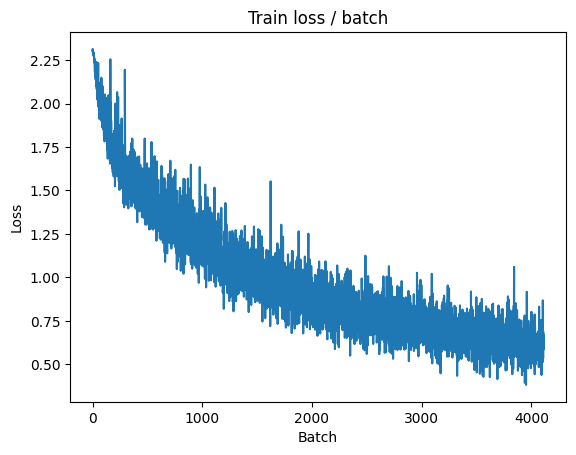


===============> Total time 19s	Avg loss 0.6108	Avg Prec@1 78.79 %	Avg Prec@5 98.86 %

[EVAL Batch 000/079]	Time 0.161s (0.161s)	Loss 0.5640 (0.5640)	Prec@1  84.4 ( 84.4)	Prec@5  97.7 ( 97.7)

===============> Total time 4s	Avg loss 0.6254	Avg Prec@1 78.89 %	Avg Prec@5 98.59 %



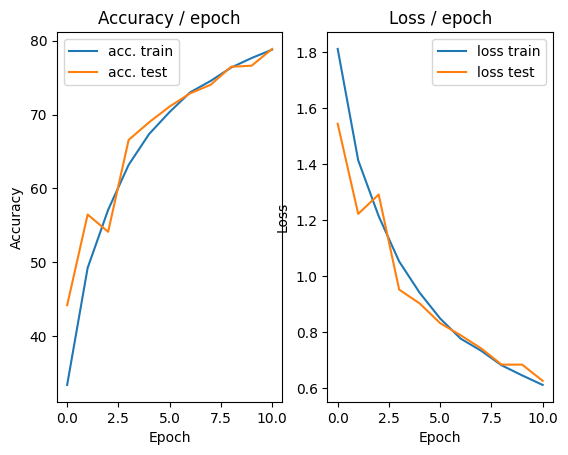

=== EPOCH 12 =====

[TRAIN Batch 000/391]	Time 0.231s (0.231s)	Loss 0.4574 (0.4574)	Prec@1  83.6 ( 83.6)	Prec@5 100.0 (100.0)


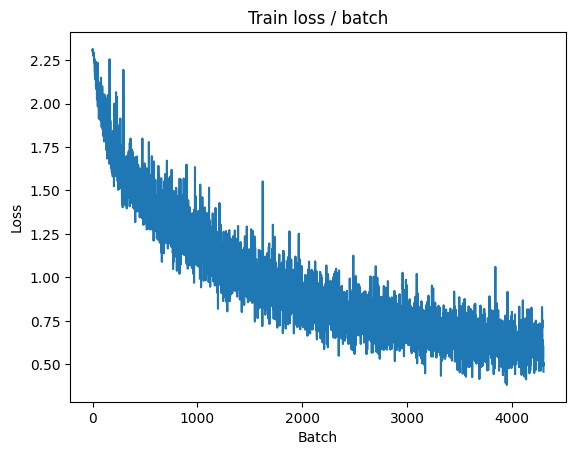

[TRAIN Batch 200/391]	Time 0.096s (0.048s)	Loss 0.6461 (0.5887)	Prec@1  78.9 ( 79.5)	Prec@5  98.4 ( 99.0)


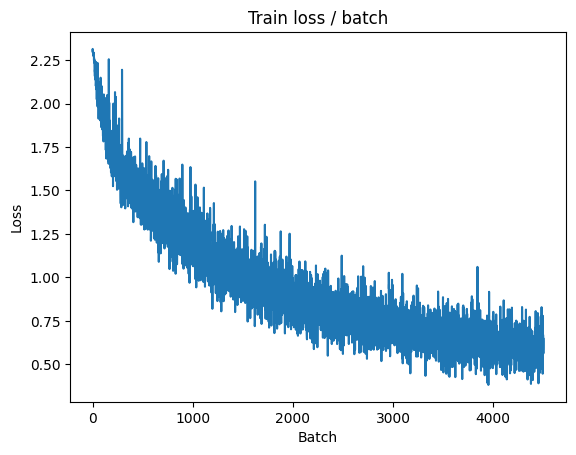


===============> Total time 19s	Avg loss 0.5841	Avg Prec@1 79.79 %	Avg Prec@5 98.96 %

[EVAL Batch 000/079]	Time 0.172s (0.172s)	Loss 0.5197 (0.5197)	Prec@1  83.6 ( 83.6)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.6020	Avg Prec@1 79.59 %	Avg Prec@5 98.80 %



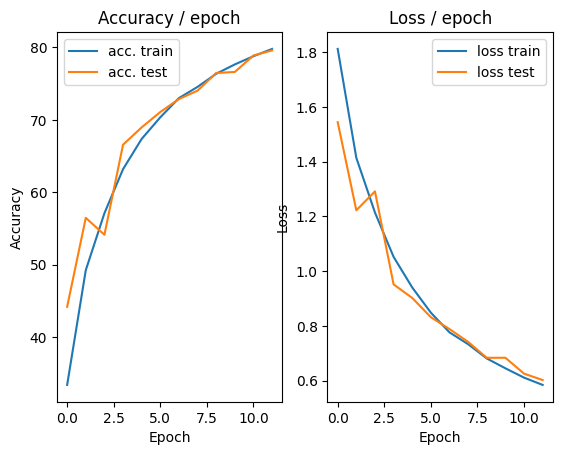

=== EPOCH 13 =====

[TRAIN Batch 000/391]	Time 0.334s (0.334s)	Loss 0.4852 (0.4852)	Prec@1  83.6 ( 83.6)	Prec@5  99.2 ( 99.2)


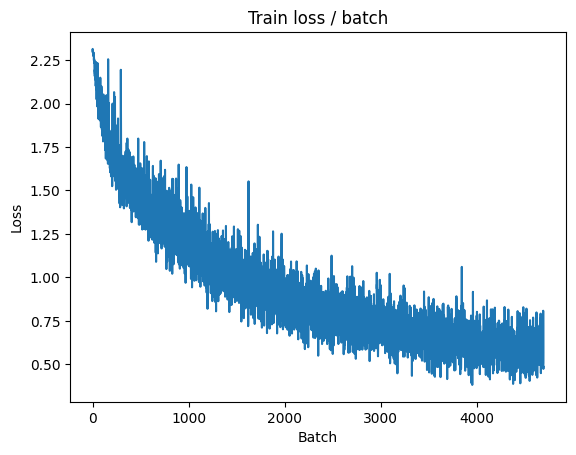

[TRAIN Batch 200/391]	Time 0.070s (0.053s)	Loss 0.5554 (0.5523)	Prec@1  80.5 ( 80.7)	Prec@5 100.0 ( 99.1)


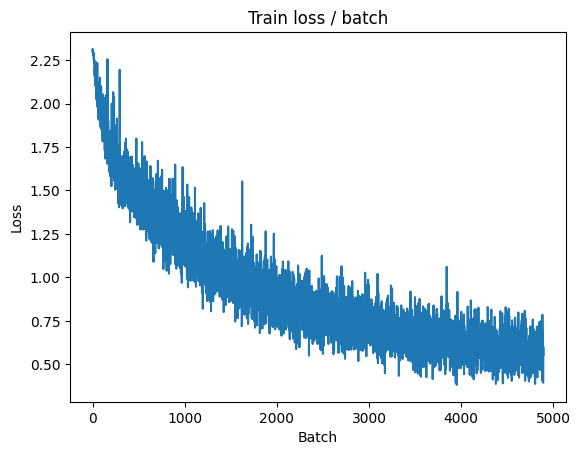


===============> Total time 20s	Avg loss 0.5534	Avg Prec@1 80.67 %	Avg Prec@5 99.08 %

[EVAL Batch 000/079]	Time 0.172s (0.172s)	Loss 0.7128 (0.7128)	Prec@1  75.8 ( 75.8)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.6505	Avg Prec@1 77.68 %	Avg Prec@5 98.73 %



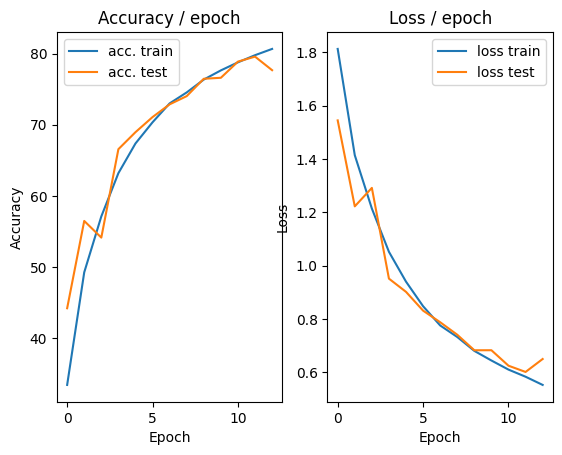

=== EPOCH 14 =====

[TRAIN Batch 000/391]	Time 0.232s (0.232s)	Loss 0.6132 (0.6132)	Prec@1  76.6 ( 76.6)	Prec@5 100.0 (100.0)


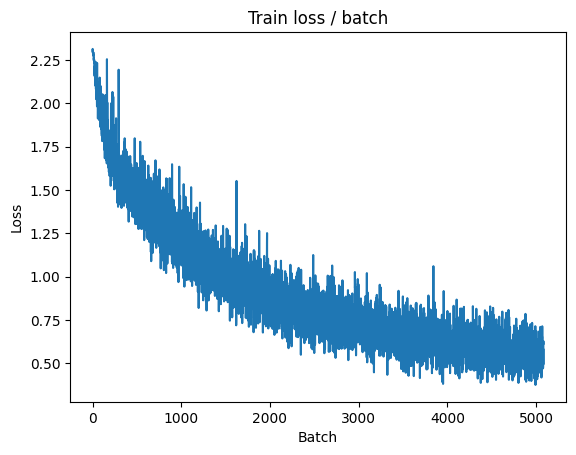

[TRAIN Batch 200/391]	Time 0.054s (0.054s)	Loss 0.5372 (0.5296)	Prec@1  77.3 ( 81.5)	Prec@5  99.2 ( 99.1)


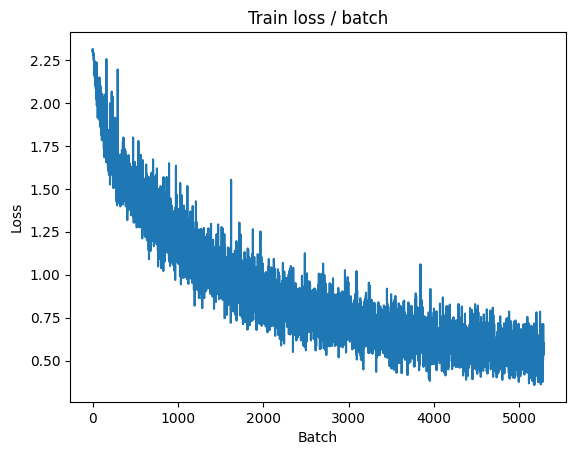


===============> Total time 20s	Avg loss 0.5313	Avg Prec@1 81.46 %	Avg Prec@5 99.14 %

[EVAL Batch 000/079]	Time 0.170s (0.170s)	Loss 0.5581 (0.5581)	Prec@1  82.8 ( 82.8)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.5939	Avg Prec@1 79.91 %	Avg Prec@5 98.81 %



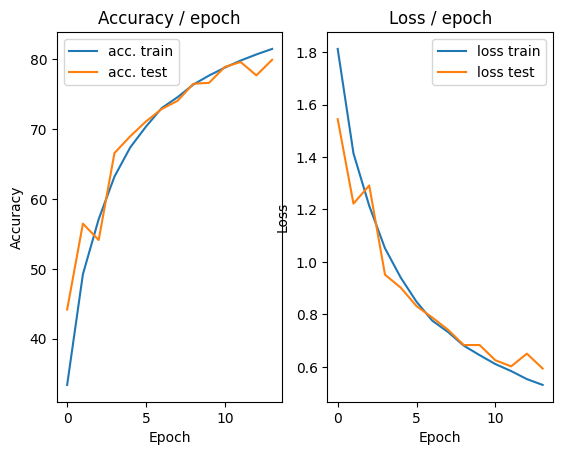

=== EPOCH 15 =====

[TRAIN Batch 000/391]	Time 0.230s (0.230s)	Loss 0.3863 (0.3863)	Prec@1  85.9 ( 85.9)	Prec@5 100.0 (100.0)


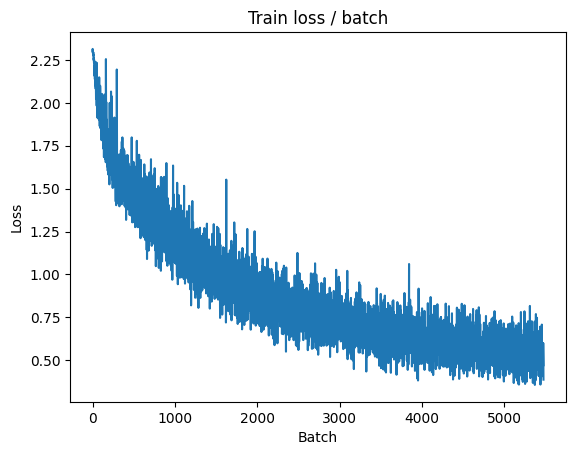

[TRAIN Batch 200/391]	Time 0.016s (0.053s)	Loss 0.4950 (0.5091)	Prec@1  84.4 ( 82.3)	Prec@5 100.0 ( 99.2)


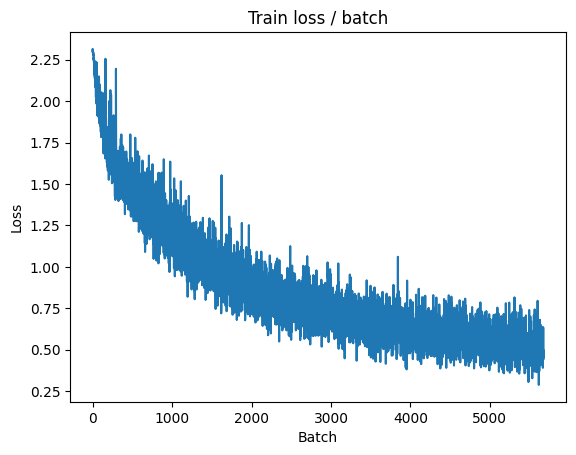


===============> Total time 20s	Avg loss 0.5105	Avg Prec@1 82.16 %	Avg Prec@5 99.14 %

[EVAL Batch 000/079]	Time 0.285s (0.285s)	Loss 0.5407 (0.5407)	Prec@1  83.6 ( 83.6)	Prec@5  97.7 ( 97.7)

===============> Total time 3s	Avg loss 0.6109	Avg Prec@1 79.02 %	Avg Prec@5 98.77 %



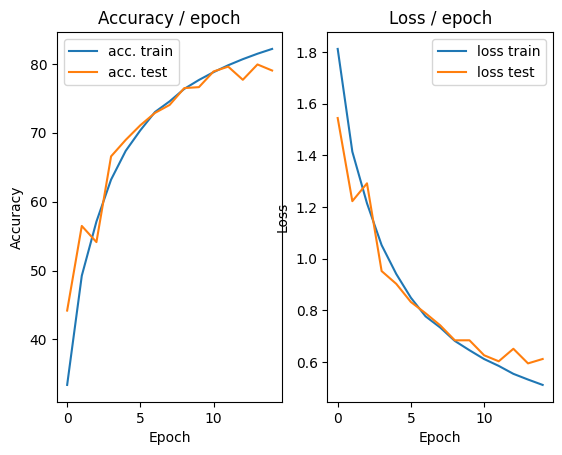

In [ ]:
main(128, 0.1, cuda = True)

## Use of Batch Normalisation


### Description of the experimental results
The accuracy remained consistent with previous experiments; however, a notable improvement was observed in epoch 14, reaching 79.91\% before slightly slowing in epoch 15. The training loss remained close to the test loss throughout, as shown in the graph, indicating that dropout effectively reduced overfitting.

In [ ]:
class ConvNet(nn.Module):
    """
    This class defines the structure of the neural network
    """

    def __init__(self):
        super(ConvNet, self).__init__()
        # We first define the convolution and pooling layers as a features extractor
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.BatchNorm2d(32),

            nn.Conv2d(32, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2,2), stride = 2, padding=0),
            nn.BatchNorm2d(64),

            nn.Conv2d(64, 128, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            #Modification of the pool3 layer to add the option ceil_mode
            nn.MaxPool2d((2, 2), stride=2, padding=0, ceil_mode=True),
            nn.BatchNorm2d(128)
        )
        # We then define fully connected layers as a classifier
        self.classifier = nn.Sequential(
            nn.Linear(128*4*4, 1000),
            nn.ReLU(),
            nn.Dropout(0.5), #Add a dropout layer between fc4 and fc5
            nn.Linear(1000, 10)
            # Reminder: The softmax is included in the loss, do not put it here
        )

    # Method called when we apply the network to an input batch
    def forward(self, input):
        bsize = input.size(0) # batch size
        output = self.features(input) # output of the conv layers
        output = output.view(bsize, -1) # we flatten the 2D feature maps into one 1D vector for each input
        output = self.classifier(output) # we compute the output of the fc layers
        return output


def get_dataset(batch_size, cuda=False):

    """
    This function loads the dataset and performs transformations on each
    image (listed in `transform = ...`).

    """
    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.ToTensor(), #Transform the PIL image to a torch tensor,
            #Adding Normalisation
            transforms.Normalize(
                mean = [0.491, 0.482, 0.447],
                std = [0.202, 0.199, 0.201]
            ),
            #A random crop of size 28 × 28 pixels
            transforms.transforms.RandomCrop(28),
            #A random horizontal symmetry of the image
            transforms.transforms.RandomHorizontalFlip()
        ]))
    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.ToTensor(),
            #Adding Normalisation
            transforms.Normalize(
                mean = [0.491, 0.482, 0.447],
                std = [0.202, 0.199, 0.201]
            ),
            #A centered crop size 28 in test
            transforms.transforms.CenterCrop(28)
        ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader



def epoch(data, model, criterion, optimizer=None, cuda=False):
    """
    Make a pass (called epoch in English) on the data `data` with the
     model `model`. Evaluates `criterion` as loss.
     If `optimizer` is given, perform a training epoch using
     the given optimizer, otherwise, perform an evaluation epoch (no backward)
     of the model.
    """

    # indicates whether the model is in eval or train mode (some layers behave differently in train and eval)
    model.eval() if optimizer is None else model.train()

    # objects to store metric averages
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # we iterate on the batches
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # only with GPU, and not with CPU
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward if we are training
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # compute metrics
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # update
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # print info
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Print summary
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss


def main(batch_size=128, lr=0.1, epochs=15, cuda=False):

    # ex :
    #   {"batch_size": 128, "epochs": 5, "lr": 0.1}

    # define model, loss, optim
    model = ConvNet()
    criterion = nn.CrossEntropyLoss()
    #Create the scheduler
    optimizer = torch.optim.SGD(model.parameters(), lr)
    lr_sched = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.95) #

    if cuda: # only with GPU, and not with CPU
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # Get the data
    train, test = get_dataset(batch_size, cuda)

    # init plots
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # We iterate on the epochs
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
        # Train phase
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        # Step the scheduler to adjust the learning rate after the training epoch
        lr_sched.step()
        # Test phase
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
        # plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)

Files already downloaded and verified
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.350s (0.350s)	Loss 2.3720 (2.3720)	Prec@1   7.0 (  7.0)	Prec@5  48.4 ( 48.4)


<Figure size 640x480 with 0 Axes>

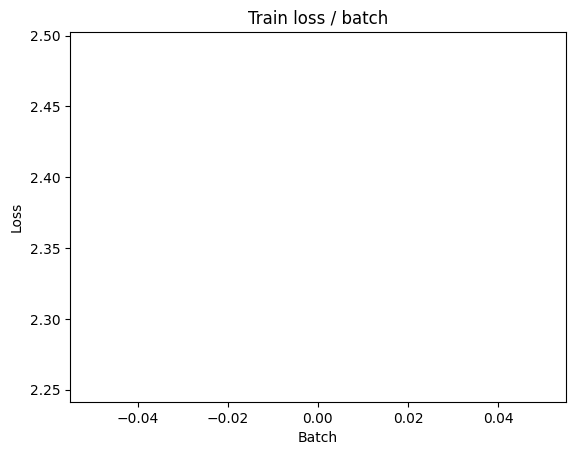

[TRAIN Batch 200/391]	Time 0.018s (0.048s)	Loss 1.4138 (1.5699)	Prec@1  48.4 ( 42.9)	Prec@5  94.5 ( 90.0)


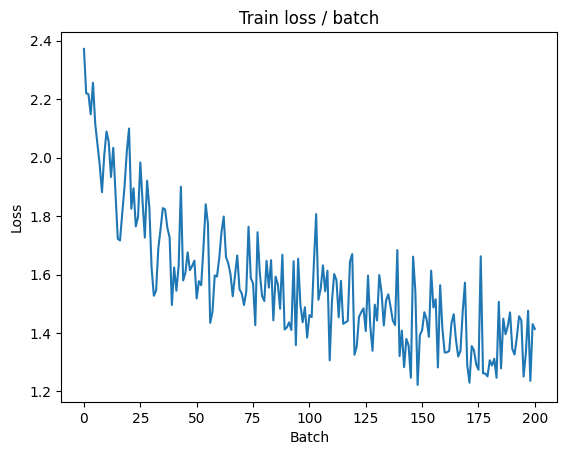


===============> Total time 19s	Avg loss 1.4174	Avg Prec@1 48.75 %	Avg Prec@5 92.29 %

[EVAL Batch 000/079]	Time 0.161s (0.161s)	Loss 0.9460 (0.9460)	Prec@1  71.1 ( 71.1)	Prec@5  95.3 ( 95.3)

===============> Total time 2s	Avg loss 1.0398	Avg Prec@1 63.26 %	Avg Prec@5 96.58 %



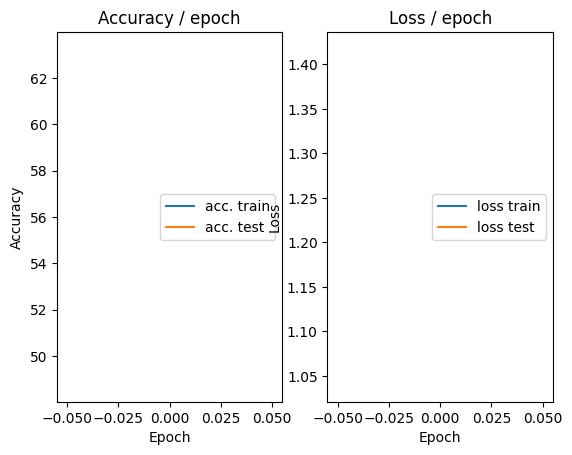

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.232s (0.232s)	Loss 1.0914 (1.0914)	Prec@1  64.8 ( 64.8)	Prec@5  94.5 ( 94.5)


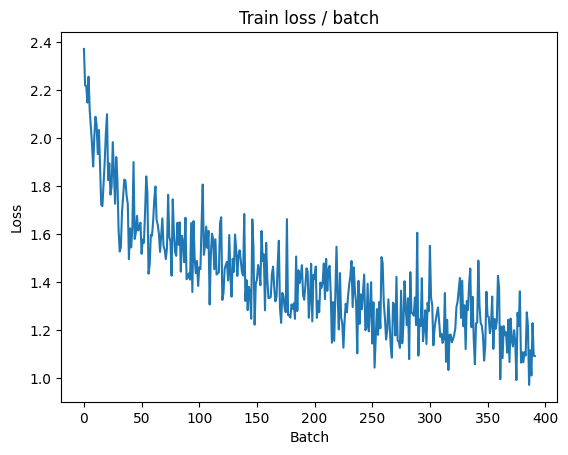

[TRAIN Batch 200/391]	Time 0.015s (0.052s)	Loss 0.9257 (1.0928)	Prec@1  64.1 ( 61.4)	Prec@5 100.0 ( 96.2)


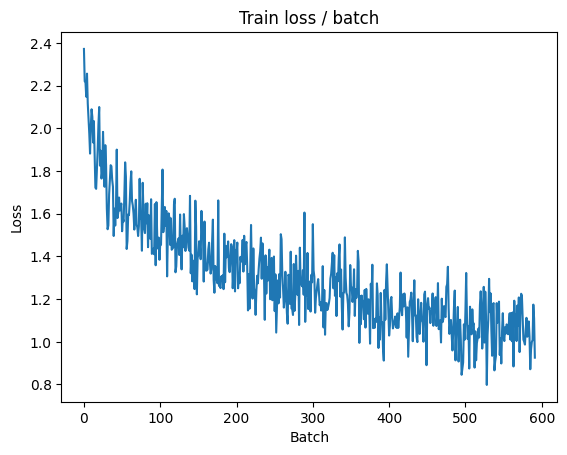


===============> Total time 20s	Avg loss 1.0401	Avg Prec@1 63.26 %	Avg Prec@5 96.54 %

[EVAL Batch 000/079]	Time 0.167s (0.167s)	Loss 0.8820 (0.8820)	Prec@1  68.0 ( 68.0)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.9402	Avg Prec@1 66.52 %	Avg Prec@5 97.43 %



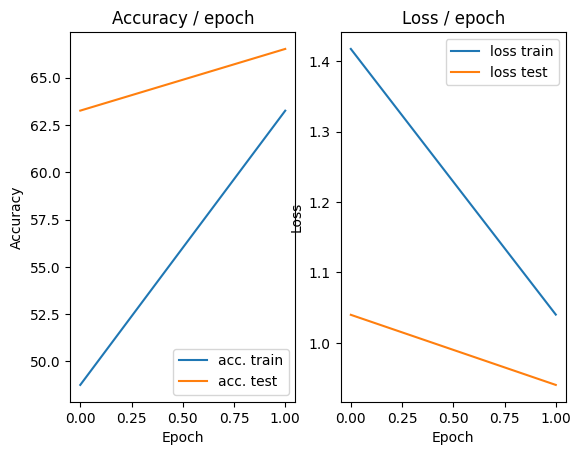

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.228s (0.228s)	Loss 1.1226 (1.1226)	Prec@1  64.1 ( 64.1)	Prec@5  96.9 ( 96.9)


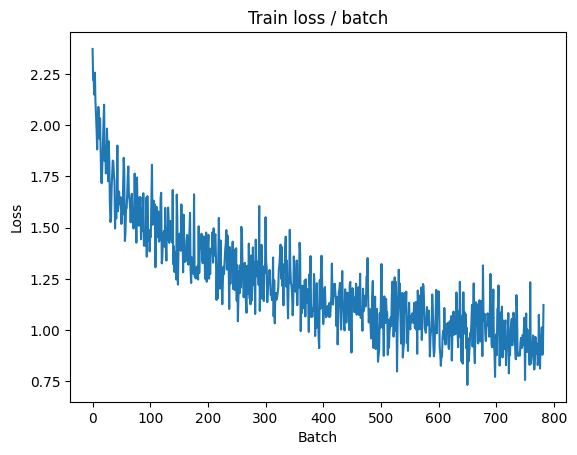

[TRAIN Batch 200/391]	Time 0.017s (0.054s)	Loss 0.7728 (0.9022)	Prec@1  76.6 ( 68.1)	Prec@5  98.4 ( 97.3)


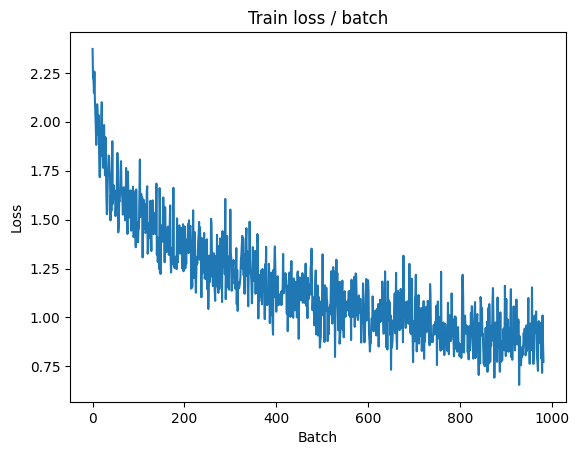


===============> Total time 20s	Avg loss 0.8849	Avg Prec@1 68.77 %	Avg Prec@5 97.46 %

[EVAL Batch 000/079]	Time 0.190s (0.190s)	Loss 0.7023 (0.7023)	Prec@1  75.0 ( 75.0)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.7993	Avg Prec@1 71.88 %	Avg Prec@5 98.02 %



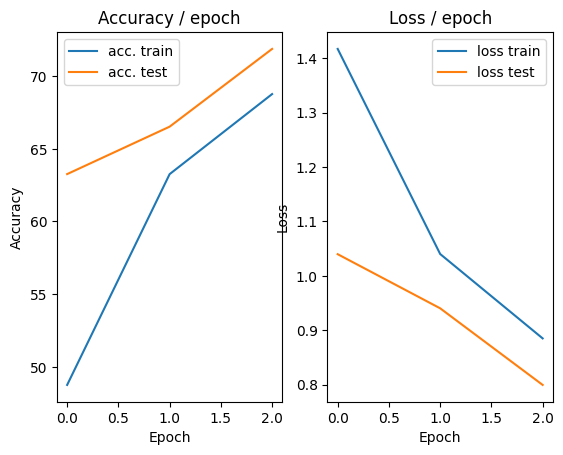

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.205s (0.205s)	Loss 0.8664 (0.8664)	Prec@1  68.8 ( 68.8)	Prec@5  98.4 ( 98.4)


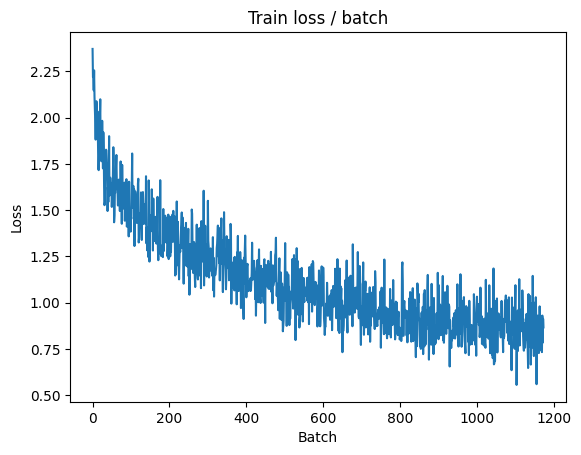

[TRAIN Batch 200/391]	Time 0.030s (0.053s)	Loss 0.6398 (0.7847)	Prec@1  75.8 ( 72.2)	Prec@5 100.0 ( 98.1)


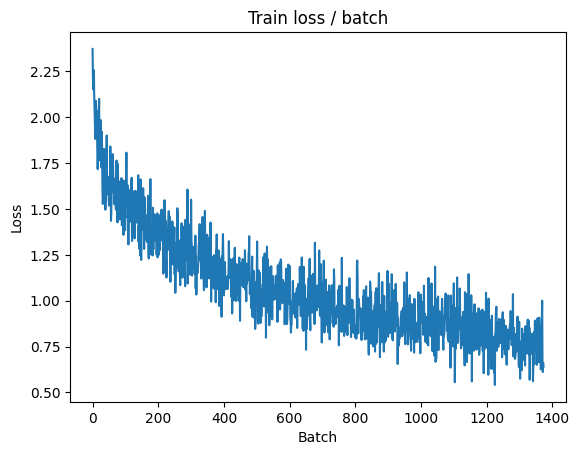


===============> Total time 19s	Avg loss 0.7776	Avg Prec@1 72.60 %	Avg Prec@5 98.09 %

[EVAL Batch 000/079]	Time 0.186s (0.186s)	Loss 0.7236 (0.7236)	Prec@1  76.6 ( 76.6)	Prec@5  97.7 ( 97.7)

===============> Total time 4s	Avg loss 0.8490	Avg Prec@1 70.38 %	Avg Prec@5 98.26 %



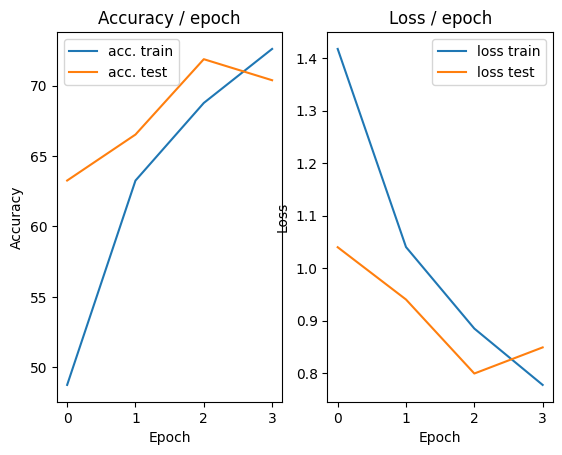

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.199s (0.199s)	Loss 0.7639 (0.7639)	Prec@1  72.7 ( 72.7)	Prec@5  98.4 ( 98.4)


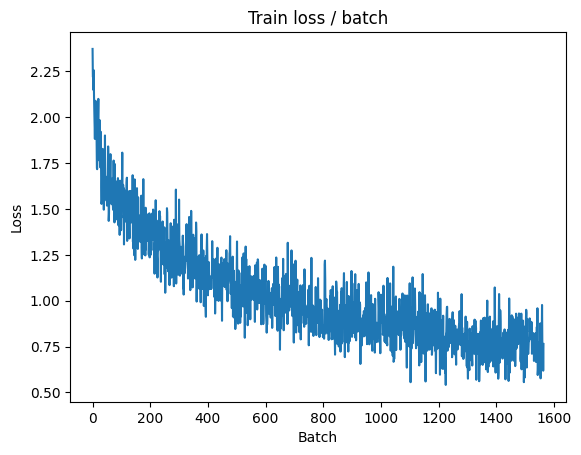

[TRAIN Batch 200/391]	Time 0.022s (0.046s)	Loss 0.6987 (0.7143)	Prec@1  75.0 ( 75.0)	Prec@5 100.0 ( 98.4)


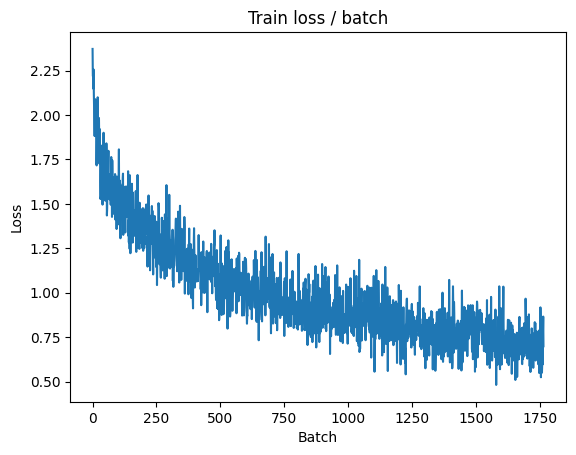


===============> Total time 19s	Avg loss 0.7096	Avg Prec@1 75.17 %	Avg Prec@5 98.39 %

[EVAL Batch 000/079]	Time 0.167s (0.167s)	Loss 0.5738 (0.5738)	Prec@1  85.2 ( 85.2)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.7179	Avg Prec@1 74.86 %	Avg Prec@5 98.25 %



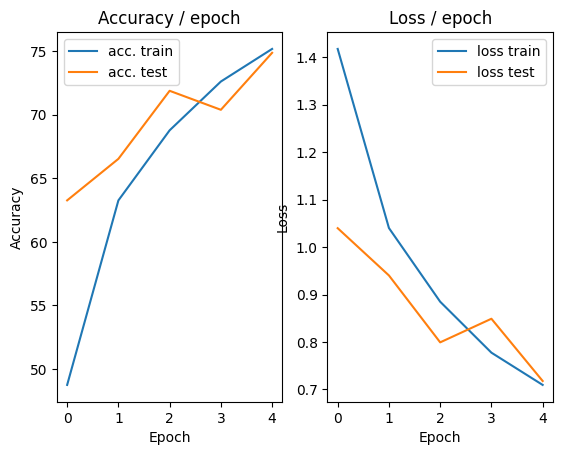

=== EPOCH 6 =====

[TRAIN Batch 000/391]	Time 0.313s (0.313s)	Loss 0.6716 (0.6716)	Prec@1  71.9 ( 71.9)	Prec@5 100.0 (100.0)


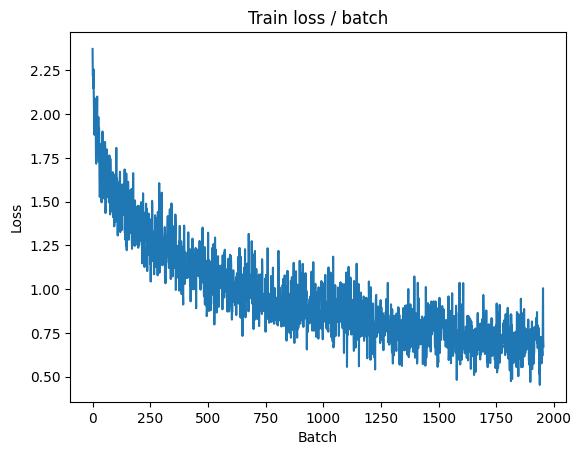

[TRAIN Batch 200/391]	Time 0.016s (0.051s)	Loss 0.6589 (0.6584)	Prec@1  75.0 ( 77.0)	Prec@5 100.0 ( 98.6)


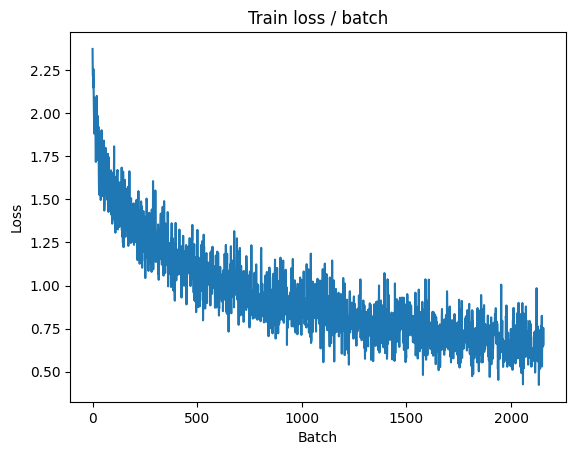


===============> Total time 19s	Avg loss 0.6546	Avg Prec@1 77.18 %	Avg Prec@5 98.59 %

[EVAL Batch 000/079]	Time 0.151s (0.151s)	Loss 0.5020 (0.5020)	Prec@1  84.4 ( 84.4)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.6071	Avg Prec@1 79.31 %	Avg Prec@5 98.79 %



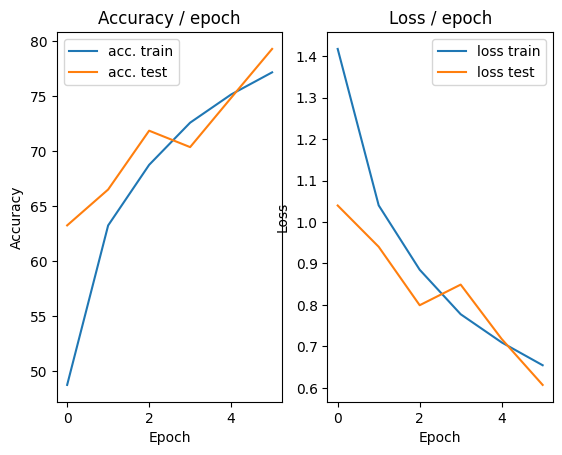

=== EPOCH 7 =====

[TRAIN Batch 000/391]	Time 0.219s (0.219s)	Loss 0.6284 (0.6284)	Prec@1  76.6 ( 76.6)	Prec@5  99.2 ( 99.2)


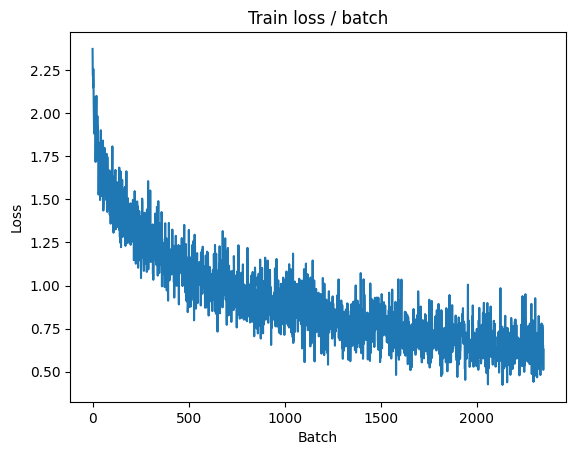

[TRAIN Batch 200/391]	Time 0.011s (0.051s)	Loss 0.5940 (0.6043)	Prec@1  75.8 ( 79.0)	Prec@5 100.0 ( 98.9)


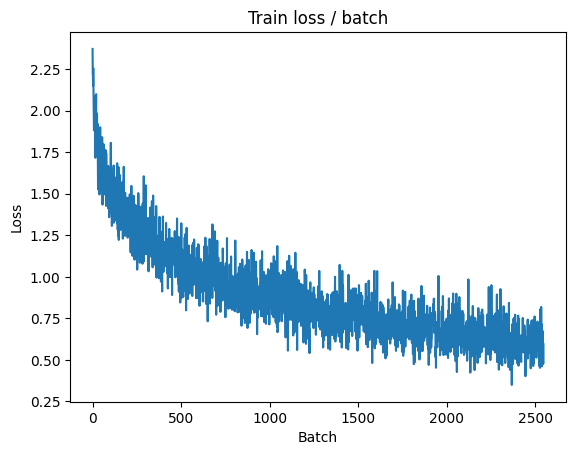


===============> Total time 19s	Avg loss 0.6061	Avg Prec@1 78.93 %	Avg Prec@5 98.88 %

[EVAL Batch 000/079]	Time 0.171s (0.171s)	Loss 0.5376 (0.5376)	Prec@1  85.2 ( 85.2)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.6415	Avg Prec@1 78.26 %	Avg Prec@5 98.64 %



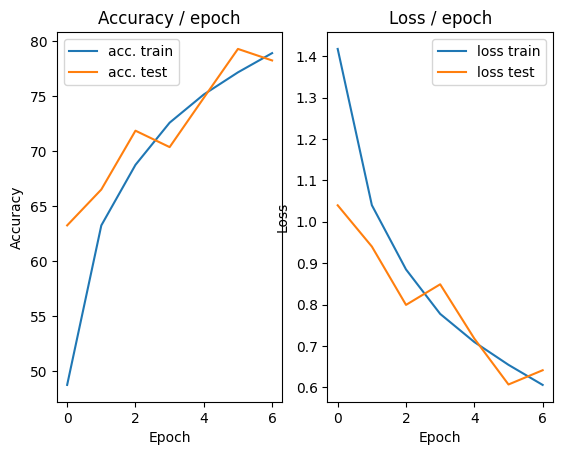

=== EPOCH 8 =====

[TRAIN Batch 000/391]	Time 0.229s (0.229s)	Loss 0.4807 (0.4807)	Prec@1  82.0 ( 82.0)	Prec@5 100.0 (100.0)


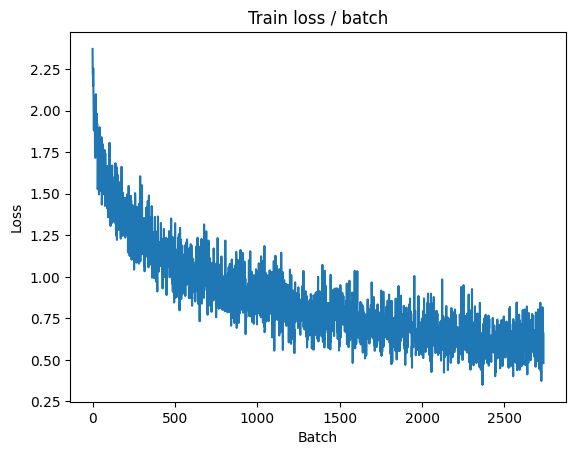

[TRAIN Batch 200/391]	Time 0.051s (0.052s)	Loss 0.4711 (0.5673)	Prec@1  85.2 ( 80.2)	Prec@5  99.2 ( 98.9)


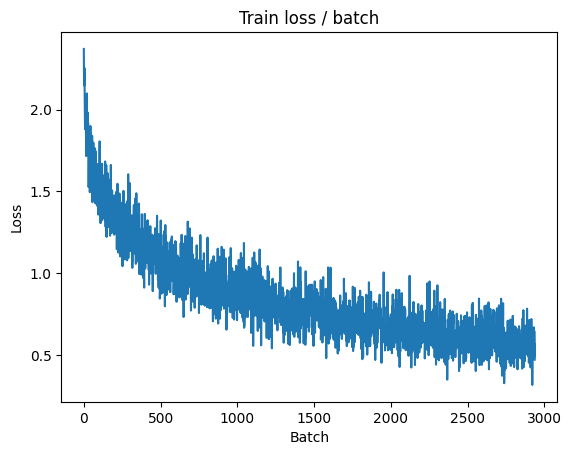


===============> Total time 18s	Avg loss 0.5710	Avg Prec@1 80.14 %	Avg Prec@5 98.94 %

[EVAL Batch 000/079]	Time 0.158s (0.158s)	Loss 0.4559 (0.4559)	Prec@1  84.4 ( 84.4)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.5713	Avg Prec@1 79.71 %	Avg Prec@5 98.93 %



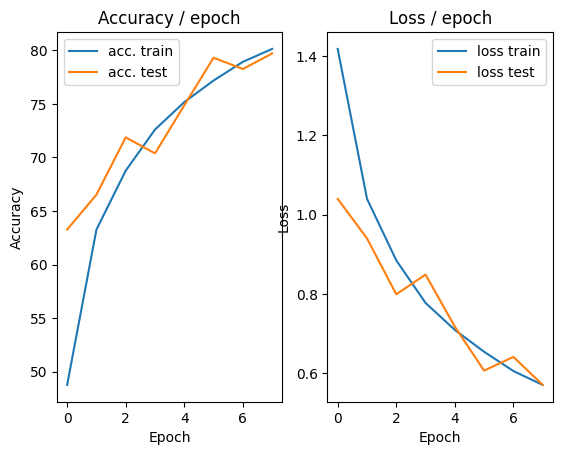

=== EPOCH 9 =====

[TRAIN Batch 000/391]	Time 0.209s (0.209s)	Loss 0.5654 (0.5654)	Prec@1  78.9 ( 78.9)	Prec@5 100.0 (100.0)


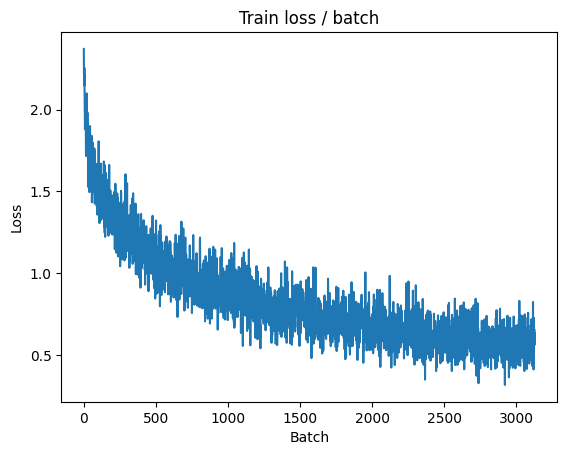

[TRAIN Batch 200/391]	Time 0.018s (0.045s)	Loss 0.6282 (0.5323)	Prec@1  78.9 ( 81.1)	Prec@5  99.2 ( 99.2)


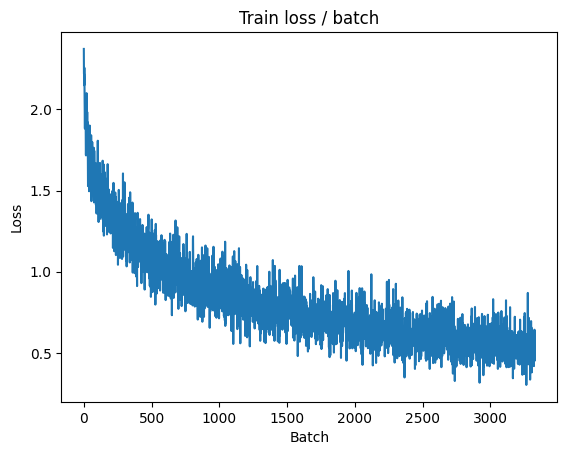


===============> Total time 18s	Avg loss 0.5301	Avg Prec@1 81.26 %	Avg Prec@5 99.18 %

[EVAL Batch 000/079]	Time 0.163s (0.163s)	Loss 0.4888 (0.4888)	Prec@1  82.8 ( 82.8)	Prec@5 100.0 (100.0)

===============> Total time 2s	Avg loss 0.5978	Avg Prec@1 79.18 %	Avg Prec@5 98.85 %



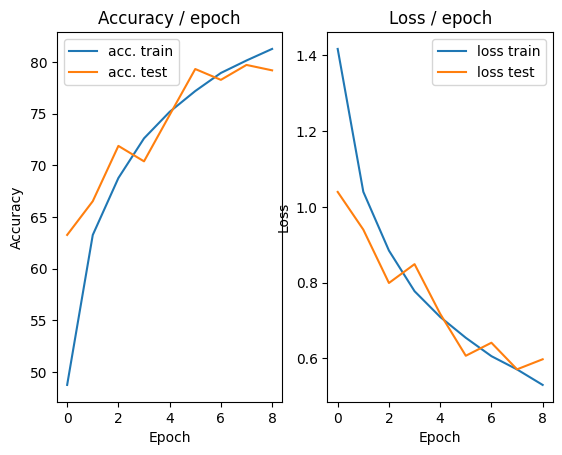

=== EPOCH 10 =====

[TRAIN Batch 000/391]	Time 0.223s (0.223s)	Loss 0.5909 (0.5909)	Prec@1  78.1 ( 78.1)	Prec@5  99.2 ( 99.2)


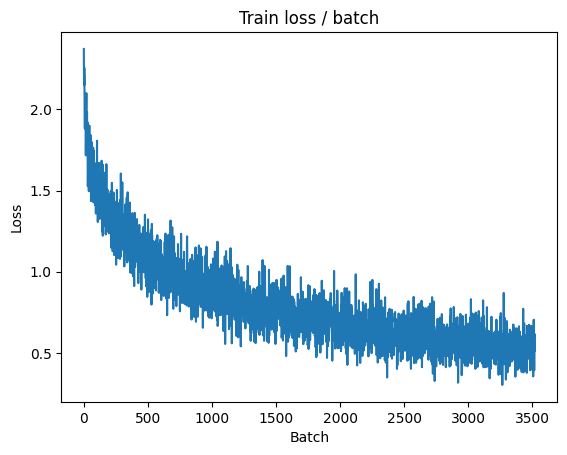

[TRAIN Batch 200/391]	Time 0.038s (0.051s)	Loss 0.5588 (0.5028)	Prec@1  82.0 ( 82.4)	Prec@5  98.4 ( 99.2)


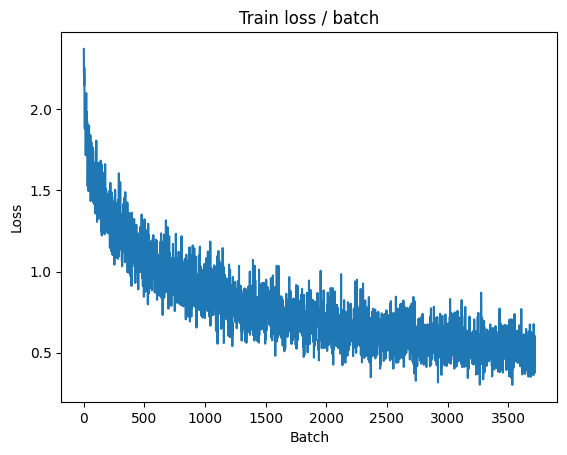


===============> Total time 19s	Avg loss 0.5003	Avg Prec@1 82.53 %	Avg Prec@5 99.21 %

[EVAL Batch 000/079]	Time 0.184s (0.184s)	Loss 0.4592 (0.4592)	Prec@1  86.7 ( 86.7)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5661	Avg Prec@1 80.71 %	Avg Prec@5 99.05 %



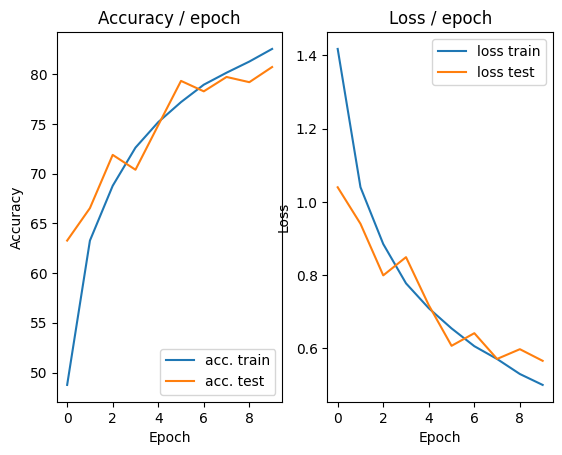

=== EPOCH 11 =====

[TRAIN Batch 000/391]	Time 0.211s (0.211s)	Loss 0.5791 (0.5791)	Prec@1  78.9 ( 78.9)	Prec@5  97.7 ( 97.7)


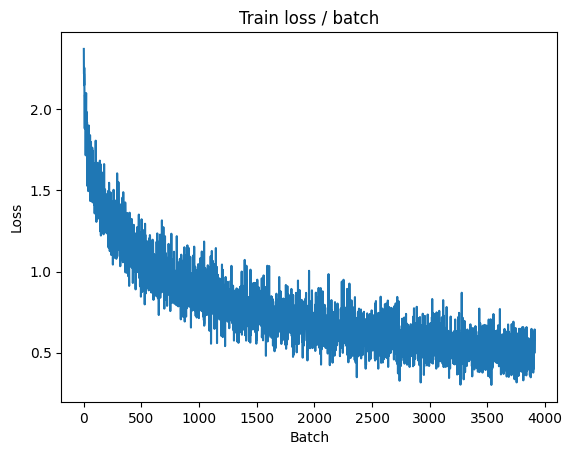

[TRAIN Batch 200/391]	Time 0.067s (0.052s)	Loss 0.4063 (0.4800)	Prec@1  82.0 ( 83.2)	Prec@5 100.0 ( 99.3)


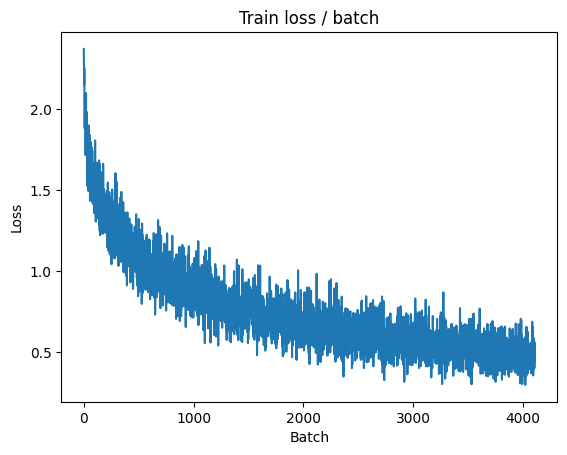


===============> Total time 20s	Avg loss 0.4803	Avg Prec@1 83.19 %	Avg Prec@5 99.29 %

[EVAL Batch 000/079]	Time 0.279s (0.279s)	Loss 0.4296 (0.4296)	Prec@1  86.7 ( 86.7)	Prec@5  99.2 ( 99.2)

===============> Total time 3s	Avg loss 0.5442	Avg Prec@1 81.55 %	Avg Prec@5 99.02 %



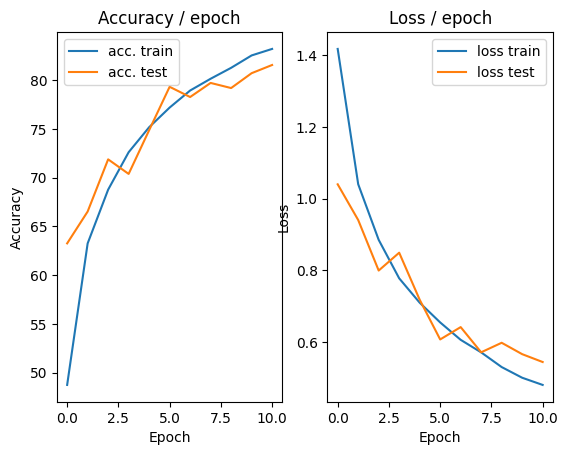

=== EPOCH 12 =====

[TRAIN Batch 000/391]	Time 0.220s (0.220s)	Loss 0.4537 (0.4537)	Prec@1  84.4 ( 84.4)	Prec@5 100.0 (100.0)


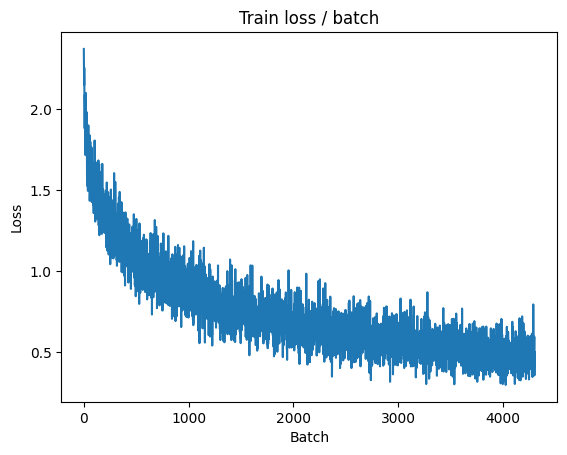

[TRAIN Batch 200/391]	Time 0.024s (0.052s)	Loss 0.3675 (0.4487)	Prec@1  86.7 ( 84.5)	Prec@5 100.0 ( 99.3)


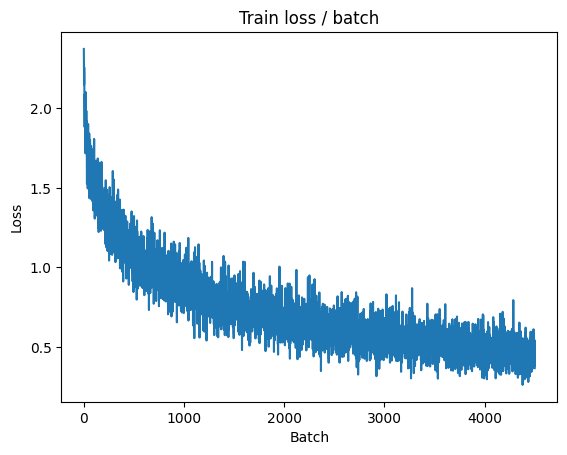


===============> Total time 18s	Avg loss 0.4512	Avg Prec@1 84.29 %	Avg Prec@5 99.34 %

[EVAL Batch 000/079]	Time 0.164s (0.164s)	Loss 0.4392 (0.4392)	Prec@1  85.2 ( 85.2)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.5186	Avg Prec@1 82.38 %	Avg Prec@5 99.09 %



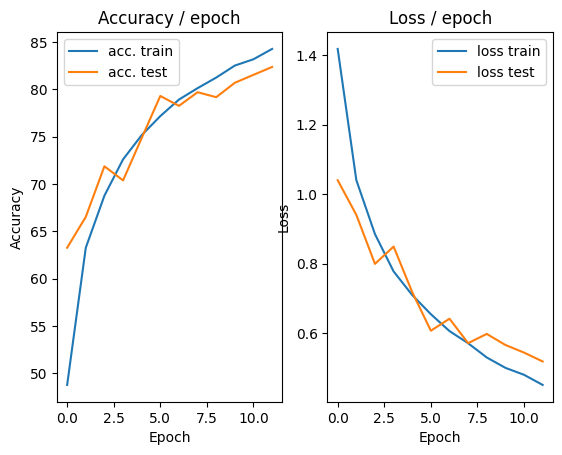

=== EPOCH 13 =====

[TRAIN Batch 000/391]	Time 0.271s (0.271s)	Loss 0.4100 (0.4100)	Prec@1  85.9 ( 85.9)	Prec@5 100.0 (100.0)


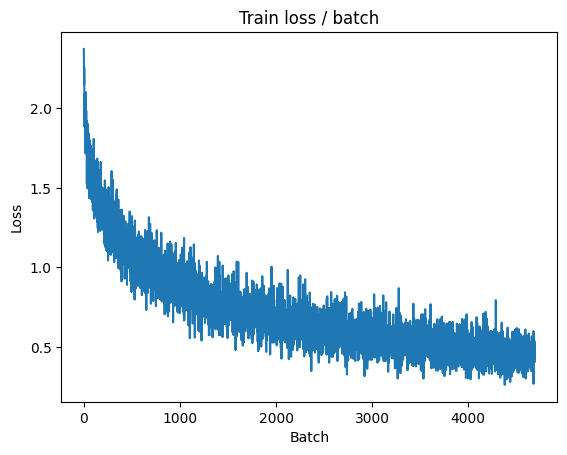

[TRAIN Batch 200/391]	Time 0.063s (0.046s)	Loss 0.4999 (0.4373)	Prec@1  78.1 ( 84.7)	Prec@5 100.0 ( 99.4)


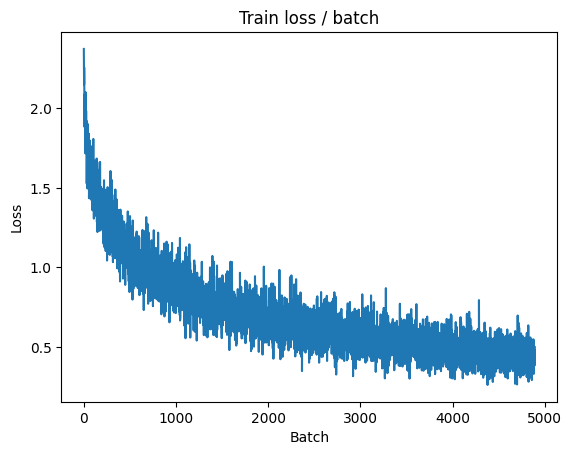


===============> Total time 18s	Avg loss 0.4330	Avg Prec@1 84.93 %	Avg Prec@5 99.42 %

[EVAL Batch 000/079]	Time 0.166s (0.166s)	Loss 0.4360 (0.4360)	Prec@1  86.7 ( 86.7)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.5288	Avg Prec@1 82.33 %	Avg Prec@5 99.05 %



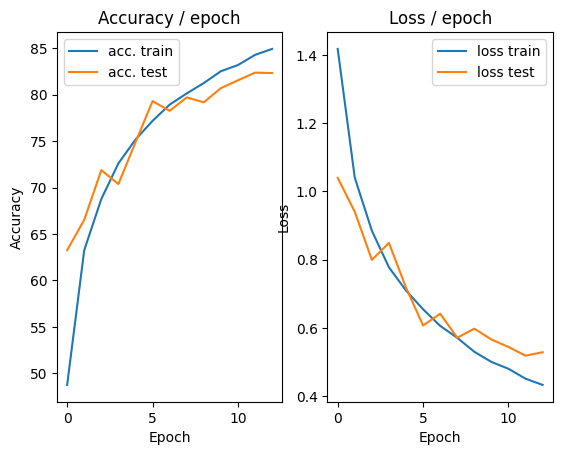

=== EPOCH 14 =====

[TRAIN Batch 000/391]	Time 0.241s (0.241s)	Loss 0.4293 (0.4293)	Prec@1  85.9 ( 85.9)	Prec@5 100.0 (100.0)


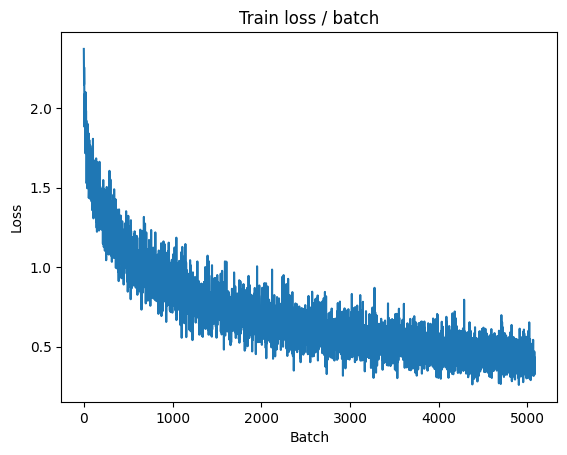

[TRAIN Batch 200/391]	Time 0.071s (0.052s)	Loss 0.5673 (0.4006)	Prec@1  82.8 ( 86.3)	Prec@5  98.4 ( 99.5)


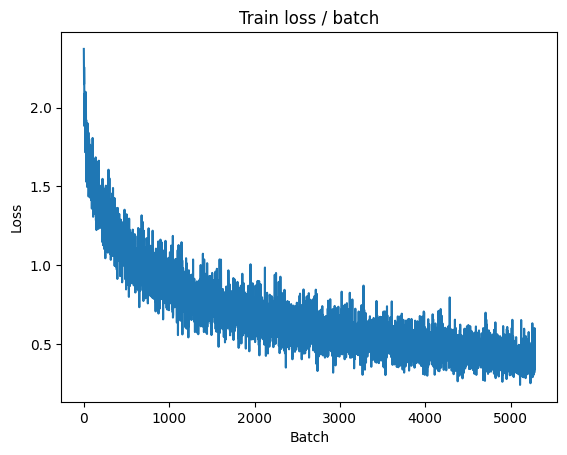


===============> Total time 20s	Avg loss 0.4062	Avg Prec@1 86.09 %	Avg Prec@5 99.47 %

[EVAL Batch 000/079]	Time 0.170s (0.170s)	Loss 0.3967 (0.3967)	Prec@1  87.5 ( 87.5)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5095	Avg Prec@1 82.66 %	Avg Prec@5 99.15 %



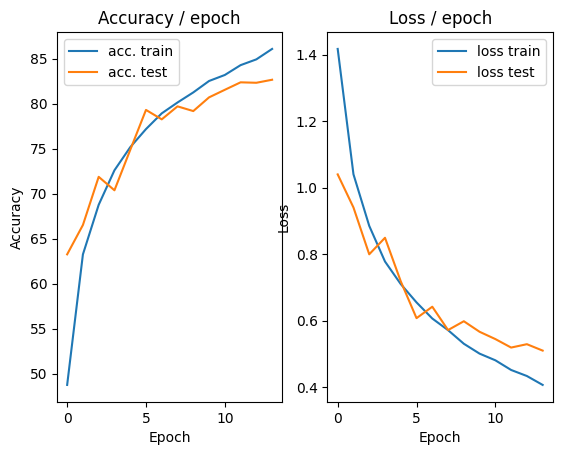

=== EPOCH 15 =====

[TRAIN Batch 000/391]	Time 0.210s (0.210s)	Loss 0.3798 (0.3798)	Prec@1  89.1 ( 89.1)	Prec@5 100.0 (100.0)


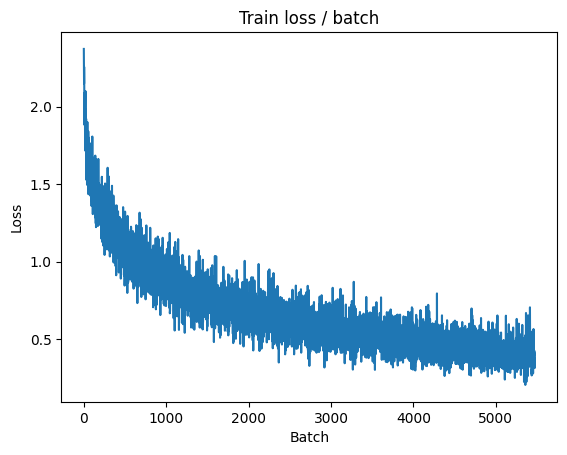

[TRAIN Batch 200/391]	Time 0.076s (0.050s)	Loss 0.3035 (0.3839)	Prec@1  89.1 ( 86.8)	Prec@5  99.2 ( 99.6)


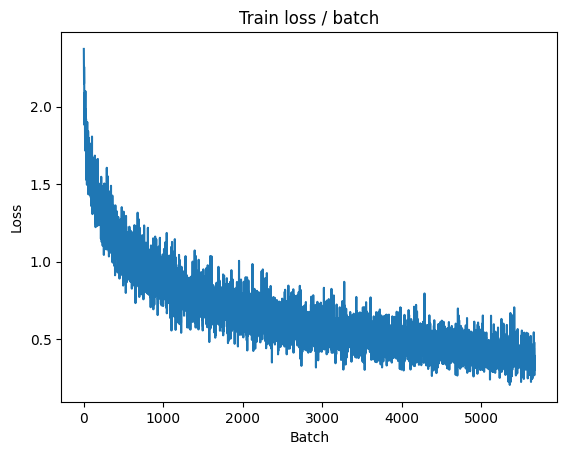


===============> Total time 18s	Avg loss 0.3920	Avg Prec@1 86.51 %	Avg Prec@5 99.54 %

[EVAL Batch 000/079]	Time 0.173s (0.173s)	Loss 0.4141 (0.4141)	Prec@1  85.2 ( 85.2)	Prec@5  99.2 ( 99.2)

===============> Total time 3s	Avg loss 0.4974	Avg Prec@1 82.97 %	Avg Prec@5 99.22 %



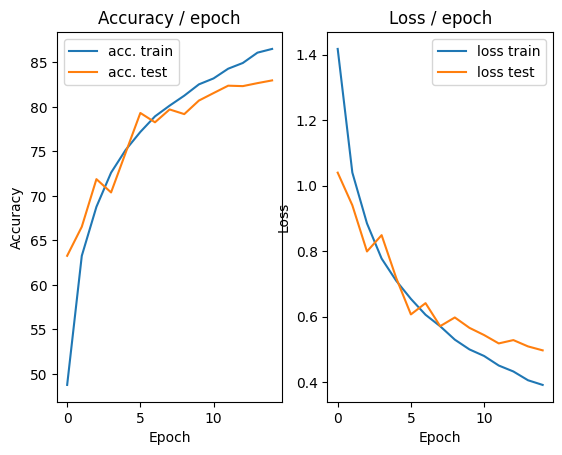

In [ ]:
main(128, 0.1, cuda=True)

### description of the experimental results

In this experiment, batch normalization led to faster convergence and improved accuracy, reaching 82.97\%, a notable increase over previous cases. The addition of batch normalization stabilized the training process, allowing the model to generalize more effectively. This regularization effect helped reduce overfitting, as seen in the model’s improved performance on unseen data.